# Final Project | Brazilian E-Commerce Public Dataset by Olist on Kaggle

This is a Brazilian ecommerce public dataset of orders made at Olist Store. The dataset has information of 100k orders from 2016 to 2018 made at multiple marketplaces in Brazil. Its features allows viewing an order from multiple dimensions: from order status, price, payment and freight performance to customer location, product attributes and finally reviews written by customers. A geolocation dataset that relates Brazilian zip codes to lat/lng coordinates is also added.

This is real commercial data, it has been anonymised, and references to the companies and partners in the review text have been replaced with the names of Game of Thrones great houses.

This dataset was generously provided by Olist, the largest department store in Brazilian marketplaces. Olist connects small businesses from all over Brazil to channels without hassle and with a single contract. Those merchants are able to sell their products through the Olist Store and ship them directly to the customers using Olist logistics partners. See more on our website: www.olist.com

After a customer purchases the product from Olist Store a seller gets notified to fulfill that order. Once the customer receives the product, or the estimated delivery date is due, the customer gets a satisfaction survey by email where he can give a note for the purchase experience and write down some comments.

**Attention:**

1- An order might have multiple items.

2- Each item might be fulfilled by a distinct seller.

3- All text identifying stores and partners where replaced by the names of Game of Thrones great houses.

---

##A- Data Schema:

The data is divided in multiple datasets for better understanding and organization. Please refer to the following data schema:

![](files/tables/HRhd2Y0.png)

**1- olist_customers_dataset.csv** - Customers Dataset

This dataset has information about the customer and its location. Use it to identify unique customers in the orders dataset and to find the orders delivery location.

At our system each order is assigned to a unique customerid. This means that the same customer will get different ids for different orders. The purpose of having a customerunique_id on the dataset is to allow you to identify customers that made repurchases at the store. Otherwise you would find that each order had a different customer associated with.


**2- olist_geolocation_dataset.csv** - Geolocation Dataset

This dataset has information about Brazilian zip codes and its lat/lng coordinates. Use it to plot maps and find distances between sellers and customers.


**3- olist_order_items_dataset.csv** - Order Items Dataset

This dataset includes data about the items purchased within each order.

Example:
The order_id = 00143d0f86d6fbd9f9b38ab440ac16f5 has 3 items (same product). Each item has the freight calculated accordingly to its measures and weight. To get the total freight value for each order you just have to sum.

The total order_item value is: 21.33 * 3 = 63.99

The total freight value is: 15.10 * 3 = 45.30

The total order value (product + freight) is: 45.30 + 63.99 = 109.29

**4- olist_order_payments_dataset.csv** - Payments Dataset

This dataset includes data about the orders payment options.

**5- olist_order_reviews_dataset.csv** - Order Reviews Dataset

This dataset includes data about the reviews made by the customers.

After a customer purchases the product from Olist Store a seller gets notified to fulfill that order. Once the customer receives the product, or the estimated delivery date is due, the customer gets a satisfaction survey by email where he can give a note for the purchase experience and write down some comments.

**6- olist_orders_dataset.csv** - Order Dataset

This is the core dataset. From each order you might find all other information.

**7- olist_products_dataset.csv** Products Dataset

This dataset includes data about the products sold by Olist.

**8- olist_sellers_dataset.csv** - Sellers Dataset

This dataset includes data about the sellers that fulfilled orders made at Olist. Use it to find the seller location and to identify which seller fulfilled each product.

**9- product_category_name_translation.csv** - Category Name Translation

This dataset translates the productcategoryname to english


---

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#Setup Environment

In [2]:
!apt-get update
!apt-get install openjdk-8-jdk-headless -qq > /dev/null

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ InRelease
Ign:2 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu2004/x86_64  InRelease
Hit:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease
Hit:4 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu2004/x86_64  Release
Hit:5 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal InRelease
Get:6 http://security.ubuntu.com/ubuntu focal-security InRelease [114 kB]
Hit:7 http://archive.ubuntu.com/ubuntu focal InRelease
Get:8 http://archive.ubuntu.com/ubuntu focal-updates InRelease [114 kB]
Get:9 http://archive.ubuntu.com/ubuntu focal-backports InRelease [108 kB]
Hit:10 http://ppa.launchpad.net/cran/libgit2/ubuntu focal InRelease
Hit:11 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu focal InRelease
Hit:12 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu focal InRelease
Hit:13 http://ppa.launchpad.net/ubuntugis/ppa/ubuntu focal InRe

In [3]:
!ls /usr/lib/jvm/

default-java		   java-11-openjdk-amd64     java-8-openjdk-amd64
java-1.11.0-openjdk-amd64  java-1.8.0-openjdk-amd64


In [4]:
!wget -q https://downloads.apache.org/spark/spark-3.2.3/spark-3.2.3-bin-hadoop2.7.tgz    
!tar -xvzf spark-3.2.3-bin-hadoop2.7.tgz


spark-3.2.3-bin-hadoop2.7/
spark-3.2.3-bin-hadoop2.7/LICENSE
spark-3.2.3-bin-hadoop2.7/NOTICE
spark-3.2.3-bin-hadoop2.7/R/
spark-3.2.3-bin-hadoop2.7/R/lib/
spark-3.2.3-bin-hadoop2.7/R/lib/SparkR/
spark-3.2.3-bin-hadoop2.7/R/lib/SparkR/DESCRIPTION
spark-3.2.3-bin-hadoop2.7/R/lib/SparkR/INDEX
spark-3.2.3-bin-hadoop2.7/R/lib/SparkR/Meta/
spark-3.2.3-bin-hadoop2.7/R/lib/SparkR/Meta/Rd.rds
spark-3.2.3-bin-hadoop2.7/R/lib/SparkR/Meta/features.rds
spark-3.2.3-bin-hadoop2.7/R/lib/SparkR/Meta/hsearch.rds
spark-3.2.3-bin-hadoop2.7/R/lib/SparkR/Meta/links.rds
spark-3.2.3-bin-hadoop2.7/R/lib/SparkR/Meta/nsInfo.rds
spark-3.2.3-bin-hadoop2.7/R/lib/SparkR/Meta/package.rds
spark-3.2.3-bin-hadoop2.7/R/lib/SparkR/NAMESPACE
spark-3.2.3-bin-hadoop2.7/R/lib/SparkR/R/
spark-3.2.3-bin-hadoop2.7/R/lib/SparkR/R/SparkR
spark-3.2.3-bin-hadoop2.7/R/lib/SparkR/R/SparkR.rdb
spark-3.2.3-bin-hadoop2.7/R/lib/SparkR/R/SparkR.rdx
spark-3.2.3-bin-hadoop2.7/R/lib/SparkR/help/
spark-3.2.3-bin-hadoop2.7/R/lib/SparkR/help/An

In [5]:
!pip install -q findspark
!pip install pyspark


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [6]:
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
os.environ["SPARK_HOME"] = "/content/spark-3.2.3-bin-hadoop2.7"


In [7]:
import findspark
findspark.init() 

In [8]:
!pip install pyspark==3.2.3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


#Initializing Spark Session

In [9]:
from pyspark.sql import SparkSession
spark = SparkSession.builder.master("local").appName("Predicting Customer Satisfaction in Brazilian E-Commerce").getOrCreate()

#Importing Libraries

In [10]:
from pyspark.sql.functions import *
import pyspark.sql.functions as F
from pyspark.sql.types import *
from pyspark.sql.functions import sum,avg,max
from pyspark.sql.window import Window
from pyspark.sql.functions import row_number
from pyspark.sql.functions import col,avg,sum,min,max,row_number 
import pandas as pd
from math import radians, cos, sin, asin, sqrt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
matplotlib.rc_file_defaults()
from scipy import stats
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

#1. Preprocessing

###1.1 Data Loading

1.1.1- Loading Order_Items Dataset and Products Dataset into spark data frames:

In [11]:
order_items_df = spark.read\
                .option('header','true')\
                .csv("/content/olist_order_items_dataset.csv",inferSchema=True) 
products_df = spark.read\
                .option('header','true')\
                .csv("/content/olist_products_dataset.csv",inferSchema=True)

In [12]:
order_items_df.printSchema()

root
 |-- order_id: string (nullable = true)
 |-- order_item_id: integer (nullable = true)
 |-- product_id: string (nullable = true)
 |-- seller_id: string (nullable = true)
 |-- shipping_limit_date: string (nullable = true)
 |-- price: double (nullable = true)
 |-- freight_value: double (nullable = true)



In [13]:
products_df.printSchema()

root
 |-- product_id: string (nullable = true)
 |-- product_category_name: string (nullable = true)
 |-- product_name_lenght: integer (nullable = true)
 |-- product_description_lenght: integer (nullable = true)
 |-- product_photos_qty: integer (nullable = true)
 |-- product_weight_g: integer (nullable = true)
 |-- product_length_cm: integer (nullable = true)
 |-- product_height_cm: integer (nullable = true)
 |-- product_width_cm: integer (nullable = true)



In [14]:
print(str(products_df.count()) + " " + "Products in the dataset")
print(str(order_items_df.count()) + " " + "Purchased Items")

32951 Products in the dataset
112650 Purchased Items


In [15]:
for col_name in order_items_df.columns:
  print("The count of null rows in column %s" %col_name,
  order_items_df.where(col(col_name).isNull()).count())

The count of null rows in column order_id 0
The count of null rows in column order_item_id 0
The count of null rows in column product_id 0
The count of null rows in column seller_id 0
The count of null rows in column shipping_limit_date 0
The count of null rows in column price 0
The count of null rows in column freight_value 0


In [16]:
for col_name in products_df.columns:
  print("The count of null rows in column %s" %col_name,
  products_df.where(col(col_name).isNull()).count())

The count of null rows in column product_id 0
The count of null rows in column product_category_name 610
The count of null rows in column product_name_lenght 610
The count of null rows in column product_description_lenght 610
The count of null rows in column product_photos_qty 610
The count of null rows in column product_weight_g 2
The count of null rows in column product_length_cm 2
The count of null rows in column product_height_cm 2
The count of null rows in column product_width_cm 2


> _Merging order_items and products datasets by product_id._

In [17]:
products_renamed = products_df.withColumnRenamed("product_id","p_id")
products_renamed.printSchema()

root
 |-- p_id: string (nullable = true)
 |-- product_category_name: string (nullable = true)
 |-- product_name_lenght: integer (nullable = true)
 |-- product_description_lenght: integer (nullable = true)
 |-- product_photos_qty: integer (nullable = true)
 |-- product_weight_g: integer (nullable = true)
 |-- product_length_cm: integer (nullable = true)
 |-- product_height_cm: integer (nullable = true)
 |-- product_width_cm: integer (nullable = true)



In [18]:
order_items_products_df = order_items_df.join(products_renamed, order_items_df.product_id == products_renamed.p_id)\
                             .drop("p_id")

In [19]:
order_items_products_df.printSchema()

root
 |-- order_id: string (nullable = true)
 |-- order_item_id: integer (nullable = true)
 |-- product_id: string (nullable = true)
 |-- seller_id: string (nullable = true)
 |-- shipping_limit_date: string (nullable = true)
 |-- price: double (nullable = true)
 |-- freight_value: double (nullable = true)
 |-- product_category_name: string (nullable = true)
 |-- product_name_lenght: integer (nullable = true)
 |-- product_description_lenght: integer (nullable = true)
 |-- product_photos_qty: integer (nullable = true)
 |-- product_weight_g: integer (nullable = true)
 |-- product_length_cm: integer (nullable = true)
 |-- product_height_cm: integer (nullable = true)
 |-- product_width_cm: integer (nullable = true)



In [20]:
order_items_products_df.count()

112650

In [21]:
for col_name in order_items_products_df.columns:
  print("The count of null rows in column %s" %col_name,
  order_items_products_df.where(col(col_name).isNull()).count())

The count of null rows in column order_id 0
The count of null rows in column order_item_id 0
The count of null rows in column product_id 0
The count of null rows in column seller_id 0
The count of null rows in column shipping_limit_date 0
The count of null rows in column price 0
The count of null rows in column freight_value 0
The count of null rows in column product_category_name 1603
The count of null rows in column product_name_lenght 1603
The count of null rows in column product_description_lenght 1603
The count of null rows in column product_photos_qty 1603
The count of null rows in column product_weight_g 18
The count of null rows in column product_length_cm 18
The count of null rows in column product_height_cm 18
The count of null rows in column product_width_cm 18


1.1.2- Loading Customers Dataset, Sellers Dataset and Geolocation Dataset into spark data frames:

In [22]:
customers_df = spark.read\
                .option('header','true')\
                .csv("/content/olist_customers_dataset.csv",inferSchema=True)
sellers_df = spark.read\
                .option('header','true')\
                .csv("/content/olist_sellers_dataset.csv",inferSchema=True)
geolocation_df = spark.read\
                .option('header','true')\
                .csv("/content/olist_geolocation_dataset.csv",inferSchema=True)

In [23]:
print(customers_df.count())
print(customers_df.dropDuplicates().count())
print(sellers_df.count())
print(sellers_df.dropDuplicates().count())
print("-----------")
print(geolocation_df.count())
print(geolocation_df.dropDuplicates().count())

99441
99441
3095
3095
-----------
1000163
738332


In [24]:
customers_pd= customers_df.toPandas()
print(str(customers_pd.customer_unique_id.nunique())+ " " + "Customers in the dataset")
print(str(sellers_df.count()) + " " + "Sellers in the dataset")

96096 Customers in the dataset
3095 Sellers in the dataset


In [25]:
customers_df.printSchema()
sellers_df.printSchema()
geolocation_df.printSchema()

root
 |-- customer_id: string (nullable = true)
 |-- customer_unique_id: string (nullable = true)
 |-- customer_zip_code_prefix: integer (nullable = true)
 |-- customer_city: string (nullable = true)
 |-- customer_state: string (nullable = true)

root
 |-- seller_id: string (nullable = true)
 |-- seller_zip_code_prefix: integer (nullable = true)
 |-- seller_city: string (nullable = true)
 |-- seller_state: string (nullable = true)

root
 |-- geolocation_zip_code_prefix: integer (nullable = true)
 |-- geolocation_lat: double (nullable = true)
 |-- geolocation_lng: double (nullable = true)
 |-- geolocation_city: string (nullable = true)
 |-- geolocation_state: string (nullable = true)



In [26]:
for col_name in customers_df.columns:
  print("The count of null rows in column %s" %col_name,
  customers_df.where(col(col_name).isNull()).count())

The count of null rows in column customer_id 0
The count of null rows in column customer_unique_id 0
The count of null rows in column customer_zip_code_prefix 0
The count of null rows in column customer_city 0
The count of null rows in column customer_state 0


In [27]:
for col_name in sellers_df.columns:
  print("The count of null rows in column %s" %col_name,
  sellers_df.where(col(col_name).isNull()).count())

The count of null rows in column seller_id 0
The count of null rows in column seller_zip_code_prefix 0
The count of null rows in column seller_city 0
The count of null rows in column seller_state 0


In [28]:
for col_name in geolocation_df.columns:
  print("The count of null rows in column %s" %col_name,
  geolocation_df.where(col(col_name).isNull()).count())

The count of null rows in column geolocation_zip_code_prefix 0
The count of null rows in column geolocation_lat 0
The count of null rows in column geolocation_lng 0
The count of null rows in column geolocation_city 0
The count of null rows in column geolocation_state 0


> _Merging customers dataset with geolocation dataset by geolocation_zip_code_prefix_

In [29]:
geo_grouped = geolocation_df.groupBy("geolocation_zip_code_prefix", "geolocation_city").count()
geo_grouped.show()

+---------------------------+----------------+-----+
|geolocation_zip_code_prefix|geolocation_city|count|
+---------------------------+----------------+-----+
|                       1023|       são paulo|    5|
|                       1208|       são paulo|    8|
|                       1324|       são paulo|   15|
|                       1450|       são paulo|    6|
|                       2169|       sao paulo|   36|
|                       2213|       são paulo|    1|
|                       2475|       são paulo|    9|
|                       2403|       são paulo|    9|
|                       2680|       são paulo|    2|
|                       2801|       sao paulo|   56|
|                       2804|       sao paulo|   62|
|                       2924|       sao paulo|    5|
|                       2971|       sao paulo|   19|
|                       3047|       são paulo|    4|
|                       3169|       são paulo|    8|
|                       3141|       sao paulo|

In [30]:
geolocation_df.filter(col('geolocation_zip_code_prefix')== '5337').show()

+---------------------------+-------------------+-------------------+----------------+-----------------+
|geolocation_zip_code_prefix|    geolocation_lat|    geolocation_lng|geolocation_city|geolocation_state|
+---------------------------+-------------------+-------------------+----------------+-----------------+
|                       5337|-23.551740765191322|-46.749905706907505|       sao paulo|               SP|
|                       5337|-23.551740765191322|-46.749905706907505|       sao paulo|               SP|
|                       5337|-23.553278487362284|-46.748462688325844|       são paulo|               SP|
|                       5337|-23.551740765191322|-46.749905706907505|       sao paulo|               SP|
|                       5337|-23.550753290034056| -46.75078497169481|       sao paulo|               SP|
|                       5337|-23.553278487362284|-46.748462688325844|       sao paulo|               SP|
|                       5337|-23.551740765191322|-46.74

_geolocation_dataset has many duplicates_

In [31]:
geolocation_distinct_df=geolocation_df.dropDuplicates(["geolocation_zip_code_prefix"])
print(geolocation_df.count())

1000163


In [32]:
customers_geolocation_df = customers_df.join(geolocation_distinct_df, customers_df.customer_zip_code_prefix == geolocation_distinct_df.geolocation_zip_code_prefix, "left").drop("geolocation_zip_code_prefix", "geolocation_city", "geolocation_state")

In [33]:
for col_name in customers_geolocation_df.columns:
  print("The count of null rows in column %s" %col_name,
 customers_geolocation_df.where(col(col_name).isNull()).count())

The count of null rows in column customer_id 0
The count of null rows in column customer_unique_id 0
The count of null rows in column customer_zip_code_prefix 0
The count of null rows in column customer_city 0
The count of null rows in column customer_state 0
The count of null rows in column geolocation_lat 278
The count of null rows in column geolocation_lng 278


>_There are missing latitudes and longitudes in the customers dataset._

In [34]:
customers_renamed_df = customers_geolocation_df.withColumnRenamed("geolocation_lat","customer_geolocation_lat")\
                                                    .withColumnRenamed("geolocation_lng","customer_geolocation_long")\
                                                     .withColumnRenamed("customer_id","c_id")

In [35]:
customers_renamed_df.select("customer_zip_code_prefix","customer_city").where(customers_renamed_df.customer_geolocation_long.isNull()& customers_renamed_df.customer_geolocation_lat.isNull()).dropDuplicates(['customer_city']).show()

+------------------------+--------------------+
|customer_zip_code_prefix|       customer_city|
+------------------------+--------------------+
|                   65830|            sambaiba|
|                   28617|       nova friburgo|
|                   58286|  pitanga de estrada|
|                   76897|                jaru|
|                   67105|          ananindeua|
|                   35104|           sao vitor|
|                   28530|sao sebastiao do ...|
|                   28575|          jaguarembe|
|                   36857|           pinhotiba|
|                   38710|         major porto|
|                   58734|            passagem|
|                   95572|           mampituba|
|                   25919|                mage|
|                   49870|               itabi|
|                   72867|           novo gama|
|                   28120|            ibitioca|
|                   72821|            luziania|
|                   29718|    angelo fre

Filling nulls in longitude and latitude in customers dataframe:

In [36]:
customers_renamed_pd= customers_renamed_df.toPandas()

In [37]:
def customer_get_coordinates (df):
    from geopy.geocoders import Nominatim
    geolocator = Nominatim(user_agent="MyApp")
    for i in range (len(df)):
        if  (pd.isna(df['customer_geolocation_lat'][i])):
            location = geolocator.geocode(df.loc[i,'customer_city'])
            df.loc[i,'customer_geolocation_long'] = location.longitude
            df.loc[i, 'customer_geolocation_lat'] = location.latitude
    return df


In [38]:
customers_enriched_pd = customer_get_coordinates(customers_renamed_pd)

In [39]:
print(customers_enriched_pd.isnull().values.any())
customers_enriched_df = spark.createDataFrame(customers_enriched_pd)

False


In [40]:
customers_enriched_pd.isna().sum()

c_id                         0
customer_unique_id           0
customer_zip_code_prefix     0
customer_city                0
customer_state               0
customer_geolocation_lat     0
customer_geolocation_long    0
dtype: int64

In [41]:
for col_name in customers_enriched_df.columns:
  print("The count of null rows in column %s" %col_name,
 customers_enriched_df.where(col(col_name).isNull()).count())


The count of null rows in column c_id 0
The count of null rows in column customer_unique_id 0
The count of null rows in column customer_zip_code_prefix 0
The count of null rows in column customer_city 0
The count of null rows in column customer_state 0
The count of null rows in column customer_geolocation_lat 0
The count of null rows in column customer_geolocation_long 0


In [42]:
customers_enriched_df.show()

+--------------------+--------------------+------------------------+--------------+--------------+------------------------+-------------------------+
|                c_id|  customer_unique_id|customer_zip_code_prefix| customer_city|customer_state|customer_geolocation_lat|customer_geolocation_long|
+--------------------+--------------------+------------------------+--------------+--------------+------------------------+-------------------------+
|8094bd1ea8a8453c1...|23f014663c70f3a8c...|                   20735|rio de janeiro|            RJ|     -22.898349137919237|       -43.28603771175494|
|aeca4ed7648c40308...|d6735445f2f7ba25a...|                   18051|      sorocaba|            SP|     -23.509523514570944|              -47.5156125|
|22a3b0e62211d8e0e...|3f9d987156fddc08e...|                   13840|    mogi-guacu|            SP|     -22.359648157307664|       -46.93603474635176|
|8abcddf97039e2caa...|eee056a1664b2f914...|                   12940|       atibaia|            SP|  

> _Merging sellers dataset with geolocation dataset by geolocation_zip_code_prefix_

In [43]:
sellers_df.printSchema()

root
 |-- seller_id: string (nullable = true)
 |-- seller_zip_code_prefix: integer (nullable = true)
 |-- seller_city: string (nullable = true)
 |-- seller_state: string (nullable = true)



In [44]:
for col_name in sellers_df.columns:
  print("The count of null rows in column %s" %col_name,
 sellers_df.where(col(col_name).isNull()).count())


The count of null rows in column seller_id 0
The count of null rows in column seller_zip_code_prefix 0
The count of null rows in column seller_city 0
The count of null rows in column seller_state 0


In [45]:
sellers_geolocation_df = sellers_df.join(geolocation_distinct_df, sellers_df.seller_zip_code_prefix == geolocation_distinct_df.geolocation_zip_code_prefix, "left").drop("geolocation_zip_code_prefix", "geolocation_city", "geolocation_state")

In [46]:
sellers_geolocation_df.printSchema()

root
 |-- seller_id: string (nullable = true)
 |-- seller_zip_code_prefix: integer (nullable = true)
 |-- seller_city: string (nullable = true)
 |-- seller_state: string (nullable = true)
 |-- geolocation_lat: double (nullable = true)
 |-- geolocation_lng: double (nullable = true)



In [47]:
sellers_renamed_df = sellers_geolocation_df.withColumnRenamed("geolocation_lat","seller_geolocation_lat")\
                                                    .withColumnRenamed("geolocation_lng","seller_geolocation_long")\
                                                     .withColumnRenamed("seller_id","s_id")

In [48]:
for col_name in sellers_renamed_df.columns:
  print("The count of null rows in column %s" %col_name,
 sellers_renamed_df.where(col(col_name).isNull()).count())

The count of null rows in column s_id 0
The count of null rows in column seller_zip_code_prefix 0
The count of null rows in column seller_city 0
The count of null rows in column seller_state 0
The count of null rows in column seller_geolocation_lat 7
The count of null rows in column seller_geolocation_long 7


In [49]:
sellers_missing_coordinates_df= sellers_renamed_df.select("seller_zip_code_prefix","seller_city").where(sellers_renamed_df.seller_geolocation_lat.isNull()& sellers_renamed_df.seller_geolocation_long.isNull()).dropDuplicates(['seller_city'])

In [50]:
sellers_missing_coordinates_pd= sellers_missing_coordinates_df.toPandas()

In [51]:
sellers_missing_coordinates_pd.head(7)

,seller_zip_code_prefix,seller_city
0,37708,pocos de caldas
1,7412,aruja
2,91901,porto alegre
3,72580,brasilia
4,82040,curitiba
5,2285,sao paulo


Filling nulls in longitude and latitude in sellers dataframe:

In [52]:
def seller_get_coordinates (df):
    from geopy.geocoders import Nominatim
    geolocator = Nominatim(user_agent="MyApp")
    for i in range (len(df)):
        location = geolocator.geocode(df.loc[i,'seller_city'])
        df.loc[i,'seller_geolocation_long'] = location.longitude
        df.loc[i, 'seller_geolocation_lat'] = location.latitude
    return df                    

In [53]:
sellers_get_coordinates_pd = seller_get_coordinates(sellers_missing_coordinates_pd)
print(sellers_get_coordinates_pd.head())

   seller_zip_code_prefix      seller_city  seller_geolocation_long  \
0                   37708  pocos de caldas               -46.564793   
1                    7412            aruja               -46.317545   
2                   91901     porto alegre               -51.230377   
3                   72580         brasilia               -53.200000   
4                   82040         curitiba               -49.271272   

   seller_geolocation_lat  
0              -21.790032  
1              -23.396266  
2              -30.032500  
3              -10.333333  
4              -25.429596  


In [54]:
sellers_enriched_lat_df = sellers_renamed_df.withColumn("seller_geolocation_lat", when(sellers_renamed_df.seller_city == "pocos de caldas", -21.7900318)\
                                        .when(sellers_renamed_df.seller_city == "aruja", -23.396266)
                                        .when(sellers_renamed_df.seller_city == "porto alegre", -30.0324999)
                                        .when(sellers_renamed_df.seller_city == "brasilia", -10.3333333)  
                                        .when(sellers_renamed_df.seller_city == "curitiba", -25.4295963)
                                       .when(sellers_renamed_df.seller_city == "sao paulo", -23.5506507)
                                       .otherwise(sellers_renamed_df.seller_geolocation_lat))     

In [55]:
sellers_enriched_long_lat_df = sellers_enriched_lat_df.withColumn("seller_geolocation_long",                   when(sellers_enriched_lat_df.seller_city == "pocos de caldas", -46.5647928)\
                                        .when(sellers_enriched_lat_df.seller_city == "aruja", -46.3175449)
                                        .when(sellers_enriched_lat_df.seller_city == "porto alegre", -51.2303767)
                                        .when(sellers_enriched_lat_df.seller_city == "brasilia", -53.2)  
                                        .when(sellers_enriched_lat_df.seller_city == "curitiba", -49.2712724)
                                       .when(sellers_enriched_lat_df.seller_city == "sao paulo", -46.6333824)                                                                 .otherwise(sellers_enriched_lat_df.seller_geolocation_long))  

In [56]:
for col_name in sellers_enriched_long_lat_df.columns:
  print("The count of null rows in column %s" %col_name,
 sellers_enriched_long_lat_df.where(col(col_name).isNull()).count())
sellers_enriched_df= sellers_enriched_long_lat_df

The count of null rows in column s_id 0
The count of null rows in column seller_zip_code_prefix 0
The count of null rows in column seller_city 0
The count of null rows in column seller_state 0
The count of null rows in column seller_geolocation_lat 0
The count of null rows in column seller_geolocation_long 0



> _Merging sellers dataset with our order_items_products dataset by seller_id_

In [57]:
items_sellers_enriched_df = order_items_products_df.join(sellers_enriched_df, order_items_products_df.seller_id == sellers_enriched_df.s_id).drop("s_id")

In [58]:
order_items_products_df.count()

112650

In [59]:
items_sellers_enriched_df.count()

112650

In [60]:
items_sellers_enriched_df.printSchema()

root
 |-- order_id: string (nullable = true)
 |-- order_item_id: integer (nullable = true)
 |-- product_id: string (nullable = true)
 |-- seller_id: string (nullable = true)
 |-- shipping_limit_date: string (nullable = true)
 |-- price: double (nullable = true)
 |-- freight_value: double (nullable = true)
 |-- product_category_name: string (nullable = true)
 |-- product_name_lenght: integer (nullable = true)
 |-- product_description_lenght: integer (nullable = true)
 |-- product_photos_qty: integer (nullable = true)
 |-- product_weight_g: integer (nullable = true)
 |-- product_length_cm: integer (nullable = true)
 |-- product_height_cm: integer (nullable = true)
 |-- product_width_cm: integer (nullable = true)
 |-- seller_zip_code_prefix: integer (nullable = true)
 |-- seller_city: string (nullable = true)
 |-- seller_state: string (nullable = true)
 |-- seller_geolocation_lat: double (nullable = true)
 |-- seller_geolocation_long: double (nullable = true)



1.1.3- Loading Orders Dataset, Reviews Dataset and Payment Datasets into spark data frames:

In [61]:
orders_df = spark.read\
                .option('header','true')\
                .csv("/content/olist_orders_dataset.csv",inferSchema=True)
payments_df = spark.read\
                .option('header','true')\
                .csv("/content/olist_order_payments_dataset.csv",inferSchema=True)
reviews_df = spark.read\
                .option('header','true')\
                .csv("/content/olist_order_reviews_dataset.csv",inferSchema=True)


In [62]:
orders_df.printSchema()
payments_df.printSchema()
reviews_df.printSchema()

root
 |-- order_id: string (nullable = true)
 |-- customer_id: string (nullable = true)
 |-- order_status: string (nullable = true)
 |-- order_purchase_timestamp: string (nullable = true)
 |-- order_approved_at: string (nullable = true)
 |-- order_delivered_carrier_date: string (nullable = true)
 |-- order_delivered_customer_date: string (nullable = true)
 |-- order_estimated_delivery_date: string (nullable = true)

root
 |-- order_id: string (nullable = true)
 |-- payment_sequential: integer (nullable = true)
 |-- payment_type: string (nullable = true)
 |-- payment_installments: integer (nullable = true)
 |-- payment_value: double (nullable = true)

root
 |-- review_id: string (nullable = true)
 |-- order_id: string (nullable = true)
 |-- review_score: string (nullable = true)
 |-- review_comment_title: string (nullable = true)
 |-- review_comment_message: string (nullable = true)
 |-- review_creation_date: string (nullable = true)
 |-- review_answer_timestamp: string (nullable = true

In [63]:
orders_df_count = orders_df.count()
payments_df_count = payments_df.count()
reviews_df_count = reviews_df.count()

print(orders_df_count, "Orders in the dataset")
print(payments_df_count, "Payments in the dataset")
print(reviews_df_count, "Reviews in the dataset")

99441 Orders in the dataset
103886 Payments in the dataset
104162 Reviews in the dataset


In [64]:
for col_name in orders_df.columns:
  print("The count of null rows in column %s" %col_name,
  orders_df.where(col(col_name).isNull()).count())

The count of null rows in column order_id 0
The count of null rows in column customer_id 0
The count of null rows in column order_status 0
The count of null rows in column order_purchase_timestamp 0
The count of null rows in column order_approved_at 160
The count of null rows in column order_delivered_carrier_date 1783
The count of null rows in column order_delivered_customer_date 2965
The count of null rows in column order_estimated_delivery_date 0


In [65]:
for col_name in payments_df.columns:
  print("The count of null rows in column %s" %col_name,
  payments_df.where(col(col_name).isNull()).count())

The count of null rows in column order_id 0
The count of null rows in column payment_sequential 0
The count of null rows in column payment_type 0
The count of null rows in column payment_installments 0
The count of null rows in column payment_value 0


In [66]:
for col_name in reviews_df.columns:
  print("The count of null rows in column %s" %col_name,
  reviews_df.where(col(col_name).isNull()).count())

The count of null rows in column review_id 1
The count of null rows in column order_id 2236
The count of null rows in column review_score 2380
The count of null rows in column review_comment_title 92157
The count of null rows in column review_comment_message 63079
The count of null rows in column review_creation_date 8764
The count of null rows in column review_answer_timestamp 8785


In [67]:
review_null = reviews_df.filter(col("review_score").isNull())

In [68]:
print(review_null.count())
review_null.show()

2380
+--------------------+--------------------+------------+--------------------+----------------------+--------------------+-----------------------+
|           review_id|            order_id|review_score|review_comment_title|review_comment_message|review_creation_date|review_answer_timestamp|
+--------------------+--------------------+------------+--------------------+----------------------+--------------------+-----------------------+
|,2018-02-16 00:00...|                null|        null|                null|                  null|                null|                   null|
|A entrega foi efe...|                null|        null|                null|                  null|                null|                   null|
|O produto já come...|                null|        null|                null|                  null|                null|                   null|
|    Estou satisfeita|                null|        null|                null|                  null|                nul

In [69]:
review_null.filter(col("review_comment_title").isNotNull()).show()

+--------------------+--------+------------+--------------------+----------------------+--------------------+-----------------------+
|           review_id|order_id|review_score|review_comment_title|review_comment_message|review_creation_date|review_answer_timestamp|
+--------------------+--------+------------+--------------------+----------------------+--------------------+-----------------------+
|Grato. Espero uma...|    null|        null|,2017-06-07 00:00...|                  null|                null|                   null|
+--------------------+--------+------------+--------------------+----------------------+--------------------+-----------------------+



In [70]:
print(orders_df.dropDuplicates().count())
print(payments_df.dropDuplicates().count())
print(reviews_df.dropDuplicates(["review_id","order_id"]).count())
print(reviews_df.dropDuplicates(["order_id"]).count())
print(reviews_df.dropDuplicates().count())

99441
103886
104071
99743
104077



1.1.3.1- Merging orders and customers datasets by customer_id:

In [71]:
orders_customers_df = orders_df.join(customers_enriched_df, orders_df.customer_id == customers_enriched_df.c_id).drop("c_id")

In [72]:
orders_customers_df=orders_customers_df.withColumnRenamed("order_id","o_id")
orders_customers_df.printSchema()

root
 |-- o_id: string (nullable = true)
 |-- customer_id: string (nullable = true)
 |-- order_status: string (nullable = true)
 |-- order_purchase_timestamp: string (nullable = true)
 |-- order_approved_at: string (nullable = true)
 |-- order_delivered_carrier_date: string (nullable = true)
 |-- order_delivered_customer_date: string (nullable = true)
 |-- order_estimated_delivery_date: string (nullable = true)
 |-- customer_unique_id: string (nullable = true)
 |-- customer_zip_code_prefix: long (nullable = true)
 |-- customer_city: string (nullable = true)
 |-- customer_state: string (nullable = true)
 |-- customer_geolocation_lat: double (nullable = true)
 |-- customer_geolocation_long: double (nullable = true)



1.1.3.2- Merging orders and payments datasets by order_id:

In [73]:
payments_df.filter(payments_df.order_id == "b80ba0f0c3d2a63feac0116f533cc6a9").show(truncate=False)

+--------------------------------+------------------+------------+--------------------+-------------+
|order_id                        |payment_sequential|payment_type|payment_installments|payment_value|
+--------------------------------+------------------+------------+--------------------+-------------+
|b80ba0f0c3d2a63feac0116f533cc6a9|3                 |voucher     |1                   |2.99         |
|b80ba0f0c3d2a63feac0116f533cc6a9|2                 |voucher     |1                   |19.0         |
|b80ba0f0c3d2a63feac0116f533cc6a9|1                 |credit_card |1                   |11.1         |
+--------------------------------+------------------+------------+--------------------+-------------+



In [74]:
orders_payments_merged = orders_df.join(payments_df, orders_df.order_id == payments_df.order_id)

In [75]:
orders_payments_pd = orders_payments_merged.toPandas()
orders_payments_pd['order_status'].unique()

array(['delivered', 'invoiced', 'shipped', 'processing', 'unavailable',
       'canceled', 'created', 'approved'], dtype=object)

In [76]:
pay_order_score = orders_payments_pd.groupby("order_status")["payment_type"].value_counts(normalize=True)
pay_order_score.unstack()

payment_type,boleto,credit_card,debit_card,not_defined,voucher
order_status,,,,,
approved,NaN,1.000000,NaN,NaN,NaN
canceled,0.143072,0.668675,0.010542,0.004518,0.173193
created,0.400000,0.600000,NaN,NaN,NaN
delivered,0.190470,0.740264,0.014749,NaN,0.054518
invoiced,0.206154,0.735385,0.018462,NaN,0.040000
processing,0.219436,0.702194,0.006270,NaN,0.072100
shipped,0.179245,0.729846,0.018868,NaN,0.072041
unavailable,0.231125,0.687211,0.009245,NaN,0.072419


Does payment method affect order status?

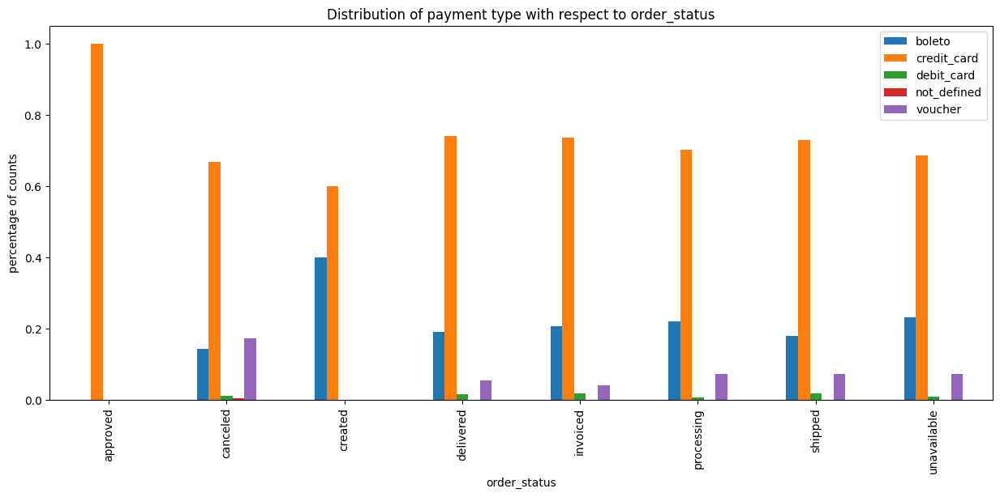

In [77]:
pay_order_score.unstack().plot.bar(figsize=(15,6)).legend(loc="best")
plt.ylabel("percentage of counts")
plt.title("Distribution of payment type with respect to order_status")
plt.show()

Credit card has the highest % in all order statuses

Voucher is 2nd most used payment type for cancelled orders.

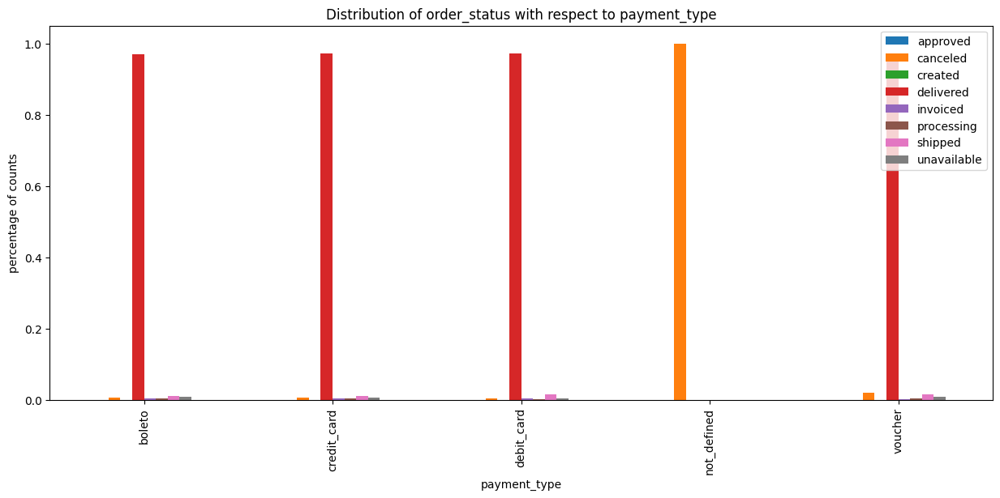

In [78]:
pay_order_score = orders_payments_pd.groupby("payment_type")["order_status"].value_counts(normalize=True)
pay_order_score.unstack()
pay_order_score.unstack().plot.bar(figsize=(15,6)).legend(loc="best")
plt.ylabel("percentage of counts")
plt.title("Distribution of order_status with respect to payment_type")
plt.show()

In [79]:
non_delivered_orders= orders_payments_pd.loc[orders_payments_pd['order_status']!='delivered']

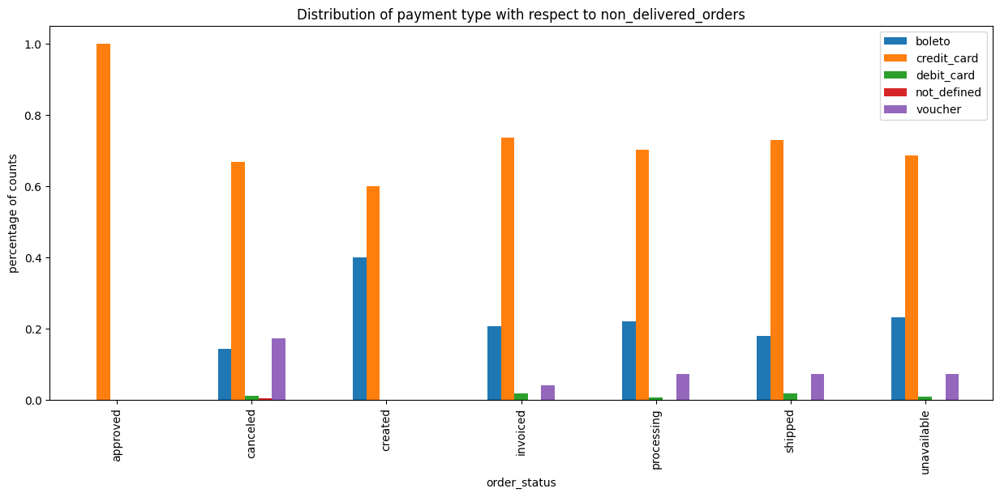

In [80]:
non_delivered_orders_score = non_delivered_orders.groupby("order_status")["payment_type"].value_counts(normalize=True)
non_delivered_orders_score.unstack().plot.bar(figsize=(15,6)).legend(loc="best")
plt.ylabel("percentage of counts")
plt.title("Distribution of payment type with respect to non_delivered_orders")
plt.show()


In [81]:
non_delivered_orders_score.unstack()

payment_type,boleto,credit_card,debit_card,not_defined,voucher
order_status,,,,,
approved,NaN,1.000000,NaN,NaN,NaN
canceled,0.143072,0.668675,0.010542,0.004518,0.173193
created,0.400000,0.600000,NaN,NaN,NaN
invoiced,0.206154,0.735385,0.018462,NaN,0.040000
processing,0.219436,0.702194,0.006270,NaN,0.072100
shipped,0.179245,0.729846,0.018868,NaN,0.072041
unavailable,0.231125,0.687211,0.009245,NaN,0.072419


In [82]:
Orders_Reviews_Payments = orders_df.join (reviews_df, orders_df.order_id == reviews_df.order_id)\
                                   .join (payments_df, orders_df.order_id == payments_df.order_id)
Orders_Reviews_Payments_pd = Orders_Reviews_Payments.toPandas()

Text(0.5, 1.0, 'Distribution of payment_type')

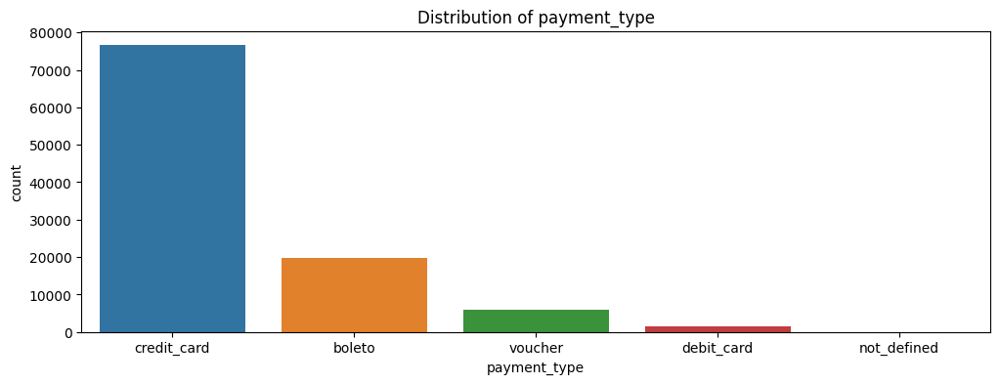

In [83]:
plt.figure(figsize=(12, 4))
sns.countplot(x = 'payment_type', data=Orders_Reviews_Payments_pd)
plt.title("Distribution of payment_type")

In [84]:
pay_type_score = Orders_Reviews_Payments_pd.groupby("review_score")["payment_type"].value_counts(normalize=True)
pay_type_score.unstack()

payment_type,boleto,credit_card,debit_card,not_defined,voucher
review_score,,,,,
1,0.186237,0.738934,0.012778,0.000167,0.061884
2,0.186787,0.727327,0.013814,NaN,0.072072
3,0.198174,0.729486,0.013812,0.000117,0.058410
4,0.193822,0.737955,0.014294,NaN,0.053928
5,0.189546,0.741082,0.015479,NaN,0.053893


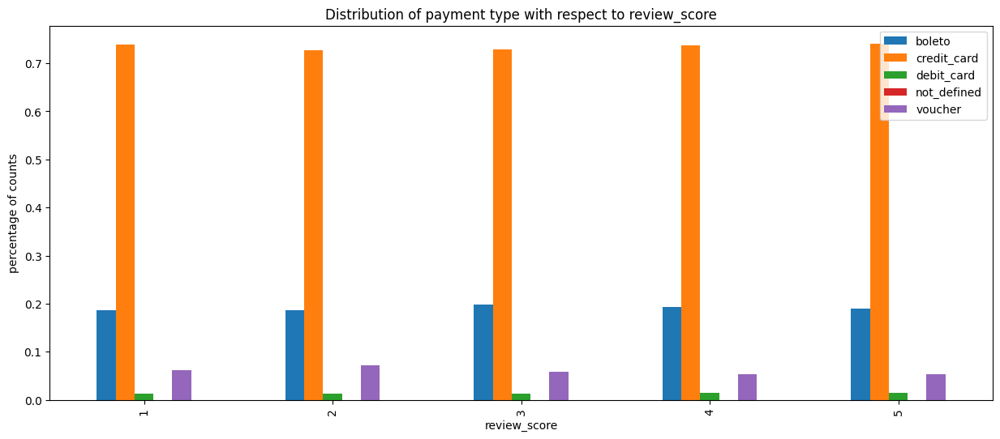

In [85]:
pay_type_score.unstack().plot.bar(figsize=(15,6)).legend(loc="best")
plt.ylabel("percentage of counts")
plt.title("Distribution of payment type with respect to review_score")
plt.show()

Distribution of different payment types in each review rating is almost the same.

In [86]:
Orders_Reviews_Payments_pd.isna().any()

order_id                         False
customer_id                      False
order_status                     False
order_purchase_timestamp         False
order_approved_at                 True
order_delivered_carrier_date      True
order_delivered_customer_date     True
order_estimated_delivery_date    False
review_id                        False
order_id                         False
review_score                     False
review_comment_title              True
review_comment_message            True
review_creation_date              True
review_answer_timestamp           True
order_id                         False
payment_sequential               False
payment_type                     False
payment_installments             False
payment_value                    False
dtype: bool

In [87]:
Orders_Reviews_Payments.filter(col("order_status") != "delivered") \
    .show()

+--------------------+--------------------+------------+------------------------+-------------------+----------------------------+-----------------------------+-----------------------------+--------------------+--------------------+------------+--------------------+----------------------+--------------------+-----------------------+--------------------+------------------+------------+--------------------+-------------+
|            order_id|         customer_id|order_status|order_purchase_timestamp|  order_approved_at|order_delivered_carrier_date|order_delivered_customer_date|order_estimated_delivery_date|           review_id|            order_id|review_score|review_comment_title|review_comment_message|review_creation_date|review_answer_timestamp|            order_id|payment_sequential|payment_type|payment_installments|payment_value|
+--------------------+--------------------+------------+------------------------+-------------------+----------------------------+------------------------

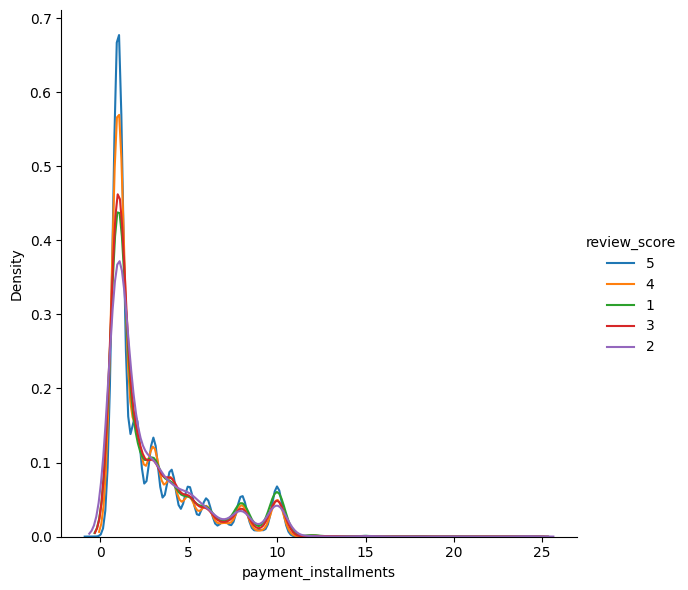

In [88]:
sns.FacetGrid(Orders_Reviews_Payments_pd,hue="review_score",height=6)\
    .map(sns.kdeplot,"payment_installments")\
    .add_legend()
plt.show()

payment_installments
1     52456
2     12354
3     10436
4      7095
10     5323
5      5225
8      4270
6      3919
7      1619
9       638
12      133
15       73
18       27
11       22
24       18
13       17
20       16
14       15
17        8
16        5
21        4
0         2
22        1
23        1
dtype: int64

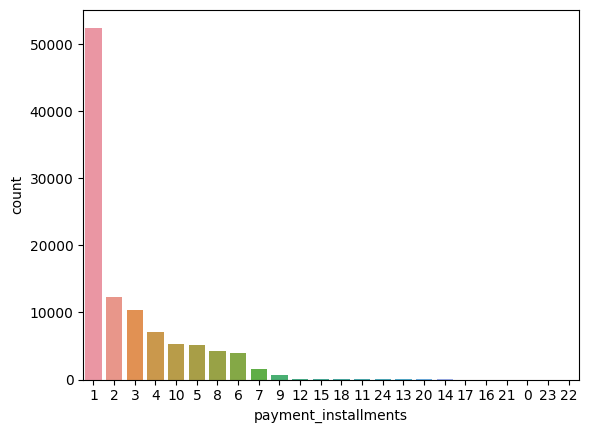

In [89]:
display(Orders_Reviews_Payments_pd.groupby('payment_installments').size().sort_values(ascending=False))

sns.countplot(x="payment_installments", data=Orders_Reviews_Payments_pd, order=list(Orders_Reviews_Payments_pd.payment_installments.value_counts().keys()))

Distribution of installments is almost similar among all the ratings.

Most of the installments = 1 in all ratings.

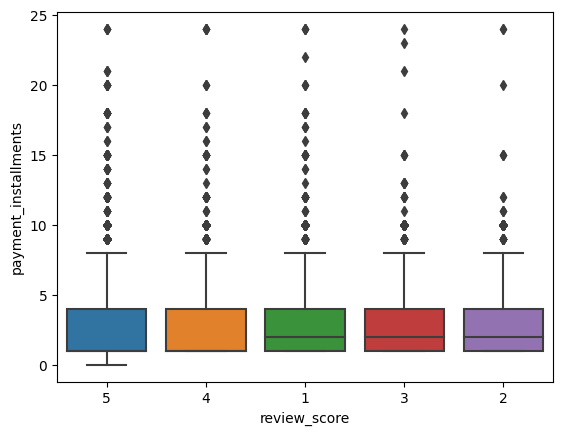

In [90]:
sns.boxplot(y="payment_installments",x="review_score",data=Orders_Reviews_Payments_pd)
plt.show()

In [91]:
Orders_Reviews_Payments_pd.groupby("review_score")["payment_installments"].mean()

review_score
1    3.093118
2    2.963363
3    2.865504
4    2.750400
5    2.833205
Name: payment_installments, dtype: float64

In [92]:
Orders_Reviews_Payments_pd.groupby("review_score")["payment_installments"].apply(lambda x: np.percentile(x,75))

review_score
1    4.0
2    4.0
3    4.0
4    4.0
5    4.0
Name: payment_installments, dtype: float64

In [93]:
Orders_Reviews_Payments_pd.groupby("review_score")["payment_installments"].apply(lambda x: np.percentile(x,25))

review_score
1    1.0
2    1.0
3    1.0
4    1.0
5    1.0
Name: payment_installments, dtype: float64

In [94]:
Orders_Reviews_Payments_pd.groupby("review_score")["payment_installments"].apply(lambda x: np.percentile(x,50))

review_score
1    2.0
2    2.0
3    2.0
4    1.0
5    1.0
Name: payment_installments, dtype: float64

75% of data lies below payment_installments less than 5.

Median for ratings 1, 2, 3 is the same and equals 2. Whereas for rating 4 and 5 is 1

Distribution of Payment Installments is not signifcant among the ratings

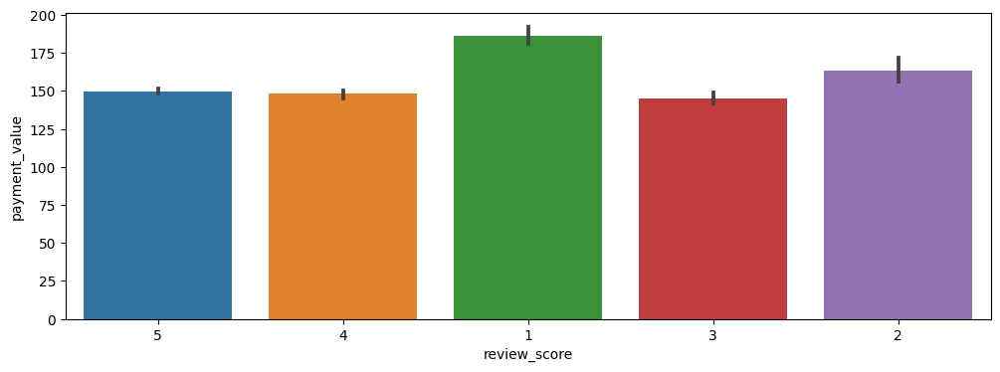

In [95]:
plt.figure(figsize=(12, 4))
sns.barplot(x = 'review_score', y = 'payment_value', data=Orders_Reviews_Payments_pd);

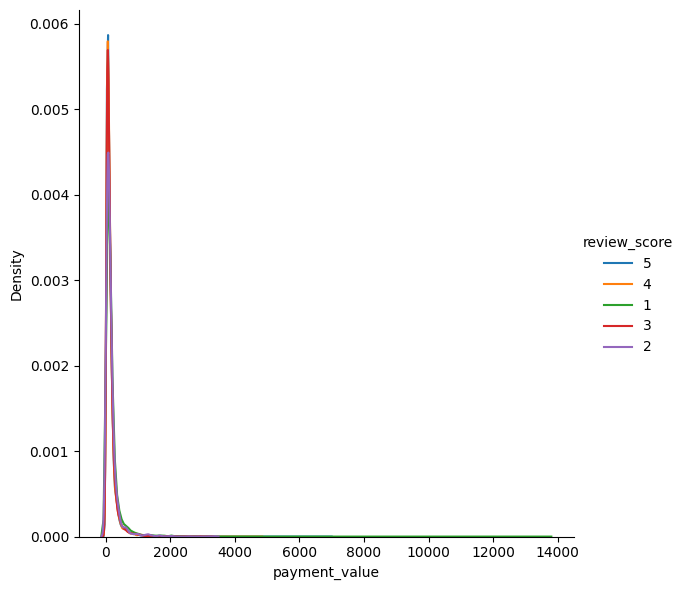

In [96]:
sns.FacetGrid(Orders_Reviews_Payments_pd,hue="review_score",height=6)\
    .map(sns.kdeplot,"payment_value")\
    .add_legend()
plt.show()

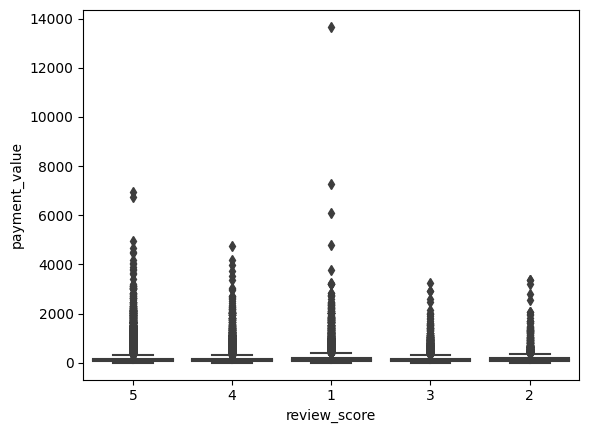

Mean 
 review_score
1    186.388143
2    163.374048
3    145.134606
4    147.976925
5    149.697435
Name: payment_value, dtype: float64
75 percentile 
 review_score
1    199.8750
2    185.0900
3    167.6250
4    166.4100
5    168.0575
Name: payment_value, dtype: float64
25 percentile 
 review_score
1    64.0900
2    58.1825
3    55.5850
4    55.9800
5    55.7800
Name: payment_value, dtype: float64
50 percentile 
 review_score
1    113.335
2    104.855
3     97.760
4     97.810
5     98.380
Name: payment_value, dtype: float64


In [97]:
sns.boxplot(y="payment_value",x="review_score",data=Orders_Reviews_Payments_pd)
plt.show()

#mean payment_value
print("Mean \n",Orders_Reviews_Payments_pd.groupby("review_score")["payment_value"].mean())

#90% payment_value
print("75 percentile \n",Orders_Reviews_Payments_pd.groupby("review_score")["payment_value"].apply(lambda x: np.percentile(x,75)))

print("25 percentile \n",Orders_Reviews_Payments_pd.groupby("review_score")["payment_value"].apply(lambda x: np.percentile(x,25)))


print("50 percentile \n",Orders_Reviews_Payments_pd.groupby("review_score")["payment_value"].apply(lambda x: np.percentile(x,50)))

In [98]:
payments_pd=payments_df.toPandas()
payments_pd[payments_pd["payment_value"] > 8000]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
52107,03caa2c082116e1d31e67e9ae3700499,1,credit_card,1,13664.08


There are outliers with high payment values in rating 1.

Mean values of payment_values of rating 3,4,5 are much less compared to the same of rating 1.

Rating 5 has less payment value compared to rating 1.

Median payment value is high in rating 1 compared to other ratings.

payment value has effect on review_score.

1- Adding total_payment_value and max_payment_installments per order and add them to the payments dataframe

In [99]:
windowSpecAgg  = Window.partitionBy("order_id")
payments_agg= payments_df.withColumn("total_payment_value", sum(col("payment_value")).over(windowSpecAgg)) \
  .withColumn("max_payment_installments", max(col("payment_installments")).over(windowSpecAgg))\
  .select(col("order_id"),col("payment_type"), col('payment_sequential'), col("total_payment_value"),col("max_payment_installments"))
  

In [100]:
payments_df.where(col("order_id")=="b80ba0f0c3d2a63feac0116f533cc6a9").show()

+--------------------+------------------+------------+--------------------+-------------+
|            order_id|payment_sequential|payment_type|payment_installments|payment_value|
+--------------------+------------------+------------+--------------------+-------------+
|b80ba0f0c3d2a63fe...|                 3|     voucher|                   1|         2.99|
|b80ba0f0c3d2a63fe...|                 2|     voucher|                   1|         19.0|
|b80ba0f0c3d2a63fe...|                 1| credit_card|                   1|         11.1|
+--------------------+------------------+------------+--------------------+-------------+



In [101]:
payments_agg.where(col("order_id")=="b80ba0f0c3d2a63feac0116f533cc6a9").show()

+--------------------+------------+------------------+-------------------+------------------------+
|            order_id|payment_type|payment_sequential|total_payment_value|max_payment_installments|
+--------------------+------------+------------------+-------------------+------------------------+
|b80ba0f0c3d2a63fe...|     voucher|                 3|              33.09|                       1|
|b80ba0f0c3d2a63fe...|     voucher|                 2|              33.09|                       1|
|b80ba0f0c3d2a63fe...| credit_card|                 1|              33.09|                       1|
+--------------------+------------+------------------+-------------------+------------------------+



Next, I will add a new column order_payment_type which has the most frequent payment_type value per order

In [102]:
#payments_pivot=payments_agg.groupBy("order_id","order_total_payment","order_total_installments").pivot("payment_type").count()
payments_grouped = payments_agg.groupBy('order_id', 'payment_type', 'total_payment_value', 'max_payment_installments').count()
window = Window.partitionBy("order_id").orderBy(desc("count"))
payments_grouped= payments_grouped.withColumn('order', row_number().over(window))\
    .where(col('order') == 1)\
    .select('order_id','payment_type','max_payment_installments','total_payment_value')

In [103]:
payments_grouped.show()

+--------------------+------------+------------------------+-------------------+
|            order_id|payment_type|max_payment_installments|total_payment_value|
+--------------------+------------+------------------------+-------------------+
|00010242fe8c5a6d1...| credit_card|                       2|              72.19|
|00018f77f2f0320c5...| credit_card|                       3|             259.83|
|000229ec398224ef6...| credit_card|                       5|             216.87|
|00024acbcdf0a6daa...| credit_card|                       2|              25.78|
|00042b26cf59d7ce6...| credit_card|                       3|             218.04|
|00048cc3ae777c65d...|      boleto|                       1|              34.59|
|00054e8431b9d7675...| credit_card|                       1|              31.75|
|000576fe39319847c...| credit_card|                      10|             880.75|
|0005a1a1728c9d785...| credit_card|                       3|              157.6|
|0005f50442cb953dc...| credi

In [104]:
payments_grouped.where(col("order_id")=="b80ba0f0c3d2a63feac0116f533cc6a9").show()

+--------------------+------------+------------------------+-------------------+
|            order_id|payment_type|max_payment_installments|total_payment_value|
+--------------------+------------+------------------------+-------------------+
|b80ba0f0c3d2a63fe...|     voucher|                       1|              33.09|
+--------------------+------------+------------------------+-------------------+



In [105]:
orders_cust_payments = orders_customers_df.join(payments_grouped, orders_customers_df.o_id == payments_grouped.order_id, "left").drop("order_id")

> _1.1.3.3- Merging orders and reviews datasets by order_id:_

In [106]:
reviews_df.groupBy(reviews_df.columns).count().filter(col("count")>1).show()

+--------------------+--------------------+-------------------+--------------------+----------------------+--------------------+-----------------------+-----+
|           review_id|            order_id|       review_score|review_comment_title|review_comment_message|review_creation_date|review_answer_timestamp|count|
+--------------------+--------------------+-------------------+--------------------+----------------------+--------------------+-----------------------+-----+
|,2017-08-10 00:00...|                null|               null|                null|                  null|                null|                   null|    2|
|Bem antes do praz...|                null|               null|                null|                  null|                null|                   null|    2|
|A única coisa que...| 2017-11-22 00:00:00|2017-11-23 14:53:55|                null|                  null|                null|                   null|    2|
|POREM NAO RECEBEM...| SOMENTE OS PROTE...|201

Reviews dataset has many duplicates and anomalies.

First, I will drop the duplicates and the rows that have no order ids.

Next, I will merge the reviews dataset with the orders dataset to get rid of anomalies.

In [107]:
reviews_distinct = reviews_df.dropDuplicates()\
                             .na.drop(subset=["order_id"])
 
reviews_cleaned = reviews_distinct.join(orders_df, reviews_distinct.order_id == orders_df.order_id).select(reviews_distinct["*"])

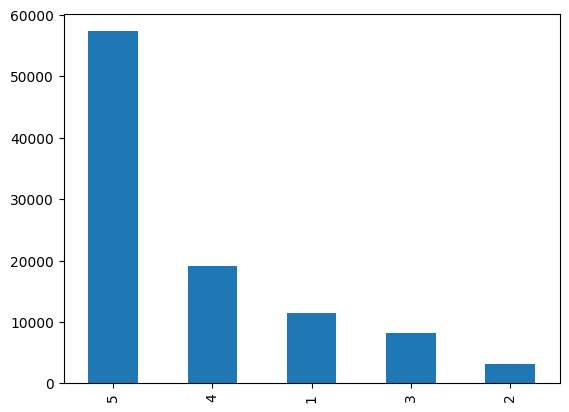

In [108]:
reviews_DF=reviews_cleaned.toPandas()
reviews_DF['review_score'].value_counts()[:20].plot(kind='bar')

In [109]:
for column in reviews_cleaned.columns:
    print("Number of nulls in column %s" %column,reviews_cleaned.where(col(column).isNull()).count())

Number of nulls in column review_id 0
Number of nulls in column order_id 0
Number of nulls in column review_score 0
Number of nulls in column review_comment_title 87656
Number of nulls in column review_comment_message 58247
Number of nulls in column review_creation_date 3850
Number of nulls in column review_answer_timestamp 3852


In [110]:
reviews_cleaned.filter(col("review_comment_message").isNull()).show()

+--------------------+--------------------+------------+--------------------+----------------------+--------------------+-----------------------+
|           review_id|            order_id|review_score|review_comment_title|review_comment_message|review_creation_date|review_answer_timestamp|
+--------------------+--------------------+------------+--------------------+----------------------+--------------------+-----------------------+
|814105994749e97a5...|4de53bbf0a2a3bae7...|           5|                null|                  null| 2018-02-09 00:00:00|    2018-02-11 23:12:36|
|d10aa47a4914ed4e5...|95d8d3c4c0f3ac475...|           4|                null|                  null| 2018-07-12 00:00:00|    2018-07-12 19:44:42|
|7ea98afafdbe948b6...|723f4709e0dc0b2fc...|           5|                null|                  null| 2018-05-08 00:00:00|    2018-05-10 20:10:26|
|1258a603cc9e4897f...|4a4c3e1ff92b16c0e...|           3|                null|                  null| 2018-02-03 00:00:00|   

In [111]:
reviews_selected_cols = reviews_cleaned.select(col("order_id"),col("review_score"))
#def save_submission_file(submission_df, filename):
   # dbutils.fs.rm("/FileStore/df/" + filename + ".csv",True)
    #submission_df.coalesce(1).write.format("com.databricks.spark.csv").option("header","true").save("dbfs:/File#Store/df/" + filename + ".csv")

In [112]:
reviews_selected_cols.groupBy(reviews_selected_cols.order_id).count().filter(col("count")>1).show()

+--------------------+-----+
|            order_id|count|
+--------------------+-----+
|33f1e992ba3e439bf...|    2|
|adbac4b12d94ba3f3...|    2|
|78cd965d0bc0388d3...|    2|
|62adfd8a504d828f9...|    2|
|f63a31c3349b87273...|    2|
|f2665691d2aa17a8c...|    2|
|8b426ff8aa1c03dc1...|    2|
|92e0a2b039d9ce627...|    2|
|b7293e3014a7261f0...|    2|
|78cf5dc2baadfbac2...|    2|
|ec0dc4b5725630957...|    2|
|0b127810f86631fa8...|    2|
|70c77e51e0f179d75...|    2|
|1aa720b6963ff9b4b...|    2|
|26ba6dc5d33b55a31...|    2|
|c333fbd06019caef9...|    2|
|328d856c33d24e8aa...|    2|
|7ceb3c8bbf48eaa77...|    2|
|b88330a020772cd6f...|    2|
|0ee24d5ae95ccf055...|    2|
+--------------------+-----+
only showing top 20 rows



Some orders have > 1 review, checking one row for reference!

In [113]:
reviews_selected_cols.where(col('order_id')=='688e3682bd719f71232cc322252fb045').show()

+--------------------+------------+
|            order_id|review_score|
+--------------------+------------+
|688e3682bd719f712...|           4|
|688e3682bd719f712...|           5|
+--------------------+------------+



In [114]:
windowSpec  = Window.partitionBy("order_id").orderBy("review_score")
reviews_agg= reviews_selected_cols.withColumn("row",row_number().over(windowSpec)) \
                                   .withColumn("avg_review_score", avg(col("review_score")).over(windowSpecAgg))\
                                  .withColumn("min_review_score", min(col('review_score')).over(windowSpecAgg))\
                                  .withColumn("max_review_score", max(col('review_score')).over(windowSpecAgg))\
                                              .where(col("row")==1).select("order_id","avg_review_score","min_review_score","max_review_score")
                                   


In [115]:
print(reviews_agg.groupBy('avg_review_score').count().show())
print(reviews_agg.groupBy('min_review_score').count().show())
(reviews_agg.groupBy('max_review_score').count().show())

+------------------+-----+
|  avg_review_score|count|
+------------------+-----+
|               3.5|   25|
|               4.5|   54|
| 4.333333333333333|    1|
|               2.5|   34|
|               1.0|11316|
|               4.0|19018|
|               3.0| 8136|
|               2.0| 3125|
|               1.5|    8|
|3.3333333333333335|    1|
|               5.0|56955|
+------------------+-----+

None
+----------------+-----+
|min_review_score|count|
+----------------+-----+
|               3| 8138|
|               5|56955|
|               1|11393|
|               4|19047|
|               2| 3140|
+----------------+-----+

None
+----------------+-----+
|max_review_score|count|
+----------------+-----+
|               3| 8116|
|               5|57076|
|               1|11316|
|               4|19044|
|               2| 3121|
+----------------+-----+



In [116]:
reviews_agg = reviews_agg.withColumn('avg_review_score', when(reviews_agg.avg_review_score==4.333333333333333, 4)\
                                                          .when(reviews_agg.avg_review_score==3.3333333333333335, 3)\
                                                          .otherwise(reviews_agg.avg_review_score))

In [117]:
print(reviews_agg.groupBy('avg_review_score').count().show())
print(reviews_agg.where(col("avg_review_score").isNull()).count())
print(reviews_agg.where(col("min_review_score").isNull()).count())
print(reviews_agg.where(col("max_review_score").isNull()).count())

+----------------+-----+
|avg_review_score|count|
+----------------+-----+
|             3.5|   25|
|             4.5|   54|
|             2.5|   34|
|             1.0|11316|
|             4.0|19019|
|             3.0| 8137|
|             2.0| 3125|
|             1.5|    8|
|             5.0|56955|
+----------------+-----+

None
0
0
0


In [118]:
reviews_agg.where(col("order_id")=="688e3682bd719f71232cc322252fb045").show()

+--------------------+----------------+----------------+----------------+
|            order_id|avg_review_score|min_review_score|max_review_score|
+--------------------+----------------+----------------+----------------+
|688e3682bd719f712...|             4.5|               4|               5|
+--------------------+----------------+----------------+----------------+



In [119]:
orders_enriched_df= orders_cust_payments.join(reviews_agg, orders_cust_payments.o_id == reviews_agg.order_id, "left").drop("order_id")

In [120]:
orders_enriched_df.select([count(when(col(c).isNull(), c)).alias(c) for c in orders_enriched_df.columns]).show()


+----+-----------+------------+------------------------+-----------------+----------------------------+-----------------------------+-----------------------------+------------------+------------------------+-------------+--------------+------------------------+-------------------------+------------+------------------------+-------------------+----------------+----------------+----------------+
|o_id|customer_id|order_status|order_purchase_timestamp|order_approved_at|order_delivered_carrier_date|order_delivered_customer_date|order_estimated_delivery_date|customer_unique_id|customer_zip_code_prefix|customer_city|customer_state|customer_geolocation_lat|customer_geolocation_long|payment_type|max_payment_installments|total_payment_value|avg_review_score|min_review_score|max_review_score|
+----+-----------+------------+------------------------+-----------------+----------------------------+-----------------------------+-----------------------------+------------------+------------------------

> _1.1.3.4- Merging items_sellers_enriched_df and orders_enriched_df  by order_id:_

In [121]:
print(items_sellers_enriched_df.count())
items_sellers_enriched_df.printSchema()

112650
root
 |-- order_id: string (nullable = true)
 |-- order_item_id: integer (nullable = true)
 |-- product_id: string (nullable = true)
 |-- seller_id: string (nullable = true)
 |-- shipping_limit_date: string (nullable = true)
 |-- price: double (nullable = true)
 |-- freight_value: double (nullable = true)
 |-- product_category_name: string (nullable = true)
 |-- product_name_lenght: integer (nullable = true)
 |-- product_description_lenght: integer (nullable = true)
 |-- product_photos_qty: integer (nullable = true)
 |-- product_weight_g: integer (nullable = true)
 |-- product_length_cm: integer (nullable = true)
 |-- product_height_cm: integer (nullable = true)
 |-- product_width_cm: integer (nullable = true)
 |-- seller_zip_code_prefix: integer (nullable = true)
 |-- seller_city: string (nullable = true)
 |-- seller_state: string (nullable = true)
 |-- seller_geolocation_lat: double (nullable = true)
 |-- seller_geolocation_long: double (nullable = true)



In [122]:
print(orders_enriched_df.count())
orders_enriched_df.printSchema()

99441
root
 |-- o_id: string (nullable = true)
 |-- customer_id: string (nullable = true)
 |-- order_status: string (nullable = true)
 |-- order_purchase_timestamp: string (nullable = true)
 |-- order_approved_at: string (nullable = true)
 |-- order_delivered_carrier_date: string (nullable = true)
 |-- order_delivered_customer_date: string (nullable = true)
 |-- order_estimated_delivery_date: string (nullable = true)
 |-- customer_unique_id: string (nullable = true)
 |-- customer_zip_code_prefix: long (nullable = true)
 |-- customer_city: string (nullable = true)
 |-- customer_state: string (nullable = true)
 |-- customer_geolocation_lat: double (nullable = true)
 |-- customer_geolocation_long: double (nullable = true)
 |-- payment_type: string (nullable = true)
 |-- max_payment_installments: integer (nullable = true)
 |-- total_payment_value: double (nullable = true)
 |-- avg_review_score: double (nullable = true)
 |-- min_review_score: string (nullable = true)
 |-- max_review_score: 

In [123]:
core_df = items_sellers_enriched_df.join(orders_enriched_df,(items_sellers_enriched_df["order_id"] == orders_enriched_df["o_id"])).drop("o_id")


In [124]:
print(core_df.count())
print(len(core_df.columns))
core_df.printSchema()

112650
39
root
 |-- order_id: string (nullable = true)
 |-- order_item_id: integer (nullable = true)
 |-- product_id: string (nullable = true)
 |-- seller_id: string (nullable = true)
 |-- shipping_limit_date: string (nullable = true)
 |-- price: double (nullable = true)
 |-- freight_value: double (nullable = true)
 |-- product_category_name: string (nullable = true)
 |-- product_name_lenght: integer (nullable = true)
 |-- product_description_lenght: integer (nullable = true)
 |-- product_photos_qty: integer (nullable = true)
 |-- product_weight_g: integer (nullable = true)
 |-- product_length_cm: integer (nullable = true)
 |-- product_height_cm: integer (nullable = true)
 |-- product_width_cm: integer (nullable = true)
 |-- seller_zip_code_prefix: integer (nullable = true)
 |-- seller_city: string (nullable = true)
 |-- seller_state: string (nullable = true)
 |-- seller_geolocation_lat: double (nullable = true)
 |-- seller_geolocation_long: double (nullable = true)
 |-- customer_id: s

In [125]:
core_df.select([count(when(col(c).isNull(), c)).alias(c) for c in core_df.columns]).show()

+--------+-------------+----------+---------+-------------------+-----+-------------+---------------------+-------------------+--------------------------+------------------+----------------+-----------------+-----------------+----------------+----------------------+-----------+------------+----------------------+-----------------------+-----------+------------+------------------------+-----------------+----------------------------+-----------------------------+-----------------------------+------------------+------------------------+-------------+--------------+------------------------+-------------------------+------------+------------------------+-------------------+----------------+----------------+----------------+
|order_id|order_item_id|product_id|seller_id|shipping_limit_date|price|freight_value|product_category_name|product_name_lenght|product_description_lenght|product_photos_qty|product_weight_g|product_length_cm|product_height_cm|product_width_cm|seller_zip_code_prefix|selle

1.1.4- Prepare datasets for exploration:

> _Pandas should be useful in data visualization_

In [126]:
orders_pd = orders_df.toPandas()
order_items_pd = order_items_df.toPandas()
products_pd = products_df.toPandas()
order_items_products_pd=order_items_products_df.toPandas()
customers_enriched_pd = customers_enriched_df.toPandas()
sellers_enriched_pd =sellers_enriched_df.toPandas()
items_sellers_enriched_pd = items_sellers_enriched_df.toPandas()
payments_pd = payments_grouped.toPandas()
orders_customers_pd = orders_customers_df.toPandas()
reviews_pd = reviews_agg.toPandas()
core_pd = core_df.toPandas()

***1- Customers Profiles***:

SP    41746
RJ    12852
MG    11635
RS     5466
PR     5045
SC     3637
BA     3380
DF     2140
ES     2033
GO     2020
PE     1652
CE     1336
PA      975
MT      907
MA      747
MS      715
PB      536
PI      495
RN      485
AL      413
SE      350
TO      280
RO      253
AM      148
AC       81
AP       68
RR       46
Name: customer_state, dtype: int64


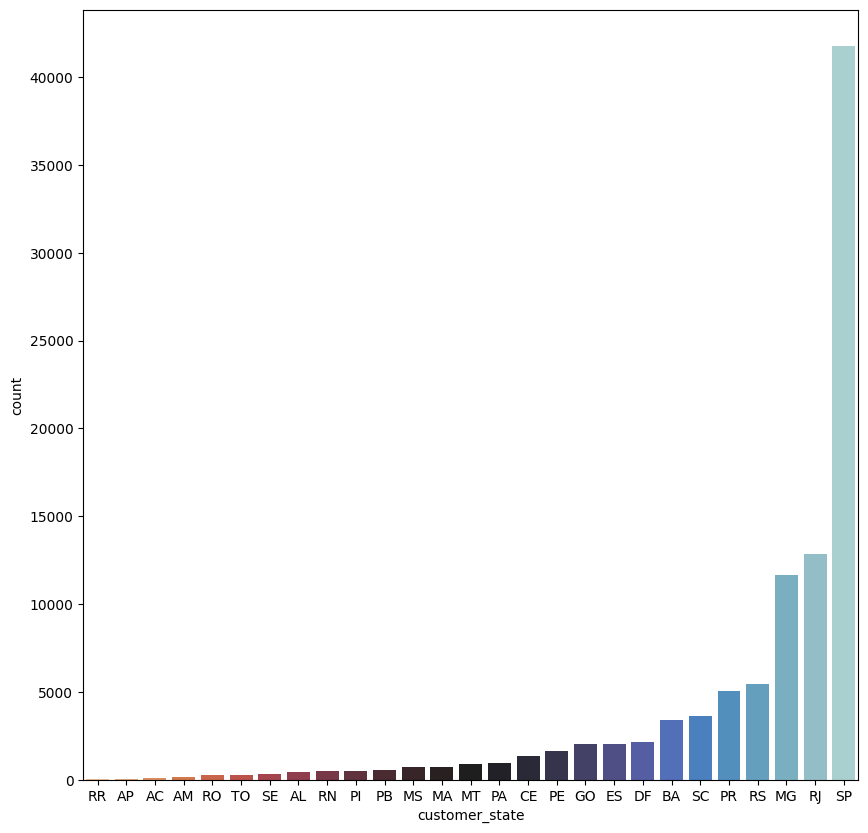

In [127]:
#customers_renamed_pd.customer_state.value_counts(dropna=False, ascending=False).plot(kind='bar', rot=0)
#plt.xlabel('Customer State')
#sns.despine()
print(customers_renamed_pd['customer_state'].value_counts(ascending=False))
plt.figure(figsize=(10,10))
sns.countplot(x ='customer_state', data=customers_renamed_pd, 
              order=customers_renamed_pd['customer_state'].value_counts().sort_values().index, 
              palette='icefire_r')

customer_city
sao paulo         15540
rio de janeiro     6882
belo horizonte     2773
brasilia           2131
curitiba           1521
                  ...  
ibiara                1
rio espera            1
rio dos indios        1
rio dos cedros        1
lagoao                1
Name: customer_city, Length: 4119, dtype: int64


Text(0.5, 1.0, 'Customers Locations')

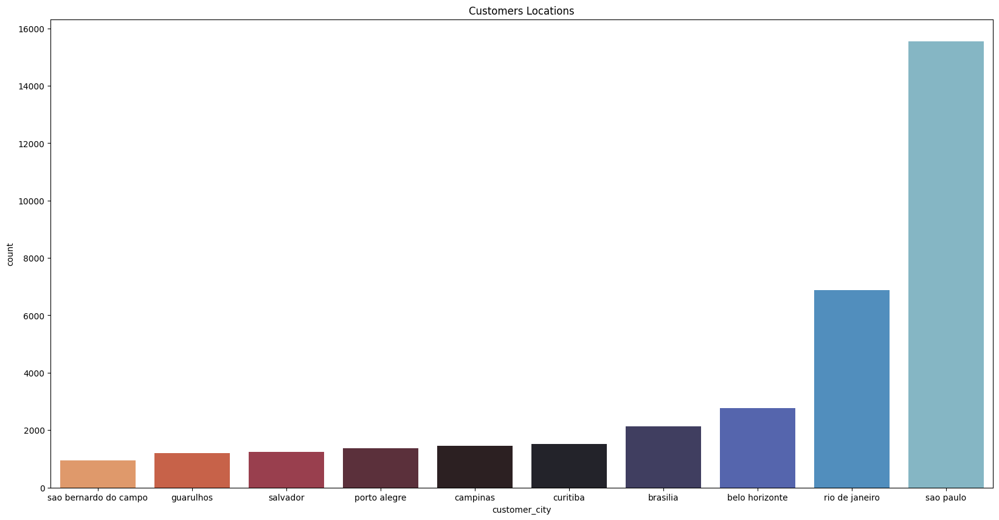

In [128]:
print(customers_renamed_pd.groupby(['customer_city'])['customer_city'].count().sort_values(ascending=False))
#sns.countplot(x="customer_city", data=customers_renamed_pd, #order=list(customers_renamed_pd.customer_city.value_counts().keys()))
#sns.set(font_scale=20)
#sns.set(rc={'figure.figsize':(45,15)})
plt.figure(figsize=(20,10))
sns.countplot(x='customer_city', data=customers_renamed_pd, palette='icefire_r',
             order=customers_renamed_pd['customer_city'].value_counts()[:10]\
             .sort_values().index).set_title("Customers Locations")

In [129]:
state_revenues= core_df.groupBy("customer_state") \
    .agg(sum("price").alias("revenues"))\
 .select('customer_state','revenues')
state_revenues_pd=state_revenues.toPandas()
state_revenes_pd=state_revenues_pd.sort_values(by="revenues", ascending=False)
state_revenues_pd=state_revenues_pd.reset_index(drop=True)


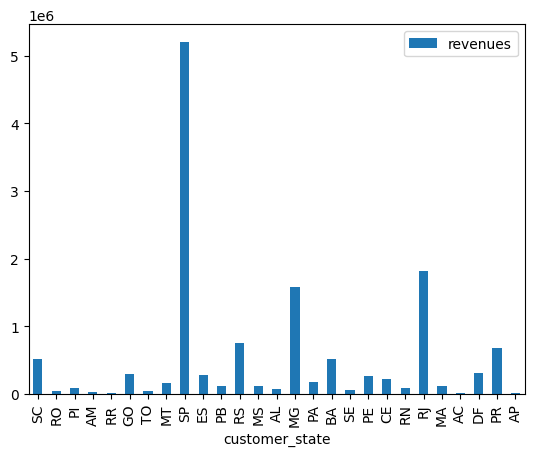

In [130]:
state_revenues_pd.plot(x='customer_state', y='revenues', kind='bar')

In [131]:
#sns.countplot(x="customer_state", data=state_revenues_pd, order=list(state_revenues_pd.sort_values(by="revenues", ascending=True).customer_state)).set_title("State sorted by revenues")
#sns.set(font_scale=2)
#sns.set(rc={'figure.figsize':(10,10)})


***2- Sellers Profiles***:

SP    1849
PR     349
MG     244
SC     190
RJ     171
RS     129
GO      40
DF      30
ES      23
BA      19
CE      13
PE       9
PB       6
MS       5
RN       5
MT       4
SE       2
RO       2
PI       1
PA       1
MA       1
AM       1
AC       1
Name: seller_state, dtype: int64


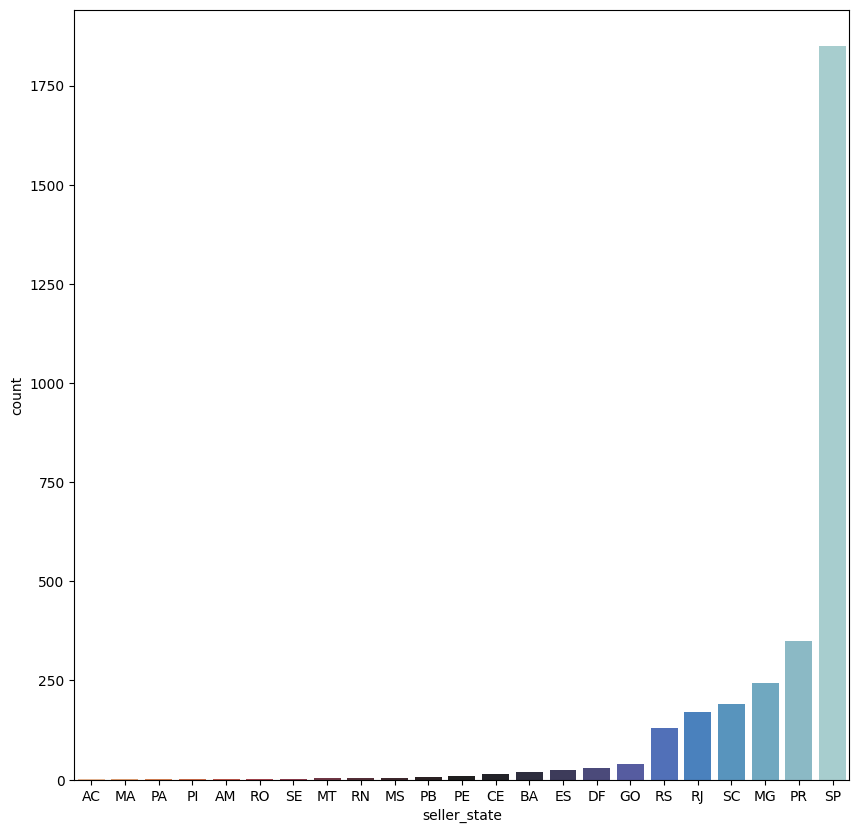

In [132]:
print(sellers_enriched_pd['seller_state'].value_counts(ascending=False))
plt.figure(figsize=(10,10))
sns.countplot(x ='seller_state', data=sellers_enriched_pd, 
              order=sellers_enriched_pd['seller_state'].value_counts().sort_values().index, 
              palette='icefire_r')

Text(0.5, 1.0, 'Sellers Locations')

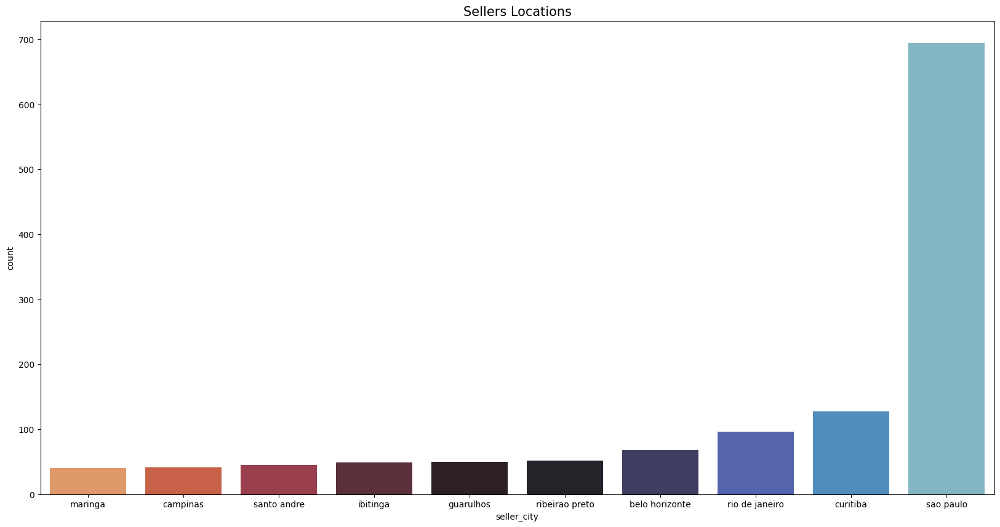

In [133]:
plt.figure(figsize=(20,10))
sns.countplot(x='seller_city', data=sellers_enriched_pd, palette='icefire_r',
             order=sellers_enriched_pd['seller_city'].value_counts()[:10]\
             .sort_values().index).set_title("Sellers Locations", fontsize=15)

***3- Products***

In [134]:
products_revenues= order_items_products_df.groupBy("product_category_name")\
    .agg(sum("price").alias("revenues"))\
 .select('product_category_name','revenues')
product_revenues_pd = products_revenues.toPandas()
product_revenes_pd=product_revenues_pd.sort_values(by="revenues", ascending=False)
product_revenes_pd=product_revenes_pd.reset_index(drop=True)

<Figure size 2000x2000 with 0 Axes>

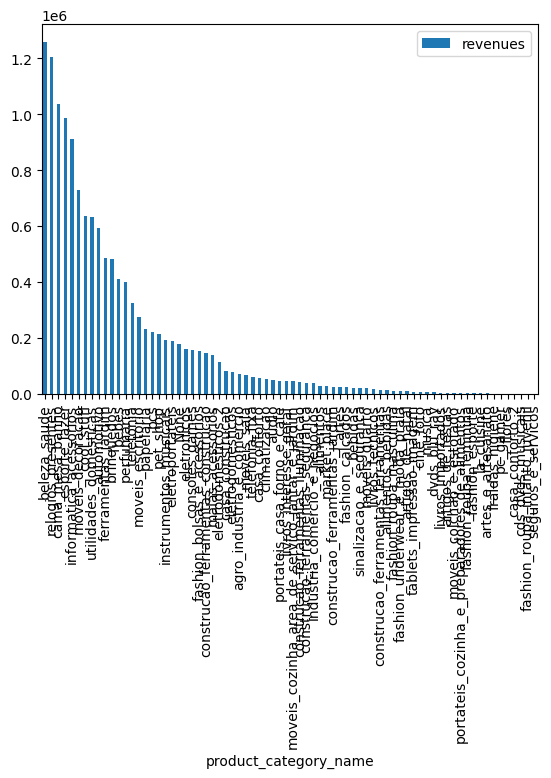

In [135]:
plt.figure(figsize=(20,20))
product_revenes_pd.plot(x='product_category_name', y='revenues', kind='bar')

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 <a list of 10 Text major ticklabel objects>)

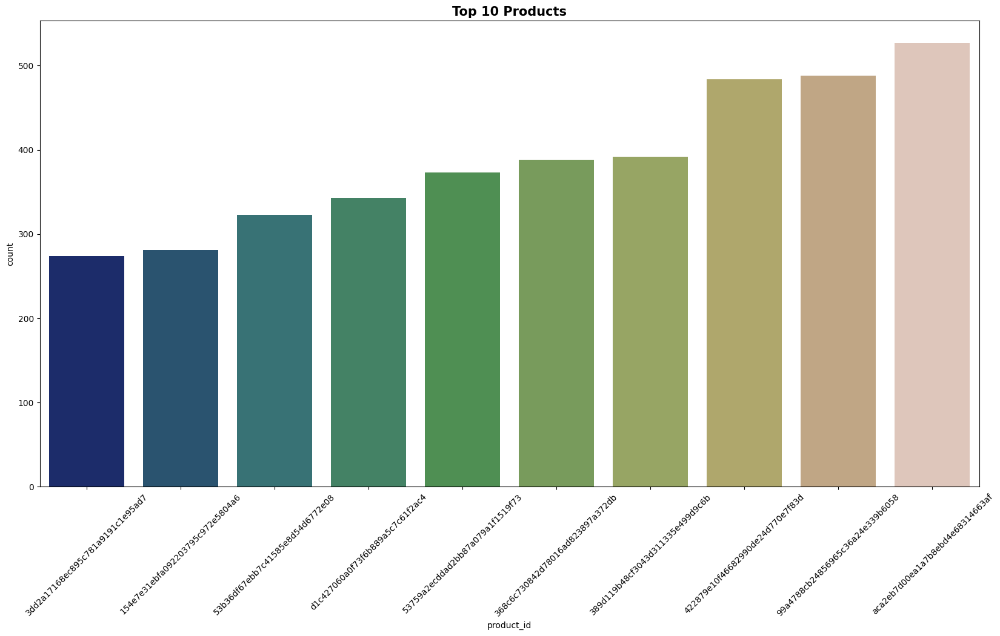

In [136]:
plt.figure(figsize=(20,10))
sns.countplot(x='product_id', data=order_items_pd, palette='gist_earth',
             order=order_items_pd['product_id'].value_counts()[:10]\
             .sort_values().index).set_title("Top 10 Products", fontsize=15,
                                             weight='bold')
plt.xticks(rotation=45)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 <a list of 10 Text major ticklabel objects>)

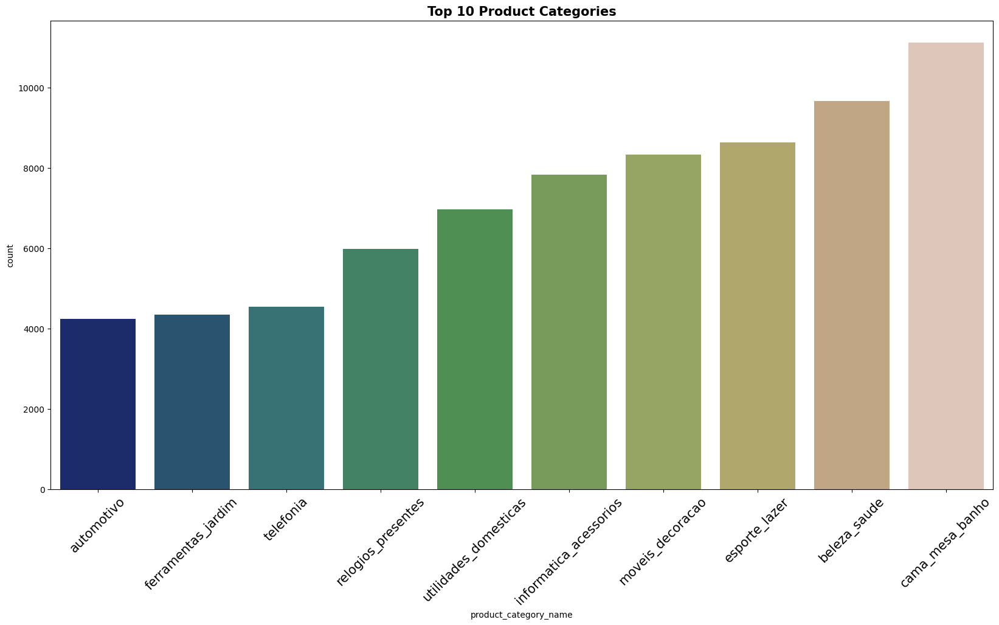

In [137]:
plt.figure(figsize=(20,10))
sns.countplot(x='product_category_name', data=order_items_products_pd, palette='gist_earth',
             order=order_items_products_pd['product_category_name'].value_counts()[:10]\
             .sort_values().index).set_title("Top 10 Product Categories", fontsize=15,
                                             weight='bold')
plt.xticks(rotation=45, fontsize=15)

###1.2 Data Analysis

1.2.1. Check Data Types:

In [138]:
core_df.printSchema()

root
 |-- order_id: string (nullable = true)
 |-- order_item_id: integer (nullable = true)
 |-- product_id: string (nullable = true)
 |-- seller_id: string (nullable = true)
 |-- shipping_limit_date: string (nullable = true)
 |-- price: double (nullable = true)
 |-- freight_value: double (nullable = true)
 |-- product_category_name: string (nullable = true)
 |-- product_name_lenght: integer (nullable = true)
 |-- product_description_lenght: integer (nullable = true)
 |-- product_photos_qty: integer (nullable = true)
 |-- product_weight_g: integer (nullable = true)
 |-- product_length_cm: integer (nullable = true)
 |-- product_height_cm: integer (nullable = true)
 |-- product_width_cm: integer (nullable = true)
 |-- seller_zip_code_prefix: integer (nullable = true)
 |-- seller_city: string (nullable = true)
 |-- seller_state: string (nullable = true)
 |-- seller_geolocation_lat: double (nullable = true)
 |-- seller_geolocation_long: double (nullable = true)
 |-- customer_id: string (nul

In [139]:
core_transformed= core_df.withColumn("order_item_id", core_df["order_item_id"].cast(StringType()))\
                .withColumn("seller_zip_code_prefix", core_df["seller_zip_code_prefix"].cast(StringType()))\
                 .withColumn("customer_zip_code_prefix", core_df['customer_zip_code_prefix'].cast(StringType()))\
                 .withColumn('order_purchase_date', col('order_purchase_timestamp').cast(DateType()))

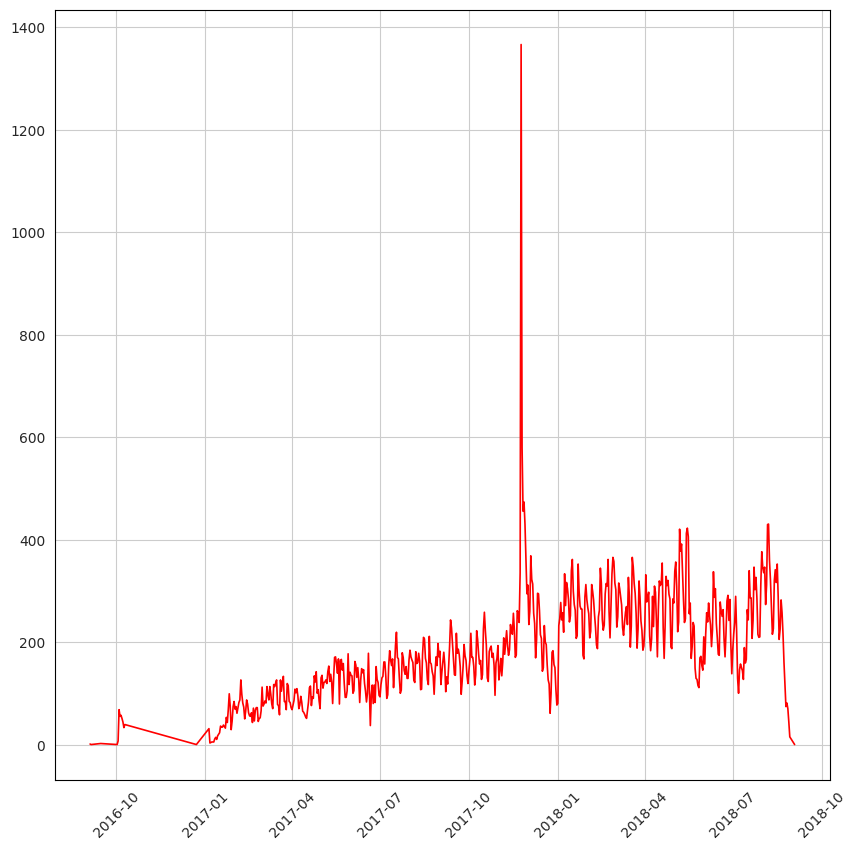

In [140]:
core_transformed_pd= core_transformed.toPandas()
sns.set_style("whitegrid", {'axes.edgecolor': '0'})
plt.figure(figsize=[10,10])
core_transformed_pd.order_purchase_date.value_counts().sort_values(ascending=True).plot(kind='line', linewidth=1.2, color='red', rot=45)

/usr/local/lib/python3.8/dist-packages/pandas/core/ops/array_ops.py:73: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior.  In a future version these will be considered non-comparable.Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  result = libops.scalar_compare(x.ravel(), y, op)


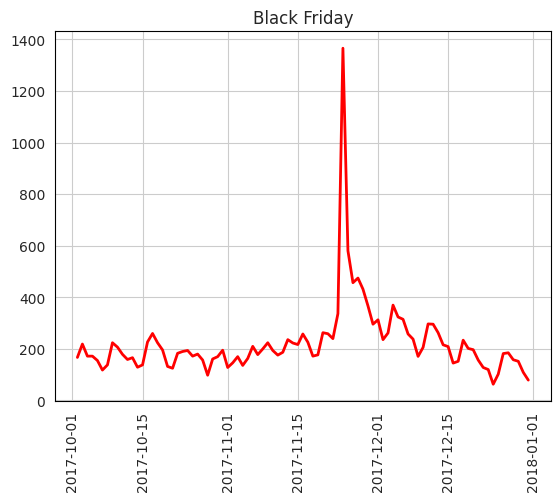

In [141]:
orders_peak = core_transformed_pd[core_transformed_pd['order_purchase_date'] > pd.to_datetime(20171001, format='%Y%m%d')]
orders_peak = orders_peak[orders_peak['order_purchase_date'] < pd.to_datetime(20180101, format='%Y%m%d')]
orders_peak.order_purchase_date.value_counts().plot(kind='line', linewidth=2, color='red')
plt.xticks(fontsize=10, rotation=90)
plt.yticks(fontsize=10)
plt.title('Black Friday')
plt.show()

In [142]:
categorical_cols= [item[0] for item in core_transformed.dtypes if item[1].startswith('string') and 'id' not in (item[0])]
print("Categorical:", categorical_cols, "\n")

num_cols= [item[0] for item in core_transformed.dtypes if item[1].startswith('int') | item[1].startswith('float') | item[1].startswith('double')]
 #and item[0]!= 'customer_geolocation_lat' and item[0]!= 'customer_geolocation_long' and item[0]!='seller_geolocation_lat' and item[0]!='seller_geolocation_long']
print("Numerical:", num_cols, "\n")

date_cols= [item[0] for item in core_transformed.dtypes if item[1].startswith('timestamp') | item[1].startswith('date')]
print("Date:", date_cols, "\n")

Categorical: ['shipping_limit_date', 'product_category_name', 'seller_zip_code_prefix', 'seller_city', 'seller_state', 'order_status', 'order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date', 'order_estimated_delivery_date', 'customer_zip_code_prefix', 'customer_city', 'customer_state', 'payment_type', 'min_review_score', 'max_review_score'] 

Numerical: ['price', 'freight_value', 'product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm', 'seller_geolocation_lat', 'seller_geolocation_long', 'customer_geolocation_lat', 'customer_geolocation_long', 'max_payment_installments', 'total_payment_value', 'avg_review_score'] 

Date: ['order_purchase_date'] 



In [143]:
for categorical_feature in categorical_cols:
    display(core_transformed.select(categorical_feature).distinct().show(100))

+-------------------+
|shipping_limit_date|
+-------------------+
|2018-01-26 13:48:46|
|2018-08-13 17:35:18|
|2018-03-13 02:31:40|
|2017-10-18 14:49:27|
|2017-08-04 13:55:23|
|2018-08-22 14:31:01|
|2017-05-29 03:42:28|
|2018-03-27 02:50:57|
|2018-08-14 21:30:12|
|2017-12-04 02:51:28|
|2017-08-31 21:55:06|
|2017-11-13 10:06:42|
|2018-03-14 02:30:44|
|2018-02-15 15:48:26|
|2017-12-11 04:15:40|
|2018-04-19 12:30:48|
|2018-04-23 21:51:58|
|2017-09-05 09:35:13|
|2017-12-07 13:31:38|
|2018-03-01 20:08:09|
|2018-05-03 19:35:22|
|2018-03-05 16:36:05|
|2018-08-07 23:50:13|
|2018-05-24 02:14:29|
|2017-11-20 16:30:24|
|2017-06-07 16:22:42|
|2018-01-03 04:12:35|
|2018-08-24 03:30:21|
|2017-07-18 22:43:41|
|2017-09-26 09:35:19|
|2018-03-01 02:30:44|
|2018-02-06 13:24:45|
|2017-11-23 20:46:42|
|2017-08-22 00:35:25|
|2017-12-03 23:52:21|
|2018-08-14 23:15:15|
|2017-11-22 02:30:20|
|2018-02-21 02:56:00|
|2017-03-24 17:56:16|
|2017-11-14 16:30:42|
|2018-06-13 11:11:17|
|2018-06-18 20:15:40|
|2017-05-1

None

+---------------------+
|product_category_name|
+---------------------+
|                  pcs|
|                bebes|
|                artes|
|            cine_foto|
|     moveis_decoracao|
|             pc_gamer|
| construcao_ferram...|
| tablets_impressao...|
|    artigos_de_festas|
| fashion_roupa_mas...|
|     artigos_de_natal|
|           la_cuisine|
|               flores|
|      livros_tecnicos|
|                 null|
|       telefonia_fixa|
| construcao_ferram...|
|           cool_stuff|
|     eletrodomesticos|
|    livros_importados|
|             pet_shop|
|      casa_construcao|
| livros_interesse_...|
| instrumentos_musi...|
| moveis_colchao_e_...|
| fashion_roupa_fem...|
| portateis_cozinha...|
| industria_comerci...|
|         beleza_saude|
|      fraldas_higiene|
| fashion_roupa_inf...|
| fashion_underwear...|
|   artes_e_artesanato|
|    moveis_escritorio|
|          eletronicos|
|     malas_acessorios|
| informatica_acess...|
| moveis_cozinha_ar...|
|        moveis_

None

+----------------------+
|seller_zip_code_prefix|
+----------------------+
|                  1512|
|                 86804|
|                 18130|
|                 35670|
|                  3210|
|                 88138|
|                 91910|
|                 26112|
|                 83450|
|                 16250|
|                  4937|
|                 17506|
|                  4821|
|                 87025|
|                  2110|
|                 15052|
|                  9830|
|                 59775|
|                  4850|
|                 13170|
|                 18683|
|                 13660|
|                 13041|
|                  5181|
|                 15041|
|                  8832|
|                 95180|
|                  7056|
|                  6900|
|                 27274|
|                 88113|
|                 89217|
|                 93347|
|                 71900|
|                 81510|
|                 87043|
|                  3526|


None

+--------------------+
|         seller_city|
+--------------------+
|           igrejinha|
|             brusque|
|            buritama|
|         carapicuiba|
|               garca|
|             ipaussu|
|  sao joao de meriti|
|    fernando prestes|
|       nova friburgo|
|           jacutinga|
|              araras|
| sao pedro da aldeia|
|              santos|
|itapecerica da serra|
|            ibitinga|
|               muqui|
|              cuiaba|
|     franco da rocha|
|          votorantim|
|             marilia|
|               cotia|
|          rio grande|
|              centro|
|conselheiro lafaiete|
|     mogi das cruses|
|              suzano|
|             itabira|
|      venancio aires|
|             mucambo|
|        osvaldo cruz|
|rio de janeiro, r...|
|            sao luis|
|           aparecida|
|                 sbc|
|            ourinhos|
|          barro alto|
|         teresopolis|
|santa barbara d'o...|
|       novo hamburgo|
|              portao|
|          

None

+------------+
|seller_state|
+------------+
|          SC|
|          RO|
|          PI|
|          AM|
|          GO|
|          MT|
|          SP|
|          ES|
|          PB|
|          RS|
|          MS|
|          MG|
|          PA|
|          BA|
|          SE|
|          PE|
|          CE|
|          RN|
|          RJ|
|          MA|
|          AC|
|          DF|
|          PR|
+------------+



None

+------------+
|order_status|
+------------+
|     shipped|
|    canceled|
|    approved|
|    invoiced|
|   delivered|
| unavailable|
|  processing|
+------------+



None

+------------------------+
|order_purchase_timestamp|
+------------------------+
|     2018-03-14 09:55:08|
|     2017-10-30 15:11:39|
|     2018-01-13 19:58:20|
|     2017-11-06 22:51:26|
|     2017-11-09 16:52:49|
|     2017-05-02 16:51:34|
|     2018-08-11 18:52:46|
|     2017-07-09 14:26:36|
|     2018-03-01 13:19:20|
|     2018-08-16 11:35:15|
|     2018-02-25 11:39:37|
|     2018-07-25 13:20:32|
|     2017-07-23 14:21:11|
|     2018-03-13 15:06:19|
|     2017-09-25 19:44:56|
|     2018-08-03 10:42:40|
|     2018-03-12 16:53:08|
|     2018-03-08 17:05:09|
|     2017-11-04 00:25:12|
|     2017-08-23 13:52:54|
|     2018-06-29 12:41:16|
|     2018-01-11 07:27:07|
|     2017-03-28 08:26:48|
|     2017-03-03 21:43:21|
|     2017-10-09 15:53:41|
|     2018-05-04 19:07:29|
|     2017-05-14 12:47:08|
|     2017-02-16 08:20:11|
|     2018-01-13 12:49:45|
|     2018-03-21 19:47:18|
|     2018-01-19 23:57:19|
|     2018-03-11 22:12:18|
|     2018-04-06 17:05:49|
|     2017-11-26 16:18:12|
|

None

+-------------------+
|  order_approved_at|
+-------------------+
|2017-09-26 04:07:12|
|2018-06-06 02:13:09|
|2018-03-27 17:50:20|
|2017-05-05 03:10:13|
|2018-08-11 19:05:20|
|2018-07-26 03:25:16|
|2018-06-13 17:19:43|
|2018-05-08 22:14:49|
|2017-11-25 14:39:26|
|2018-03-15 16:50:44|
|2018-01-11 16:48:34|
|2017-05-17 16:25:15|
|2017-08-16 01:55:09|
|2018-02-03 14:55:22|
|2017-12-21 06:49:24|
|2017-10-04 16:28:14|
|2017-07-28 07:43:22|
|2017-05-27 21:42:00|
|2018-04-07 15:48:35|
|2017-12-10 23:30:45|
|2017-12-10 16:30:33|
|2017-07-15 12:25:10|
|2018-07-31 10:31:16|
|2018-01-18 17:35:32|
|2017-12-05 15:31:15|
|2017-07-17 17:50:14|
|2017-05-01 22:55:13|
|2018-06-18 07:11:43|
|2017-07-07 00:50:08|
|2017-09-16 02:50:26|
|2018-02-10 16:55:55|
|2018-01-19 14:16:21|
|2017-09-17 23:05:27|
|2017-02-28 12:10:25|
|2018-06-04 11:51:25|
|2018-05-16 19:36:47|
|2018-01-15 09:56:33|
|2017-08-01 00:43:17|
|2018-02-02 20:04:07|
|2018-02-20 15:55:26|
|2018-03-07 11:50:27|
|2018-02-16 09:46:52|
|2017-12-0

None

+----------------------------+
|order_delivered_carrier_date|
+----------------------------+
|         2018-05-15 15:37:00|
|         2017-08-22 10:33:42|
|         2018-07-24 13:07:00|
|         2017-11-06 19:51:37|
|         2018-02-21 09:19:18|
|         2018-02-23 21:07:49|
|         2017-08-07 20:58:21|
|         2017-05-23 09:11:26|
|         2018-06-18 15:10:00|
|         2017-11-29 22:44:42|
|         2017-11-29 20:24:57|
|         2018-08-07 14:06:00|
|         2018-01-18 16:45:01|
|         2018-01-30 21:18:31|
|         2017-11-07 18:44:53|
|         2017-06-06 14:27:28|
|         2018-07-09 14:32:00|
|         2017-09-26 12:37:54|
|         2018-07-17 16:00:00|
|         2017-07-31 17:43:37|
|         2018-04-11 15:15:36|
|         2018-02-21 22:22:34|
|         2017-03-13 16:22:13|
|         2017-06-21 13:49:24|
|         2017-10-11 23:47:28|
|         2017-11-21 15:44:56|
|         2018-07-31 17:11:00|
|         2017-05-24 14:13:21|
|         2018-04-17 17:46:51|
|       

None

+-----------------------------+
|order_delivered_customer_date|
+-----------------------------+
|          2018-06-05 18:37:56|
|          2018-06-06 01:06:36|
|          2018-04-30 22:58:55|
|          2018-04-04 01:42:46|
|          2017-12-06 00:47:30|
|          2017-03-30 14:38:45|
|          2017-08-02 19:55:51|
|          2017-08-01 18:04:10|
|          2018-04-07 12:08:38|
|          2017-12-08 22:19:32|
|          2017-10-10 18:17:34|
|          2018-02-27 15:16:49|
|          2017-11-20 17:51:49|
|          2018-03-16 15:03:24|
|          2018-01-26 18:06:38|
|          2018-06-22 19:02:41|
|          2018-02-16 02:16:09|
|          2017-02-14 11:45:44|
|          2018-05-28 16:38:45|
|          2018-07-03 08:51:50|
|          2018-08-03 21:04:00|
|          2018-01-17 19:40:55|
|          2018-05-07 17:53:02|
|          2017-04-06 15:37:55|
|          2017-11-29 18:10:00|
|          2018-02-14 22:08:20|
|          2018-02-09 16:05:25|
|          2018-03-27 14:03:03|
|       

None

+-----------------------------+
|order_estimated_delivery_date|
+-----------------------------+
|          2017-05-08 00:00:00|
|          2018-05-16 00:00:00|
|          2017-10-27 00:00:00|
|          2017-05-18 00:00:00|
|          2017-04-18 00:00:00|
|          2017-02-22 00:00:00|
|          2018-09-14 00:00:00|
|          2018-10-01 00:00:00|
|          2018-03-28 00:00:00|
|          2018-01-03 00:00:00|
|          2017-05-12 00:00:00|
|          2017-12-19 00:00:00|
|          2017-03-01 00:00:00|
|          2018-01-19 00:00:00|
|          2017-04-14 00:00:00|
|          2018-06-29 00:00:00|
|          2018-09-17 00:00:00|
|          2017-07-05 00:00:00|
|          2018-05-07 00:00:00|
|          2018-07-20 00:00:00|
|          2018-05-18 00:00:00|
|          2017-08-31 00:00:00|
|          2018-04-05 00:00:00|
|          2017-08-01 00:00:00|
|          2018-01-29 00:00:00|
|          2018-08-02 00:00:00|
|          2016-10-20 00:00:00|
|          2018-02-02 00:00:00|
|       

None

+------------------------+
|customer_zip_code_prefix|
+------------------------+
|                    4821|
|                    3414|
|                   21331|
|                   18130|
|                   57608|
|                   13610|
|                    9030|
|                    6240|
|                   86900|
|                   83450|
|                    7273|
|                   74605|
|                   23097|
|                   60822|
|                    9993|
|                   45540|
|                    7252|
|                   27264|
|                   91910|
|                   14887|
|                   98870|
|                   47960|
|                   88140|
|                   91788|
|                   86804|
|                   57051|
|                    6194|
|                   11722|
|                   35350|
|                   44032|
|                   57085|
|                   16250|
|                    1512|
|                    3210|
|

None

+--------------------+
|       customer_city|
+--------------------+
|            camacari|
|   redencao da serra|
|           arapiraca|
|           itaberaba|
|                iepe|
|           igrejinha|
|  aguas de sao pedro|
|jijoca de jericoa...|
|              bacaxa|
|            barracao|
|                pote|
|            vermelho|
|divino das laranj...|
|divino de sao lou...|
|                ijui|
|           boa vista|
|             brusque|
|            itanhaem|
|  cachoeira paulista|
|           itaperucu|
|        martinopolis|
|             valente|
|            perdigao|
|   sao joao da barra|
|           cachoeira|
|           sao romao|
|       astolfo dutra|
|               uchoa|
|    leandro ferreira|
|            buritama|
|             diorama|
|         pareci novo|
|    coracao de jesus|
|            guaranta|
|          matelandia|
|              pacuja|
|       restinga seca|
|    castelo do piaui|
|           guimaraes|
|centro novo do ma...|
|          

None

+--------------+
|customer_state|
+--------------+
|            SC|
|            RO|
|            PI|
|            AM|
|            RR|
|            GO|
|            TO|
|            MT|
|            SP|
|            ES|
|            PB|
|            RS|
|            MS|
|            AL|
|            MG|
|            PA|
|            BA|
|            SE|
|            PE|
|            CE|
|            RN|
|            RJ|
|            MA|
|            AC|
|            DF|
|            PR|
|            AP|
+--------------+



None

+------------+
|payment_type|
+------------+
|        null|
|      boleto|
| credit_card|
|     voucher|
|  debit_card|
+------------+



None

+----------------+
|min_review_score|
+----------------+
|               3|
|            null|
|               5|
|               1|
|               4|
|               2|
+----------------+



None

+----------------+
|max_review_score|
+----------------+
|               3|
|            null|
|               5|
|               1|
|               4|
|               2|
+----------------+



None

(array([     0.,  20000.,  40000.,  60000.,  80000., 100000., 120000.]),
 <a list of 7 Text major ticklabel objects>)

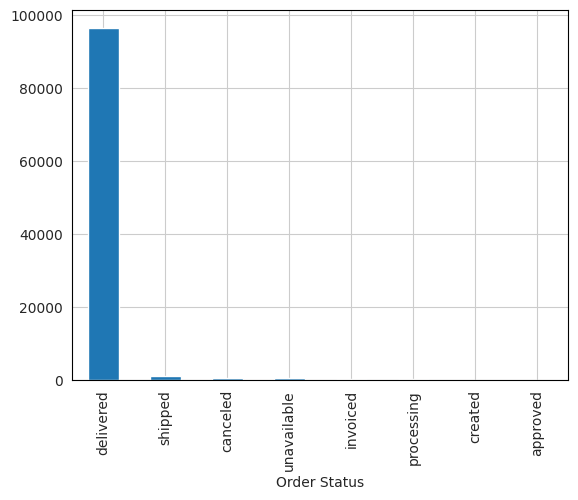

In [144]:
orders_pd.order_status.value_counts(dropna=False).plot(kind='bar', rot=0)
plt.xlabel('Order Status')
plt.xticks(fontsize=10,rotation=90)
plt.yticks(fontsize=10)


(array([    0., 10000., 20000., 30000., 40000., 50000., 60000., 70000.]),
 <a list of 8 Text major ticklabel objects>)

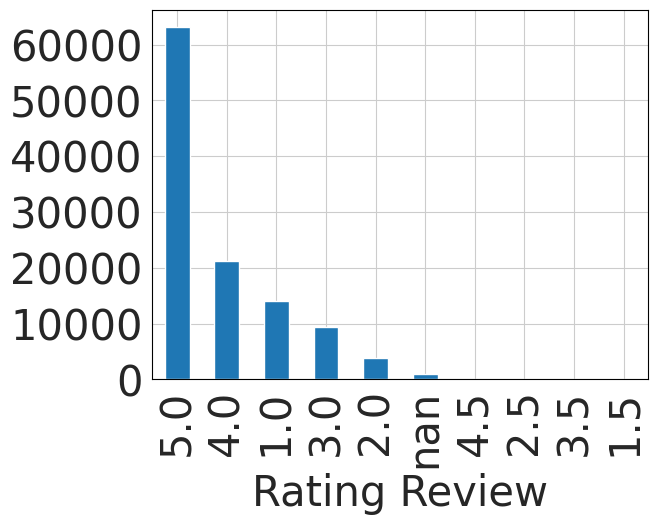

In [145]:
core_transformed_pd.avg_review_score.value_counts(dropna=False).plot(kind='bar', rot=0)
plt.xlabel('Rating Review', fontsize=30)
plt.xticks(fontsize=30,rotation=90)
plt.yticks(fontsize=30)

In [146]:
core_transformed_pd.groupby(["avg_review_score"])['avg_review_score'].count()


avg_review_score
1.0    14079
1.5       18
2.0     3833
2.5       45
3.0     9385
3.5       31
4.0    21167
4.5       68
5.0    63082
Name: avg_review_score, dtype: int64

## 1.3 Data Missing

1.3.1. Check For Missing Data in the dataset:

In [147]:
core_transformed.take(50)

[Row(order_id='00010242fe8c5a6d1ba2dd792cb16214', order_item_id='1', product_id='4244733e06e7ecb4970a6e2683c13e61', seller_id='48436dade18ac8b2bce089ec2a041202', shipping_limit_date='2017-09-19 09:45:35', price=58.9, freight_value=13.29, product_category_name='cool_stuff', product_name_lenght=58, product_description_lenght=598, product_photos_qty=4, product_weight_g=650, product_length_cm=28, product_height_cm=9, product_width_cm=14, seller_zip_code_prefix='27277', seller_city='volta redonda', seller_state='SP', seller_geolocation_lat=-22.498182754371285, seller_geolocation_long=-44.12361371579433, customer_id='3ce436f183e68e07877b285a838db11a', order_status='delivered', order_purchase_timestamp='2017-09-13 08:59:02', order_approved_at='2017-09-13 09:45:35', order_delivered_carrier_date='2017-09-19 18:34:16', order_delivered_customer_date='2017-09-20 23:43:48', order_estimated_delivery_date='2017-09-29 00:00:00', customer_unique_id='871766c5855e863f6eccc05f988b23cb', customer_zip_code_

In [148]:
core_transformed.count()

112650

In [149]:
for col_name in core_transformed.columns:
  print("The count of null rows in column %s" %col_name,
  core_transformed.where(col(col_name).isNull()|col(col_name).isin('?')).count())

The count of null rows in column order_id 0
The count of null rows in column order_item_id 0
The count of null rows in column product_id 0
The count of null rows in column seller_id 0
The count of null rows in column shipping_limit_date 0
The count of null rows in column price 0
The count of null rows in column freight_value 0
The count of null rows in column product_category_name 1603
The count of null rows in column product_name_lenght 1603
The count of null rows in column product_description_lenght 1603
The count of null rows in column product_photos_qty 1603
The count of null rows in column product_weight_g 18
The count of null rows in column product_length_cm 18
The count of null rows in column product_height_cm 18
The count of null rows in column product_width_cm 18
The count of null rows in column seller_zip_code_prefix 0
The count of null rows in column seller_city 0
The count of null rows in column seller_state 0
The count of null rows in column seller_geolocation_lat 0
The co

order_delivered_customer_date    2.178429
product_category_name            1.422992
product_name_lenght              1.422992
product_description_lenght       1.422992
product_photos_qty               1.422992
order_delivered_carrier_date     1.059920
min_review_score                 0.836218
avg_review_score                 0.836218
max_review_score                 0.836218
product_width_cm                 0.015979
product_height_cm                0.015979
product_length_cm                0.015979
product_weight_g                 0.015979
order_approved_at                0.013316
payment_type                     0.002663
max_payment_installments         0.002663
total_payment_value              0.002663
dtype: float64

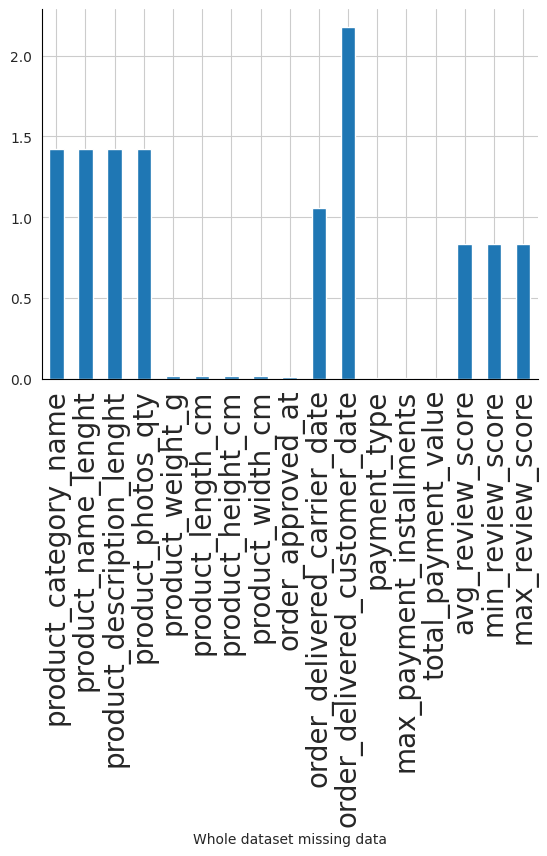

In [150]:
core_nan = core_pd.copy()
core_nan = (core_nan.isnull().sum() / core_nan.shape[0]) * 100
core_nan = core_nan[core_nan > 0]

core_nan.plot(kind='bar' ,rot=0)
plt.xlabel('Whole dataset missing data')
plt.xticks(rotation=90, fontsize=20)
sns.despine()

display(core_nan.sort_values(ascending=False))

In [151]:
nan_cols = [i for i in core_transformed_pd.columns if core_transformed_pd[i].isnull().any()]
print(nan_cols)

['product_category_name', 'product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm', 'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date', 'payment_type', 'max_payment_installments', 'total_payment_value', 'avg_review_score', 'min_review_score', 'max_review_score']


1.3.2. Replace missing values, For a categorical column, Fill with the most frequent category:

In [152]:
for col_name in ["product_category_name","payment_type"]:
        df_noNull = core_transformed.select(col_name).na.drop()
        most_frequent = df_noNull.groupBy(col_name).count().sort(col("count").desc()).collect()[0][0]
        core_transformed = core_transformed.na.fill({col_name: most_frequent})

In [153]:
for col_name in ["product_category_name","payment_type"]:
    print("The count of null rows in column %s" %col_name, core_transformed.where((col(col_name).isNull())).count())

The count of null rows in column product_category_name 0
The count of null rows in column payment_type 0


In [154]:
display(core_transformed.groupBy('payment_type').count().show())

+------------+-----+
|payment_type|count|
+------------+-----+
|      boleto|22867|
| credit_card|85079|
|     voucher| 3015|
|  debit_card| 1689|
+------------+-----+



None

1.3.3. Replace missing values, For a numerical column, Fill with the average value of non-null values:

In [155]:
num_cols = ['product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm',  'max_payment_installments', 'total_payment_value']
for col_name in num_cols:
    df_noNull = core_transformed.select(col_name).na.drop()
    average = df_noNull.select(round(mean(col_name))).collect()[0][0]
    core_transformed = core_transformed.na.fill({col_name: average})

In [156]:
for col_name in num_cols:
  print("The count of null rows in column %s" %col_name, core_transformed.where((col(col_name).isNull())).count())

The count of null rows in column product_name_lenght 0
The count of null rows in column product_description_lenght 0
The count of null rows in column product_photos_qty 0
The count of null rows in column product_weight_g 0
The count of null rows in column product_length_cm 0
The count of null rows in column product_height_cm 0
The count of null rows in column product_width_cm 0
The count of null rows in column max_payment_installments 0
The count of null rows in column total_payment_value 0



##1.4 Data Outliers

1.4.1 Check numerical columns

In [157]:
core_transformed_pd.describe()

,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_geolocation_lat,seller_geolocation_long,customer_geolocation_lat,customer_geolocation_long,max_payment_installments,total_payment_value,avg_review_score
count,112650.000000,112650.000000,111047.000000,111047.000000,111047.000000,112632.000000,112632.000000,112632.000000,112632.000000,112650.000000,112650.000000,112650.000000,112650.000000,112647.000000,112647.000000,111708.000000
mean,120.653739,19.990320,48.775978,787.867029,2.209713,2093.672047,30.153669,16.593766,22.996546,-22.749519,-47.280332,-21.208181,-46.212371,3.018385,180.281186,4.033122
std,183.633928,15.806405,10.025581,652.135608,1.721438,3751.596884,16.153449,13.443483,11.707268,2.842010,2.392973,5.620380,4.101379,2.802552,272.849042,1.386120
min,0.850000,0.000000,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000,-36.605374,-67.809656,-36.605374,-88.914068,0.000000,9.590000,1.000000
25%,39.900000,13.080000,42.000000,348.000000,1.000000,300.000000,18.000000,8.000000,15.000000,-23.550651,-48.831547,-23.590023,-48.132656,1.000000,65.670000,4.000000
50%,74.990000,16.260000,52.000000,603.000000,1.000000,700.000000,25.000000,13.000000,20.000000,-23.422313,-46.633382,-22.929319,-46.634118,2.000000,114.440000,5.000000
75%,134.900000,21.150000,57.000000,987.000000,3.000000,1800.000000,38.000000,20.000000,30.000000,-21.766477,-46.548885,-20.146615,-43.642427,4.000000,195.390000,5.000000
max,6735.000000,409.680000,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000,-2.546079,-34.847856,49.121106,37.830233,24.000000,13664.080000,5.000000


In [158]:
numerical_columns = [
    'price',
    'freight_value',
    'product_weight_g',
    'product_length_cm',
    'product_height_cm',
    'product_width_cm',
    'total_payment_value',
    'max_payment_installments',
    'product_photos_qty',
    'product_description_lenght',
    'product_name_lenght']

A- Check outliers in price column

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


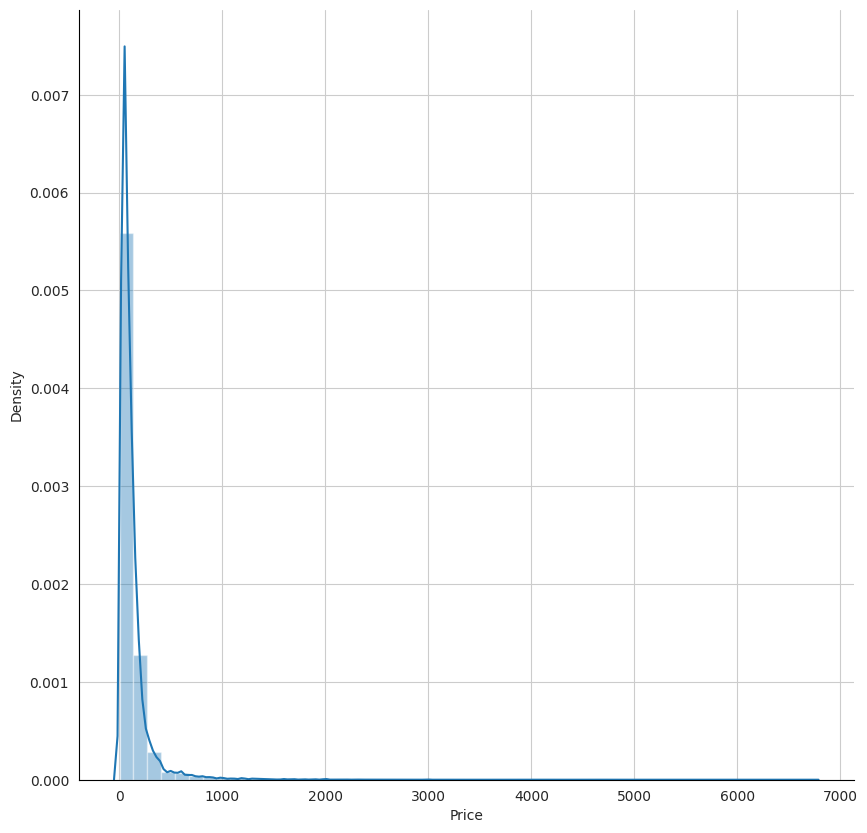

In [159]:
plt.figure(figsize=[10,10])
sns.distplot(order_items_pd.price.dropna())
plt.xlabel('Price')
sns.despine()

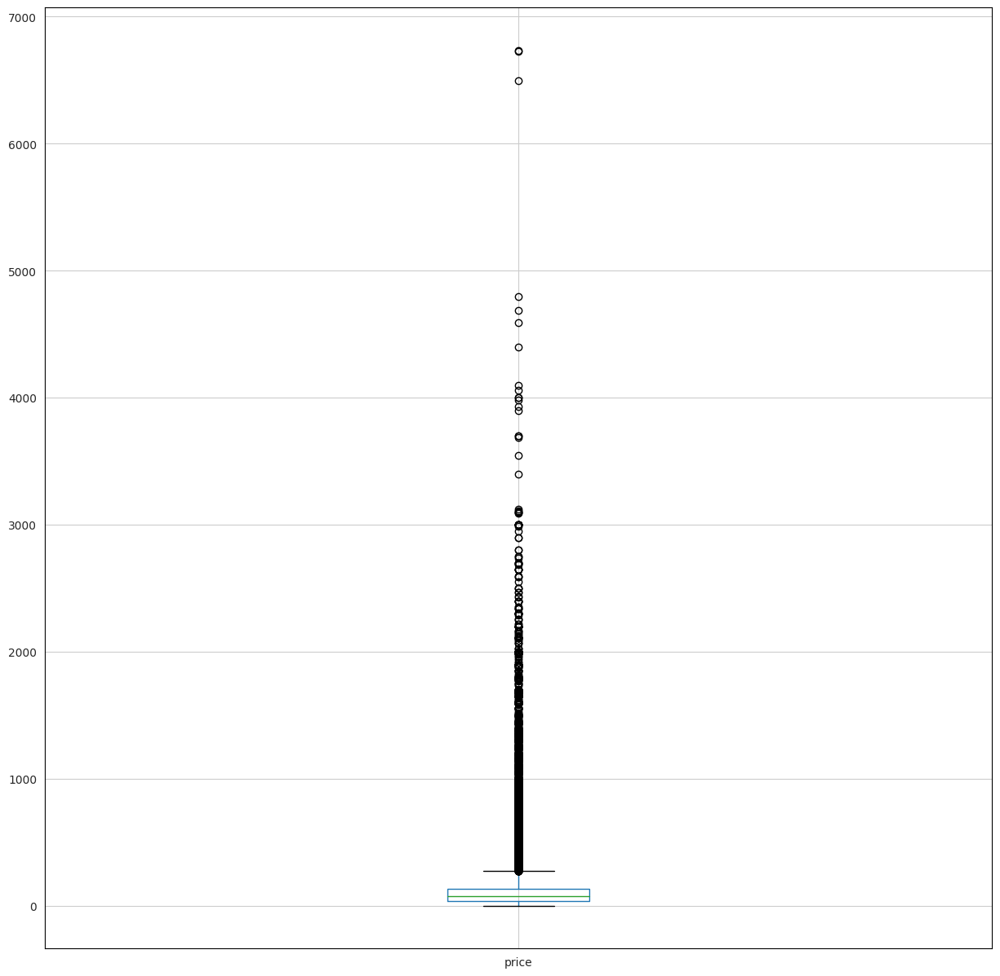

In [160]:
plt.figure(figsize=[15,15])
order_items_pd.boxplot(column="price")

> Price has outliers, Items Prices is min is 0 and max is 70000

B- Check outliers in freight_value column

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


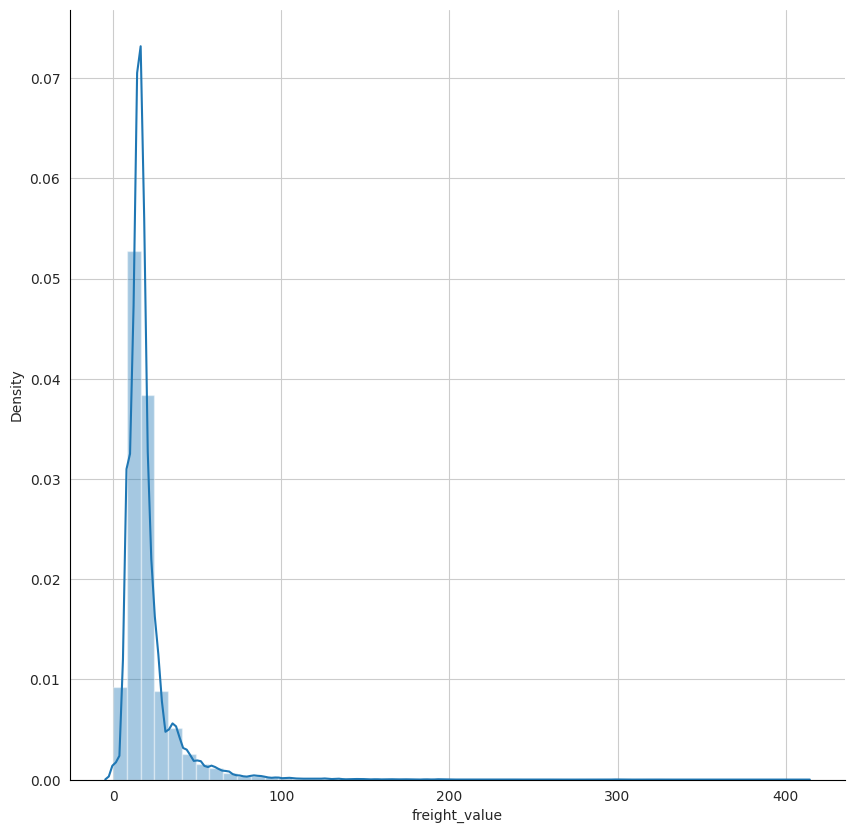

In [161]:
plt.figure(figsize=[10,10])
sns.distplot(order_items_pd.freight_value.dropna())
plt.xlabel('freight_value')
sns.despine()

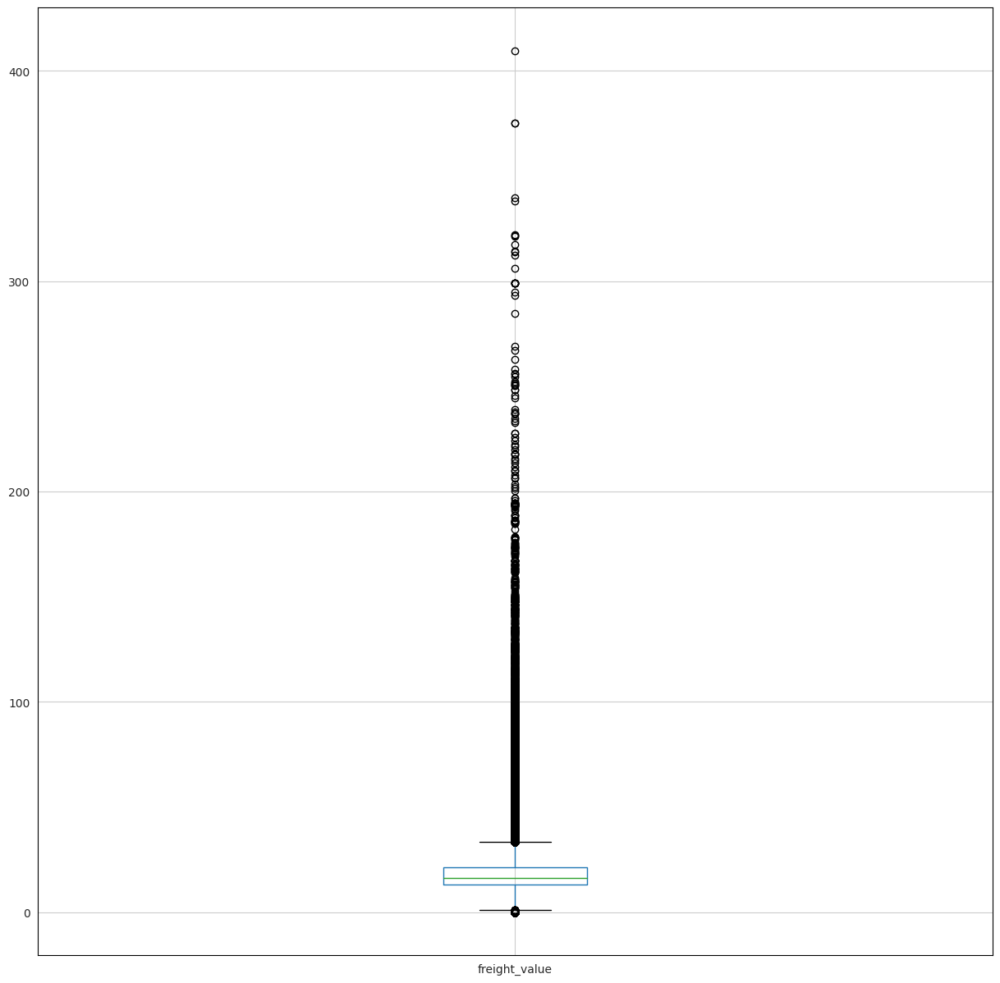

In [162]:
plt.figure(figsize=[15,15])
order_items_pd.boxplot(column="freight_value")

> Freight Value has outliers,  min is 0 and max is 400

C- Check outliers in all numerical columns:

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

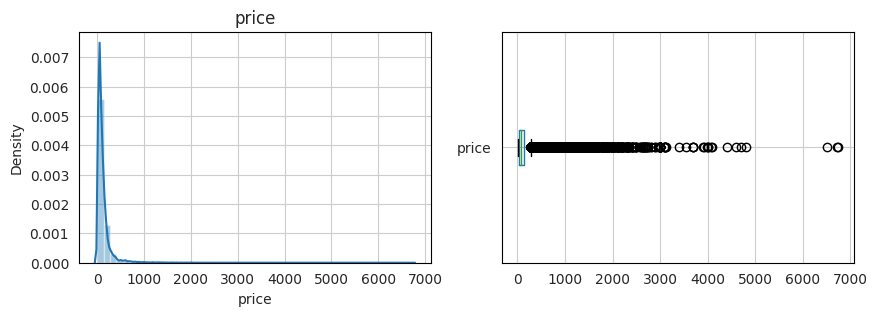

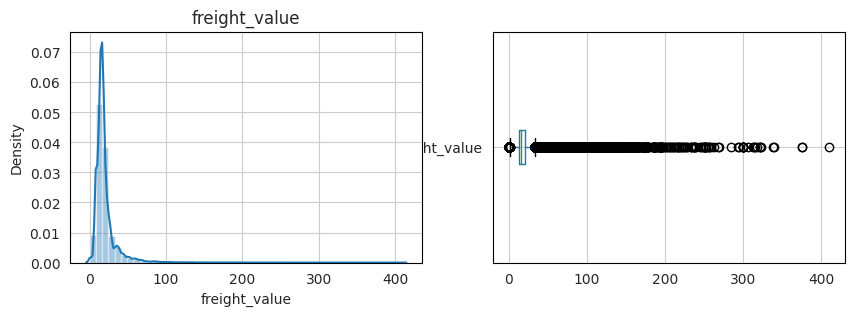

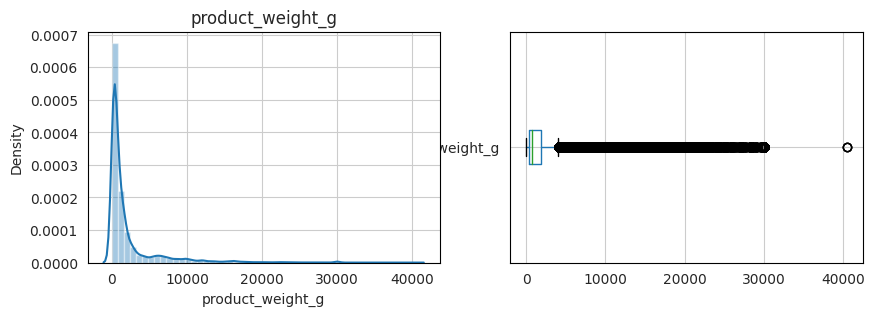

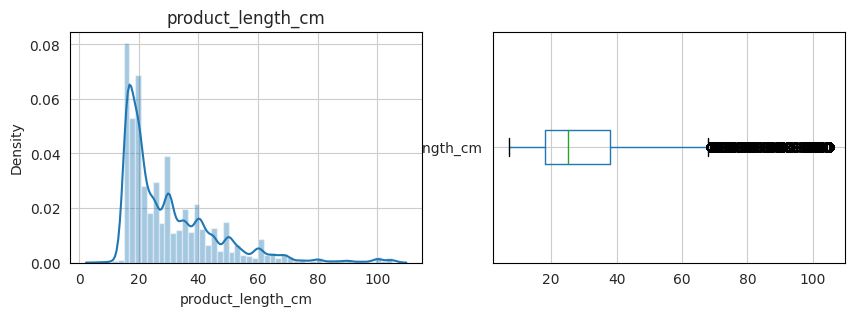

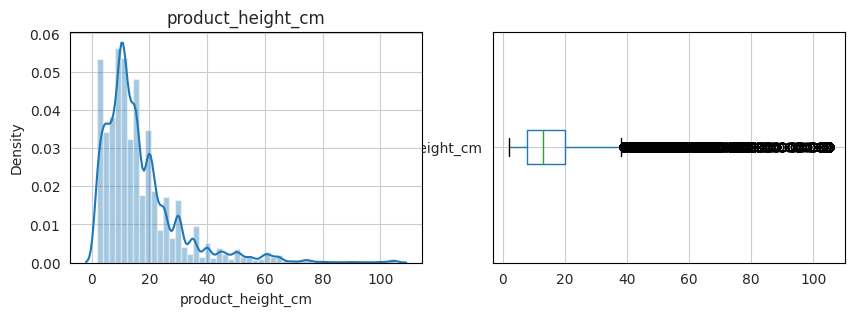

...

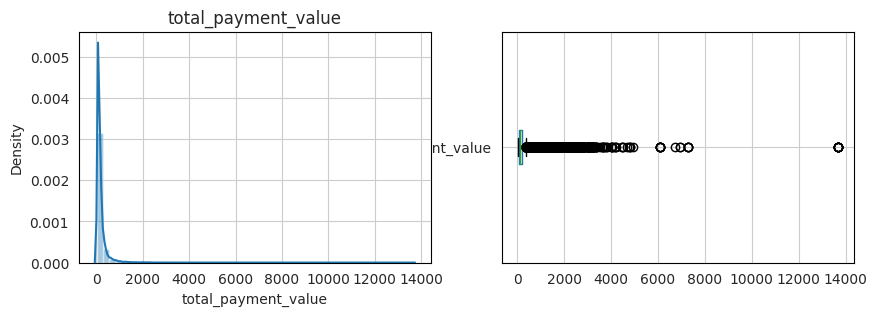

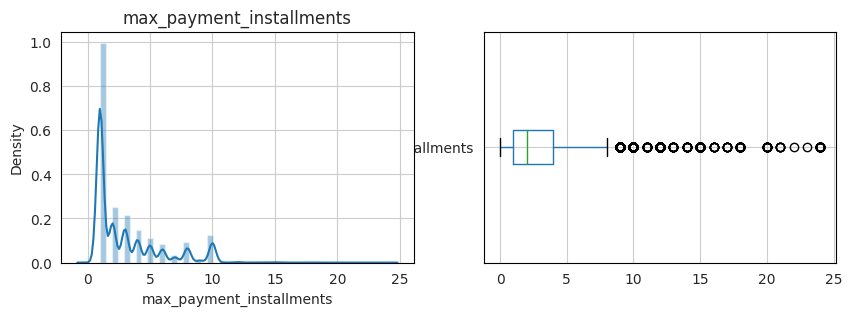

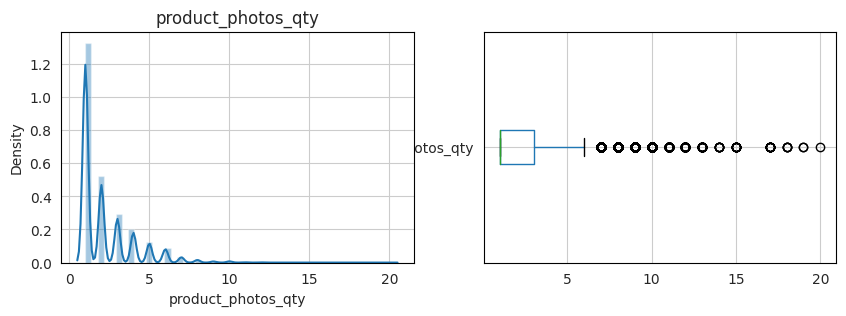

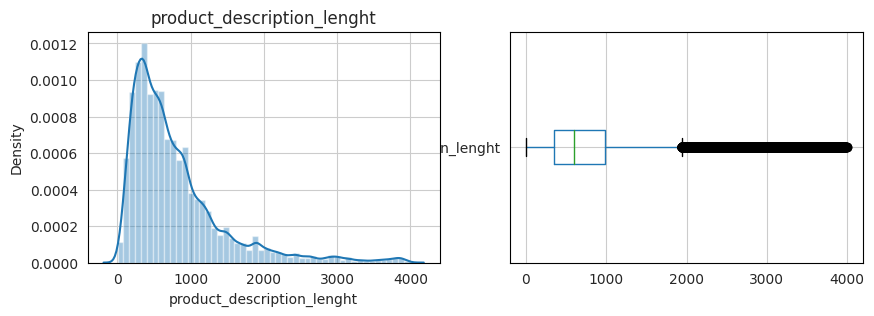

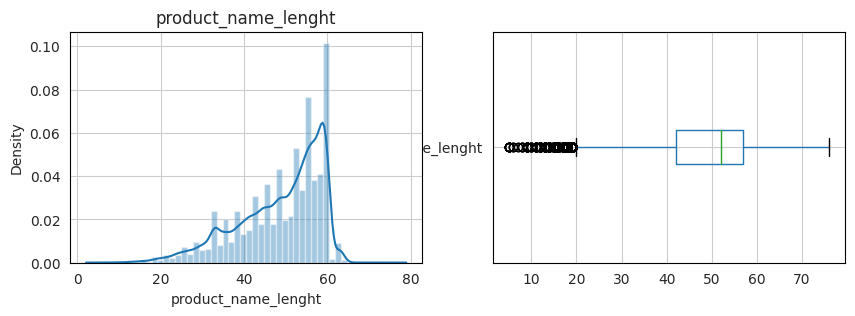

In [163]:
for column in numerical_columns:
    fig, axes = plt.subplots(ncols=2, figsize=(10, 3), sharey=False)
    plt.subplot(1, 2, 1)
    plt.title(column)
    sns.distplot(core_transformed_pd[column].dropna())
    core_pd.boxplot(column=column, vert=False, rot=0, return_type='axes', ax=axes[1])  

#2. Feature Engineering



### 2.1 Feature Extraction & Data Cleaning

2.1.1. Transform 'shipping_limit_date', 'order_purchase_timestamp', 'order_approved_at' into Date types :

In [164]:
core_transformed.printSchema()

root
 |-- order_id: string (nullable = true)
 |-- order_item_id: string (nullable = true)
 |-- product_id: string (nullable = true)
 |-- seller_id: string (nullable = true)
 |-- shipping_limit_date: string (nullable = true)
 |-- price: double (nullable = true)
 |-- freight_value: double (nullable = true)
 |-- product_category_name: string (nullable = false)
 |-- product_name_lenght: integer (nullable = true)
 |-- product_description_lenght: integer (nullable = true)
 |-- product_photos_qty: integer (nullable = true)
 |-- product_weight_g: integer (nullable = true)
 |-- product_length_cm: integer (nullable = true)
 |-- product_height_cm: integer (nullable = true)
 |-- product_width_cm: integer (nullable = true)
 |-- seller_zip_code_prefix: string (nullable = true)
 |-- seller_city: string (nullable = true)
 |-- seller_state: string (nullable = true)
 |-- seller_geolocation_lat: double (nullable = true)
 |-- seller_geolocation_long: double (nullable = true)
 |-- customer_id: string (null

In [165]:
core_date_transformed = core_transformed.withColumn("shipping_limit_date",core_transformed["shipping_limit_date"].cast(DateType()))\
                .withColumn("order_purchase_timestamp", core_transformed["order_purchase_timestamp"].cast(DateType()))\
                           .withColumn("order_approved_at", core_transformed["order_approved_at"].cast(DateType()))\
                           .withColumn("order_delivered_carrier_date", core_transformed["order_delivered_carrier_date"].cast(DateType()))\
                          .withColumn("order_delivered_customer_date", core_transformed["order_delivered_customer_date"].cast(DateType()))\
                           .withColumn("order_estimated_delivery_date", core_transformed["order_estimated_delivery_date"].cast(DateType()))\
                           .drop("order_purchase_date")

In [166]:
for col_name in core_transformed.columns:
  print("The count of null rows in column %s" %col_name, core_transformed.where((col(col_name).isNull())).count())

The count of null rows in column order_id 0
The count of null rows in column order_item_id 0
The count of null rows in column product_id 0
The count of null rows in column seller_id 0
The count of null rows in column shipping_limit_date 0
The count of null rows in column price 0
The count of null rows in column freight_value 0
The count of null rows in column product_category_name 0
The count of null rows in column product_name_lenght 0
The count of null rows in column product_description_lenght 0
The count of null rows in column product_photos_qty 0
The count of null rows in column product_weight_g 0
The count of null rows in column product_length_cm 0
The count of null rows in column product_height_cm 0
The count of null rows in column product_width_cm 0
The count of null rows in column seller_zip_code_prefix 0
The count of null rows in column seller_city 0
The count of null rows in column seller_state 0
The count of null rows in column seller_geolocation_lat 0
The count of null rows

2.1.2.- Feature Extraction : - Extract Year, Month, Day From "order_purchase_timestamp":

In [167]:
core_extracted_time = core_date_transformed.withColumn('year_order_purchase', year(core_date_transformed.order_purchase_timestamp))\
                                           .withColumn('month_order_purchase', month(core_date_transformed.order_purchase_timestamp))\
                                           .withColumn('day_order_purchase', dayofmonth(core_date_transformed.order_purchase_timestamp))\
                                           .withColumn('weekday_order_purchase', date_format("order_purchase_timestamp", 'EEE'))

In [168]:
core_extracted_time.select(F.col('order_purchase_timestamp'), F.col('month_order_purchase'), F.col('day_order_purchase'), F.col('weekday_order_purchase'), F.col('year_order_purchase')).show()

+------------------------+--------------------+------------------+----------------------+-------------------+
|order_purchase_timestamp|month_order_purchase|day_order_purchase|weekday_order_purchase|year_order_purchase|
+------------------------+--------------------+------------------+----------------------+-------------------+
|              2018-03-25|                   3|                25|                   Sun|               2018|
|              2018-03-25|                   3|                25|                   Sun|               2018|
|              2018-03-27|                   3|                27|                   Tue|               2018|
|              2018-07-25|                   7|                25|                   Wed|               2018|
|              2018-01-06|                   1|                 6|                   Sat|               2018|
|              2017-01-29|                   1|                29|                   Sun|               2017|
|         

2.1.3.- Feature Extraction : Distance Feature that describes how far the seller is from the customer

In [169]:
from math import radians, cos, sin, asin, sqrt
from pyspark.sql.types import FloatType
@udf(returnType=FloatType()) 
def get_distance(lat1, lat2, lon1, lon2):
     
    # The math module contains a function named
    # radians which converts from degrees to radians.
    lon1 = radians(lon1)
    lon2 = radians(lon2)
    lat1 = radians(lat1)
    lat2 = radians(lat2)
      
    # Haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
 
    c = 2 * asin(sqrt(a))
    
    # Radius of earth in kilometers. Use 3956 for miles
    r = 6371
    distance_km = c * r
      
    # calculate the result
    return(distance_km)

In [170]:
core_distance = core_extracted_time.withColumn("Distance_kms", get_distance(col("customer_geolocation_lat"), col("seller_geolocation_lat"), col("customer_geolocation_long"), col("seller_geolocation_long")))
core_distance = core_distance.drop("customer_zip_code_prefix","customer_geolocation_lat", "customer_geolocation_long", "seller_zip_code_prefix", "seller_geolocation_lat", "seller_geolocation_long")                                   

2.1.4.- Adding is_reviewed feature that describes if a review was given:

In [171]:
core_is_reviewed = core_distance.withColumn("is_reviewed", when(core_distance.avg_review_score.isNull(), 0)
                                                           .otherwise(1))

In [172]:
core_is_reviewed.groupBy('is_reviewed').count().show()

+-----------+------+
|is_reviewed| count|
+-----------+------+
|          1|111708|
|          0|   942|
+-----------+------+



2.1.5.- Adding feedback feature that has 2 values 1 For Positive and 0 For Negative:

In [173]:
core_feedback = core_is_reviewed.withColumn("feedback", when(core_is_reviewed.avg_review_score >= 3.5, 1)
                                                    .when(core_is_reviewed.avg_review_score < 3.5 , 0)
                                                    .otherwise("not_reviewed"))

In [174]:
core_feedback.groupBy('feedback').count().show()

+------------+-----+
|    feedback|count|
+------------+-----+
|           0|27360|
|not_reviewed|  942|
|           1|84348|
+------------+-----+



2.1.6.- Transform review_scores to integer:

In [175]:
from pyspark.sql.types import IntegerType,BooleanType,DateType,StringType
from pyspark.sql.functions import floor, col
core_review_transformed = core_feedback.select("*", floor(col('avg_review_score')))\
                                       .withColumn("min_review_score", core_feedback["min_review_score"].cast(IntegerType())) \
                                   .withColumn("max_review_score", core_feedback["max_review_score"].cast(IntegerType())) \
                                .withColumnRenamed("FLOOR(avg_review_score)","floor_avg_review")                     

In [176]:
core_review_transformed.printSchema()

root
 |-- order_id: string (nullable = true)
 |-- order_item_id: string (nullable = true)
 |-- product_id: string (nullable = true)
 |-- seller_id: string (nullable = true)
 |-- shipping_limit_date: date (nullable = true)
 |-- price: double (nullable = true)
 |-- freight_value: double (nullable = true)
 |-- product_category_name: string (nullable = false)
 |-- product_name_lenght: integer (nullable = true)
 |-- product_description_lenght: integer (nullable = true)
 |-- product_photos_qty: integer (nullable = true)
 |-- product_weight_g: integer (nullable = true)
 |-- product_length_cm: integer (nullable = true)
 |-- product_height_cm: integer (nullable = true)
 |-- product_width_cm: integer (nullable = true)
 |-- seller_city: string (nullable = true)
 |-- seller_state: string (nullable = true)
 |-- customer_id: string (nullable = true)
 |-- order_status: string (nullable = true)
 |-- order_purchase_timestamp: date (nullable = true)
 |-- order_approved_at: date (nullable = true)
 |-- or

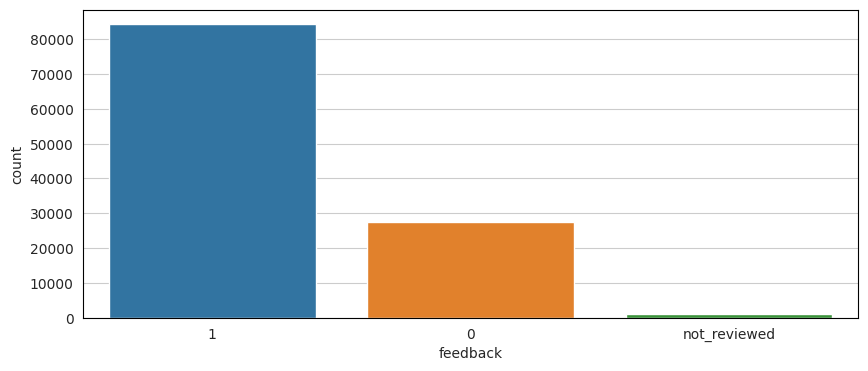

In [177]:
core_review_transformed_pd = core_review_transformed.toPandas()
plt.figure(figsize=(10, 4))
sns.countplot(x='feedback', data=core_review_transformed_pd)

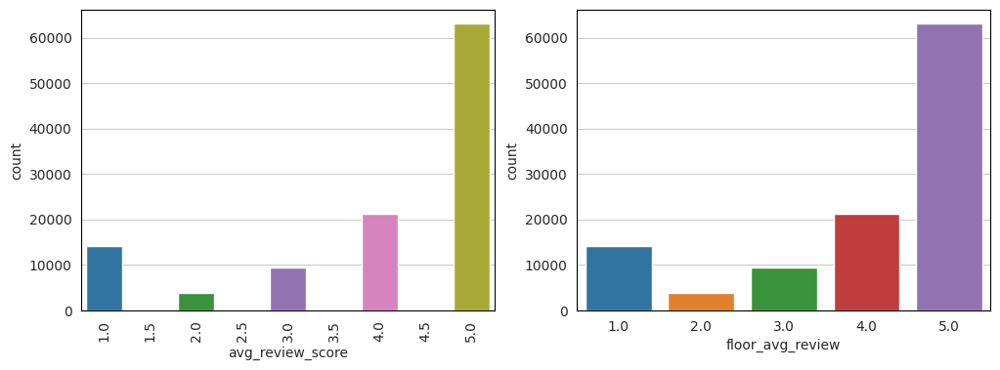

In [178]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.countplot(x='avg_review_score', data=core_review_transformed_pd)
plt.xticks(rotation=90)

plt.subplot(1, 2, 2)
sns.countplot(x='floor_avg_review', data=core_review_transformed_pd)

Counts :
  5.0    63082
4.0    21235
1.0    14097
3.0     9416
2.0     3878
Name: floor_avg_review, dtype: int64
************************************************************
Percentage distribution :
  5.0    0.564704
4.0    0.190094
1.0    0.126195
3.0    0.084291
2.0    0.034716
Name: floor_avg_review, dtype: float64
************************************************************


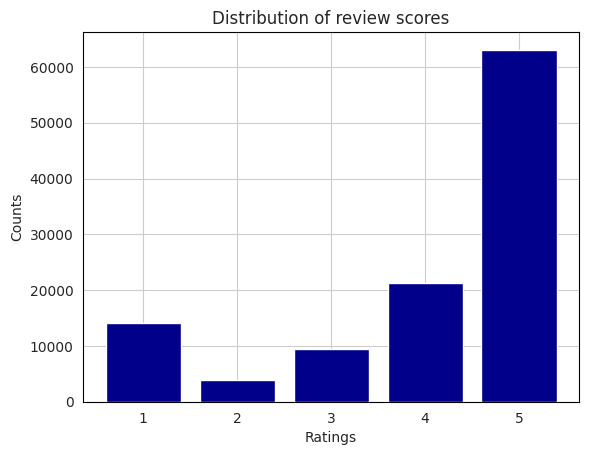

In [179]:
print("Counts :\n ",core_review_transformed_pd ["floor_avg_review"].value_counts())
print("**"*30)
print("Percentage distribution :\n ",core_review_transformed_pd ["floor_avg_review"].value_counts(normalize=True))
print("**"*30)

plt.bar(core_review_transformed_pd["floor_avg_review"].value_counts().index,core_review_transformed_pd ["floor_avg_review"].value_counts(),color="darkblue")

plt.xlabel("Ratings")
plt.ylabel("Counts")
plt.title("Distribution of review scores")
plt.show()

2.1.7.- 

a- Dropping rows with nulls in "order_delivered_customer_date".

b- Adding 'diff_in_delivery_time' feature which describes the difference between the actual and estimated delivery date in days. If negative was delivered early, if positive was delivered late.


c- Adding 'actual_delivery_time' feature which describes days between order approval and delivered customer date.

c- Adding 'delivery_status' feature which describes if an order was delivered early/late.

In [180]:
core_feedback.filter(core_feedback.order_delivered_customer_date.isNull()) \
              .select(col('avg_review_score')).show()

+----------------+
|avg_review_score|
+----------------+
|             1.0|
|             1.0|
|             3.0|
|             1.0|
|             3.0|
|             1.0|
|             5.0|
|             2.0|
|             1.0|
|             5.0|
|             1.0|
|             4.0|
|             1.0|
|             1.0|
|             1.0|
|             1.0|
|             5.0|
|             1.0|
|             1.0|
|             1.0|
+----------------+
only showing top 20 rows



In [181]:
from pyspark.sql.functions import *

#core_review_transformed= core_review_transformed.na.drop(subset=["order_delivered_customer_date"])
core_diff_delivery_time = core_review_transformed.withColumn("diff_in_delivery_time",datediff(col("order_delivered_customer_date"),col("order_estimated_delivery_date")))

#Multiplying "diff_in_delivery_time" by (-1) to give bigger weights to early deliverables.
#core_diff_delivery_time = core_diff_delivery_time.withColumn("diff_in_delivery_time", core_diff_delivery_time["diff_in_delivery_time"] * lit(-1))

In [182]:
df_nonulls= core_diff_delivery_time.select('diff_in_delivery_time').na.drop()
average = df_nonulls.select(round(mean('diff_in_delivery_time'))).collect()[0][0]
core_diff_delivery_time = core_diff_delivery_time.na.fill({'diff_in_delivery_time':average})

In [183]:
core_diff_delivery_time.select(F.col('diff_in_delivery_time'), F.col('avg_review_score')).show()

+---------------------+----------------+
|diff_in_delivery_time|avg_review_score|
+---------------------+----------------+
|                  -16|             3.0|
|                  -16|             3.0|
|                   -6|             5.0|
|                   -7|             5.0|
|                  -19|             5.0|
|                  -40|             5.0|
|                  -12|             1.0|
|                    2|             3.0|
|                  -15|             2.0|
|                   -8|             1.0|
|                  -20|             4.0|
|                   -7|             1.0|
|                   -2|             4.0|
|                  -15|             5.0|
|                  -17|             4.0|
|                   -9|             5.0|
|                  -12|             5.0|
|                    0|             5.0|
|                  -10|             5.0|
|                   -7|             5.0|
+---------------------+----------------+
only showing top

In [184]:
#Adding "actual_delivery_time" feature

core_actual_delivery_time = core_diff_delivery_time.withColumn("actual_delivery_time", datediff(col("order_delivered_customer_date"),col("order_purchase_timestamp")))


In [185]:
df_nonulls= core_actual_delivery_time.select('actual_delivery_time').na.drop()
average = df_nonulls.select(round(mean('actual_delivery_time'))).collect()[0][0]
core_actual_delivery_time = core_actual_delivery_time.na.fill({'actual_delivery_time':average})

In [186]:
core_actual_delivery_time.select(col("actual_delivery_time"), col("avg_review_score")).show()
core_actual_delivery_time.dtypes

+--------------------+----------------+
|actual_delivery_time|avg_review_score|
+--------------------+----------------+
|                   3|             3.0|
|                   3|             3.0|
|                  14|             5.0|
|                   6|             5.0|
|                  13|             5.0|
|                  10|             5.0|
|                  10|             1.0|
|                  25|             3.0|
|                  12|             2.0|
|                  10|             1.0|
|                   5|             4.0|
|                   7|             1.0|
|                   5|             4.0|
|                  12|             5.0|
|                   5|             4.0|
|                   5|             5.0|
|                   6|             5.0|
|                   8|             5.0|
|                  13|             5.0|
|                  12|             5.0|
+--------------------+----------------+
only showing top 20 rows



[('order_id', 'string'),
 ('order_item_id', 'string'),
 ('product_id', 'string'),
 ('seller_id', 'string'),
 ('shipping_limit_date', 'date'),
 ('price', 'double'),
 ('freight_value', 'double'),
 ('product_category_name', 'string'),
 ('product_name_lenght', 'int'),
 ('product_description_lenght', 'int'),
 ('product_photos_qty', 'int'),
 ('product_weight_g', 'int'),
 ('product_length_cm', 'int'),
 ('product_height_cm', 'int'),
 ('product_width_cm', 'int'),
 ('seller_city', 'string'),
 ('seller_state', 'string'),
 ('customer_id', 'string'),
 ('order_status', 'string'),
 ('order_purchase_timestamp', 'date'),
 ('order_approved_at', 'date'),
 ('order_delivered_carrier_date', 'date'),
 ('order_delivered_customer_date', 'date'),
 ('order_estimated_delivery_date', 'date'),
 ('customer_unique_id', 'string'),
 ('customer_city', 'string'),
 ('customer_state', 'string'),
 ('payment_type', 'string'),
 ('max_payment_installments', 'int'),
 ('total_payment_value', 'double'),
 ('avg_review_score', 'dou

In [187]:
for col_name in core_actual_delivery_time.columns:
  print("The count of null rows in column %s" %col_name, core_actual_delivery_time.where((col(col_name).isNull())).count())

The count of null rows in column order_id 0
The count of null rows in column order_item_id 0
The count of null rows in column product_id 0
The count of null rows in column seller_id 0
The count of null rows in column shipping_limit_date 0
The count of null rows in column price 0
The count of null rows in column freight_value 0
The count of null rows in column product_category_name 0
The count of null rows in column product_name_lenght 0
The count of null rows in column product_description_lenght 0
The count of null rows in column product_photos_qty 0
The count of null rows in column product_weight_g 0
The count of null rows in column product_length_cm 0
The count of null rows in column product_height_cm 0
The count of null rows in column product_width_cm 0
The count of null rows in column seller_city 0
The count of null rows in column seller_state 0
The count of null rows in column customer_id 0
The count of null rows in column order_status 0
The count of null rows in column order_purc

In [188]:
core_is_late = core_actual_delivery_time.withColumn("delivery_status", when(core_actual_delivery_time.diff_in_delivery_time <0, 'early') 
.when(core_actual_delivery_time.diff_in_delivery_time >0, 'late')
.when(core_actual_delivery_time.diff_in_delivery_time == 0, 'ontime')
 .otherwise(core_actual_delivery_time.diff_in_delivery_time))

In [189]:
core_is_late.select(F.col('diff_in_delivery_time'), F.col('delivery_status')).show()

+---------------------+---------------+
|diff_in_delivery_time|delivery_status|
+---------------------+---------------+
|                  -16|          early|
|                  -16|          early|
|                   -6|          early|
|                   -7|          early|
|                  -19|          early|
|                  -40|          early|
|                  -12|          early|
|                    2|           late|
|                  -15|          early|
|                   -8|          early|
|                  -20|          early|
|                   -7|          early|
|                   -2|          early|
|                  -15|          early|
|                  -17|          early|
|                   -9|          early|
|                  -12|          early|
|                    0|         ontime|
|                  -10|          early|
|                   -7|          early|
+---------------------+---------------+
only showing top 20 rows



2.1.8.- Dropping orders that were cancelled or unavailable

In [190]:
core_is_late.select('order_status').distinct().collect()

[Row(order_status='shipped'),
 Row(order_status='canceled'),
 Row(order_status='approved'),
 Row(order_status='invoiced'),
 Row(order_status='delivered'),
 Row(order_status='unavailable'),
 Row(order_status='processing')]

In [191]:
core_is_late.filter(core_is_late.order_status == "canceled").show()


+--------------------+-------------+--------------------+--------------------+-------------------+------+-------------+---------------------+-------------------+--------------------------+------------------+----------------+-----------------+-----------------+----------------+------------------+------------+--------------------+------------+------------------------+-----------------+----------------------------+-----------------------------+-----------------------------+--------------------+-------------------+--------------+------------+------------------------+-------------------+----------------+----------------+----------------+-------------------+--------------------+------------------+----------------------+------------+-----------+--------+----------------+---------------------+--------------------+---------------+
|            order_id|order_item_id|          product_id|           seller_id|shipping_limit_date| price|freight_value|product_category_name|product_name_lenght|produ

In [192]:
core_processed_orders = core_is_late.filter((core_is_late.order_status!='canceled') &(core_is_late.order_status!='unavailable'))

In [193]:
core_processed_orders.select('order_status').distinct().collect()

[Row(order_status='shipped'),
 Row(order_status='approved'),
 Row(order_status='invoiced'),
 Row(order_status='delivered'),
 Row(order_status='processing')]

2.1.9.- Adding Total_Price, Total_Freight, Total_Order_Value and Order_Freight_Ratio:

In [194]:
windowSpecAgg  = Window.partitionBy("order_id")
core_pre_rfm= core_processed_orders.withColumn("total_price_per_order", sum(col("price")).over(windowSpecAgg)) \
  .withColumn("total_freight_value_per_order", sum(col("freight_value")).over(windowSpecAgg))

In [195]:
core_order_value = core_pre_rfm.withColumn("total_order_value", core_pre_rfm["total_price_per_order"] + core_pre_rfm["total_freight_value_per_order"])


core_freight_ratio= core_order_value.withColumn("order_freight_ratio", core_order_value["total_freight_value_per_order"] / core_order_value["total_order_value"]).drop("total_freight_value_per_order")


In [196]:
core_freight_ratio.filter(col("order_id")=='00337fe25a3780b3424d9ad7c5a4b35e').show()

+--------------------+-------------+--------------------+--------------------+-------------------+-----+-------------+---------------------+-------------------+--------------------------+------------------+----------------+-----------------+-----------------+----------------+-----------+------------+--------------------+------------+------------------------+-----------------+----------------------------+-----------------------------+-----------------------------+--------------------+-------------+--------------+------------+------------------------+-------------------+----------------+----------------+----------------+-------------------+--------------------+------------------+----------------------+------------+-----------+--------+----------------+---------------------+--------------------+---------------+---------------------+-----------------+-------------------+
|            order_id|order_item_id|          product_id|           seller_id|shipping_limit_date|price|freight_value|pr

In [197]:
core_transformed.filter(col("order_id")=='00337fe25a3780b3424d9ad7c5a4b35e').show()

+--------------------+-------------+--------------------+--------------------+-------------------+-----+-------------+---------------------+-------------------+--------------------------+------------------+----------------+-----------------+-----------------+----------------+----------------------+-----------+------------+----------------------+-----------------------+--------------------+------------+------------------------+-------------------+----------------------------+-----------------------------+-----------------------------+--------------------+------------------------+-------------+--------------+------------------------+-------------------------+------------+------------------------+-------------------+----------------+----------------+----------------+-------------------+
|            order_id|order_item_id|          product_id|           seller_id|shipping_limit_date|price|freight_value|product_category_name|product_name_lenght|product_description_lenght|product_photos_qty

In [198]:
core_freight_ratio.filter(col("customer_unique_id")=='3c857a6f7828bfb70fb712e2393cfd1b').show()


+--------------------+-------------+--------------------+--------------------+-------------------+-----+-------------+---------------------+-------------------+--------------------------+------------------+----------------+-----------------+-----------------+----------------+-----------+------------+--------------------+------------+------------------------+-----------------+----------------------------+-----------------------------+-----------------------------+--------------------+-------------+--------------+------------+------------------------+-------------------+----------------+----------------+----------------+-------------------+--------------------+------------------+----------------------+------------+-----------+--------+----------------+---------------------+--------------------+---------------+---------------------+-----------------+-------------------+
|            order_id|order_item_id|          product_id|           seller_id|shipping_limit_date|price|freight_value|pr

In [199]:
core_freight_ratio.printSchema()

root
 |-- order_id: string (nullable = true)
 |-- order_item_id: string (nullable = true)
 |-- product_id: string (nullable = true)
 |-- seller_id: string (nullable = true)
 |-- shipping_limit_date: date (nullable = true)
 |-- price: double (nullable = true)
 |-- freight_value: double (nullable = true)
 |-- product_category_name: string (nullable = false)
 |-- product_name_lenght: integer (nullable = true)
 |-- product_description_lenght: integer (nullable = true)
 |-- product_photos_qty: integer (nullable = true)
 |-- product_weight_g: integer (nullable = true)
 |-- product_length_cm: integer (nullable = true)
 |-- product_height_cm: integer (nullable = true)
 |-- product_width_cm: integer (nullable = true)
 |-- seller_city: string (nullable = true)
 |-- seller_state: string (nullable = true)
 |-- customer_id: string (nullable = true)
 |-- order_status: string (nullable = true)
 |-- order_purchase_timestamp: date (nullable = true)
 |-- order_approved_at: date (nullable = true)
 |-- or

###2.2 RFM Analysis

2.2.1- Extracting Recency, Frequency, and Monetary Values:

https://medium.com/@ugursavci/customer-segmentation-using-rfm-analysis-in-python-218a3255f714

In [200]:
pre_rfm_pd = core_freight_ratio.toPandas()

In [201]:
#core_rfm_pd = core_rfm_pd[(core_rfm_pd['order_status'] == 'delivered')]

In [202]:
core_rfm_pd = pre_rfm_pd[['customer_unique_id','order_id', 'order_purchase_timestamp', 'total_order_value']]
core_review = pre_rfm_pd[['customer_unique_id','avg_review_score', 'min_review_score', 'max_review_score','floor_avg_review']]
#core_rfm_pd = core_rfm_pd.drop_duplicates(['customer_unique_id', 'order_id'])

In [203]:
print(core_rfm_pd[(core_rfm_pd.total_order_value < 0)])
core_rfm_pd.isnull().sum()

Empty DataFrame
Columns: [customer_unique_id, order_id, order_purchase_timestamp, total_order_value]
Index: []


customer_unique_id          0
order_id                    0
order_purchase_timestamp    0
total_order_value           0
dtype: int64

In [204]:
core_rfm_pd['order_purchase_timestamp'].min(), core_rfm_pd['order_purchase_timestamp'].max()

(datetime.date(2016, 9, 4), datetime.date(2018, 9, 3))

In [205]:
print(core_rfm_pd['order_purchase_timestamp'].max())
import datetime as dt
now = dt.date(2018, 8, 30)
#now = core_rfm_pd['order_purchase_timestamp'].max()

2018-09-03


In [206]:
recency_df = core_rfm_pd.groupby(by='customer_unique_id',as_index=False)['order_purchase_timestamp'].max()
recency_df.columns = ['customer_unique_id', 'LastPurchaseDate']
recency_df['Recency'] = recency_df['LastPurchaseDate'].apply(
    lambda x: (now - x).days)
recency_df.head()

,customer_unique_id,LastPurchaseDate,Recency
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10,112
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07,115
2,0000f46a3911fa3c0805444483337064,2017-03-10,538
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12,322
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14,289


In [207]:
frequency_df= core_rfm_pd.drop_duplicates(['customer_unique_id', 'order_id']).groupby(by=['customer_unique_id'], as_index=False).aggregate({'order_id':'count'})
frequency_df.columns = ['customer_unique_id', 'Frequency']
frequency_df.head()

,customer_unique_id,Frequency
0,0000366f3b9a7992bf8c76cfdf3221e2,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1
2,0000f46a3911fa3c0805444483337064,1
3,0000f6ccb0745a6a4b88665a16c9f078,1
4,0004aac84e0df4da2b147fca70cf8255,1


In [208]:
frequency_df[frequency_df['Frequency']>2].head()

,customer_unique_id,Frequency
1082,02e9109b7e0a985108b43e573b6afb23,3
1522,041caba6a63ace5818387698ea85cdb2,3
2465,06a52782a04f0086d16b9c22d0e29438,3
2874,07b1b60bca2b6326fa2adb259ea4a55f,3
3095,083ca1aa470c280236380973a48f77c6,4


In [209]:
monetary_df= core_rfm_pd.drop_duplicates(['customer_unique_id', 'order_id']).groupby(
    by=['customer_unique_id'], as_index=False)['total_order_value'].sum()

monetary_df.columns = ['customer_unique_id', 'Monetary']
monetary_df.head()

,customer_unique_id,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19
2,0000f46a3911fa3c0805444483337064,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,43.62
4,0004aac84e0df4da2b147fca70cf8255,196.89


In [210]:
rf_df = recency_df.merge(frequency_df, on='customer_unique_id')
rfm_df = rf_df.merge(monetary_df, on='customer_unique_id').drop(
    columns='LastPurchaseDate')
rfm_df.head()

,customer_unique_id,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19
2,0000f46a3911fa3c0805444483337064,538,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,322,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,289,1,196.89


In [211]:
rfm_df['R_rank'] = rfm_df['Recency'].rank(ascending=False)
rfm_df['F_rank'] = rfm_df['Frequency'].rank(ascending=True)
rfm_df['M_rank'] = rfm_df['Monetary'].rank(ascending=True)
 
# normalizing the rank of the customers
rfm_df['R_rank_norm'] = (rfm_df['R_rank']/rfm_df['R_rank'].max())*100
rfm_df['F_rank_norm'] = (rfm_df['F_rank']/rfm_df['F_rank'].max())*100
rfm_df['M_rank_norm'] = (rfm_df['F_rank']/rfm_df['M_rank'].max())*100
 
#rfm_df.drop(columns=['R_rank', 'F_rank', 'M_rank'], inplace=True)
 
rfm_df.head()

,customer_unique_id,Recency,Frequency,Monetary,R_rank,F_rank,M_rank,R_rank_norm,F_rank_norm,M_rank_norm
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,72344.5,46048.5,60177.5,76.165735,48.480781,48.480781
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,71368.0,46048.5,2059.5,75.137656,48.480781,48.480781
2,0000f46a3911fa3c0805444483337064,538,1,86.22,3384.0,46048.5,37401.5,3.562743,48.480781,48.480781
3,0000f6ccb0745a6a4b88665a16c9f078,322,1,43.62,27307.5,46048.5,11596.0,28.749882,48.480781,48.480781
4,0004aac84e0df4da2b147fca70cf8255,289,1,196.89,32062.5,46048.5,73995.5,33.756041,48.480781,48.480781


In [212]:
rfm_df['rfm_score'] = 0.25*rfm_df['R_rank_norm']+0.25 * \
    rfm_df['F_rank_norm']+0.5*rfm_df['M_rank_norm']
rfm_df['rfm_score'] *= 0.05
rfm_df = rfm_df.round(2)
rfm_df = rfm_df[['customer_unique_id', 'rfm_score', 'Recency', 'Frequency', 'Monetary']]
#rfm_df.rename(columns={"customer_unique_id": "cust_unique_id"}, inplace=True)
print(rfm_df.columns)
print(rfm_df.describe())

Index(['customer_unique_id', 'rfm_score', 'Recency', 'Frequency', 'Monetary'], dtype='object')
          rfm_score       Recency     Frequency      Monetary
count  94983.000000  94983.000000  94983.000000  94983.000000
mean       2.500053    239.334197      1.033859    165.666772
std        0.487934    152.984601      0.210811    226.726478
min        1.820000     -4.000000      1.000000      9.590000
25%        2.140000    115.000000      1.000000     63.100000
50%        2.460000    220.000000      1.000000    107.900000
75%        2.780000    348.000000      1.000000    182.930000
max        4.990000    725.000000     16.000000  13664.080000


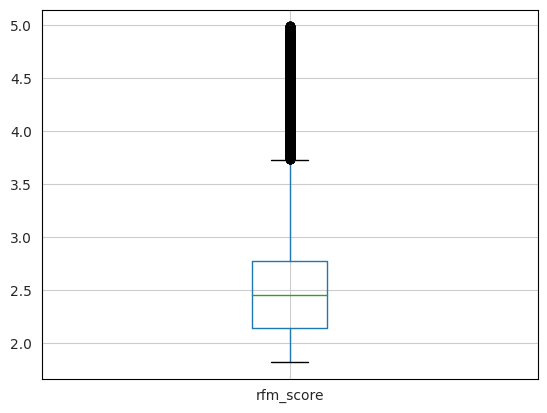

In [213]:
rfm_df.boxplot(column='rfm_score', return_type='axes')

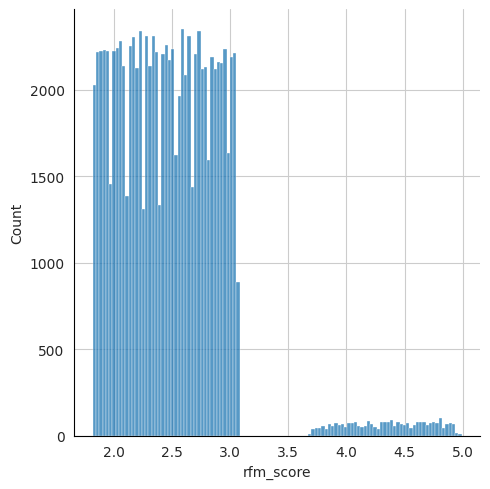

In [214]:
sns.displot(rfm_df['rfm_score'])
plt.show()

In [215]:
rfm_review = core_review.merge(rfm_df, on='customer_unique_id')
print(rfm_review.columns)

Index(['customer_unique_id', 'avg_review_score', 'min_review_score',
       'max_review_score', 'floor_avg_review', 'rfm_score', 'Recency',
       'Frequency', 'Monetary'],
      dtype='object')


In [216]:
rfm_df.isnull().sum()

customer_unique_id    0
rfm_score             0
Recency               0
Frequency             0
Monetary              0
dtype: int64

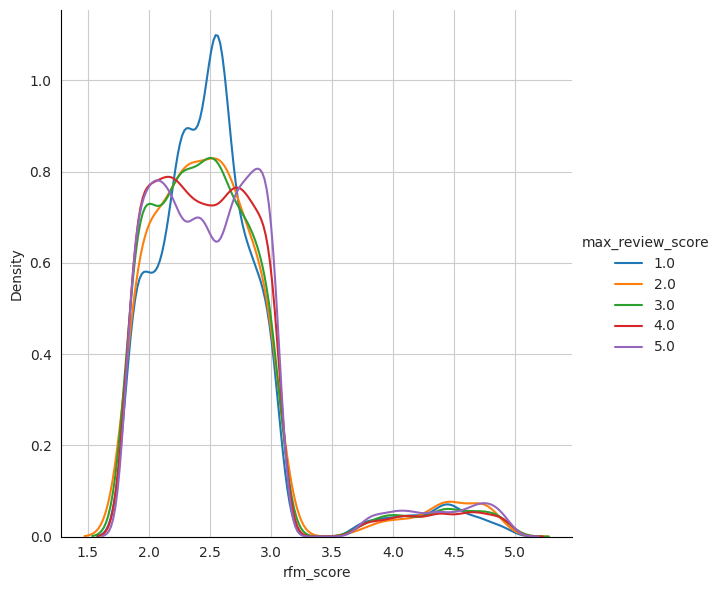

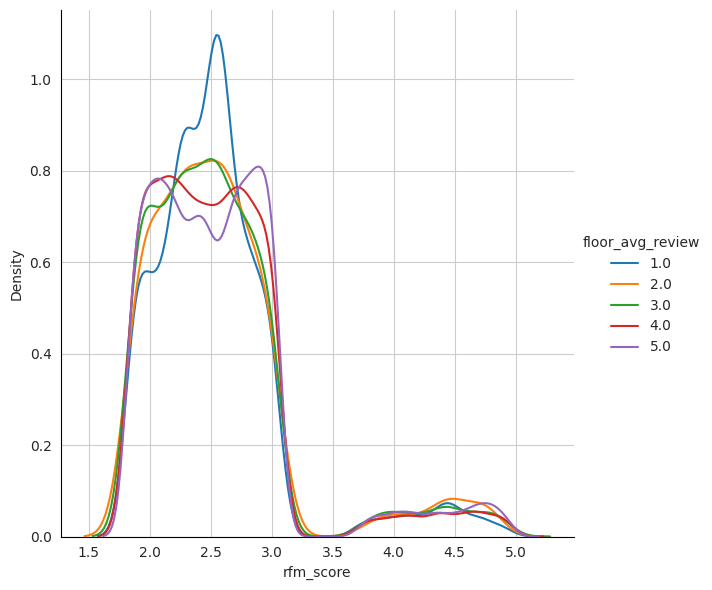

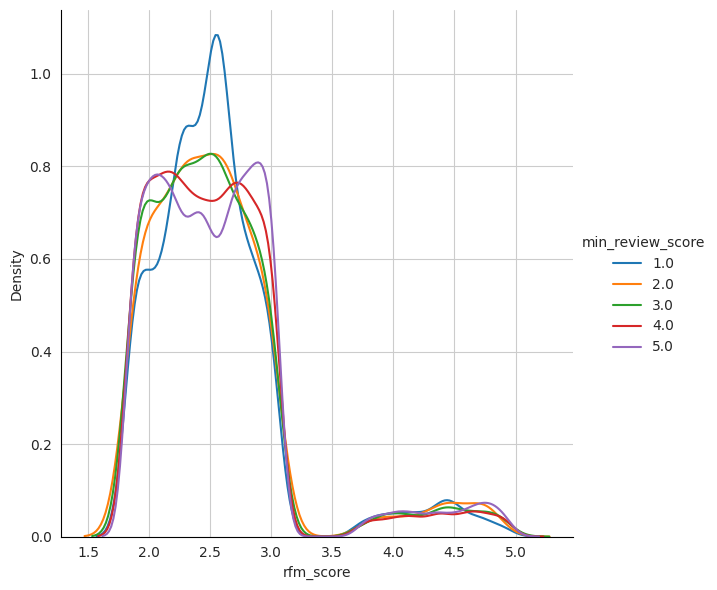

In [217]:
sns.FacetGrid(rfm_review,hue="max_review_score",height=6)\
    .map(sns.kdeplot,"rfm_score")\
    .add_legend()
sns.FacetGrid(rfm_review,hue="floor_avg_review",height=6)\
    .map(sns.kdeplot,"rfm_score")\
    .add_legend()
sns.FacetGrid(rfm_review,hue="min_review_score",height=6)\
    .map(sns.kdeplot,"rfm_score")\
    .add_legend()

RFM Scores do not form a gaussian distribution

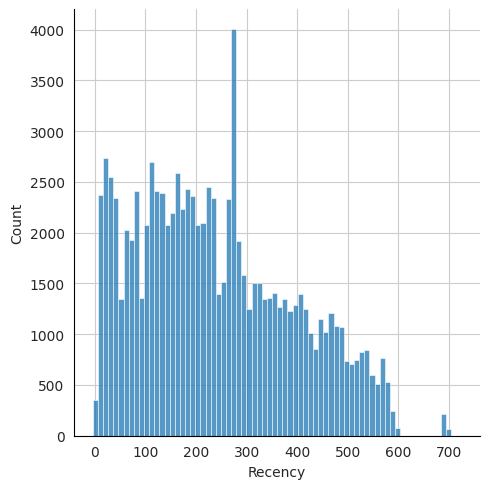

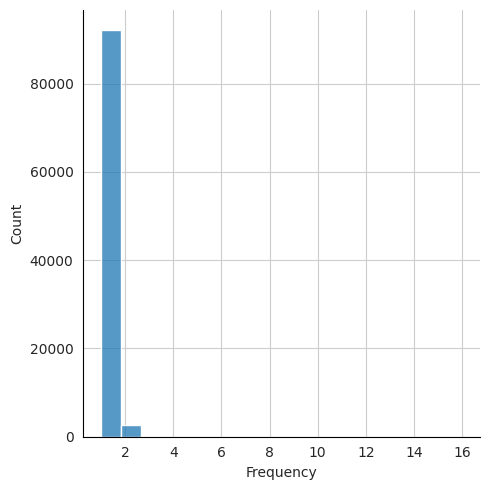

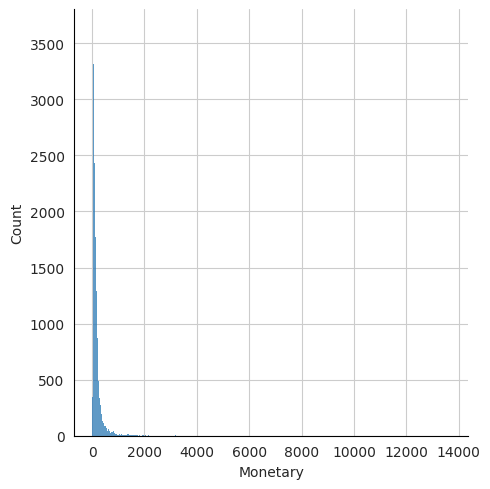

In [218]:
sns.displot(rfm_df['Recency'])
plt.show()
sns.displot(rfm_df['Frequency'])
plt.show()
sns.displot(rfm_df['Monetary'])
plt.show()
 

Frequency and Monetary are highly skewed, I will perfom log transformation on them

In [219]:
rfm_df_log = rfm_df.drop(columns=['rfm_score'])
for col in rfm_df_log.columns[2:]:
    rfm_df_log[col] = np.log10(rfm_df_log[col])

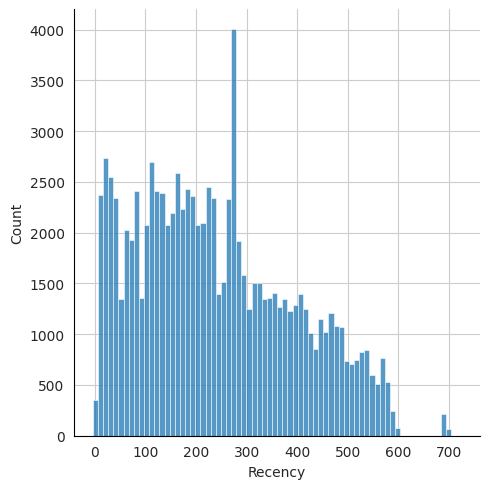

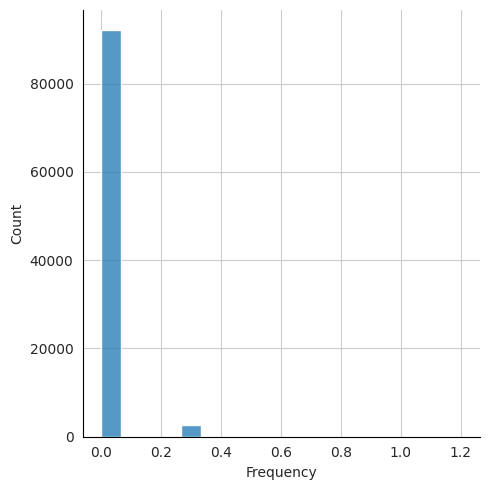

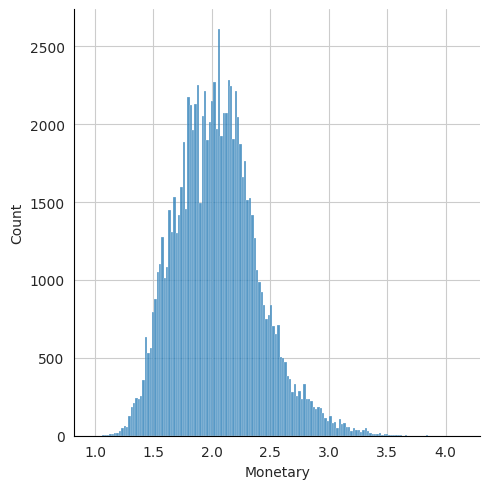

In [220]:
for col in rfm_df_log.columns[1:]:
    sns.displot(rfm_df_log[col])
    plt.show()

In [221]:
print(rfm_df_log.describe())
print(rfm_df_log.info())

            Recency     Frequency      Monetary
count  94983.000000  94983.000000  94983.000000
mean     239.334197      0.009687      2.049526
std      152.984601      0.055877      0.355025
min       -4.000000      0.000000      0.981819
25%      115.000000      0.000000      1.800029
50%      220.000000      0.000000      2.033021
75%      348.000000      0.000000      2.262285
max      725.000000      1.204120      4.135580
<class 'pandas.core.frame.DataFrame'>
Int64Index: 94983 entries, 0 to 94982
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   customer_unique_id  94983 non-null  object 
 1   Recency             94983 non-null  int64  
 2   Frequency           94983 non-null  float64
 3   Monetary            94983 non-null  float64
dtypes: float64(2), int64(1), object(1)
memory usage: 3.6+ MB
None


In [222]:
scaler = StandardScaler()
numerical = rfm_df_log.select_dtypes(include=['float64', 'int64']).columns
rfm_df_log.loc[:,numerical] = scaler.fit_transform(rfm_df_log.loc[:,numerical])
print(numerical)

Index(['Recency', 'Frequency', 'Monetary'], dtype='object')


In [223]:
#https://realpython.com/k-means-clustering-python/
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(rfm_df_log.loc[:,numerical])
    distortions.append(kmeanModel.inertia_)

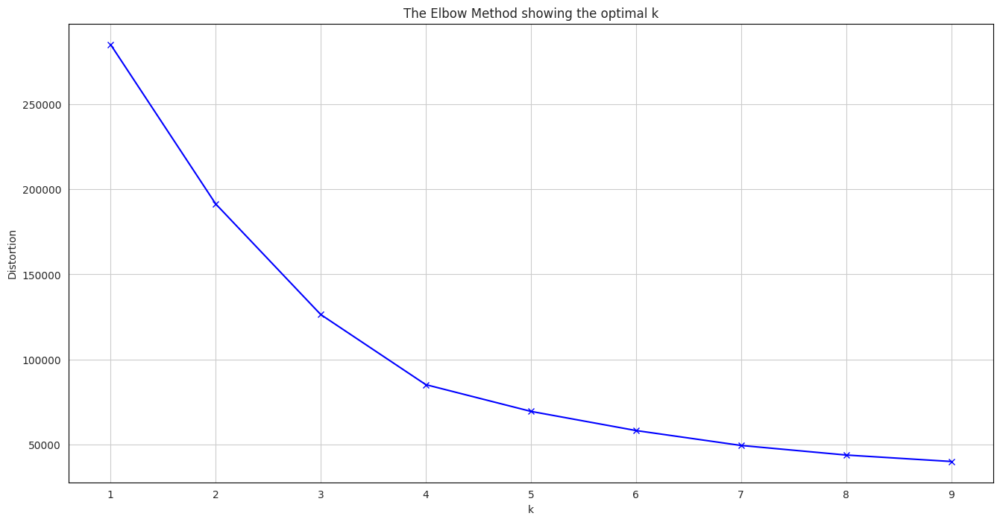

In [224]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [225]:
kmean_model = KMeans(n_clusters=4, random_state=5)
kmean_y = kmean_model.fit_predict(rfm_df_log.loc[:,numerical])
# Add labels to df
rfm_df['Cluster'] = kmean_model.labels_

In [226]:
rfm_df.groupby(['Cluster']).agg({'Recency':'mean', 'Frequency':'mean', 'Monetary':['mean', 'count']})

Recency Frequency    Monetary       
               mean      mean        mean  count
Cluster                                         
0        426.733953  1.000000  119.268470  27544
1        148.010741  1.000000   69.266333  36215
2        222.445791  2.113959  308.353034   2887
3        175.611744  1.000000  319.430456  28337

Cluster 2: Loyal Customers, the frequency of their orders is greater than others and the value of their orders is high.

Cluster 1: New Customers, they have the lowest recency and the value of their orders is the lowest.

Cluster 3: High Value Customers, they have the highest value of orders and their recency comes next.

Cluster 0: Lost Customers, they have the highest recency and their monetary value is revalitvely low.

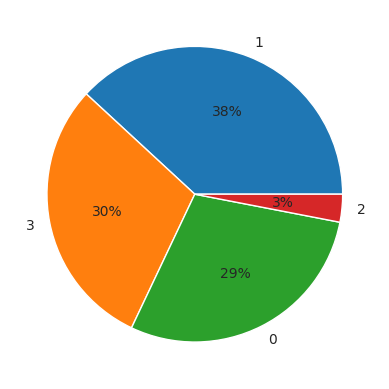

In [227]:

plt.pie(rfm_df.Cluster.value_counts(),
        labels=rfm_df.Cluster.value_counts().index,
        autopct='%.0f%%')
plt.show()

Number of customers in descening order: New Customers (Highest), High Value Customers and Lost customers (almost equal) then loyal customers (lowest).

In [228]:
rfm_df = rfm_df[["customer_unique_id", "Cluster"]]
rfmDF=spark.createDataFrame(rfm_df) 
rfmDF.printSchema()
rfmDF.show()

root
 |-- customer_unique_id: string (nullable = true)
 |-- Cluster: long (nullable = true)

+--------------------+-------+
|  customer_unique_id|Cluster|
+--------------------+-------+
|0000366f3b9a7992b...|      3|
|0000b849f77a49e4a...|      1|
|0000f46a3911fa3c0...|      0|
|0000f6ccb0745a6a4...|      0|
|0004aac84e0df4da2...|      3|
|0004bd2a26a76fe21...|      3|
|00050ab1314c0e55a...|      1|
|00053a61a98854899...|      3|
|0005e1862207bf6cc...|      0|
|0005ef4cd20d2893f...|      3|
|0006fdc98a402fceb...|      0|
|00082cbe03e478190...|      0|
|00090324bbad0e934...|      1|
|000949456b182f53c...|      1|
|000a5ad9c4601d2bb...|      0|
|000bfa1d2f1a41876...|      0|
|000c8bdb58a29e711...|      1|
|000d460961d6dbfa3...|      1|
|000de6019bb59f34c...|      0|
|000e309254ab1fc5b...|      1|
+--------------------+-------+
only showing top 20 rows



In [229]:
#from pyspark.sql.types import StringType

#rfmDF = rfmDF.withColumn("Cluster", rfmDF["Cluster"].cast(StringType()))

In [230]:
rfmDF_segments= rfmDF.withColumn("customer_segment", when(rfmDF.Cluster == 3,"High Value Customers")
                                 .when(rfmDF.Cluster == 1, "New Customers")
                                  .when(rfmDF.Cluster == 2, "Loyal Customers")
                                  .when(rfmDF.Cluster == 0, "Lost Customers")
                                   .otherwise(rfmDF.Cluster))
rfmDF_segments = rfmDF_segments.withColumnRenamed("customer_unique_id", 'CustomerUniqueId')

In [231]:
core_segments = core_freight_ratio.join(rfmDF_segments, core_freight_ratio.customer_unique_id == rfmDF_segments.CustomerUniqueId).drop("CustomerUniqueId")

In [232]:
core_segments.printSchema()

root
 |-- order_id: string (nullable = true)
 |-- order_item_id: string (nullable = true)
 |-- product_id: string (nullable = true)
 |-- seller_id: string (nullable = true)
 |-- shipping_limit_date: date (nullable = true)
 |-- price: double (nullable = true)
 |-- freight_value: double (nullable = true)
 |-- product_category_name: string (nullable = false)
 |-- product_name_lenght: integer (nullable = true)
 |-- product_description_lenght: integer (nullable = true)
 |-- product_photos_qty: integer (nullable = true)
 |-- product_weight_g: integer (nullable = true)
 |-- product_length_cm: integer (nullable = true)
 |-- product_height_cm: integer (nullable = true)
 |-- product_width_cm: integer (nullable = true)
 |-- seller_city: string (nullable = true)
 |-- seller_state: string (nullable = true)
 |-- customer_id: string (nullable = true)
 |-- order_status: string (nullable = true)
 |-- order_purchase_timestamp: date (nullable = true)
 |-- order_approved_at: date (nullable = true)
 |-- or

In [233]:
core_rfm_pd=core_segments.toPandas()


###2.3 Feature Correlation

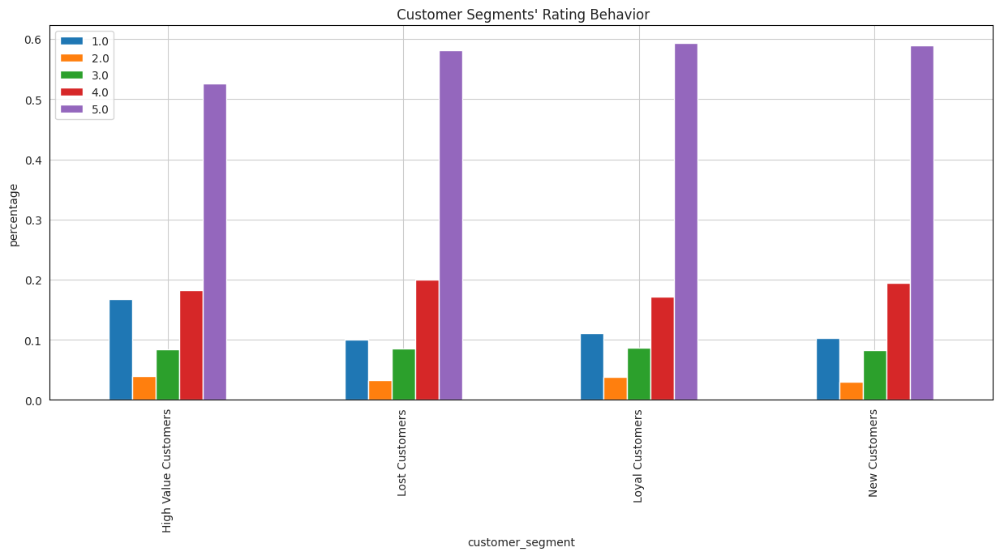

In [234]:
segments_rating = core_rfm_pd.groupby("customer_segment")['floor_avg_review'].value_counts(normalize=True)
segments_rating.unstack().plot.bar(figsize=(15,6)).legend(loc="best")
plt.ylabel("percentage")
plt.title(" Customer Segments' Rating Behavior")
plt.show()

In [235]:
segments_rating.unstack()

floor_avg_review,1.0,2.0,3.0,4.0,5.0
customer_segment,,,,,
High Value Customers,0.167550,0.039455,0.084156,0.183005,0.525833
Lost Customers,0.100079,0.033195,0.086111,0.199402,0.581213
Loyal Customers,0.110597,0.038137,0.087034,0.171479,0.592754
New Customers,0.102530,0.030408,0.082688,0.195178,0.589196


>_In all segments: > 50 % of customers give rating 5._

>_Lost Customers: Customers who give rating 1 are relatively higher than the other segments._

>_In all segments: nearly 20% of customer give rating 4._

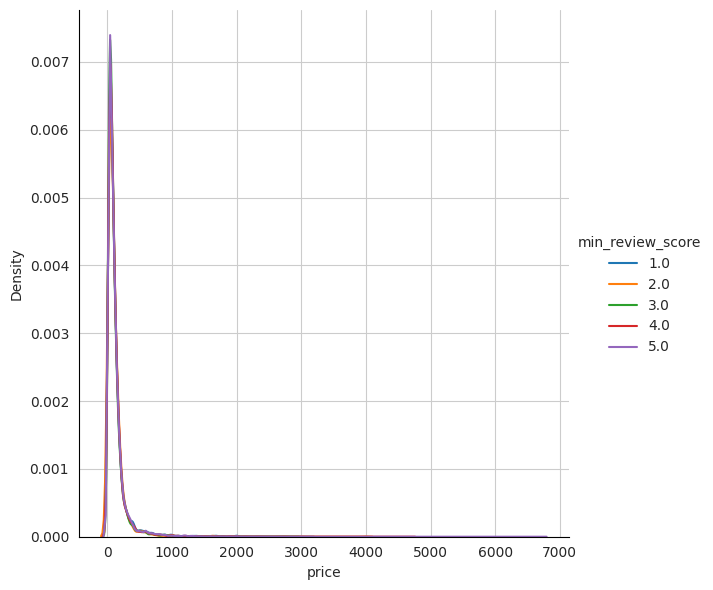

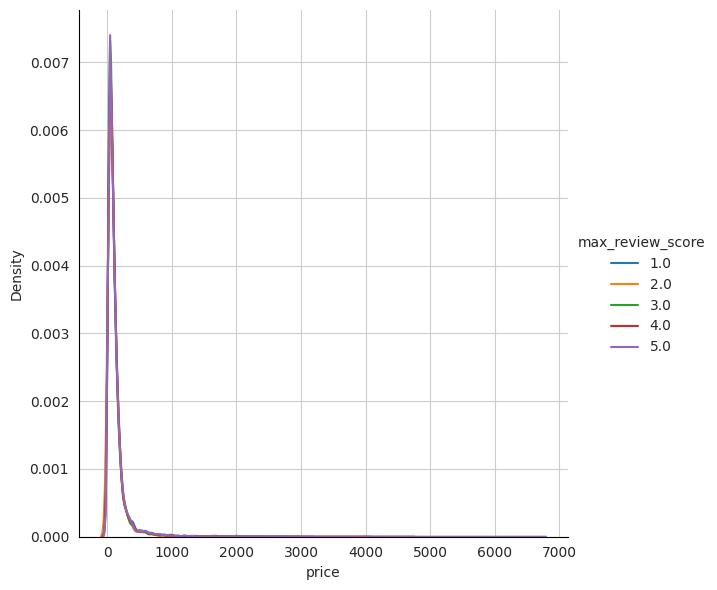

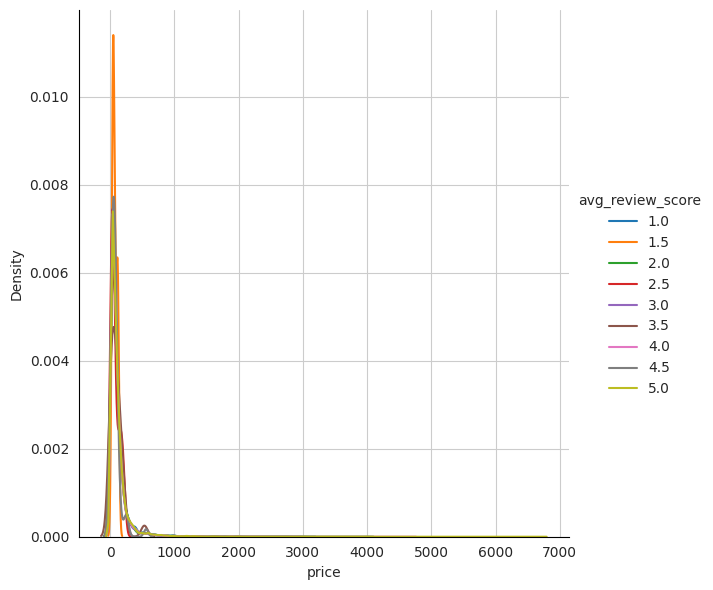

In [236]:
sns.FacetGrid(core_rfm_pd,hue="min_review_score",height=6)\
    .map(sns.kdeplot,"price")\
    .add_legend()
sns.FacetGrid(core_rfm_pd,hue="max_review_score",height=6)\
    .map(sns.kdeplot,"price")\
    .add_legend()
sns.FacetGrid(core_rfm_pd,hue="avg_review_score",height=6)\
    .map(sns.kdeplot,"price")\
    .add_legend()

>_Prices are right skewed and overlapped in all ratings._

In [237]:
core_rating_1=core_rfm_pd[core_rfm_pd['avg_review_score']==1]
core_rating_15=core_rfm_pd[core_rfm_pd['avg_review_score']==1.5]
core_rating_2=core_rfm_pd[core_rfm_pd['avg_review_score']==2]
core_rating_3=core_rfm_pd[core_rfm_pd['avg_review_score']==3]
core_rating_4=core_rfm_pd[core_rfm_pd['avg_review_score']==4]
core_rating_5=core_rfm_pd[core_rfm_pd['avg_review_score']==5]

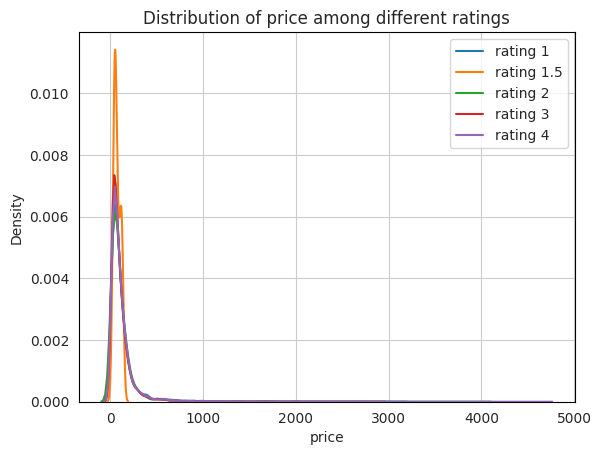

In [238]:
sns.kdeplot(core_rating_1["price"], label="rating 1")
sns.kdeplot(core_rating_15["price"], label="rating 1.5")
sns.kdeplot(core_rating_2["price"], label="rating 2")
sns.kdeplot(core_rating_3["price"], label="rating 3")
sns.kdeplot(core_rating_4["price"], label="rating 4")

plt.title("Distribution of price among different ratings")
plt.legend()
plt.show()

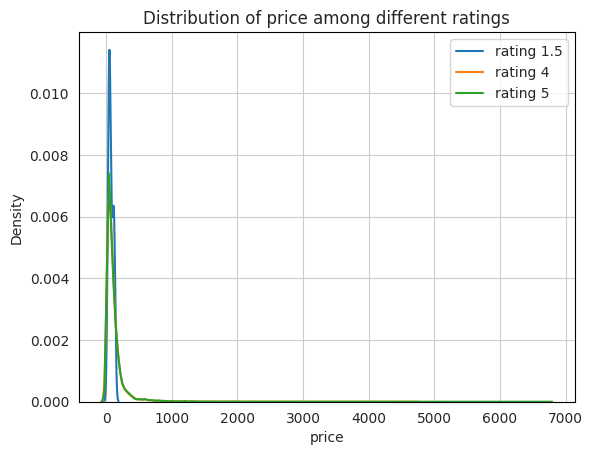

In [239]:
sns.kdeplot(core_rating_15["price"], label="rating 1.5")
sns.kdeplot(core_rating_4["price"], label="rating 4")
sns.kdeplot(core_rating_5["price"], label="rating 5")

plt.title("Distribution of price among different ratings")
plt.legend()
plt.show()


50th percentile 
 avg_review_score
1.0    75.00
1.5    53.90
2.0    74.90
2.5    58.90
3.0    69.99
3.5    69.90
4.0    75.00
4.5    66.90
5.0    74.99
Name: price, dtype: float64
****************************************
75th percentile 
 avg_review_score
1.0    137.9000
1.5    110.9750
2.0    134.0000
2.5    124.9000
3.0    129.0000
3.5    129.3400
4.0    131.7375
4.5     89.9225
5.0    135.0000
Name: price, dtype: float64
****************************************
25th percentile 
 avg_review_score
1.0    39.990
1.5    50.710
2.0    39.900
2.5    24.900
3.0    39.000
3.5    31.450
4.0    39.900
4.5    35.675
5.0    39.900
Name: price, dtype: float64
****************************************
Mean 
 avg_review_score
1.0    126.130778
1.5     73.837778
2.0    115.853662
2.5     79.075556
3.0    109.773330
3.5     98.637419
4.0    118.825495
4.5     78.283088
5.0    121.420353
Name: price, dtype: float64


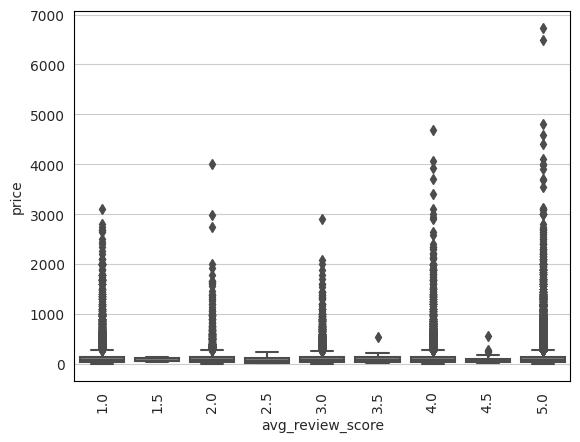

In [240]:
sns.boxplot(y="price",x="avg_review_score",data=core_rfm_pd,color=sns.color_palette()[7])
plt.xticks(rotation=90)


lst=[50,75,25]    #let us check these percentile values
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("avg_review_score")["price"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)
    
print("Mean \n",core_rfm_pd.groupby("avg_review_score")["price"].mean())

>_Products with review_score 3 have lower price compared to other scores but not so significant._

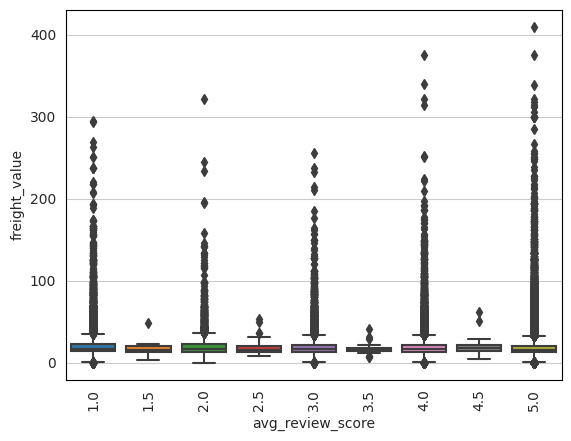

Mean 
 floor_avg_review
1.0    21.298833
2.0    20.946997
3.0    20.289196
4.0    20.057068
5.0    19.581250
Name: freight_value, dtype: float64
50th percentile 
 floor_avg_review
1.0    16.92
2.0    16.47
3.0    16.51
4.0    16.36
5.0    16.11
Name: freight_value, dtype: float64
****************************************
75th percentile 
 floor_avg_review
1.0    22.51
2.0    22.30
3.0    21.58
4.0    21.43
5.0    20.63
Name: freight_value, dtype: float64
****************************************
25th percentile 
 floor_avg_review
1.0    13.85
2.0    13.28
3.0    13.46
4.0    13.37
5.0    12.82
Name: freight_value, dtype: float64
****************************************


In [241]:
sns.boxplot(y="freight_value",x="avg_review_score",data=core_rfm_pd)
plt.xticks(rotation=90)
plt.show()


print("Mean \n",core_rfm_pd.groupby("floor_avg_review")["freight_value"].mean())
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("floor_avg_review")["freight_value"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)
    

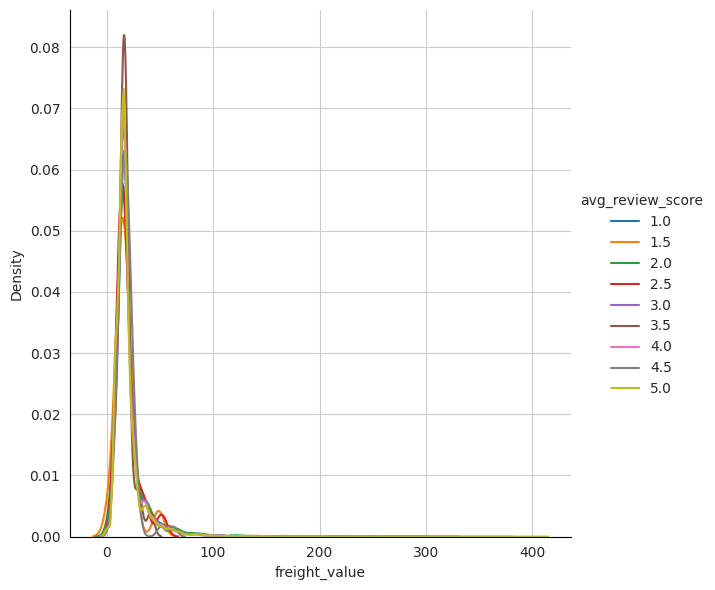

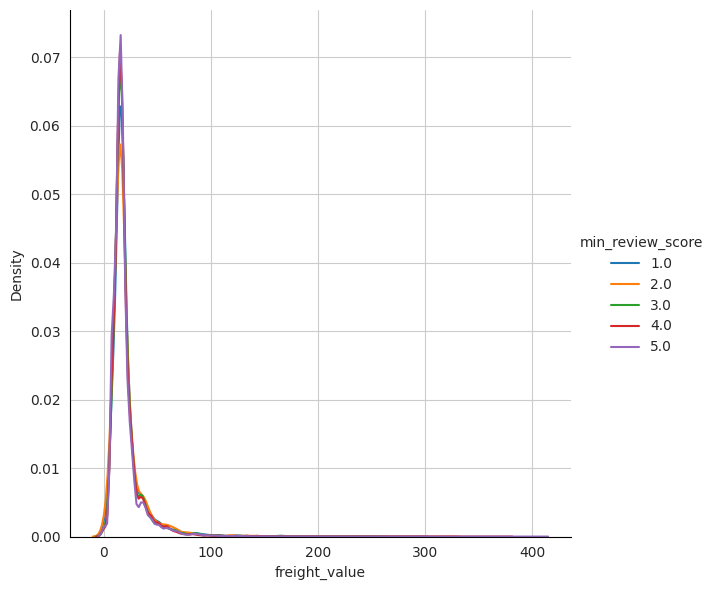

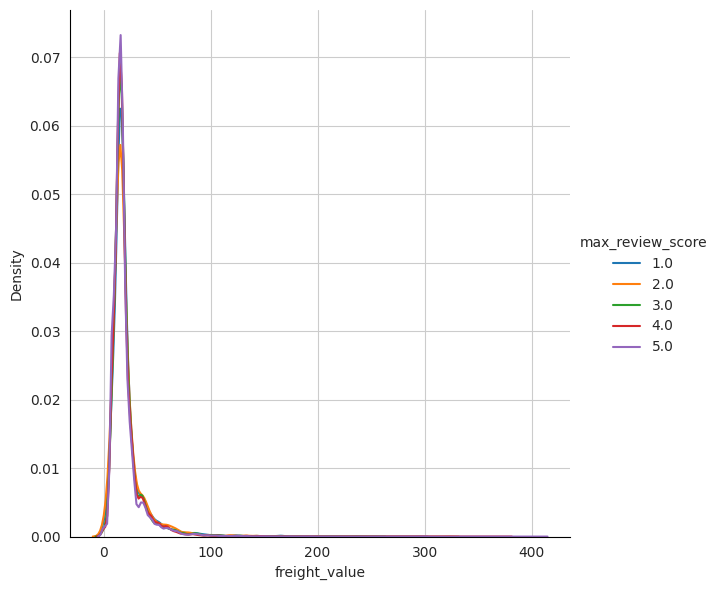

In [242]:
sns.FacetGrid(core_rfm_pd,hue="avg_review_score",height=6)\
    .map(sns.kdeplot,"freight_value")\
    .add_legend()
plt.show()

sns.FacetGrid(core_rfm_pd,hue="min_review_score",height=6)\
    .map(sns.kdeplot,"freight_value")\
    .add_legend()
plt.show()

sns.FacetGrid(core_rfm_pd,hue="max_review_score",height=6)\
    .map(sns.kdeplot,"freight_value")\
    .add_legend()
plt.show()

>_Review score 5 freight values have lower mean compared to other scores but not so significant._

In [243]:
aux = core_rfm_pd[['feedback', 'freight_value']].groupby('feedback').mean().reset_index()
print(aux)

negative = aux.iloc[0,1]
positive = aux.iloc[1,1]
percentage = ((negative - positive) / positive)*100
percentage 
print(f'\n Negative review scores have a freight value {percentage:.2f}% more expensive than positive review scores.')



       feedback  freight_value
0             0      20.900923
1             1      19.700169
2  not_reviewed      20.174724

 Negative review scores have a freight value 6.10% more expensive than positive review scores.


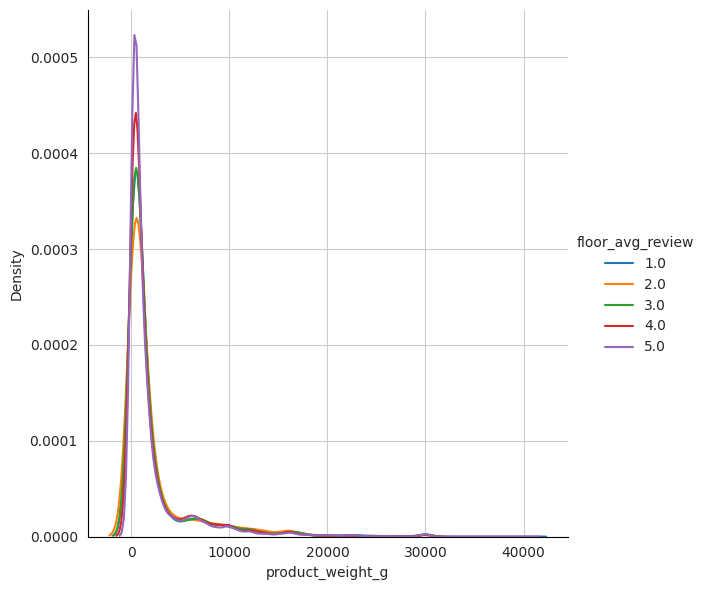

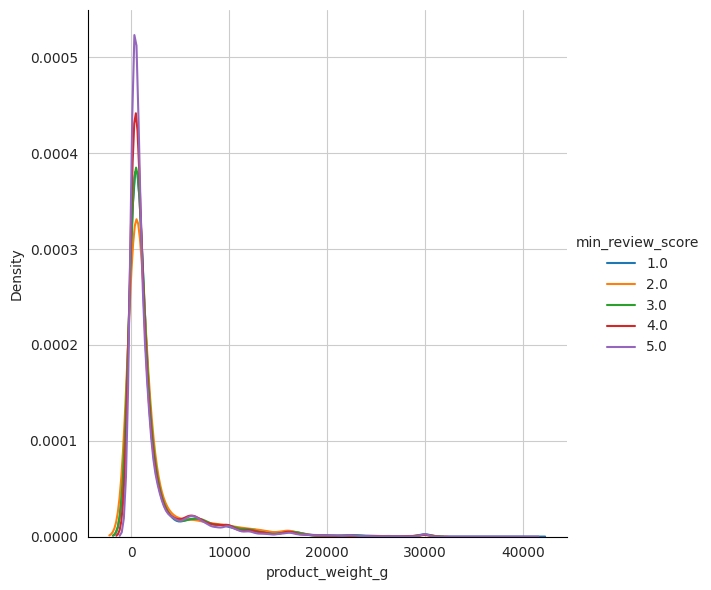

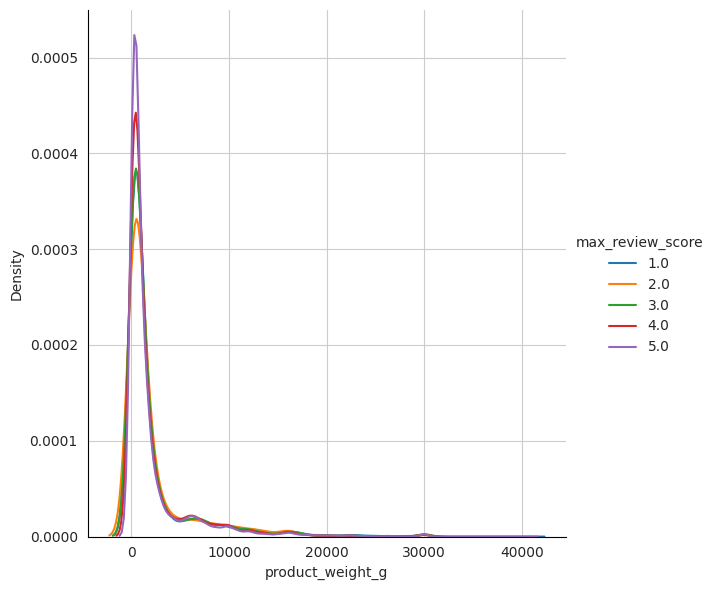

Mean 
 floor_avg_review
1.0    2316.237636
2.0    2283.059068
3.0    2199.884874
4.0    2128.011356
5.0    2004.060500
Name: product_weight_g, dtype: float64
50th percentile 
 min_review_score
1.0    750.0
2.0    710.0
3.0    700.0
4.0    700.0
5.0    650.0
Name: product_weight_g, dtype: float64
****************************************
75th percentile 
 min_review_score
1.0    1850.0
2.0    1950.0
3.0    1825.0
4.0    1850.0
5.0    1750.0
Name: product_weight_g, dtype: float64
****************************************
25th percentile 
 min_review_score
1.0    300.0
2.0    300.0
3.0    300.0
4.0    300.0
5.0    300.0
Name: product_weight_g, dtype: float64
****************************************
50th percentile 
 max_review_score
1.0    750.0
2.0    702.0
3.0    700.0
4.0    700.0
5.0    650.0
Name: product_weight_g, dtype: float64
****************************************
75th percentile 
 max_review_score
1.0    1850.0
2.0    1900.0
3.0    1825.0
4.0    1850.0
5.0    1750.0
Name: produc

In [244]:
sns.FacetGrid(core_rfm_pd,hue="floor_avg_review",height=6)\
    .map(sns.kdeplot,"product_weight_g")\
    .add_legend()
plt.show()

sns.FacetGrid(core_rfm_pd,hue="min_review_score",height=6)\
    .map(sns.kdeplot,"product_weight_g")\
    .add_legend()
plt.show()


sns.FacetGrid(core_rfm_pd,hue="max_review_score",height=6)\
    .map(sns.kdeplot,"product_weight_g")\
    .add_legend()
plt.show()


print("Mean \n",core_rfm_pd.groupby("floor_avg_review")["product_weight_g"].mean())

lst=[50,75,25]
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("min_review_score")["product_weight_g"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("max_review_score")["product_weight_g"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)


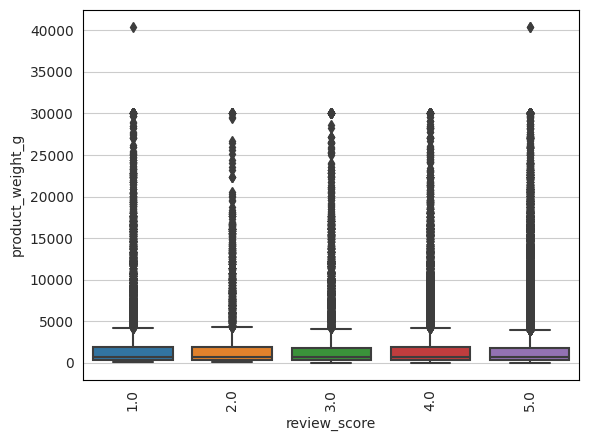

In [245]:
sns.boxplot(y="product_weight_g",x="floor_avg_review",data=core_rfm_pd)
plt.xlabel("review_score")
plt.xticks(rotation=90)
plt.show()


>_review_score 5 is higly peaked at lower values of product weight. Scores 4,3,2,1 following in a descending order._

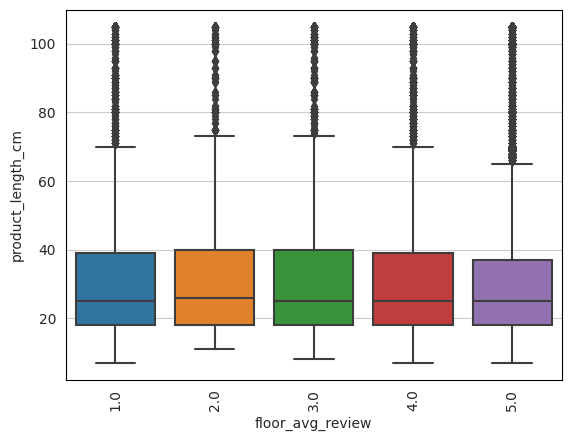

In [246]:
sns.boxplot(y="product_length_cm",x="floor_avg_review",data=core_rfm_pd)
plt.xticks(rotation=90)
plt.show()


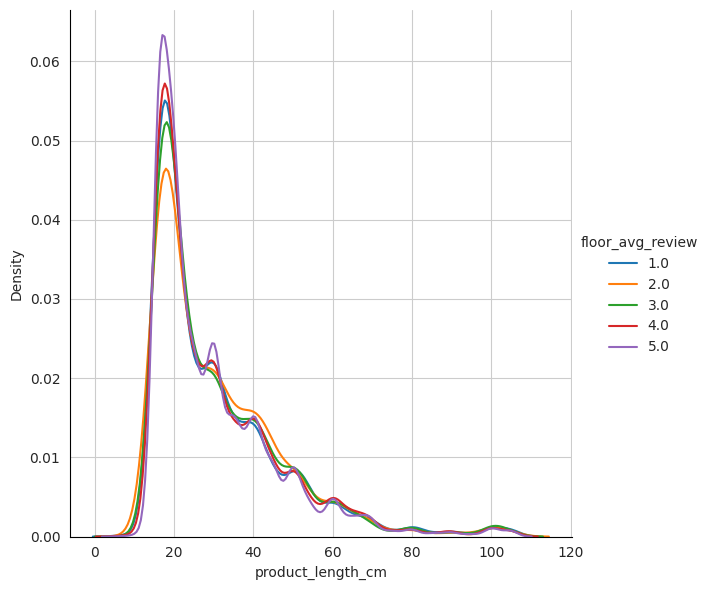

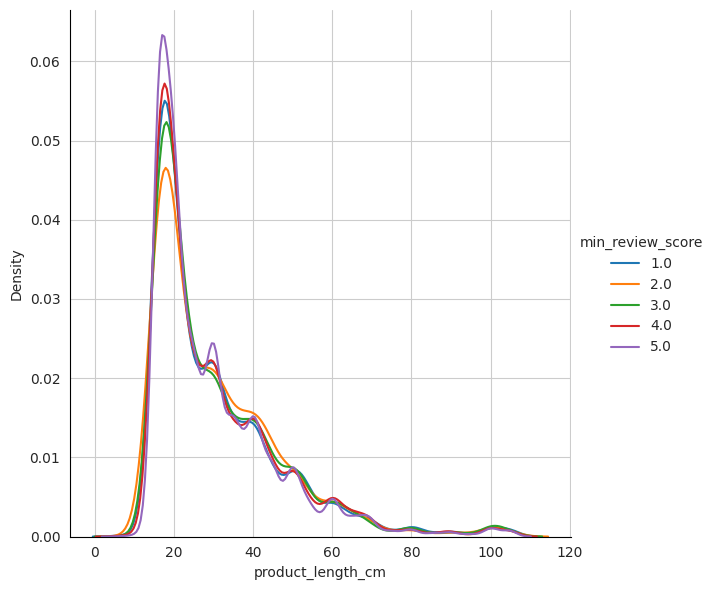

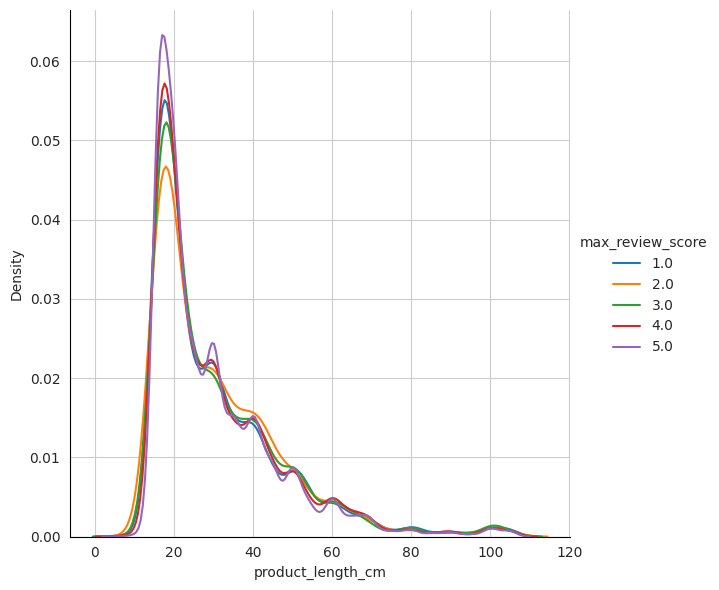

Mean 
 floor_avg_review
1.0    30.554606
2.0    31.039032
3.0    30.779341
4.0    30.459288
5.0    29.800416
Name: product_length_cm, dtype: float64
50th percentile 
 min_review_score
1.0    25.0
2.0    26.0
3.0    25.0
4.0    25.0
5.0    25.0
Name: product_length_cm, dtype: float64
****************************************
75th percentile 
 min_review_score
1.0    39.0
2.0    40.0
3.0    40.0
4.0    39.0
5.0    37.0
Name: product_length_cm, dtype: float64
****************************************
25th percentile 
 min_review_score
1.0    18.0
2.0    18.0
3.0    18.0
4.0    18.0
5.0    18.0
Name: product_length_cm, dtype: float64
****************************************
50th percentile 
 max_review_score
1.0    25.0
2.0    26.0
3.0    25.0
4.0    25.0
5.0    25.0
Name: product_length_cm, dtype: float64
****************************************
75th percentile 
 max_review_score
1.0    39.0
2.0    40.0
3.0    40.0
4.0    39.0
5.0    37.0
Name: product_length_cm, dtype: float64
************

In [247]:
sns.FacetGrid(core_rfm_pd,hue="floor_avg_review",height=6)\
    .map(sns.kdeplot,"product_length_cm")\
    .add_legend()
plt.show()

sns.FacetGrid(core_rfm_pd,hue="min_review_score",height=6)\
    .map(sns.kdeplot,"product_length_cm")\
    .add_legend()
plt.show()


sns.FacetGrid(core_rfm_pd,hue="max_review_score",height=6)\
    .map(sns.kdeplot,"product_length_cm")\
    .add_legend()
plt.show()


print("Mean \n",core_rfm_pd.groupby("floor_avg_review")["product_length_cm"].mean())
lst=[50,75,25]
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("min_review_score")["product_length_cm"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("max_review_score")["product_length_cm"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("avg_review_score")["product_length_cm"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)

>_review_score 5 is higly peaked at lower values of product length._ 

>_All the values are almost the same._

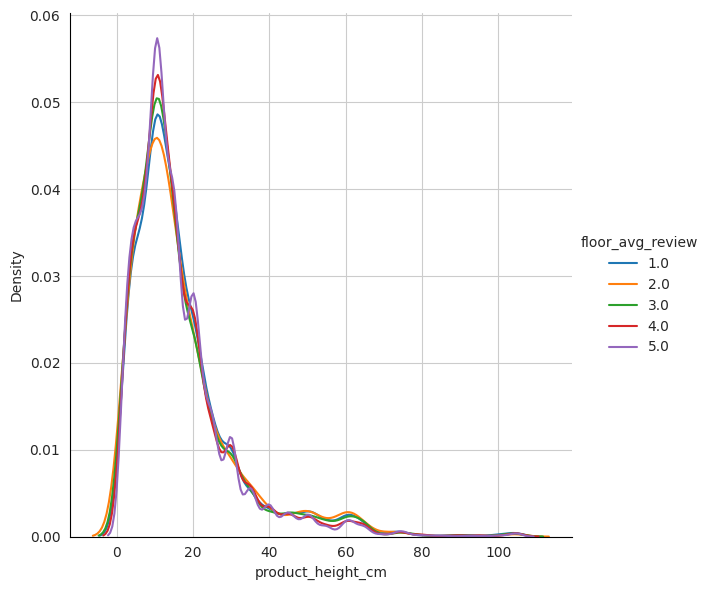

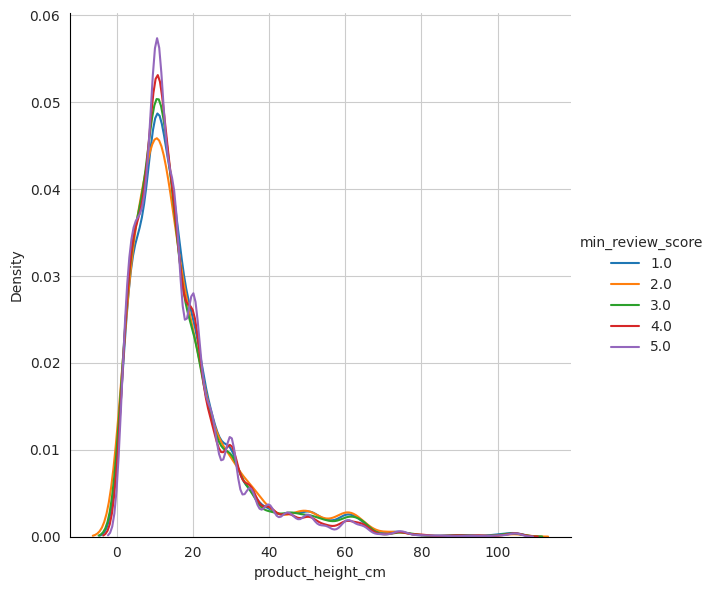

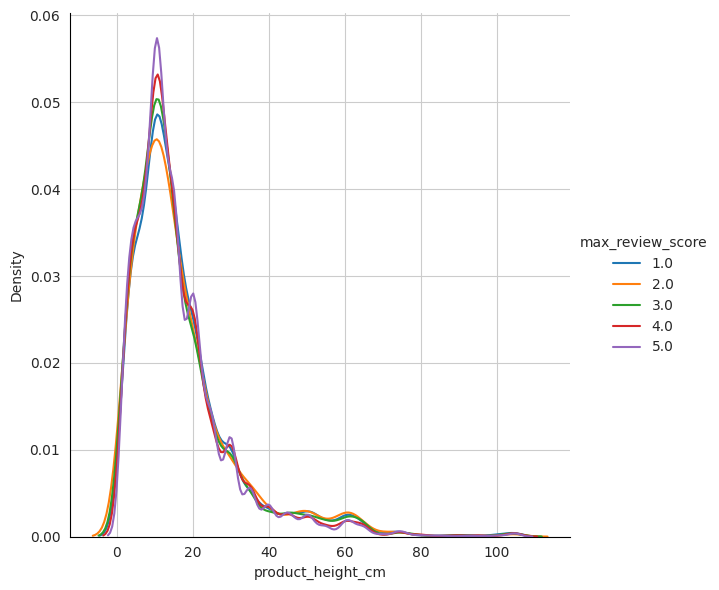

Mean 
 floor_avg_review
1.0    17.409015
2.0    17.109810
3.0    16.765910
4.0    16.592593
5.0    16.330103
Name: product_height_cm, dtype: float64
50th percentile 
 min_review_score
1.0    14.0
2.0    13.0
3.0    13.0
4.0    13.0
5.0    13.0
Name: product_height_cm, dtype: float64
****************************************
75th percentile 
 min_review_score
1.0    21.0
2.0    21.0
3.0    20.0
4.0    20.0
5.0    20.0
Name: product_height_cm, dtype: float64
****************************************
25th percentile 
 min_review_score
1.0    9.0
2.0    8.0
3.0    8.0
4.0    8.0
5.0    8.0
Name: product_height_cm, dtype: float64
****************************************
50th percentile 
 max_review_score
1.0    14.0
2.0    13.0
3.0    13.0
4.0    13.0
5.0    13.0
Name: product_height_cm, dtype: float64
****************************************
75th percentile 
 max_review_score
1.0    21.0
2.0    21.0
3.0    20.0
4.0    20.0
5.0    20.0
Name: product_height_cm, dtype: float64
*****************

In [248]:
sns.FacetGrid(core_rfm_pd,hue="floor_avg_review",height=6)\
    .map(sns.kdeplot,"product_height_cm")\
    .add_legend()
plt.show()
sns.FacetGrid(core_rfm_pd,hue="min_review_score",height=6)\
    .map(sns.kdeplot,"product_height_cm")\
    .add_legend()
plt.show()
sns.FacetGrid(core_rfm_pd,hue="max_review_score",height=6)\
    .map(sns.kdeplot,"product_height_cm")\
    .add_legend()
plt.show()
print("Mean \n",core_rfm_pd.groupby("floor_avg_review")["product_height_cm"].mean())
lst=[50,75,25]
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("min_review_score")["product_height_cm"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("max_review_score")["product_height_cm"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("avg_review_score")["product_height_cm"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)

>_Mean and percentile values for product_height_cm in all ratings are almost the same._

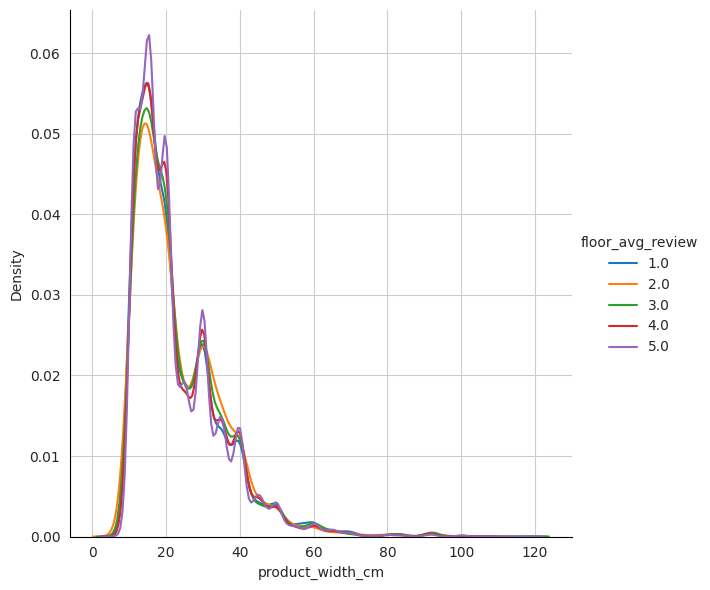

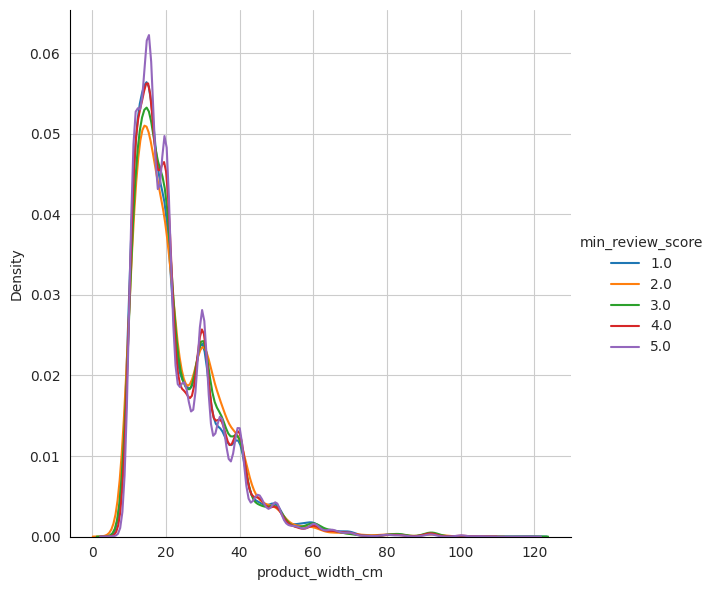

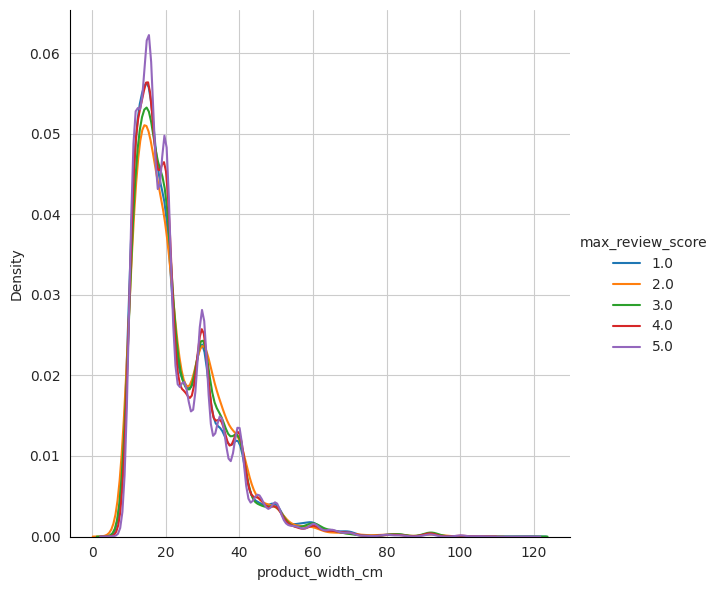

Mean 
 floor_avg_review
1.0    23.088173
2.0    23.533437
3.0    23.387699
4.0    23.076100
5.0    22.850875
Name: product_width_cm, dtype: float64
50th percentile 
 min_review_score
1.0    20.0
2.0    20.0
3.0    20.0
4.0    20.0
5.0    20.0
Name: product_width_cm, dtype: float64
****************************************
75th percentile 
 min_review_score
1.0    30.0
2.0    30.0
3.0    30.0
4.0    30.0
5.0    30.0
Name: product_width_cm, dtype: float64
****************************************
25th percentile 
 min_review_score
1.0    15.0
2.0    15.0
3.0    15.0
4.0    15.0
5.0    15.0
Name: product_width_cm, dtype: float64
****************************************
50th percentile 
 max_review_score
1.0    20.0
2.0    20.0
3.0    20.0
4.0    20.0
5.0    20.0
Name: product_width_cm, dtype: float64
****************************************
75th percentile 
 max_review_score
1.0    30.0
2.0    30.0
3.0    30.0
4.0    30.0
5.0    30.0
Name: product_width_cm, dtype: float64
******************

In [249]:
sns.FacetGrid(core_rfm_pd,hue="floor_avg_review",height=6)\
    .map(sns.kdeplot,"product_width_cm")\
    .add_legend()
plt.show()
sns.FacetGrid(core_rfm_pd,hue="min_review_score",height=6)\
    .map(sns.kdeplot,"product_width_cm")\
    .add_legend()
plt.show()
sns.FacetGrid(core_rfm_pd,hue="max_review_score",height=6)\
    .map(sns.kdeplot,"product_width_cm")\
    .add_legend()
plt.show()
print("Mean \n",core_rfm_pd.groupby("floor_avg_review")["product_width_cm"].mean())
lst=[50,75,25]
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("min_review_score")["product_width_cm"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("max_review_score")["product_width_cm"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("avg_review_score")["product_width_cm"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)

>_Density of review_score 2 is higher w.r.t product_width_cm from 30cm to 40cm._

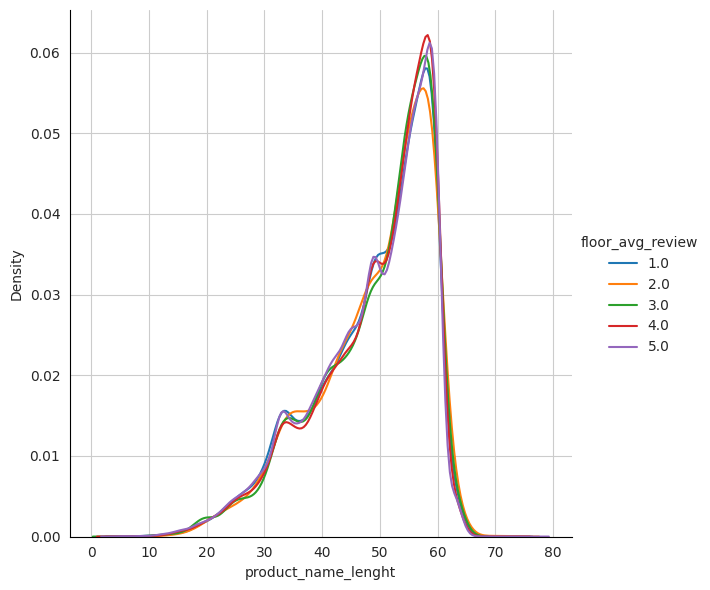

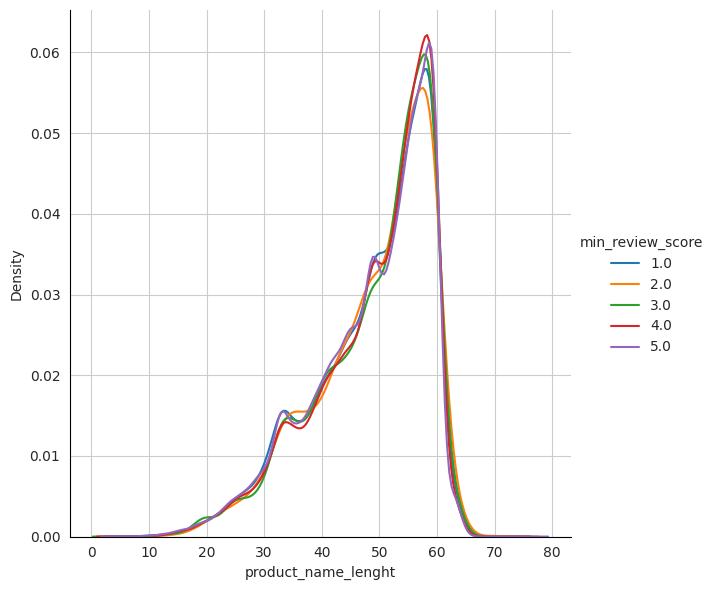

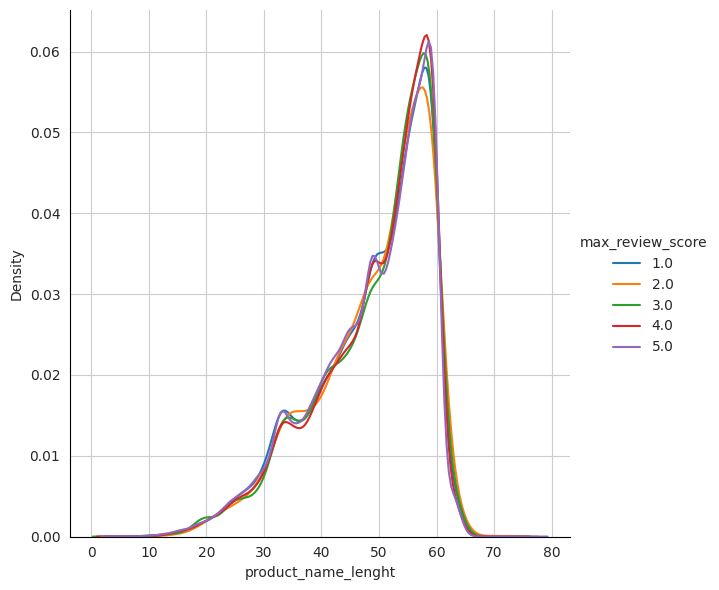

Mean 
 floor_avg_review
1.0    48.756447
2.0    49.057507
3.0    49.127918
4.0    49.110781
5.0    48.627830
Name: product_name_lenght, dtype: float64
50th percentile 
 min_review_score
1.0    51.0
2.0    52.0
3.0    52.0
4.0    52.0
5.0    51.0
Name: product_name_lenght, dtype: float64
****************************************
75th percentile 
 min_review_score
1.0    57.0
2.0    57.0
3.0    57.0
4.0    57.0
5.0    57.0
Name: product_name_lenght, dtype: float64
****************************************
25th percentile 
 min_review_score
1.0    43.0
2.0    43.0
3.0    43.0
4.0    43.0
5.0    42.0
Name: product_name_lenght, dtype: float64
****************************************
50th percentile 
 max_review_score
1.0    51.0
2.0    52.0
3.0    52.0
4.0    52.0
5.0    51.0
Name: product_name_lenght, dtype: float64
****************************************
75th percentile 
 max_review_score
1.0    57.0
2.0    57.0
3.0    57.0
4.0    57.0
5.0    57.0
Name: product_name_lenght, dtype: float64


In [250]:
sns.FacetGrid(core_rfm_pd,hue="floor_avg_review",height=6)\
    .map(sns.kdeplot,"product_name_lenght")\
    .add_legend()
plt.show()
sns.FacetGrid(core_rfm_pd,hue="min_review_score",height=6)\
    .map(sns.kdeplot,"product_name_lenght")\
    .add_legend()
plt.show()
sns.FacetGrid(core_rfm_pd,hue="max_review_score",height=6)\
    .map(sns.kdeplot,"product_name_lenght")\
    .add_legend()
plt.show()
print("Mean \n",core_rfm_pd.groupby("floor_avg_review")["product_name_lenght"].mean())
lst=[50,75,25]
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("min_review_score")["product_name_lenght"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("max_review_score")["product_name_lenght"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("avg_review_score")["product_name_lenght"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)

>_Distributions are similar in all ratings._

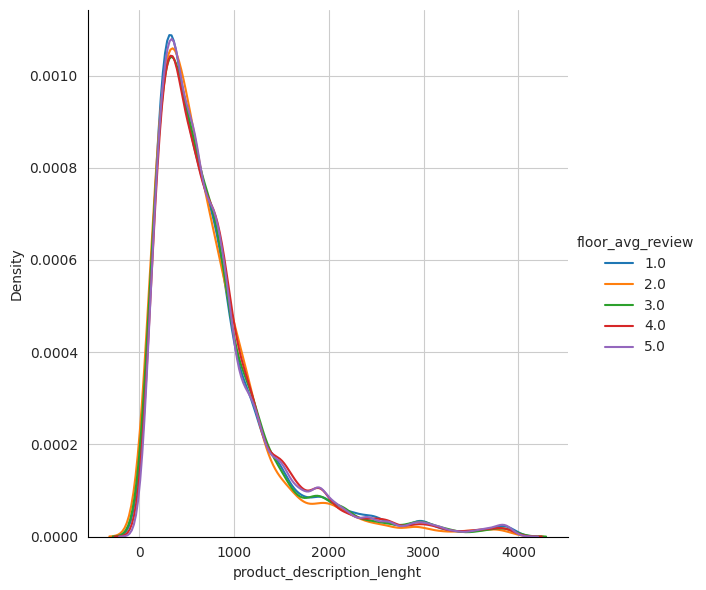

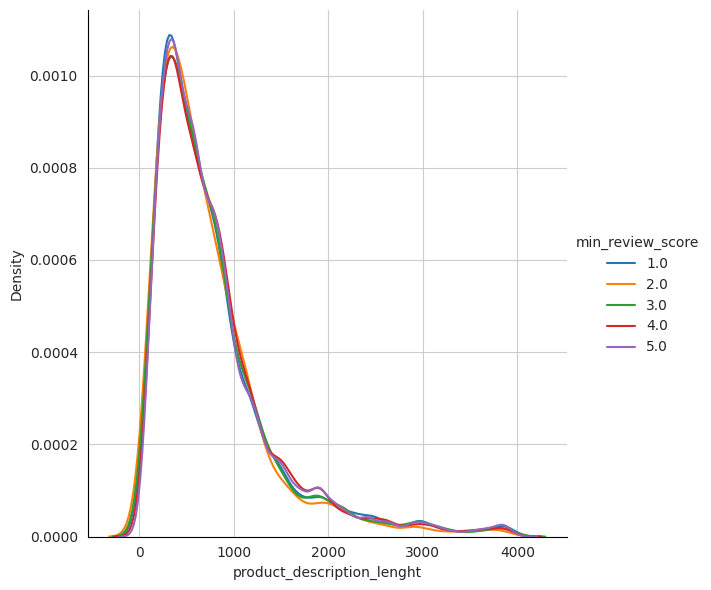

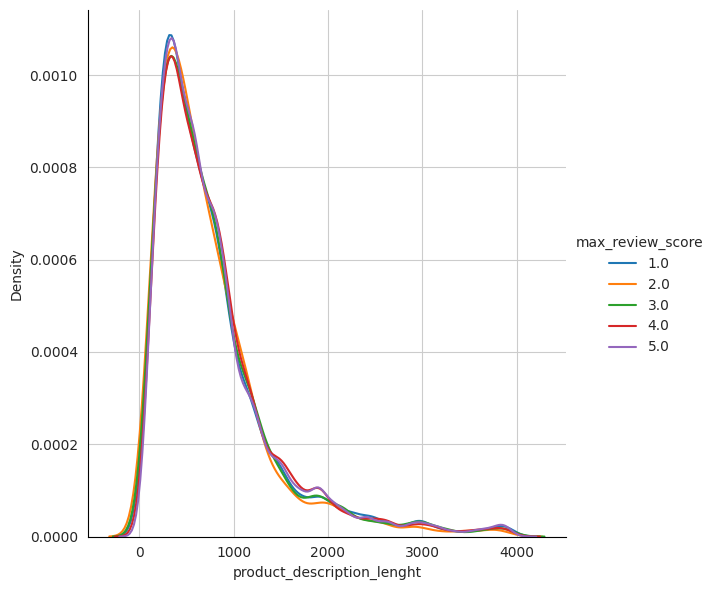

Mean 
 floor_avg_review
1.0    778.216670
2.0    735.364559
3.0    771.659311
4.0    793.565121
5.0    793.608652
Name: product_description_lenght, dtype: float64
50th percentile 
 min_review_score
1.0    600.0
2.0    577.5
3.0    599.0
4.0    619.0
5.0    613.0
Name: product_description_lenght, dtype: float64
****************************************
75th percentile 
 min_review_score
1.0    956.0
2.0    935.0
3.0    961.0
4.0    995.0
5.0    982.0
Name: product_description_lenght, dtype: float64
****************************************
25th percentile 
 min_review_score
1.0    340.0
2.0    335.0
3.0    341.0
4.0    353.0
5.0    353.0
Name: product_description_lenght, dtype: float64
****************************************
50th percentile 
 max_review_score
1.0    600.0
2.0    578.0
3.0    600.0
4.0    619.0
5.0    612.0
Name: product_description_lenght, dtype: float64
****************************************
75th percentile 
 max_review_score
1.0    957.0
2.0    937.0
3.0    961.0
4.0

In [251]:
sns.FacetGrid(core_rfm_pd,hue="floor_avg_review",height=6)\
    .map(sns.kdeplot,"product_description_lenght")\
    .add_legend()
plt.show()
sns.FacetGrid(core_rfm_pd,hue="min_review_score",height=6)\
    .map(sns.kdeplot,"product_description_lenght")\
    .add_legend()
plt.show()
sns.FacetGrid(core_rfm_pd,hue="max_review_score",height=6)\
    .map(sns.kdeplot,"product_description_lenght")\
    .add_legend()
plt.show()
print("Mean \n",core_rfm_pd.groupby("floor_avg_review")["product_description_lenght"].mean())
lst=[50,75,25]
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("min_review_score")["product_description_lenght"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("max_review_score")["product_description_lenght"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("avg_review_score")["product_description_lenght"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)

>_Review_score 1,2,3 have less value compared to scores 4,5._

In [252]:
core_rfm_pd.groupby("product_photos_qty")["avg_review_score"].value_counts(normalize=True).unstack()


avg_review_score,1.0,1.5,2.0,2.5,3.0,3.5,4.0,4.5,5.0
product_photos_qty,,,,,,,,,
1,0.130982,0.000181,0.035981,0.000525,0.083961,0.000344,0.186256,0.000814,0.560957
2,0.121601,0.000301,0.033375,0.000515,0.081010,0.000301,0.191229,0.000558,0.571109
3,0.115322,0.000082,0.028422,0.000163,0.084123,0.000163,0.196341,0.000408,0.574975
4,0.114238,NaN,0.035835,NaN,0.091510,0.000241,0.189394,0.000361,0.568422
5,0.097667,NaN,0.026534,0.000188,0.079037,NaN,0.205871,0.000188,0.590516
6,0.102282,NaN,0.038658,0.000268,0.095570,NaN,0.209664,0.000268,0.553289
7,0.115514,NaN,0.025520,NaN,0.083949,NaN,0.183345,NaN,0.591672
8,0.091540,NaN,0.037448,NaN,0.084605,NaN,0.201110,NaN,0.585298
9,0.118812,NaN,0.046205,NaN,0.085809,NaN,0.148515,NaN,0.600660


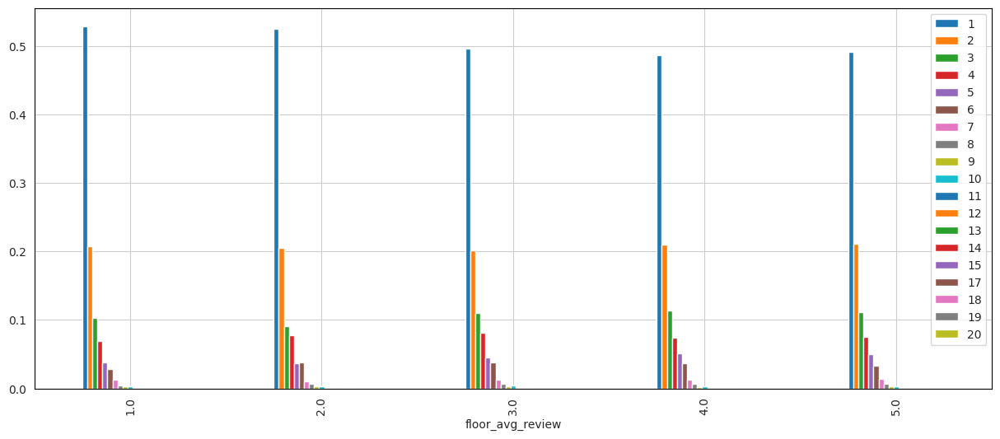

In [253]:
core_rfm_pd.groupby("floor_avg_review")["product_photos_qty"].value_counts(normalize=True).unstack().plot.bar(figsize=(15,6)).legend(loc="best")

>_rating 5 is high in all quantities of photos._

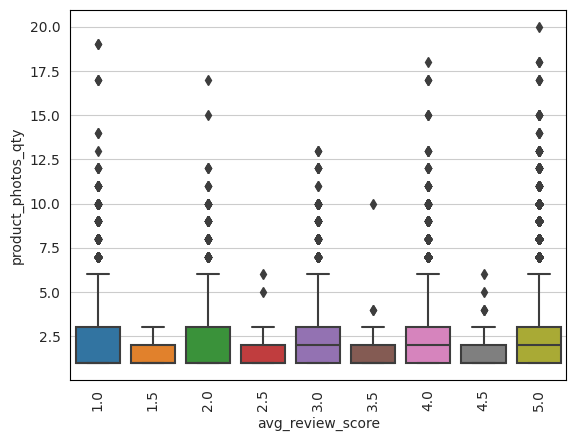

In [254]:
sns.boxplot(y="product_photos_qty",x="avg_review_score",data=core_rfm_pd)
plt.xticks(rotation=90)
plt.show()

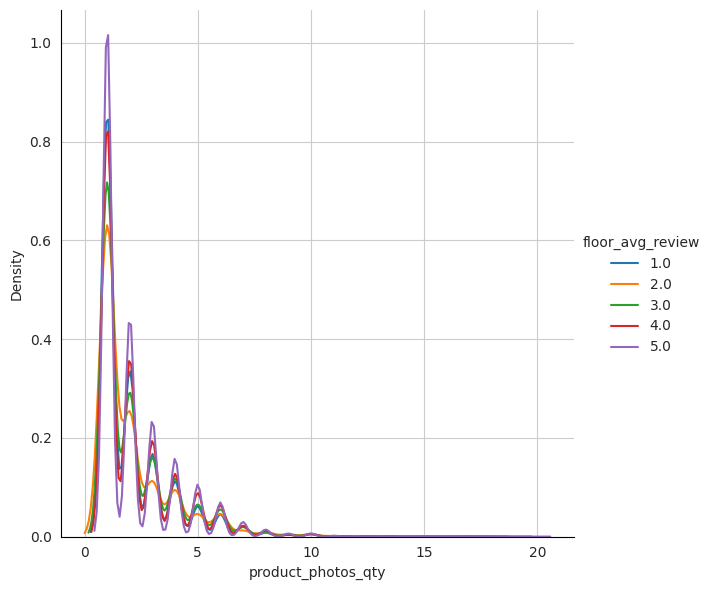

In [255]:
sns.FacetGrid(core_rfm_pd,hue="floor_avg_review",height=6)\
    .map(sns.kdeplot,"product_photos_qty")\
    .add_legend()
plt.show()

In [256]:
core_rfm_pd["product_category_name"].value_counts(normalize=True)[:10]


cama_mesa_banho           0.113166
beleza_saude              0.085940
esporte_lazer             0.076627
moveis_decoracao          0.074023
informatica_acessorios    0.069411
utilidades_domesticas     0.061685
relogios_presentes        0.053256
telefonia                 0.040383
ferramentas_jardim        0.038608
automotivo                0.037502
Name: product_category_name, dtype: float64

In [257]:
rate_1= core_rfm_pd[core_rfm_pd["floor_avg_review"]==1]
rate_2= core_rfm_pd[core_rfm_pd["floor_avg_review"]==2]
rate_3= core_rfm_pd[core_rfm_pd["floor_avg_review"]==3]
rate_4= core_rfm_pd[core_rfm_pd["floor_avg_review"]==4]
rate_5= core_rfm_pd[core_rfm_pd["floor_avg_review"]==5]

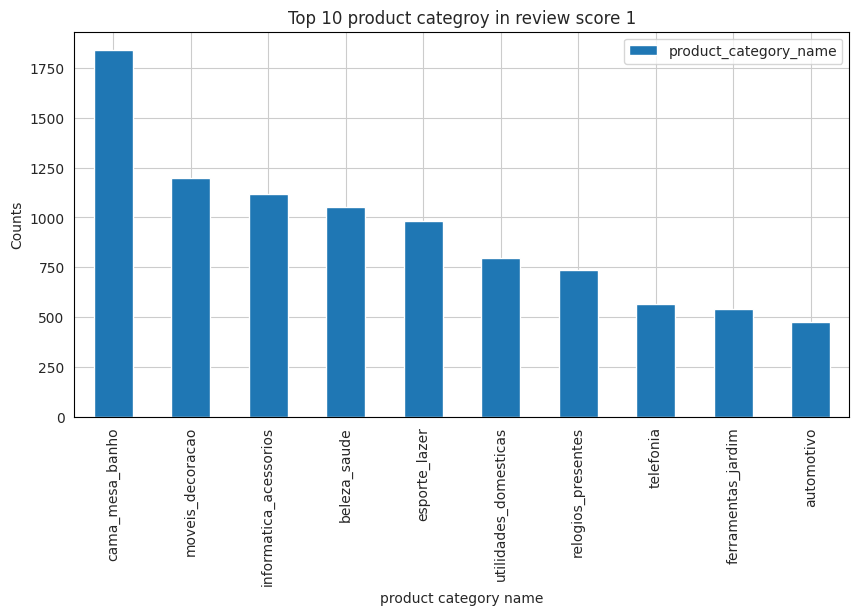

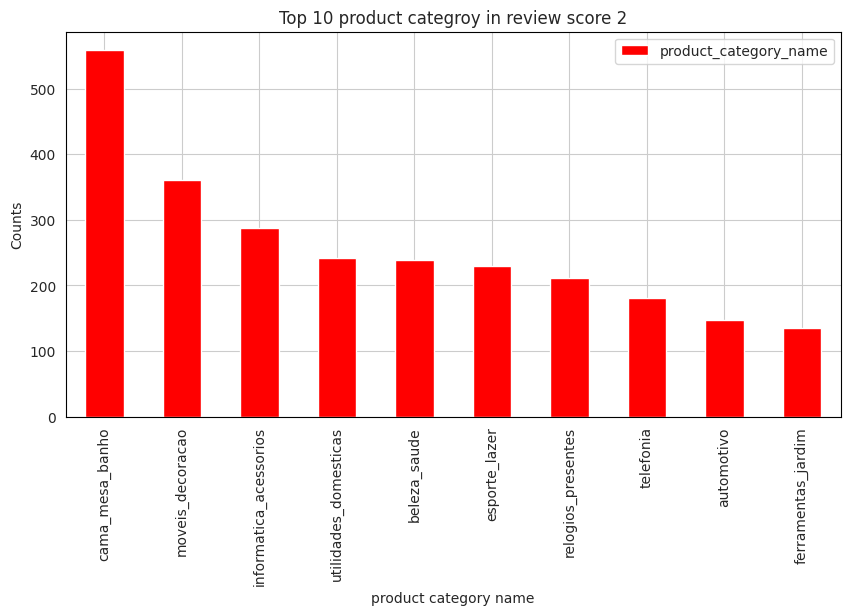

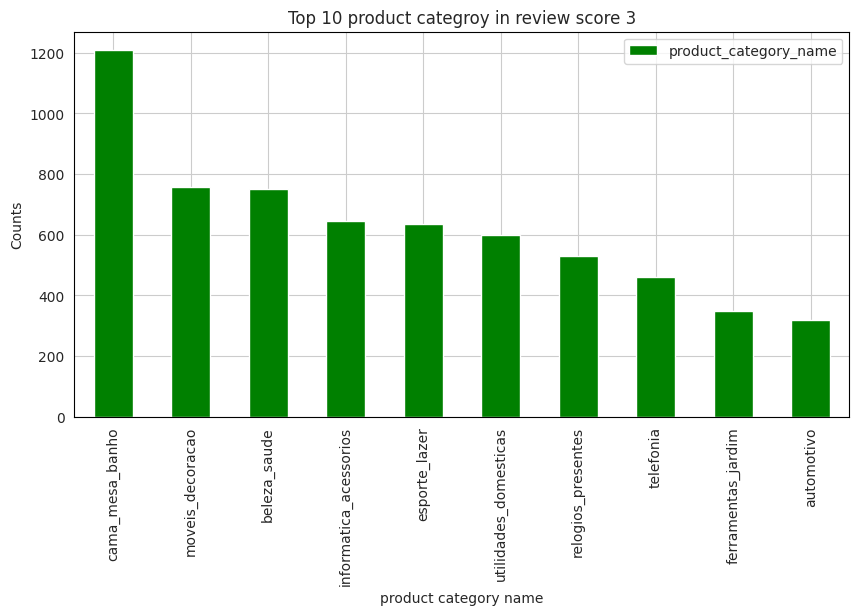

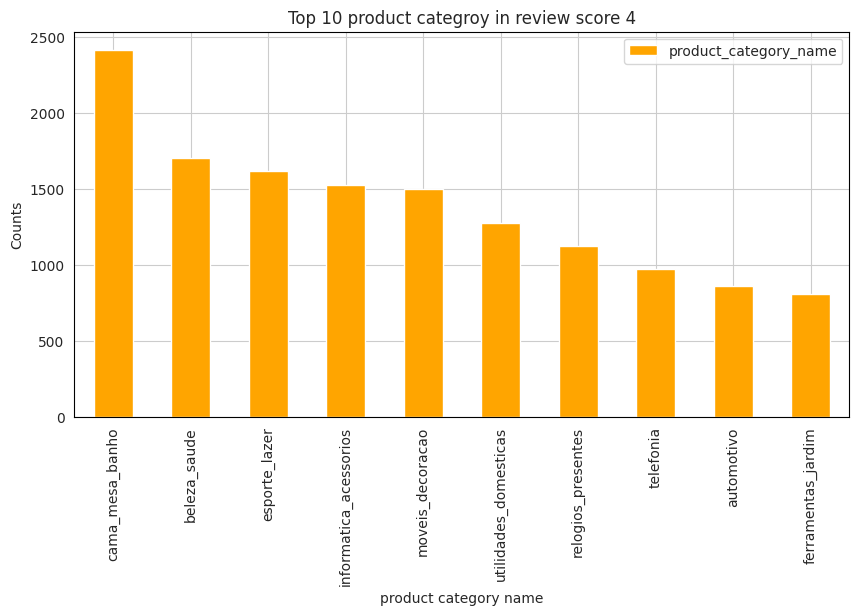

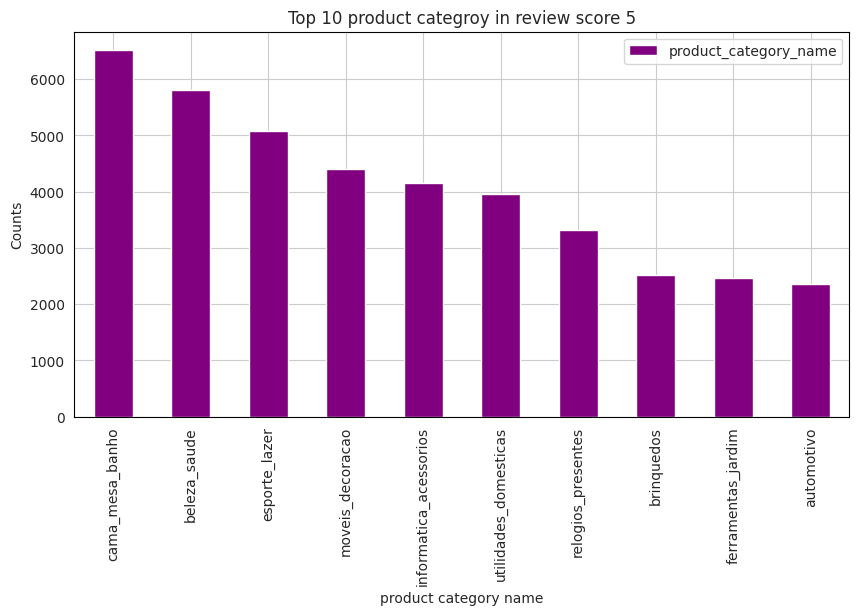

In [258]:
rate_1["product_category_name"].value_counts()[:10].plot.bar(figsize=(10,5)).legend()
plt.xlabel("product category name")
plt.ylabel("Counts")
plt.title("Top 10 product categroy in review score 1")
plt.show()
rate_2["product_category_name"].value_counts()[:10].plot.bar(figsize=(10,5), color="red").legend()
plt.xlabel("product category name")
plt.ylabel("Counts")
plt.title("Top 10 product categroy in review score 2")
plt.show()
rate_3["product_category_name"].value_counts()[:10].plot.bar(figsize=(10,5), color="green").legend()
plt.xlabel("product category name")
plt.ylabel("Counts")
plt.title("Top 10 product categroy in review score 3")
plt.show()
rate_4["product_category_name"].value_counts()[:10].plot.bar(figsize=(10,5), color="orange").legend()
plt.xlabel("product category name")
plt.ylabel("Counts")
plt.title("Top 10 product categroy in review score 4")
plt.show()
rate_5["product_category_name"].value_counts()[:10].plot.bar(figsize=(10,5), color="purple").legend()
plt.xlabel("product category name")
plt.ylabel("Counts")
plt.title("Top 10 product categroy in review score 5")
plt.show()

In [259]:
top_categ_by_revenue = core_rfm_pd.groupby("product_category_name").agg({'order_id':'nunique','total_payment_value':'sum'}).sort_values("total_payment_value", ascending=False)[:10]
top_categ_by_revenue.rename(columns={"order_id":"NumOfOrders", "payment_value":"Revenues"}, inplace=True)
top_categ_by_revenue

,NumOfOrders,total_payment_value
product_category_name,,
cama_mesa_banho,10828,1962878.99
beleza_saude,8800,1654270.45
informatica_acessorios,6654,1571543.81
moveis_decoracao,6425,1424782.52
relogios_presentes,5604,1421715.28
esporte_lazer,7673,1381363.23
utilidades_domesticas,5847,1086565.32
automotivo,3872,843297.65
ferramentas_jardim,3505,823517.80


>_cama_mesa_banho is the most frequent in all ratings._

([<matplotlib.patches.Wedge at 0x7ff0430e0df0>,
 [Text(0.9851669015347094, 0.4893323779605232, ''),
  Text(0.5357782568159231, 0.9606985268664104, ''),
  Text(0.0722929384843522, 1.097621852481672, ''),
  Text(-0.8203604791021479, 0.7328087638172011, ''),
  Text(-0.06844239581567672, -1.0978686799681512, '')],
 [Text(0.5373637644734778, 0.266908569796649, '14.7%'),
  Text(0.292242685535958, 0.5240173782907692, '4.5%'),
  Text(0.039432511900555745, 0.5987028286263666, '9.6%'),
  Text(-0.4474693522375352, 0.39971387117301876, '19.2%'),
  Text(-0.03733221589946002, -0.5988374618008097, '52.0%')])

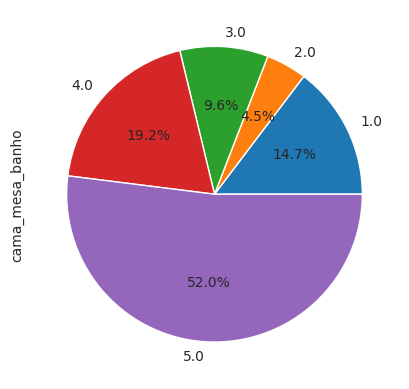

In [260]:
ax =  core_rfm_pd.groupby("product_category_name")["floor_avg_review"].value_counts(normalize=True).unstack().loc["cama_mesa_banho"].plot(kind="pie")

distirbution = core_rfm_pd.groupby("product_category_name")["floor_avg_review"].value_counts(normalize=True).unstack().loc["cama_mesa_banho"]
plt.pie(distirbution, autopct='%1.1f%%')

>_71% of the times, cama_mesa_banho gets rating 4 or 5_

([<matplotlib.patches.Wedge at 0x7ff0418538b0>,
 [Text(0.9867498732442642, 0.48613237667576603, ''),
  Text(0.5439171197211238, 0.9561140972050757, ''),
  Text(0.09851348062737818, 1.0955797981592574, ''),
  Text(-0.7684666877558856, 0.7870571451994438, ''),
  Text(-0.12278764289228716, -1.0931254249869757, '')],
 [Text(0.5382272035877804, 0.2651631145504178, '14.6%'),
  Text(0.2966820653024311, 0.5215167802936777, '4.4%'),
  Text(0.05373462579675173, 0.5975889808141404, '9.2%'),
  Text(-0.4191636478668466, 0.4293038973815148, '18.3%'),
  Text(-0.06697507794124753, -0.5962502318110776, '53.6%')])

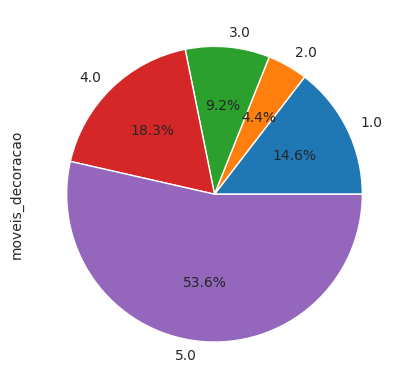

In [261]:
ax =  core_rfm_pd.groupby("product_category_name")["floor_avg_review"].value_counts(normalize=True).unstack().loc["moveis_decoracao"].plot(kind="pie")

distirbution = core_rfm_pd.groupby("product_category_name")["floor_avg_review"].value_counts(normalize=True).unstack().loc["moveis_decoracao"]
plt.pie(distirbution, autopct='%1.1f%%')

>_72% of the times, moveis_decoracao gets rating 4 or 5_

([<matplotlib.patches.Wedge at 0x7ff03fc2a1f0>,
 [Text(1.0350570540208421, 0.3723666135969979, ''),
  Text(0.7902510610965493, 0.765181847952353, ''),
  Text(0.5039614669058965, 0.9777642046393686, ''),
  Text(-0.35666511377718035, 1.040571956480815, ''),
  Text(-0.3675968422293687, -1.03676060958304, '')],
 [Text(0.5645765749204592, 0.20310906196199882, '11.0%'),
  Text(0.4310460333253905, 0.4173719170649198, '2.5%'),
  Text(0.2748880728577617, 0.533325929803292, '7.9%'),
  Text(-0.19454460751482563, 0.5675847035349899, '17.8%'),
  Text(-0.20050736848874656, -0.5655057870452945, '60.8%')])

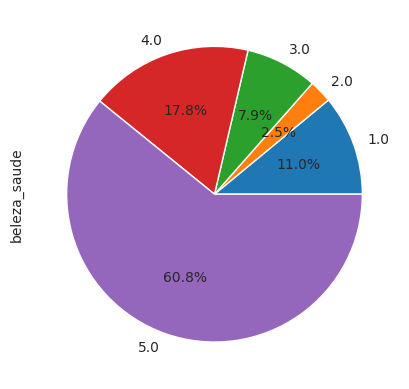

In [262]:
ax =  core_rfm_pd.groupby("product_category_name")["floor_avg_review"].value_counts(normalize=True).unstack().loc["beleza_saude"].plot(kind="pie")

distirbution = core_rfm_pd.groupby("product_category_name")["floor_avg_review"].value_counts(normalize=True).unstack().loc["beleza_saude"]
plt.pie(distirbution, autopct='%1.1f%%')

In [263]:
products_share = core_rfm_pd.groupby("product_category_name")["avg_review_score"].value_counts(normalize=True).unstack().rename_axis(None, axis =1).reset_index()

In [264]:
products_share.head()

,product_category_name,1.0,1.5,2.0,2.5,3.0,3.5,4.0,4.5,5.0
0,agro_industria_e_comercio,0.127358,NaN,0.033019,NaN,0.061321,NaN,0.268868,NaN,0.509434
1,alimentos,0.101215,NaN,0.026316,NaN,0.052632,NaN,0.186235,NaN,0.633603
2,alimentos_bebidas,0.057971,NaN,0.018116,NaN,0.105072,NaN,0.177536,0.003623,0.637681
3,artes,0.145631,NaN,0.033981,NaN,0.087379,NaN,0.189320,NaN,0.543689
4,artes_e_artesanato,0.125000,NaN,NaN,NaN,0.125000,NaN,0.125000,NaN,0.625000


In [265]:
products_share.loc[products_share[1.0]>=0.50]


,product_category_name,1.0,1.5,2.0,2.5,3.0,3.5,4.0,4.5,5.0
67,seguros_e_servicos,0.5,NaN,NaN,NaN,NaN,NaN,0.5,NaN,NaN


>_seguros_e_servicos has 50% of the review_scores for rating 1 and 50% review scores for rating 4_

In [266]:
core_rfm_pd[core_rfm_pd["product_category_name"]=="seguros_e_servicos"]

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,product_name_lenght,product_description_lenght,...,feedback,floor_avg_review,diff_in_delivery_time,actual_delivery_time,delivery_status,total_price_per_order,total_order_value,order_freight_ratio,Cluster,customer_segment
19180,2c4ada2e75c2ad41dd93cebb5df5f023,1,6c7a0a349ad11817745e3ad58abd5c79,48162d548f5b1b11b9d29d1e01f75a61,2017-01-30,183.29,25.77,seguros_e_servicos,55,506,...,1,4.0,-21,19,early,183.29,209.06,0.123266,0,Lost Customers
83595,bede3503afed051733eeb4a84d1adcc5,1,8db75af9aed3315374db44d7860e25da,4e922959ae960d389249c378d1c939f5,2017-09-26,100.00,15.45,seguros_e_servicos,48,461,...,0,1.0,-13,11,early,100.00,115.45,0.133824,0,Lost Customers


In [267]:
products_share.loc[products_share[1.0]>=0.30]

,product_category_name,1.0,1.5,2.0,2.5,3.0,3.5,4.0,4.5,5.0
67,seguros_e_servicos,0.5,NaN,NaN,NaN,NaN,NaN,0.5,NaN,NaN


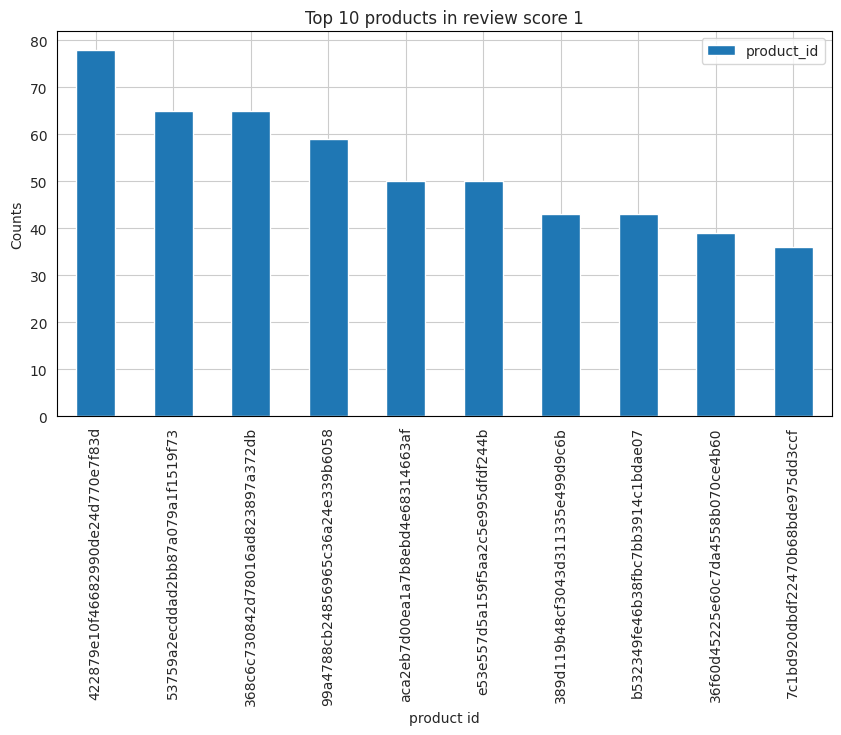

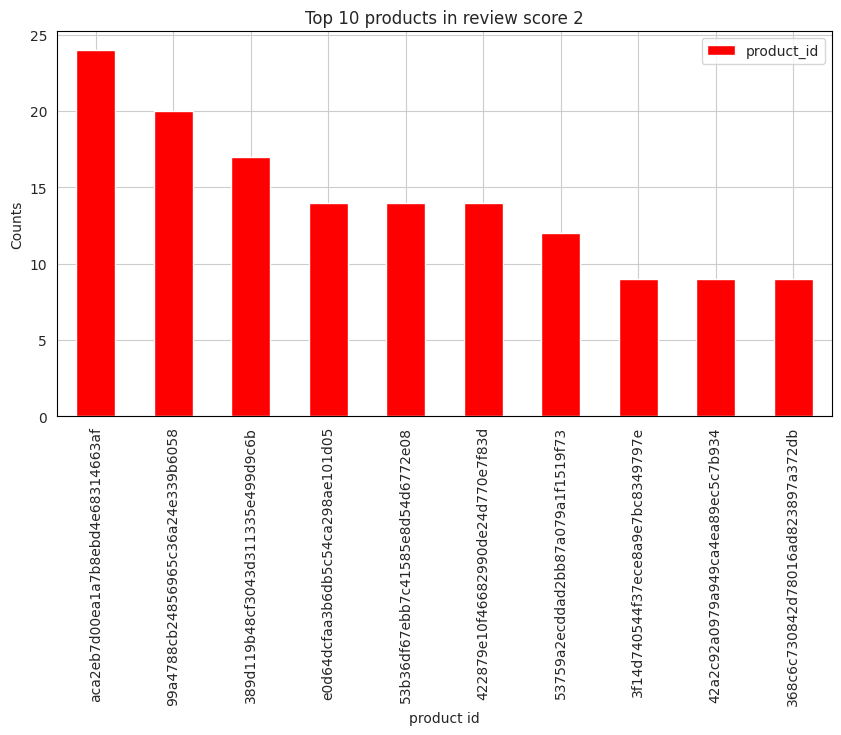

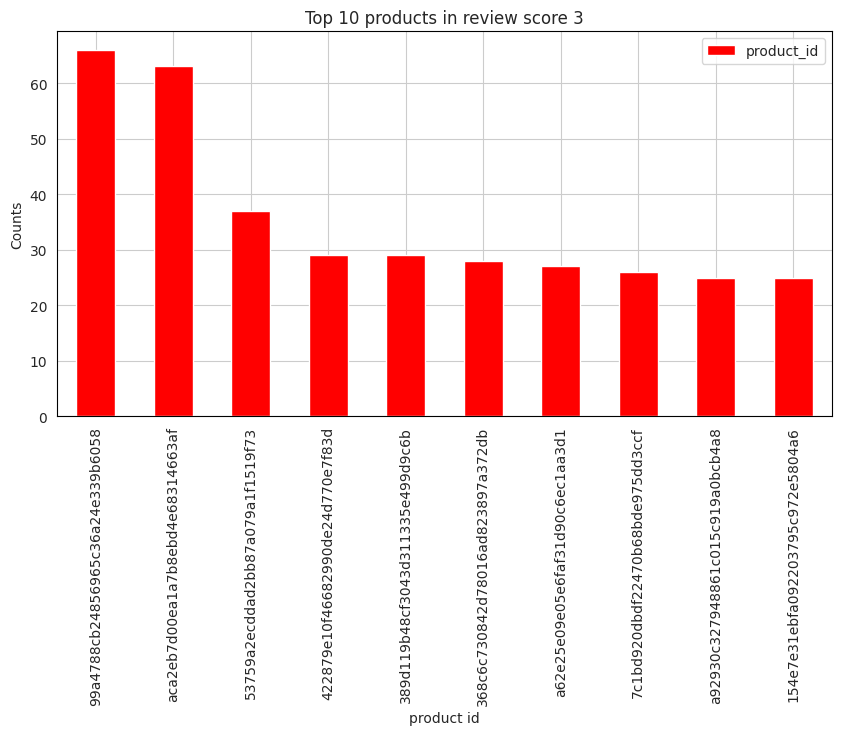

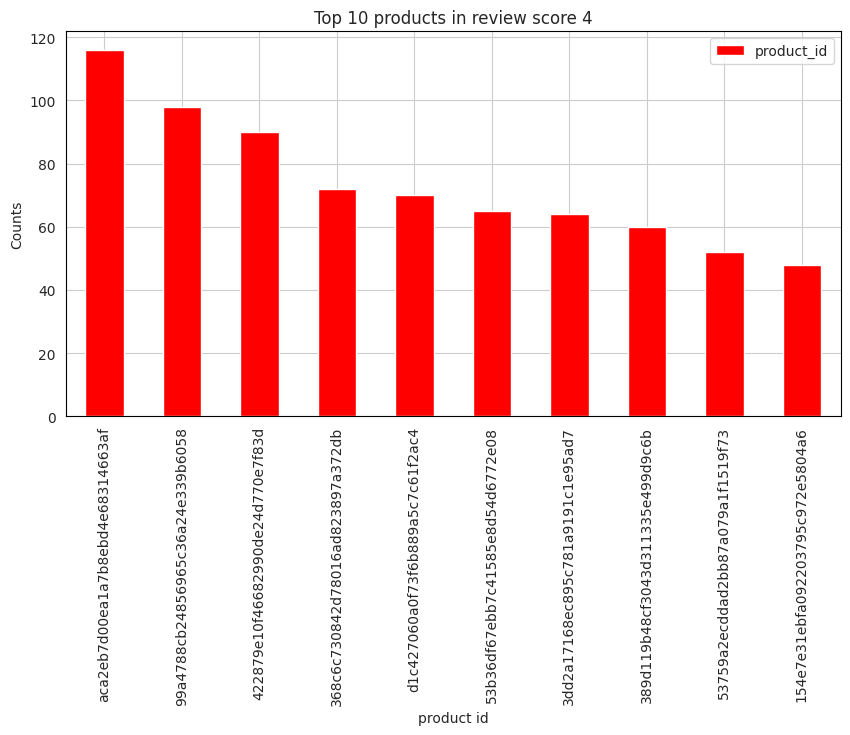

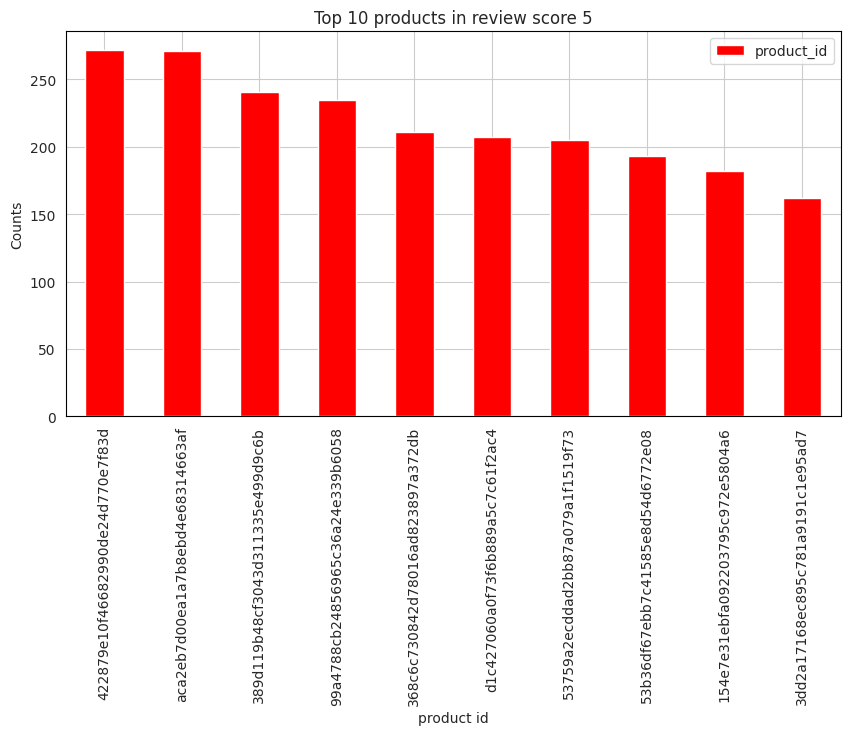

In [268]:
core_rfm_pd["product_id"].value_counts(normalize=True)[:10]
rate_1["product_id"].value_counts()[:10].plot.bar(figsize=(10,5)).legend()
plt.xlabel("product id")
plt.ylabel("Counts")
plt.title("Top 10 products in review score 1")
plt.show()
rate_2["product_id"].value_counts()[:10].plot.bar(figsize=(10,5), color="red").legend()
plt.xlabel("product id")
plt.ylabel("Counts")
plt.title("Top 10 products in review score 2")
plt.show()
rate_3["product_id"].value_counts()[:10].plot.bar(figsize=(10,5), color="red").legend()
plt.xlabel("product id")
plt.ylabel("Counts")
plt.title("Top 10 products in review score 3")
plt.show()
rate_4["product_id"].value_counts()[:10].plot.bar(figsize=(10,5), color="red").legend()
plt.xlabel("product id")
plt.ylabel("Counts")
plt.title("Top 10 products in review score 4")
plt.show()
rate_5["product_id"].value_counts()[:10].plot.bar(figsize=(10,5), color="red").legend()
plt.xlabel("product id")
plt.ylabel("Counts")
plt.title("Top 10 products in review score 5")
plt.show()

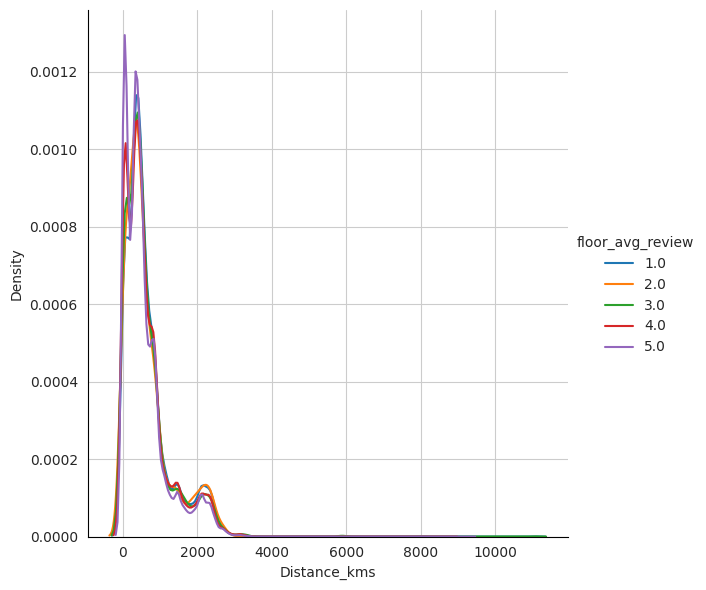

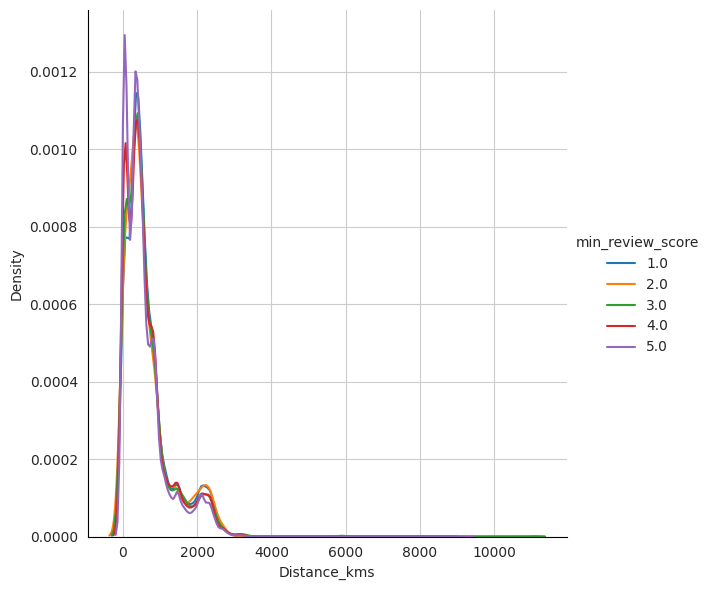

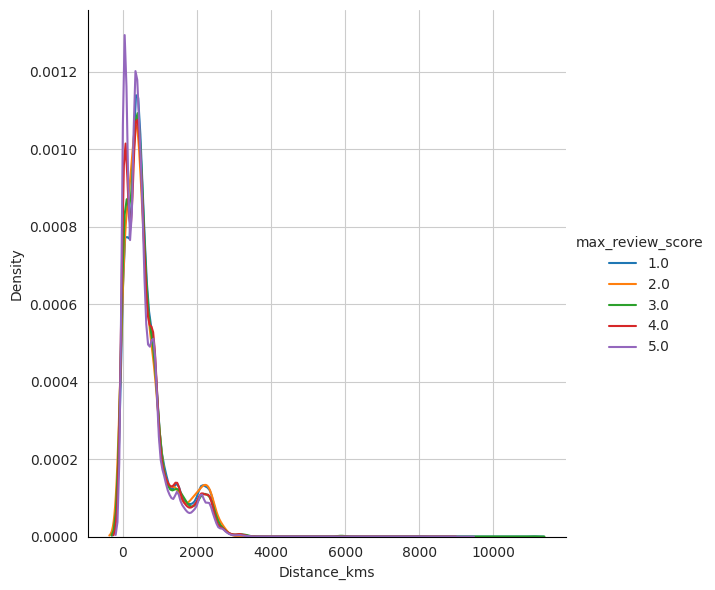

Mean 
 floor_avg_review
1.0    670.145813
2.0    653.297791
3.0    635.924255
4.0    625.951843
5.0    575.613892
Name: Distance_kms, dtype: float32
50th percentile 
 min_review_score
1.0    482.407135
2.0    449.582504
3.0    462.810944
4.0    456.934998
5.0    412.325775
Name: Distance_kms, dtype: float64
****************************************
75th percentile 
 min_review_score
1.0    847.215363
2.0    843.567154
3.0    818.734680
4.0    821.907410
5.0    767.714661
Name: Distance_kms, dtype: float64
****************************************
25th percentile 
 min_review_score
1.0    289.912323
2.0    249.279400
3.0    240.407349
4.0    203.666565
5.0    153.270126
Name: Distance_kms, dtype: float64
****************************************
50th percentile 
 max_review_score
1.0    482.407135
2.0    450.535522
3.0    462.832626
4.0    457.128571
5.0    412.368347
Name: Distance_kms, dtype: float64
****************************************
75th percentile 
 max_review_score
1.0    848.0

In [269]:
sns.FacetGrid(core_rfm_pd,hue="floor_avg_review",height=6)\
    .map(sns.kdeplot,"Distance_kms")\
    .add_legend()
plt.show()
sns.FacetGrid(core_rfm_pd,hue="min_review_score",height=6)\
    .map(sns.kdeplot,"Distance_kms")\
    .add_legend()
plt.show()
sns.FacetGrid(core_rfm_pd,hue="max_review_score",height=6)\
    .map(sns.kdeplot,"Distance_kms")\
    .add_legend()
plt.show()
print("Mean \n",core_rfm_pd.groupby("floor_avg_review")["Distance_kms"].mean())
lst=[50,75,25]
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("min_review_score")["Distance_kms"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("max_review_score")["Distance_kms"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("avg_review_score")["Distance_kms"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)

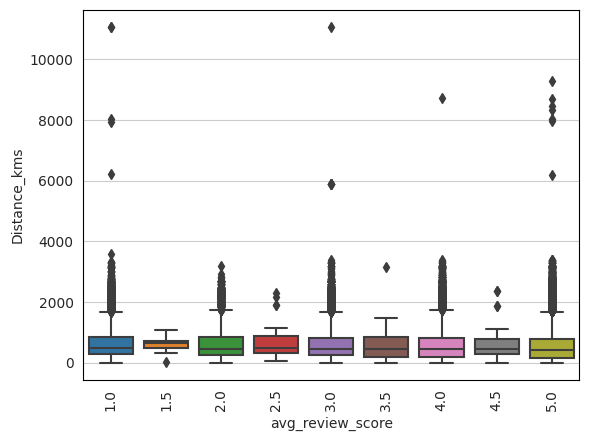

In [270]:
sns.boxplot(y="Distance_kms",x="avg_review_score",data=core_rfm_pd)
plt.xticks(rotation=90)
plt.show()

>_Distance has many outliers. Mean of distance_kms in rating_5 is lower than other ratings._

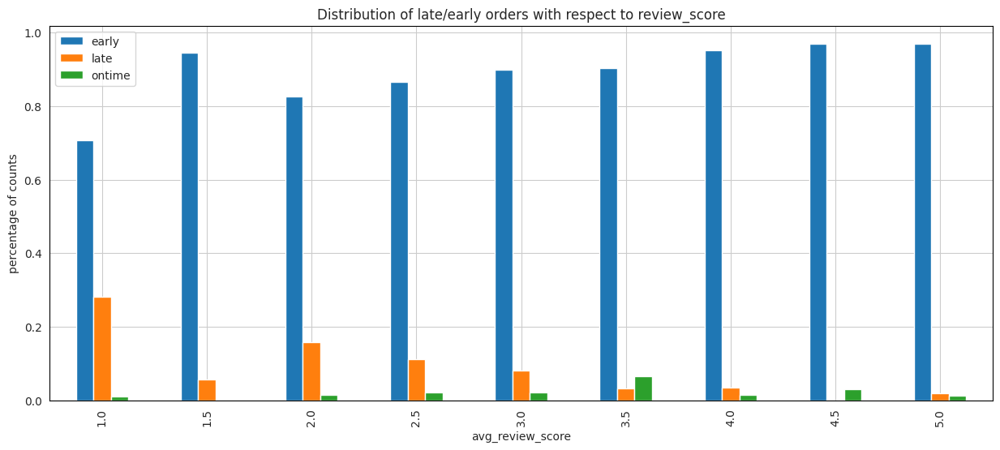

In [271]:
late_score = core_rfm_pd.groupby("avg_review_score")["delivery_status"].value_counts(normalize=True)
late_score.unstack().plot.bar(figsize=(15,6)).legend(loc="best")
plt.ylabel("percentage of counts")
plt.title("Distribution of late/early orders with respect to review_score")
plt.show()

>_% of late orders is higher in rating 1 than ratings 3,4,5_

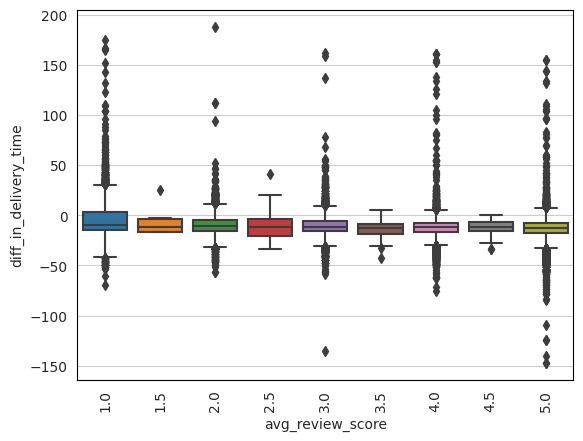

In [272]:
sns.boxplot(y="diff_in_delivery_time",x="avg_review_score",data=core_rfm_pd)
plt.xticks(rotation=90)
plt.show()

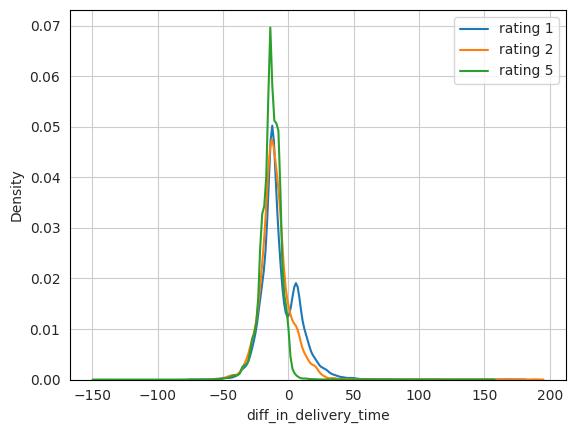

In [273]:
sns.kdeplot(core_rating_1["diff_in_delivery_time"],label="rating 1")
sns.kdeplot(core_rating_2["diff_in_delivery_time"],label="rating 2")
sns.kdeplot(core_rating_5["diff_in_delivery_time"],label="rating 5")
plt.legend()

>_Ratings 1, 2 have higher density in high diff_in_delivery_time._

>_Rating 5 has higher density at lower diff_in_delivery_time._

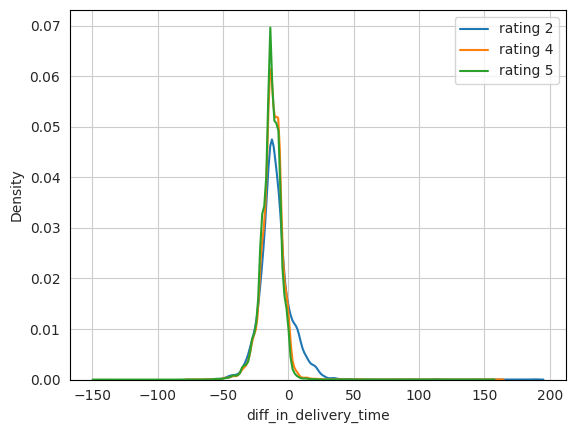

In [274]:
sns.kdeplot(core_rating_2["diff_in_delivery_time"],label="rating 2")
sns.kdeplot(core_rating_4["diff_in_delivery_time"],label="rating 4")
sns.kdeplot(core_rating_5["diff_in_delivery_time"],label="rating 5")
plt.legend()
plt.show()

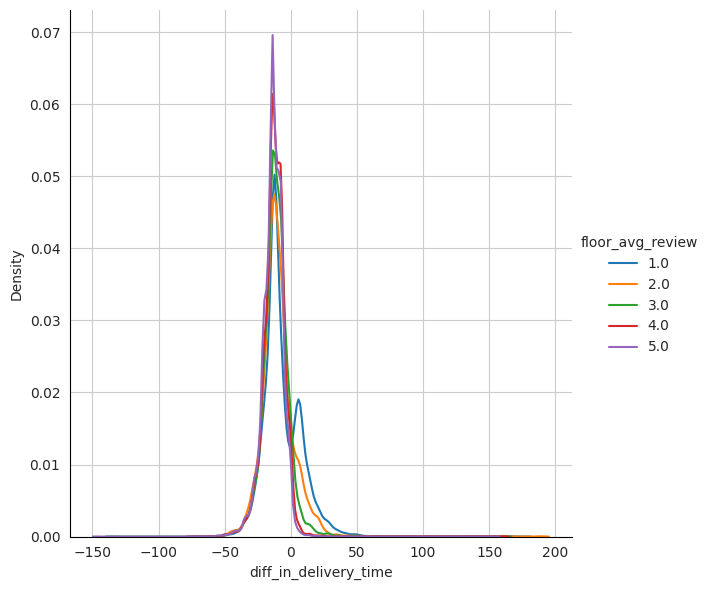

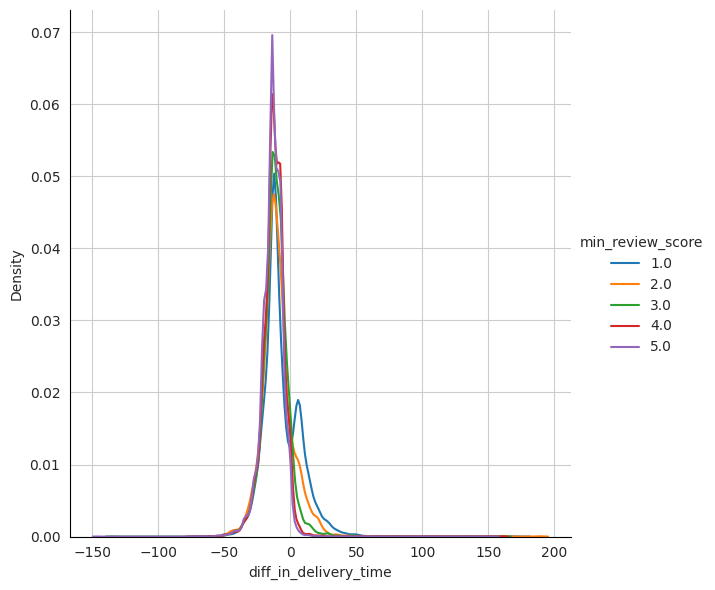

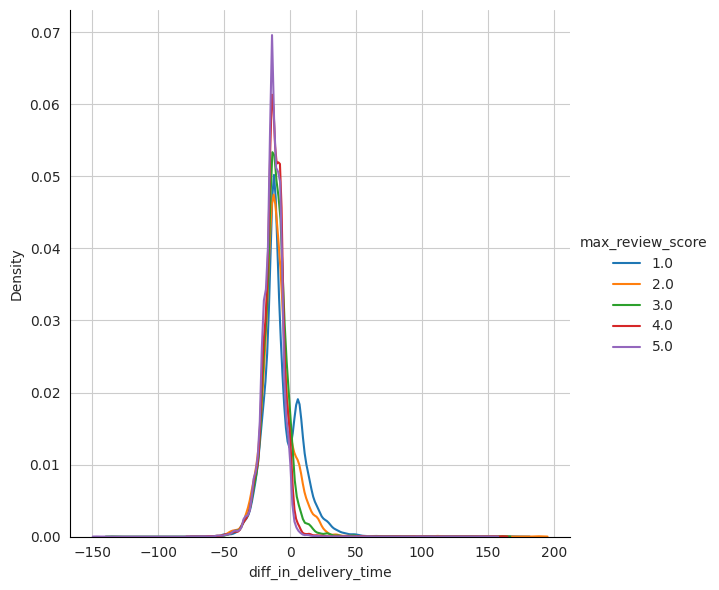

Mean 
 floor_avg_review
1.0    -6.473081
2.0    -9.811866
3.0   -11.115659
4.0   -12.476345
5.0   -13.416015
Name: diff_in_delivery_time, dtype: float64
50th percentile 
 min_review_score
1.0   -10.0
2.0   -11.0
3.0   -12.0
4.0   -12.0
5.0   -13.0
Name: diff_in_delivery_time, dtype: float64
****************************************
75th percentile 
 min_review_score
1.0    3.0
2.0   -5.0
3.0   -6.0
4.0   -8.0
5.0   -8.0
Name: diff_in_delivery_time, dtype: float64
****************************************
25th percentile 
 min_review_score
1.0   -15.0
2.0   -16.0
3.0   -16.0
4.0   -17.0
5.0   -18.0
Name: diff_in_delivery_time, dtype: float64
****************************************
50th percentile 
 max_review_score
1.0   -10.0
2.0   -11.0
3.0   -12.0
4.0   -12.0
5.0   -13.0
Name: diff_in_delivery_time, dtype: float64
****************************************
75th percentile 
 max_review_score
1.0    3.0
2.0   -5.0
3.0   -6.0
4.0   -8.0
5.0   -8.0
Name: diff_in_delivery_time, dtype: float6

In [275]:
sns.FacetGrid(core_rfm_pd,hue="floor_avg_review",height=6)\
    .map(sns.kdeplot,"diff_in_delivery_time")\
    .add_legend()
plt.show()
sns.FacetGrid(core_rfm_pd,hue="min_review_score",height=6)\
    .map(sns.kdeplot,"diff_in_delivery_time")\
    .add_legend()
plt.show()
sns.FacetGrid(core_rfm_pd,hue="max_review_score",height=6)\
    .map(sns.kdeplot,"diff_in_delivery_time")\
    .add_legend()
plt.show()
print("Mean \n",core_rfm_pd.groupby("floor_avg_review")["diff_in_delivery_time"].mean())
lst=[50,75,25]
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("min_review_score")["diff_in_delivery_time"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("max_review_score")["diff_in_delivery_time"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("avg_review_score")["diff_in_delivery_time"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)

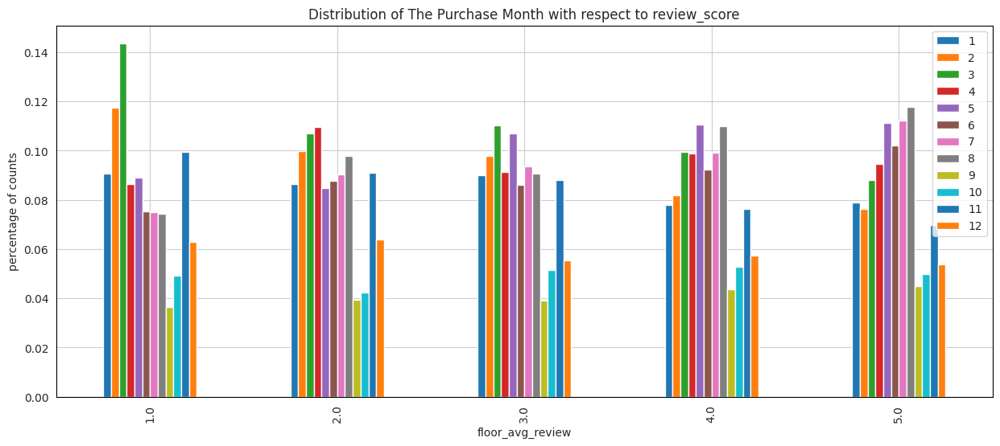

In [276]:
month_score = core_rfm_pd.groupby("floor_avg_review")["month_order_purchase"].value_counts(normalize=True)
month_score.unstack().plot.bar(figsize=(15,6)).legend(loc="best")
plt.ylabel("percentage of counts")
plt.title("Distribution of The Purchase Month with respect to review_score")
plt.show()


In [277]:
month_score.unstack()

month_order_purchase,1,2,3,4,5,6,7,8,9,10,11,12
floor_avg_review,,,,,,,,,,,,
1.0,0.090657,0.117394,0.143692,0.086420,0.089050,0.075243,0.074878,0.074439,0.036599,0.049237,0.099423,0.062970
2.0,0.086391,0.099922,0.106948,0.109550,0.084830,0.087692,0.090294,0.097840,0.039292,0.042415,0.091075,0.063752
3.0,0.089862,0.097857,0.110116,0.091355,0.106918,0.086132,0.093593,0.090502,0.039015,0.051380,0.087944,0.055325
4.0,0.077938,0.081990,0.099331,0.098718,0.110593,0.092169,0.099284,0.110027,0.043728,0.052634,0.076336,0.057252
5.0,0.078869,0.076220,0.088117,0.094716,0.111372,0.102108,0.112355,0.117907,0.045034,0.049936,0.069605,0.053759


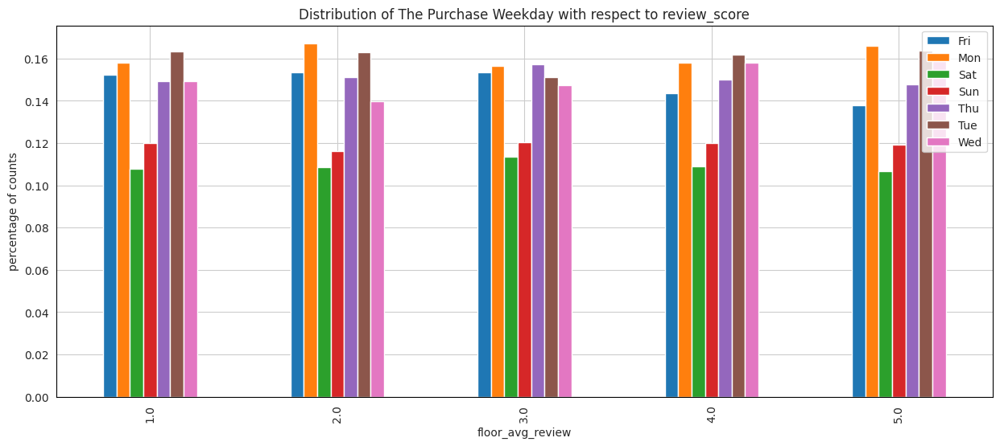

In [278]:
weekday_score = core_rfm_pd.groupby("floor_avg_review")["weekday_order_purchase"].value_counts(normalize=True)
weekday_score.unstack().plot.bar(figsize=(15,6)).legend(loc="best")
plt.ylabel("percentage of counts")
plt.title("Distribution of The Purchase Weekday with respect to review_score")
plt.show()

In [279]:
weekday_score.unstack()

weekday_order_purchase,Fri,Mon,Sat,Sun,Thu,Tue,Wed
floor_avg_review,,,,,,,
1.0,0.152385,0.158156,0.107678,0.119877,0.149390,0.163197,0.149317
2.0,0.153526,0.167317,0.108769,0.116315,0.151184,0.163154,0.139735
3.0,0.153502,0.156700,0.113421,0.120350,0.157126,0.151370,0.147532
4.0,0.143436,0.157902,0.108944,0.119876,0.150033,0.161719,0.158091
5.0,0.137990,0.166114,0.106661,0.119065,0.147729,0.163560,0.158881


In [280]:
day_score = core_rfm_pd.groupby("avg_review_score")["day_order_purchase"].value_counts(normalize=True)
day_score.unstack()

day_order_purchase,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
avg_review_score,,,,,,,,,,,,,,,,,,,,,
1.0,0.033063,0.032843,0.029625,0.030503,0.037378,0.039207,0.035111,0.031819,0.029698,0.031600,...,0.035696,0.030356,0.042499,0.035842,0.035038,0.033502,0.030429,0.025821,0.021213,0.015507
1.5,NaN,0.055556,NaN,NaN,NaN,0.222222,NaN,NaN,NaN,NaN,...,0.222222,NaN,NaN,NaN,0.055556,NaN,0.222222,NaN,NaN,NaN
2.0,0.035282,0.032649,0.027646,0.035808,0.043181,0.040021,0.026593,0.035545,0.032385,0.031596,...,0.035545,0.034755,0.041601,0.035545,0.034492,0.029226,0.025276,0.027383,0.031596,0.013428
2.5,0.022222,NaN,0.088889,0.022222,0.022222,NaN,NaN,NaN,0.022222,0.022222,...,0.022222,0.111111,0.022222,NaN,NaN,0.155556,NaN,NaN,NaN,0.022222
3.0,0.033583,0.027487,0.033048,0.034225,0.033797,0.037968,0.033048,0.034439,0.031230,0.033690,...,0.031658,0.028877,0.043529,0.035829,0.034759,0.029733,0.031016,0.028556,0.020856,0.014652
3.5,NaN,NaN,0.032258,NaN,0.096774,NaN,NaN,NaN,NaN,0.096774,...,0.096774,NaN,NaN,NaN,0.064516,0.193548,NaN,0.032258,0.032258,0.032258
4.0,0.031578,0.032382,0.032098,0.033611,0.033658,0.033752,0.033800,0.033563,0.033091,0.030302,...,0.029403,0.031578,0.037440,0.035123,0.031247,0.033942,0.029782,0.026189,0.027040,0.017302
4.5,0.058824,0.014706,NaN,NaN,0.029412,0.029412,0.014706,0.044118,0.014706,0.014706,...,0.102941,0.014706,0.102941,0.014706,0.073529,0.029412,0.014706,0.014706,0.058824,NaN
5.0,0.029806,0.032804,0.033343,0.035548,0.034390,0.033550,0.033645,0.033423,0.033312,0.031250,...,0.032994,0.032487,0.037706,0.031932,0.033803,0.031821,0.030504,0.025301,0.025920,0.017655


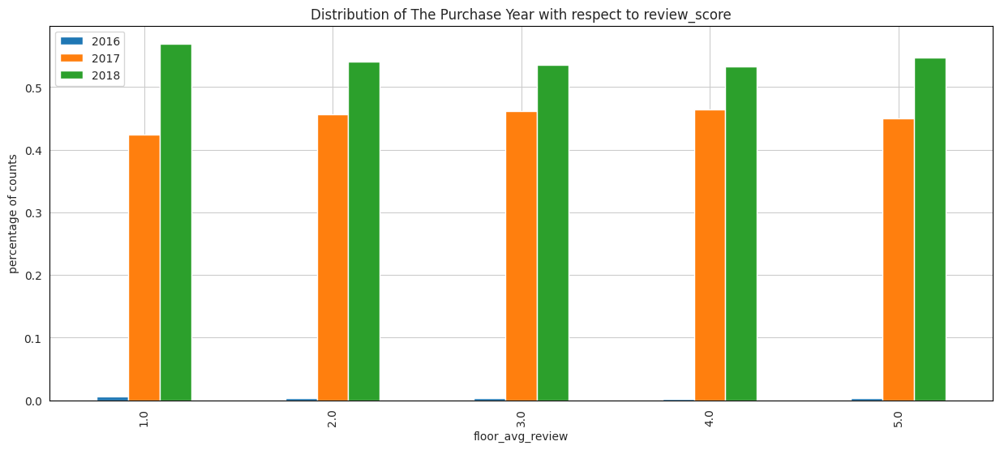

In [281]:
year_score = core_rfm_pd.groupby("floor_avg_review")["year_order_purchase"].value_counts(normalize=True)
year_score.unstack().plot.bar(figsize=(15,6)).legend(loc="best")
plt.ylabel("percentage of counts")
plt.title("Distribution of The Purchase Year with respect to review_score")
plt.show()

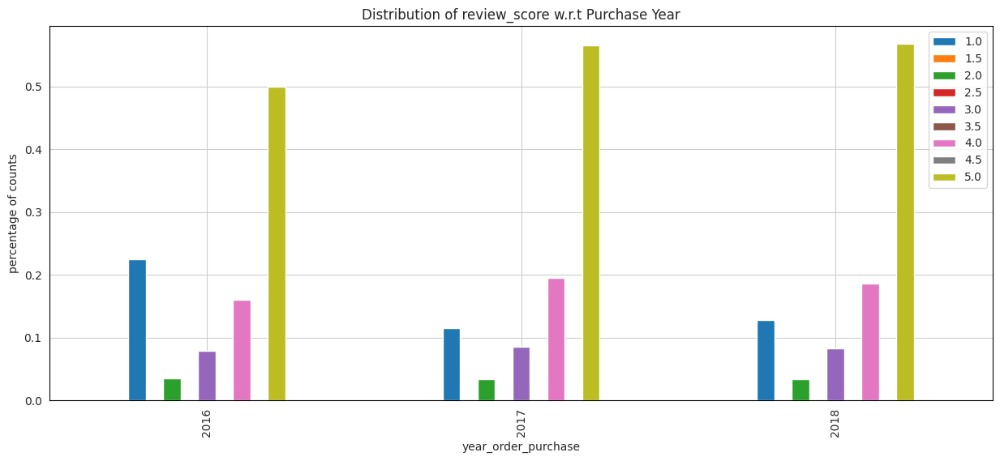

In [282]:
year_score = core_rfm_pd.groupby("year_order_purchase")["avg_review_score"].value_counts(normalize=True)
year_score.unstack().plot.bar(figsize=(15,6)).legend(loc="best")
plt.ylabel("percentage of counts")
plt.title("Distribution of review_score w.r.t Purchase Year")
plt.show()

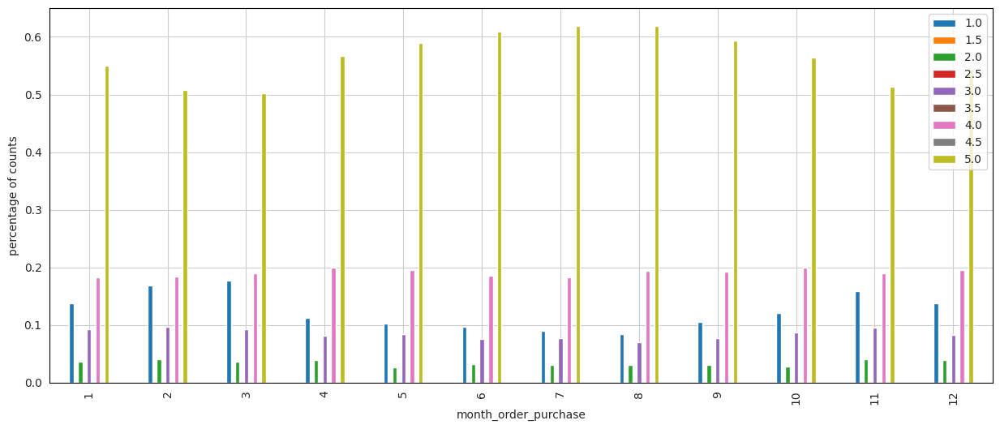

In [283]:
month_score = core_rfm_pd.groupby("month_order_purchase")["avg_review_score"].value_counts(normalize=True)
month_score.unstack().plot.bar(figsize=(15,6)).legend(loc="best")
plt.ylabel("percentage of counts")
plt.show()

In [284]:
month_score.unstack()

avg_review_score,1.0,1.5,2.0,2.5,3.0,3.5,4.0,4.5,5.0
month_order_purchase,,,,,,,,,
1,0.137027,0.000221,0.036496,0.000221,0.092679,0.000553,0.182482,0.000442,0.549878
2,0.169135,0.000846,0.039983,0.000635,0.096784,0.000317,0.183520,0.000529,0.508250
3,0.177352,0.000271,0.036933,0.000181,0.092649,0.000632,0.189362,0.000993,0.501625
4,0.112378,NaN,0.039422,0.000570,0.081315,0.000095,0.198917,0.000095,0.567208
5,0.102216,0.000084,0.026771,0.000587,0.084089,0.000084,0.196039,0.000923,0.589208
6,0.097464,NaN,0.031794,0.000095,0.076268,0.000189,0.184803,0.000284,0.609103
7,0.089598,NaN,0.030070,0.000262,0.076486,0.000262,0.183217,0.000962,0.619143
8,0.084582,0.000250,0.030719,0.000583,0.070596,0.000083,0.193973,0.000416,0.618798
9,0.104702,NaN,0.030930,0.000627,0.076489,NaN,0.192268,0.001672,0.593312


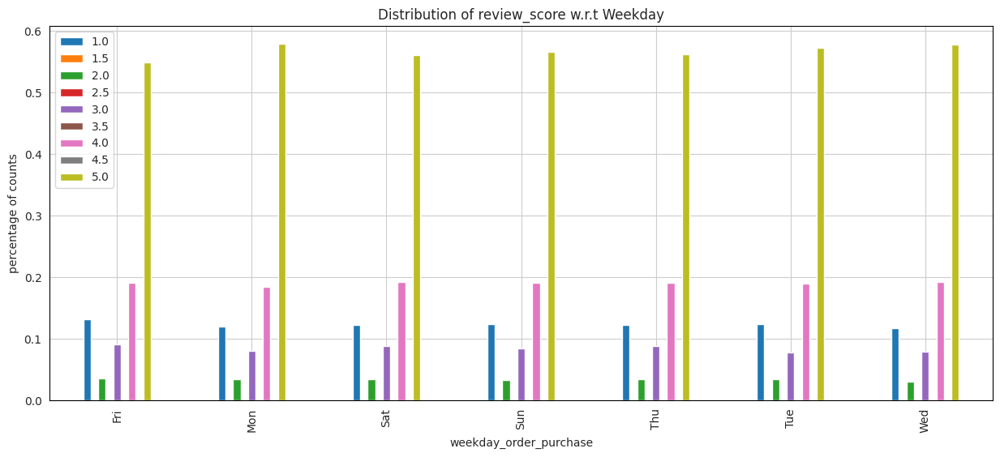

In [285]:
weekday_score = core_rfm_pd.groupby("weekday_order_purchase")["avg_review_score"].value_counts(normalize=True)
weekday_score.unstack().plot.bar(figsize=(15,6)).legend(loc="best")
plt.ylabel("percentage of counts")
plt.title("Distribution of review_score w.r.t Weekday")
plt.show()

In [286]:
weekday_score.unstack()

avg_review_score,1.0,1.5,2.0,2.5,3.0,3.5,4.0,4.5,5.0
weekday_order_purchase,,,,,,,,,
Fri,0.131408,0.000126,0.036383,0.000820,0.090737,0.000063,0.191185,0.000757,0.548521
Mon,0.119607,NaN,0.034860,0.000663,0.080824,0.000387,0.184631,0.000497,0.578532
Sat,0.122915,NaN,0.034857,NaN,0.088309,0.000417,0.192128,0.000667,0.560707
Sun,0.123540,0.000151,0.033240,0.000452,0.084797,0.000301,0.191151,0.000603,0.565765
Thu,0.122854,0.000362,0.034645,0.000362,0.088691,0.000121,0.191300,0.000542,0.561126
Tue,0.123779,0.000166,0.034565,0.000222,0.078451,0.000333,0.190024,0.000388,0.572071
Wed,0.117617,0.000288,0.030745,0.000231,0.079488,0.000346,0.192663,0.000865,0.577757


In [287]:
core_rfm_pd.columns

Index(['order_id', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'seller_city', 'seller_state', 'customer_id', 'order_status',
       'order_purchase_timestamp', 'order_approved_at',
       'order_delivered_carrier_date', 'order_delivered_customer_date',
       'order_estimated_delivery_date', 'customer_unique_id', 'customer_city',
       'customer_state', 'payment_type', 'max_payment_installments',
       'total_payment_value', 'avg_review_score', 'min_review_score',
       'max_review_score', 'year_order_purchase', 'month_order_purchase',
       'day_order_purchase', 'weekday_order_purchase', 'Distance_kms',
       'is_reviewed', 'feedback', 'floor_avg_review', 'diff_in_delivery_time',
       'actual_delivery_time', 'deliver

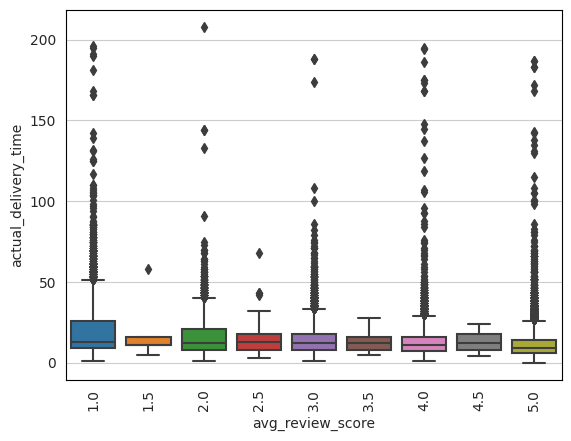

In [288]:
sns.boxplot(y="actual_delivery_time",x="avg_review_score",data=core_rfm_pd)
plt.xticks(rotation=90)
plt.show()

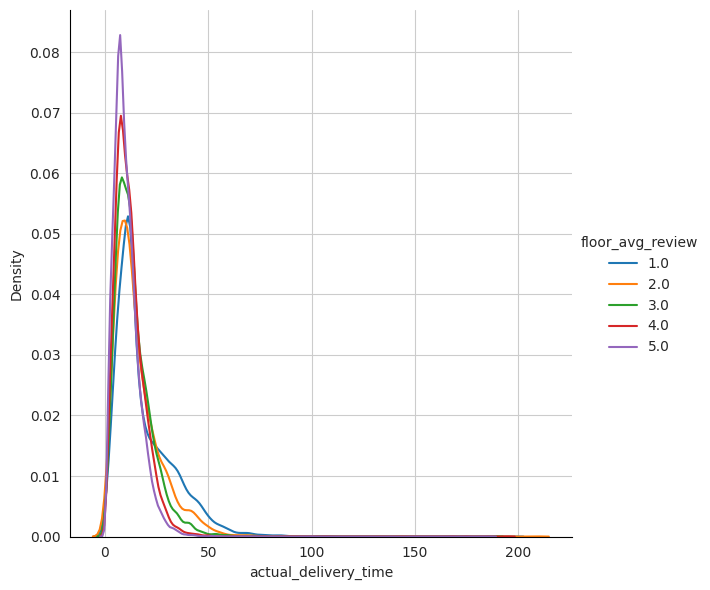

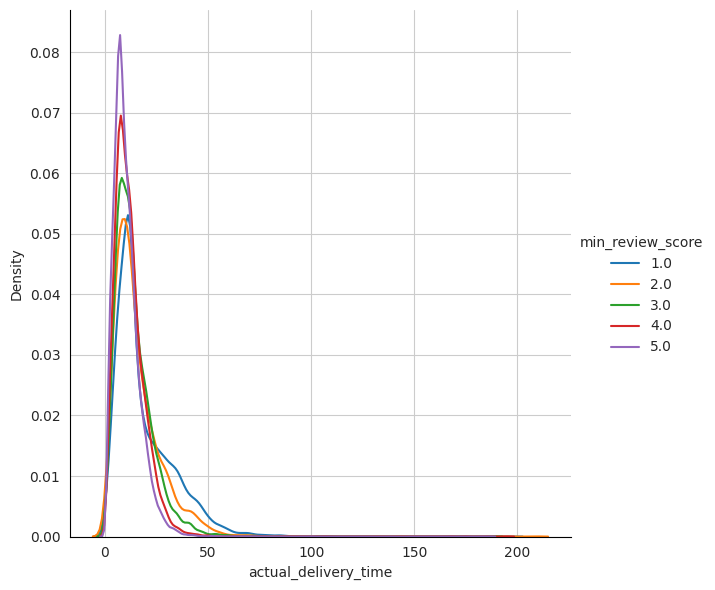

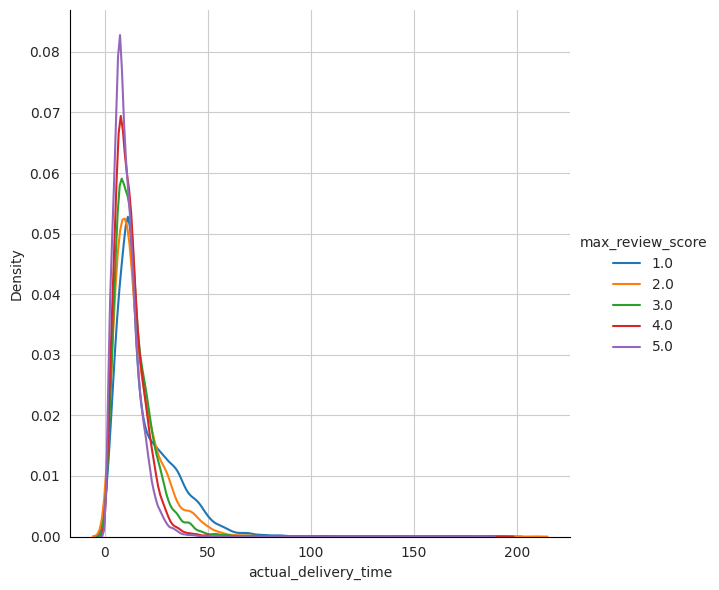

Mean 
 floor_avg_review
1.0    18.866608
2.0    15.622170
3.0    13.934549
4.0    12.151070
5.0    10.588205
Name: actual_delivery_time, dtype: float64
50th percentile 
 min_review_score
1.0    13.0
2.0    12.0
3.0    12.0
4.0    11.0
5.0     9.0
Name: actual_delivery_time, dtype: float64
****************************************
75th percentile 
 min_review_score
1.0    26.0
2.0    20.0
3.0    18.0
4.0    16.0
5.0    14.0
Name: actual_delivery_time, dtype: float64
****************************************
25th percentile 
 min_review_score
1.0    9.0
2.0    8.0
3.0    8.0
4.0    7.0
5.0    6.0
Name: actual_delivery_time, dtype: float64
****************************************
50th percentile 
 max_review_score
1.0    13.0
2.0    12.0
3.0    12.0
4.0    11.0
5.0     9.0
Name: actual_delivery_time, dtype: float64
****************************************
75th percentile 
 max_review_score
1.0    26.0
2.0    20.0
3.0    18.0
4.0    16.0
5.0    14.0
Name: actual_delivery_time, dtype: float64

In [289]:
sns.FacetGrid(core_rfm_pd,hue="floor_avg_review",height=6)\
    .map(sns.kdeplot,"actual_delivery_time")\
    .add_legend()
plt.show()
sns.FacetGrid(core_rfm_pd,hue="min_review_score",height=6)\
    .map(sns.kdeplot,"actual_delivery_time")\
    .add_legend()
plt.show()
sns.FacetGrid(core_rfm_pd,hue="max_review_score",height=6)\
    .map(sns.kdeplot,"actual_delivery_time")\
    .add_legend()
plt.show()
print("Mean \n",core_rfm_pd.groupby("floor_avg_review")["actual_delivery_time"].mean())
lst=[50,75,25]
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("min_review_score")["actual_delivery_time"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("max_review_score")["actual_delivery_time"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)
for i in lst:
    print("{}th percentile \n {}".format(i,core_rfm_pd.groupby("avg_review_score")["actual_delivery_time"].apply(lambda x: np.percentile(x,i))))
    print("*"*40)

>_Rating 1 has highest density in high values, Rating 5 has highest density in lower values._

>_Rating 5 mean is the lowest._

In [290]:
core_rfm_pd.columns

Index(['order_id', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'seller_city', 'seller_state', 'customer_id', 'order_status',
       'order_purchase_timestamp', 'order_approved_at',
       'order_delivered_carrier_date', 'order_delivered_customer_date',
       'order_estimated_delivery_date', 'customer_unique_id', 'customer_city',
       'customer_state', 'payment_type', 'max_payment_installments',
       'total_payment_value', 'avg_review_score', 'min_review_score',
       'max_review_score', 'year_order_purchase', 'month_order_purchase',
       'day_order_purchase', 'weekday_order_purchase', 'Distance_kms',
       'is_reviewed', 'feedback', 'floor_avg_review', 'diff_in_delivery_time',
       'actual_delivery_time', 'deliver

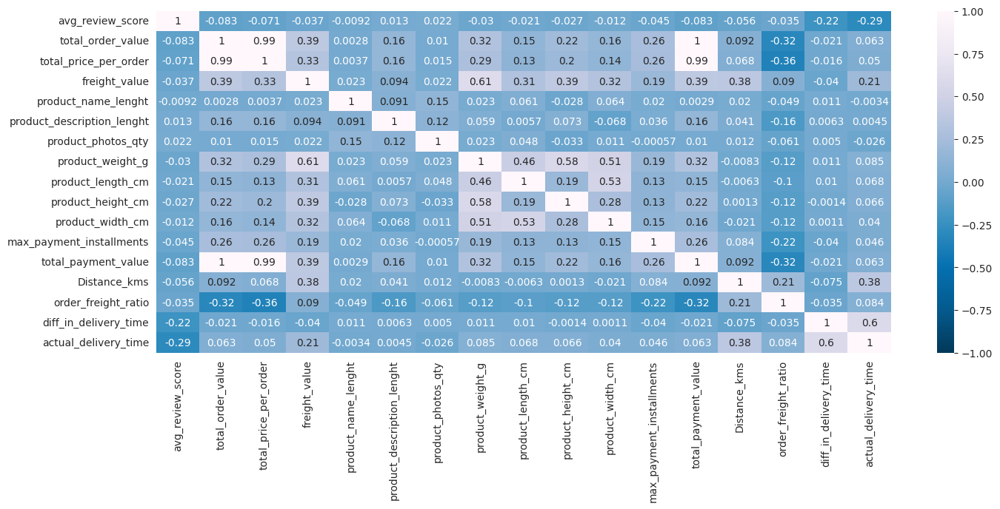

In [291]:
core_num_correlation = core_rfm_pd[["avg_review_score","total_order_value", "total_price_per_order", "freight_value", "product_name_lenght","product_description_lenght","product_photos_qty", "product_weight_g", "product_length_cm", "product_height_cm", "product_width_cm","max_payment_installments", "total_payment_value", "Distance_kms","order_freight_ratio", "diff_in_delivery_time", "actual_delivery_time"]]
corr = core_num_correlation.corr(method='pearson')

plt.figure(figsize=(16, 6))
sns.heatmap(corr, cmap='PuBu_r', vmin=-1, vmax=1, annot=True);

>_1- diff_in_delivery_time and actual delivery_time have a negative correlation with average_Review_score value._

>_2- freight value has a positive correlation with product_weight and total_payment and actual_delivery_time._


>_3- Distance has a positive correlation with actual_delivery_time._

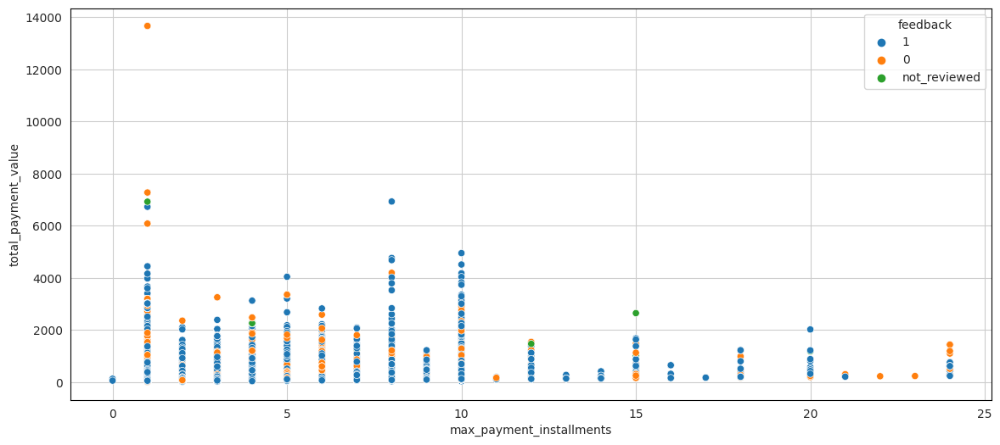

In [292]:
plt.figure(figsize=(14, 6))
sns.scatterplot(x='max_payment_installments', y='total_payment_value', hue='feedback', data=core_rfm_pd)

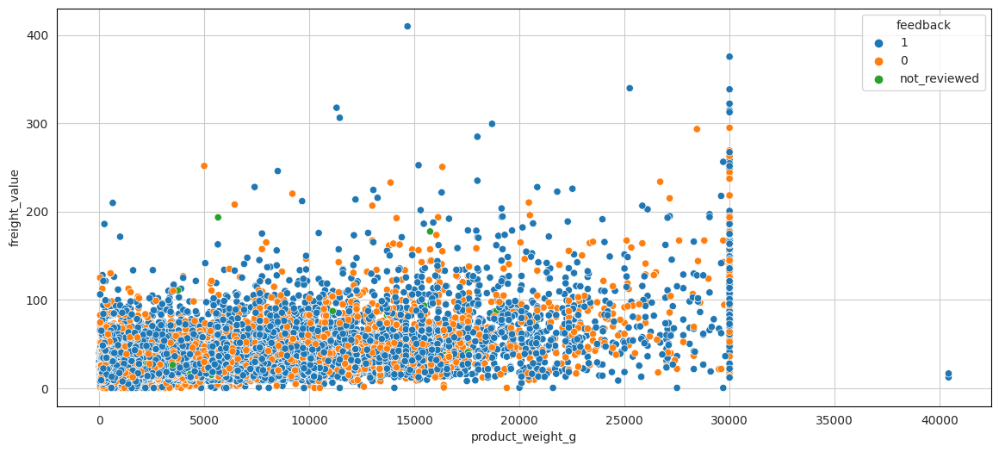

In [293]:
plt.figure(figsize=(14, 6))
sns.scatterplot(x='product_weight_g', y='freight_value', hue='feedback', data=core_rfm_pd)

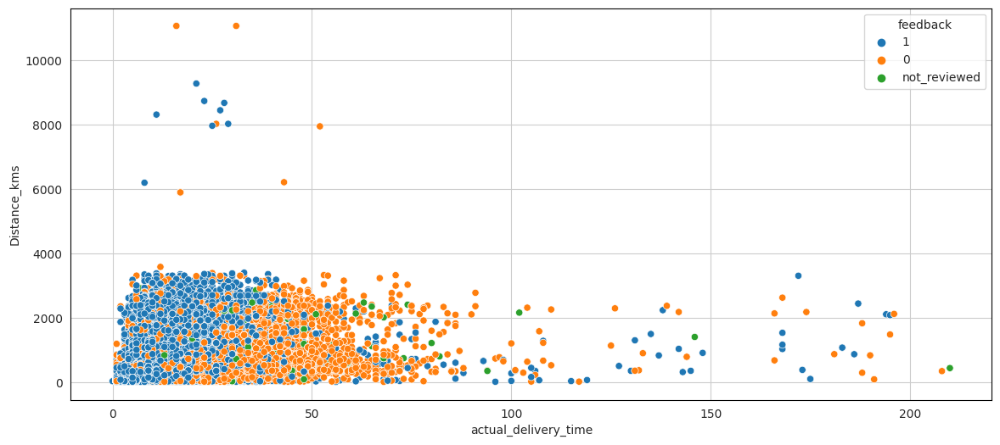

In [294]:
plt.figure(figsize=(14, 6))
sns.scatterplot(x='actual_delivery_time', y='Distance_kms', data=core_rfm_pd,  cmap='viridis', hue='feedback')

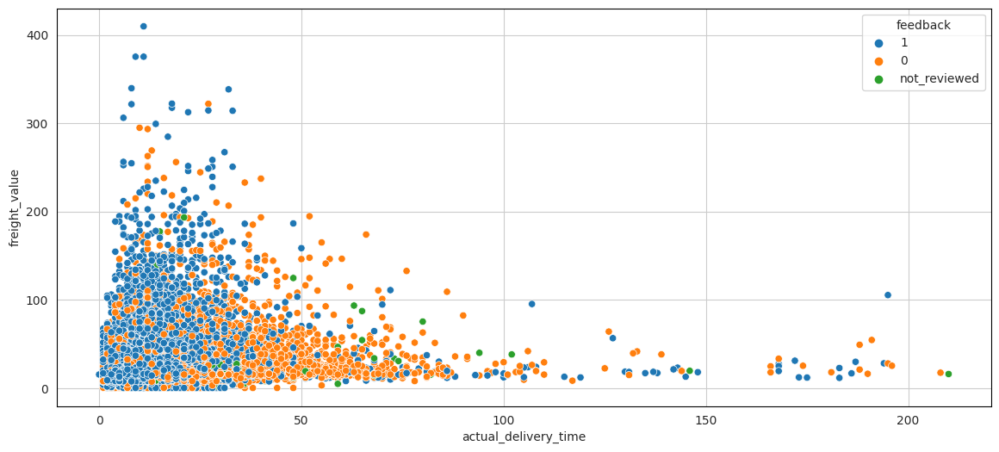

In [295]:
plt.figure(figsize=(14, 6))
sns.scatterplot(x='actual_delivery_time', y='freight_value', data=core_rfm_pd,  cmap='viridis', hue='feedback')

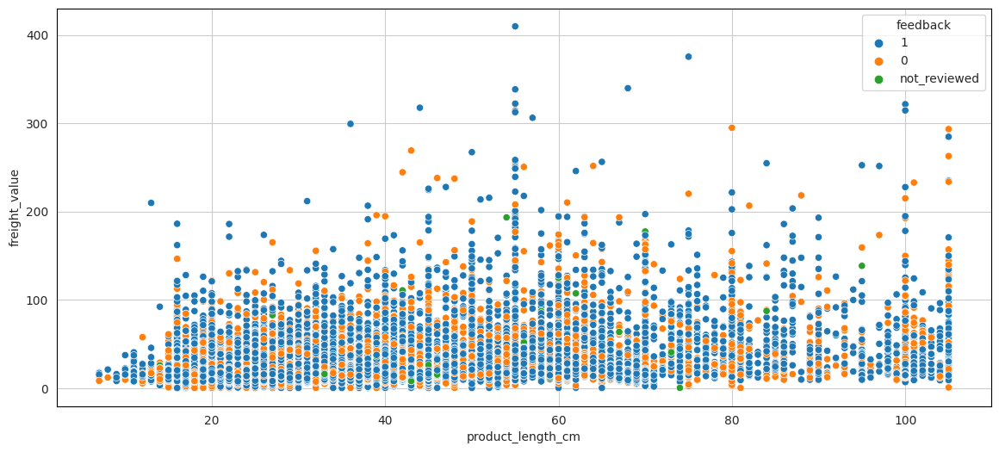

In [296]:
plt.figure(figsize=(14, 6))
sns.scatterplot(x='product_length_cm', y='freight_value', hue='feedback', data=core_rfm_pd)

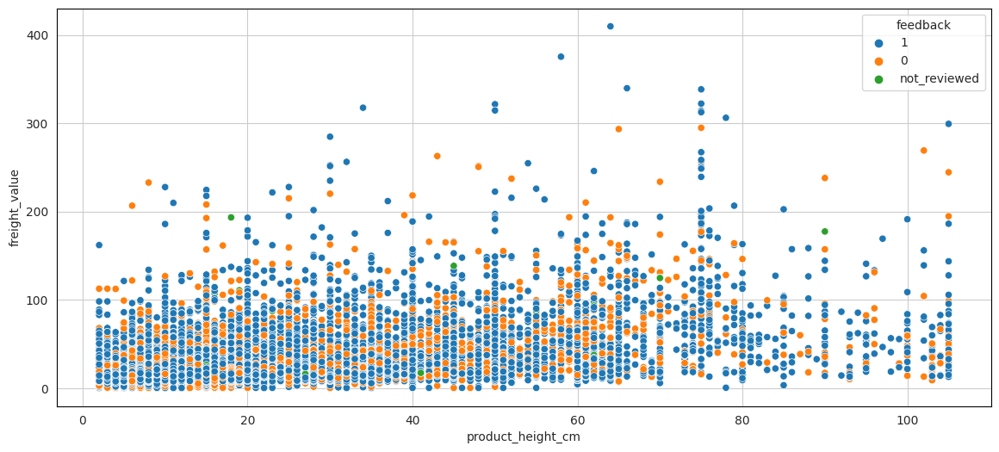

In [297]:
plt.figure(figsize=(14, 6))
sns.scatterplot(x='product_height_cm', y='freight_value', hue='feedback', data=core_rfm_pd)

###2.4 Chi-square Test Of Independence In Python

Null Hypothesis (H0): The 2 categorical variables to be compared are independent of each other.

Alternate Hypothesis (H1): The 2 categorical variables being compared are dependent on each other.

In [298]:
import numpy as np
import pandas as pd
import scipy.stats as stats
df_categorical = core_rfm_pd[['product_category_name','product_id', 'order_status','seller_city', 'seller_state','customer_state','customer_city','delivery_status', 'payment_type','floor_avg_review', 'customer_segment', 'month_order_purchase', 'weekday_order_purchase']]
df_categorical['floor_avg_review'] = df_categorical['floor_avg_review'].astype(str)
df_chisquare= df_categorical.dropna()

<ipython-input-298-6642f2f0e5ff>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_categorical['floor_avg_review'] = df_categorical['floor_avg_review'].astype(str)



2.4.1 Correlation between payment_type and target variable



In [299]:
#reference: https://machinelearningmastery.com/chi-squared-test-for-machine-learning/
from scipy.stats import chi2_contingency,chi2

#creating contengency table
table = pd.crosstab(df_chisquare["payment_type"],df_chisquare["floor_avg_review"],margins=False)

#chi_square test using scipy.stats library
chi_2,p_value,dof,expected = chi2_contingency(table)

alpha = 0.05
print("Level of significance : ",alpha)
print("p-value is : ",p_value)

if p_value < alpha:
    print("Reject null hypothesis")
else:
    print("Failed to reject null hypothesis")
print("*"*30)    
#interpreting test statistic    
prob=0.95
critical = chi2.ppf(prob, dof)

print("Critical value is : ",critical)
print("chi2(test statistic) value is : ",chi_2)

if chi_2>=critical:
    print("The two variables are dependent of each other")
else:
    print("The two variables are independent of each other")

Level of significance :  0.05
p-value is :  0.0006916929896724065
Reject null hypothesis
******************************
Critical value is :  24.995790139728616
chi2(test statistic) value is :  38.77781410536795
The two variables are dependent of each other


2.4.2 Correlation between delivery_status and target variable

In [300]:
#reference: https://machinelearningmastery.com/chi-squared-test-for-machine-learning/
from scipy.stats import chi2_contingency,chi2

#creating contengency table
table = pd.crosstab(df_chisquare["delivery_status"],df_chisquare["floor_avg_review"],margins=False)

#chi_square test using scipy.stats library
chi_2,p_value,dof,expected = chi2_contingency(table)

alpha = 0.05
print("Level of significance : ",alpha)
print("p-value is : ",p_value)

if p_value < alpha:
    print("Reject null hypothesis")
else:
    print("Failed to reject null hypothesis")
print("*"*30)    
#interpreting test statistic    
prob=0.95
critical = chi2.ppf(prob, dof)

print("Critical value is : ",critical)
print("chi2(test statistic) value is : ",chi_2)

if chi_2>=critical:
    print("The two variables are dependent of each other")
else:
    print("The two variables are independent of each other")

Level of significance :  0.05
p-value is :  0.0
Reject null hypothesis
******************************
Critical value is :  18.307038053275146
chi2(test statistic) value is :  14103.246545860584
The two variables are dependent of each other


2.4.3 Correlation between customer_segment and target variable

In [301]:
#reference: https://machinelearningmastery.com/chi-squared-test-for-machine-learning/
from scipy.stats import chi2_contingency,chi2

#creating contengency table
table = pd.crosstab(df_chisquare["customer_segment"],df_chisquare["floor_avg_review"],margins=False)

#chi_square test using scipy.stats library
chi_2,p_value,dof,expected = chi2_contingency(table)

alpha = 0.05
print("Level of significance : ",alpha)
print("p-value is : ",p_value)

if p_value < alpha:
    print("Reject null hypothesis")
else:
    print("Failed to reject null hypothesis")
print("*"*30)    
#interpreting test statistic    
prob=0.95
critical = chi2.ppf(prob, dof)

print("Critical value is : ",critical)
print("chi2(test statistic) value is : ",chi_2)

if chi_2>=critical:
    print("The two variables are dependent of each other")
else:
    print("The two variables are independent of each other")

Level of significance :  0.05
p-value is :  1.22518910745764e-229
Reject null hypothesis
******************************
Critical value is :  24.995790139728616
chi2(test statistic) value is :  1121.4118878802099
The two variables are dependent of each other


2.4.4 Correlation between seller_city and target variable

In [302]:
#reference: https://machinelearningmastery.com/chi-squared-test-for-machine-learning/
from scipy.stats import chi2_contingency,chi2

#creating contengency table
table = pd.crosstab(df_chisquare["seller_city"],df_chisquare["floor_avg_review"],margins=False)

#chi_square test using scipy.stats library
chi_2,p_value,dof,expected = chi2_contingency(table)

alpha = 0.05
print("Level of significance : ",alpha)
print("p-value is : ",p_value)

if p_value < alpha:
    print("Reject null hypothesis")
else:
    print("Failed to reject null hypothesis")
print("*"*30)    
#interpreting test statistic    
prob=0.95
critical = chi2.ppf(prob, dof)

print("Critical value is : ",critical)
print("chi2(test statistic) value is : ",chi_2)

if chi_2>=critical:
    print("The two variables are dependent of each other")
else:
    print("The two variables are independent of each other")

Level of significance :  0.05
p-value is :  5.433534341982825e-210
Reject null hypothesis
******************************
Critical value is :  3148.960697784422
chi2(test statistic) value is :  6095.3643729935675
The two variables are dependent of each other


2.4.5 Correlation between seller_state and target variable

In [303]:
#reference: https://machinelearningmastery.com/chi-squared-test-for-machine-learning/
from scipy.stats import chi2_contingency,chi2

#creating contengency table
table = pd.crosstab(df_chisquare["seller_state"],df_chisquare["floor_avg_review"],margins=False)

#chi_square test using scipy.stats library
chi_2,p_value,dof,expected = chi2_contingency(table)

alpha = 0.05
print("Level of significance : ",alpha)
print("p-value is : ",p_value)

if p_value < alpha:
    print("Reject null hypothesis")
else:
    print("Failed to reject null hypothesis")
print("*"*30)    
#interpreting test statistic    
prob=0.95
critical = chi2.ppf(prob, dof)

print("Critical value is : ",critical)
print("chi2(test statistic) value is : ",chi_2)

if chi_2>=critical:
    print("The two variables are dependent of each other")
else:
    print("The two variables are independent of each other")

Level of significance :  0.05
p-value is :  1.1548916850472549e-23
Reject null hypothesis
******************************
Critical value is :  135.48017792835952
chi2(test statistic) value is :  328.8402030523572
The two variables are dependent of each other


2.4.6 Correlation between customer_city and target variable

In [304]:
#reference: https://machinelearningmastery.com/chi-squared-test-for-machine-learning/
from scipy.stats import chi2_contingency,chi2

#creating contengency table
table = pd.crosstab(df_chisquare["customer_city"],df_chisquare["floor_avg_review"],margins=False)

#chi_square test using scipy.stats library
chi_2,p_value,dof,expected = chi2_contingency(table)

alpha = 0.05
print("Level of significance : ",alpha)
print("p-value is : ",p_value)

if p_value < alpha:
    print("Reject null hypothesis")
else:
    print("Failed to reject null hypothesis")
print("*"*30)    
#interpreting test statistic    
prob=0.95
critical = chi2.ppf(prob, dof)

print("Critical value is : ",critical)
print("chi2(test statistic) value is : ",chi_2)

if chi_2>=critical:
    print("The two variables are dependent of each other")
else:
    print("The two variables are independent of each other")

Level of significance :  0.05
p-value is :  2.7903360257113616e-207
Reject null hypothesis
******************************
Critical value is :  20874.515401350098
chi2(test statistic) value is :  27405.27015224656
The two variables are dependent of each other


2.4.7 Correlation between customer_state and target variable

In [305]:
#reference: https://machinelearningmastery.com/chi-squared-test-for-machine-learning/
from scipy.stats import chi2_contingency,chi2

#creating contengency table
table = pd.crosstab(df_chisquare["customer_state"],df_chisquare["floor_avg_review"],margins=False)

#chi_square test using scipy.stats library
chi_2,p_value,dof,expected = chi2_contingency(table)

alpha = 0.05
print("Level of significance : ",alpha)
print("p-value is : ",p_value)

if p_value < alpha:
    print("Reject null hypothesis")
else:
    print("Failed to reject null hypothesis")
print("*"*30)    
#interpreting test statistic    
prob=0.95
critical = chi2.ppf(prob, dof)

print("Critical value is : ",critical)
print("chi2(test statistic) value is : ",chi_2)

if chi_2>=critical:
    print("The two variables are dependent of each other")
else:
    print("The two variables are independent of each other")

Level of significance :  0.05
p-value is :  4.879954032136832e-206
Reject null hypothesis
******************************
Critical value is :  157.60992312288903
chi2(test statistic) value is :  1371.23499310824
The two variables are dependent of each other


2.4.8 Correlation between product_category_name and target variable



In [306]:
#reference: https://machinelearningmastery.com/chi-squared-test-for-machine-learning/
from scipy.stats import chi2_contingency,chi2

#creating contengency table
table = pd.crosstab(df_chisquare["product_category_name"],df_chisquare["floor_avg_review"],margins=False)

#chi_square test using scipy.stats library
chi_2,p_value,dof,expected = chi2_contingency(table)

alpha = 0.05
print("Level of significance : ",alpha)
print("p-value is : ",p_value)

if p_value < alpha:
    print("Reject null hypothesis")
else:
    print("Failed to reject null hypothesis")
print("*"*30)    
#interpreting test statistic    
prob=0.95
critical = chi2.ppf(prob, dof)

print("Critical value is : ",critical)
print("chi2(test statistic) value is : ",chi_2)

if chi_2>=critical:
    print("The two variables are dependent of each other")
else:
    print("The two variables are independent of each other")


Level of significance :  0.05
p-value is :  4.7051600815572665e-191
Reject null hypothesis
******************************
Critical value is :  405.24350231839315
chi2(test statistic) value is :  1807.5829446131434
The two variables are dependent of each other


2.4.9 Correlation between product_id and target variable

In [307]:
#reference: https://machinelearningmastery.com/chi-squared-test-for-machine-learning/
from scipy.stats import chi2_contingency,chi2

#creating contengency table
table = pd.crosstab(df_chisquare["product_id"],df_chisquare["floor_avg_review"],margins=False)

#chi_square test using scipy.stats library
chi_2,p_value,dof,expected = chi2_contingency(table)

alpha = 0.05
print("Level of significance : ",alpha)
print("p-value is : ",p_value)

if p_value < alpha:
    print("Reject null hypothesis")
else:
    print("Failed to reject null hypothesis")
print("*"*30)    
#interpreting test statistic    
prob=0.95
critical = chi2.ppf(prob, dof)

print("Critical value is : ",critical)
print("chi2(test statistic) value is : ",chi_2)

if chi_2>=critical:
    print("The two variables are dependent of each other")
else:
    print("The two variables are independent of each other")


Level of significance :  0.05
p-value is :  0.0
Reject null hypothesis
******************************
Critical value is :  164582.12995045295
chi2(test statistic) value is :  195799.44905822285
The two variables are dependent of each other


2.4.10 Correlation between month_order_purchase and target variable

In [308]:
#reference: https://machinelearningmastery.com/chi-squared-test-for-machine-learning/
from scipy.stats import chi2_contingency,chi2

#creating contengency table
table = pd.crosstab(df_chisquare["month_order_purchase"],df_chisquare["floor_avg_review"],margins=False)

#chi_square test using scipy.stats library
chi_2,p_value,dof,expected = chi2_contingency(table)

alpha = 0.05
print("Level of significance : ",alpha)
print("p-value is : ",p_value)

if p_value < alpha:
    print("Reject null hypothesis")
else:
    print("Failed to reject null hypothesis")
print("*"*30)    
#interpreting test statistic    
prob=0.95
critical = chi2.ppf(prob, dof)

print("Critical value is : ",critical)
print("chi2(test statistic) value is : ",chi_2)

if chi_2>=critical:
    print("The two variables are dependent of each other")
else:
    print("The two variables are independent of each other")

Level of significance :  0.05
p-value is :  4.763442271154294e-276
Reject null hypothesis
******************************
Critical value is :  73.31149302908324
chi2(test statistic) value is :  1492.7752346020231
The two variables are dependent of each other


2.4.11 Correlation between weekday_order_purchase and target variable

In [309]:
#reference: https://machinelearningmastery.com/chi-squared-test-for-machine-learning/
from scipy.stats import chi2_contingency,chi2

#creating contengency table
table = pd.crosstab(df_chisquare["weekday_order_purchase"],df_chisquare["floor_avg_review"],margins=False)

#chi_square test using scipy.stats library
chi_2,p_value,dof,expected = chi2_contingency(table)

alpha = 0.05
print("Level of significance : ",alpha)
print("p-value is : ",p_value)

if p_value < alpha:
    print("Reject null hypothesis")
else:
    print("Failed to reject null hypothesis")
print("*"*30)    
#interpreting test statistic    
prob=0.95
critical = chi2.ppf(prob, dof)

print("Critical value is : ",critical)
print("chi2(test statistic) value is : ",chi_2)

if chi_2>=critical:
    print("The two variables are dependent of each other")
else:
    print("The two variables are independent of each other")

Level of significance :  0.05
p-value is :  4.395483431574309e-12
Reject null hypothesis
******************************
Critical value is :  43.77297182574219
chi2(test statistic) value is :  116.19597744003036
The two variables are dependent of each other


###2.5 Hypotheses:

The null hypothesis (H0): There is no difference among group means.

The alternative hypothesis (H1): There is at least one group that differs significantly from the overall mean of the dependent variable.

In [310]:
df_numerical = core_rfm_pd[["avg_review_score","floor_avg_review","total_order_value", "total_price_per_order", "freight_value", "product_name_lenght","product_description_lenght","product_photos_qty", "product_weight_g", "product_length_cm", "product_height_cm", "product_width_cm","max_payment_installments", "total_payment_value", "Distance_kms", "order_freight_ratio", "diff_in_delivery_time", "actual_delivery_time"]]
df_anova= df_numerical.dropna()

##### 2.5.1 Customers who spend more on freight value tend to give a negative review score. If a customer spends more, that customer is likely to expect more.

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


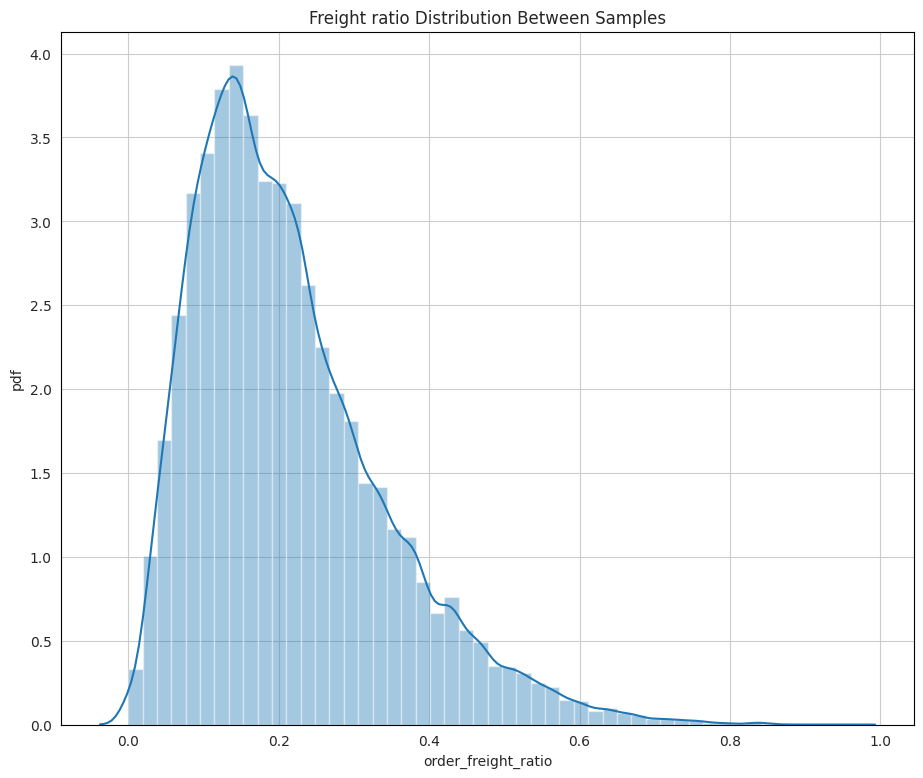

In [311]:
f, ax = plt.subplots(figsize=(11,9))
plt.title('Freight ratio Distribution Between Samples')
plt.ylabel('pdf')
sns.distplot(df_anova.order_freight_ratio)

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

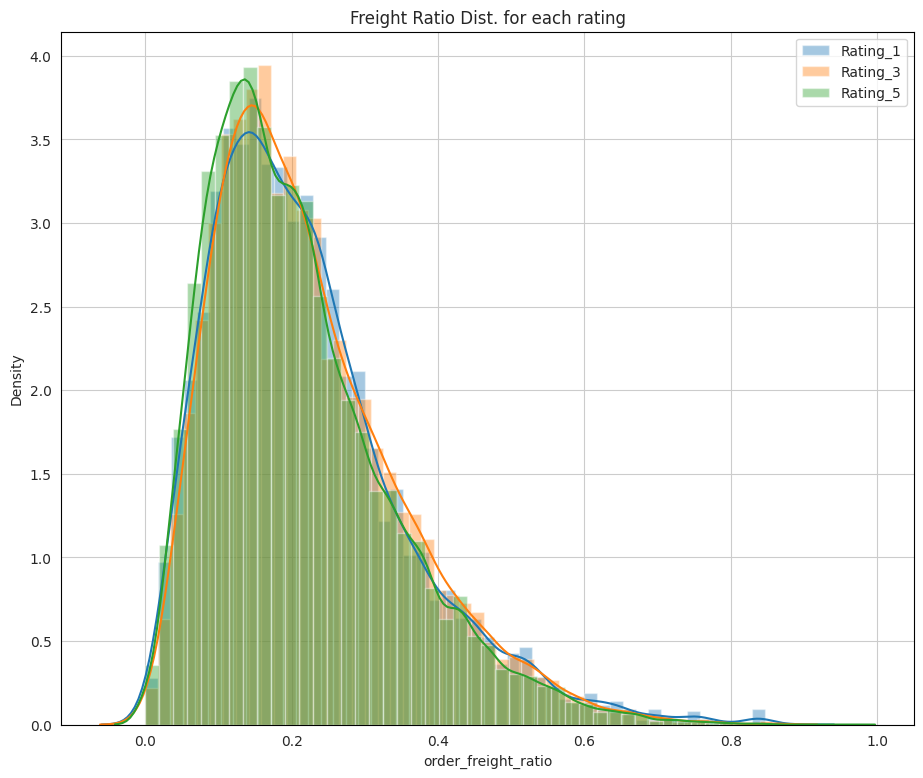

In [312]:
f, ax = plt.subplots(figsize=(11,9))
sns.distplot(df_anova[df_anova.avg_review_score== 1].order_freight_ratio, ax=ax, label='Rating_1')
sns.distplot(df_anova[df_anova.avg_review_score== 3].order_freight_ratio, ax=ax, label='Rating_3')
sns.distplot(df_anova[df_anova.avg_review_score == 5].order_freight_ratio, ax=ax, label='Rating_5')
plt.title('Freight Ratio Dist. for each rating')
plt.legend()


In [313]:
df_anova.groupby('avg_review_score').agg(
    [np.mean, np.median, np.count_nonzero, np.std]
).order_freight_ratio

,mean,median,count_nonzero,std
avg_review_score,,,,
1.0,0.220350,0.195370,13640,0.133692
1.5,0.210895,0.204042,18,0.085493
2.0,0.222289,0.195929,3783,0.128788
2.5,0.253223,0.225236,45,0.128559
3.0,0.222683,0.197388,9333,0.128433
3.5,0.216862,0.180476,31,0.123077
4.0,0.213906,0.188567,21082,0.125783
4.5,0.252070,0.199964,68,0.134436
5.0,0.209562,0.184629,62795,0.126220


In [314]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

model = ols('order_freight_ratio ~ C(avg_review_score)', data=df_anova).fit()
aov_table = sm.stats.anova_lm(model, typ=2)
aov_table

,sum_sq,df,F,PR(>F)
C(avg_review_score),2.872842,8.0,22.140841,4.409665e-34
Residual,1803.032127,111167.0,NaN,NaN


The p-value is less than α = 0.05, we reject the null hypothesis of the ANOVA and conclude that there is a statistically significant difference between the means of the 5 groups.

##### 2.4.2 Customers who receive orders in more delivery days tend to give a negative review.

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

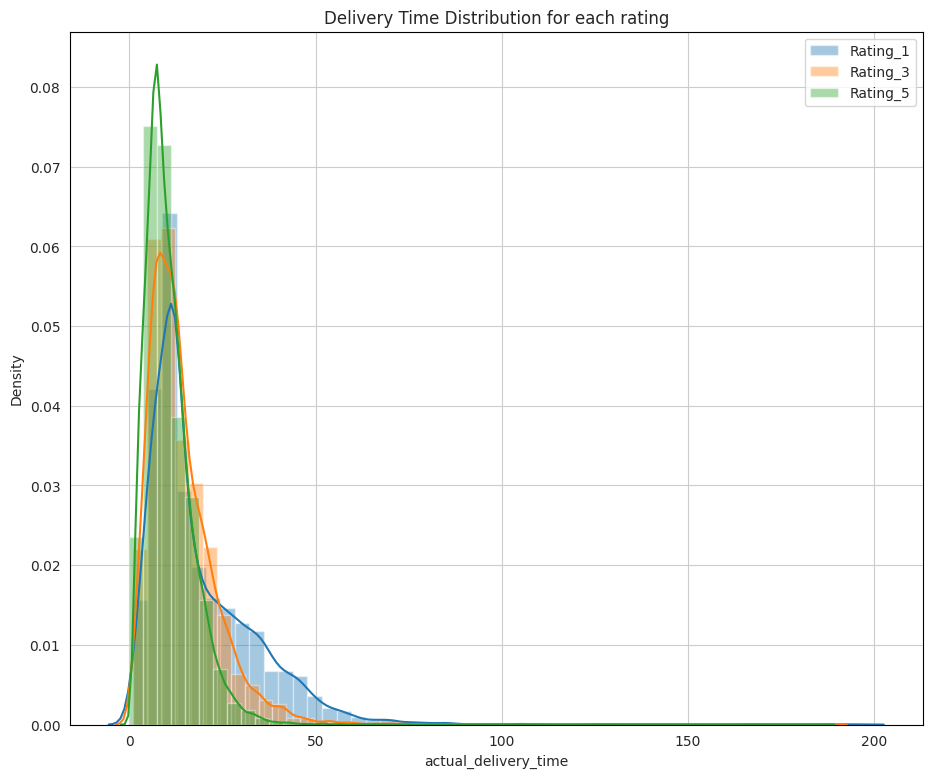

In [315]:
f, ax = plt.subplots(figsize=(11,9))
sns.distplot(df_anova[df_anova.avg_review_score== 1].actual_delivery_time, ax=ax, label='Rating_1')
sns.distplot(df_anova[df_anova.avg_review_score== 3].actual_delivery_time, ax=ax, label='Rating_3')
sns.distplot(df_anova[df_anova.avg_review_score == 5].actual_delivery_time, ax=ax, label='Rating_5')
plt.title('Delivery Time Distribution for each rating')
plt.legend()

In [316]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

model = ols('actual_delivery_time ~ C(avg_review_score)', data=df_anova).fit()
aov_table = sm.stats.anova_lm(model, typ=2)
aov_table

,sum_sq,df,F,PR(>F)
C(avg_review_score),8.429143e+05,8.0,1336.939348,0.0
Residual,8.761079e+06,111167.0,NaN,NaN


##### 2.4.3 Customers who are located far from the sellers tend to give a negative score because orders take longer to arrive.

In [317]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

model = ols('Distance_kms ~ C(avg_review_score)', data=df_anova).fit()
aov_table = sm.stats.anova_lm(model, typ=2)
aov_table

,sum_sq,df,F,PR(>F)
C(avg_review_score),1.403464e+08,8.0,48.493284,9.828840e-79
Residual,4.021661e+10,111167.0,NaN,NaN


The p-value is less than α = 0.05, we reject the null hypothesis of the 
ANOVA and conclude that there is a statistically significant difference between the means of the 5 groups.

##### 2.4.4 Customers are not satisfied when the delivery of days exceeds the estimated days for delivery, which make them to give a negative review score.

In [318]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

model = ols('diff_in_delivery_time ~ C(floor_avg_review)', data=df_anova).fit()
aov_table = sm.stats.anova_lm(model, typ=2)
aov_table

,sum_sq,df,F,PR(>F)
C(floor_avg_review),5.746686e+05,4.0,1512.555706,0.0
Residual,1.055936e+07,111171.0,NaN,NaN


The p-value is less than α = 0.05, we reject the null hypothesis of the 
ANOVA and conclude that there is a statistically significant difference between the means of the 5 groups.

##### 2.4.5 Customers who spend more tend to give a negative review score. If a customer spends more, that customer is likely to expect more.

In [319]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

model = ols('total_price_per_order ~ C(floor_avg_review)', data=df_anova).fit()
aov_table = sm.stats.anova_lm(model, typ=2)
aov_table

,sum_sq,df,F,PR(>F)
C(floor_avg_review),4.420709e+07,4.0,172.028317,3.748510e-147
Residual,7.142060e+09,111171.0,NaN,NaN


The p-value is less than α = 0.05, we reject the null hypothesis of the 
ANOVA and conclude that there is a statistically significant difference between the means of the 5 groups.

##### 2.4.6 Customers who pay in more installments tend to give a negative review score. These customers will have been paying for the product for a long time, so they probably expect more

In [320]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

model = ols('max_payment_installments ~ C(floor_avg_review)', data=df_anova).fit()
aov_table = sm.stats.anova_lm(model, typ=2)
aov_table

,sum_sq,df,F,PR(>F)
C(floor_avg_review),2359.522083,4.0,75.467134,5.240845e-64
Residual,868955.852566,111171.0,NaN,NaN


The p-value is less than α = 0.05, we reject the null hypothesis of the 
ANOVA and conclude that there is a statistically significant difference between the means of the 5 groups.

###2.5 Feature Selection

2.5.1- Dropping features: 

- Drop product_name_length, product_description_length, product_photos_qty as they have no impact on rating.

- Drop product_weight_g, product_length_cm, product_height_cm, product_width_cm as they are highly correlated with freight_value.

- Drop customer_zip_code, customer_longitude, customer_latitude, seller_zip_code, seller_longitude, seller_latitude as they are replaced by "Distance_kms".

- Drop review_comment_title, review_comment_message as they are missing more than half of the dataset and the dataset does not show which product they belong to.

- Drop order_status as it has only one value "Delivered".

- Drop order_approved_at, order_delivered_customer_timestamp as they are replaced by "actual_delivery_time".

- Drop order_estimated_delivery_date as it is replaced by "diff_in_delivery_time"

- Drop 'rfm_scores' as they are bimodal and replaced by "Cluster".

- Drop 'total_payment_value' as it's highly correlated with 'total_order_value'

- Drop 'price' as it's highly correlated with 'total_order_value'

- Make "floor_avg_review" our label so that our observations belong to 5 classes and rename it "Rating".

In [321]:
label_renamed_df= core_segments.drop("customer_segment")\
                               .withColumnRenamed("floor_avg_review","Rating")\
                               .withColumnRenamed("Cluster", "customer_segment")
label_renamed_df.printSchema()

root
 |-- order_id: string (nullable = true)
 |-- order_item_id: string (nullable = true)
 |-- product_id: string (nullable = true)
 |-- seller_id: string (nullable = true)
 |-- shipping_limit_date: date (nullable = true)
 |-- price: double (nullable = true)
 |-- freight_value: double (nullable = true)
 |-- product_category_name: string (nullable = false)
 |-- product_name_lenght: integer (nullable = true)
 |-- product_description_lenght: integer (nullable = true)
 |-- product_photos_qty: integer (nullable = true)
 |-- product_weight_g: integer (nullable = true)
 |-- product_length_cm: integer (nullable = true)
 |-- product_height_cm: integer (nullable = true)
 |-- product_width_cm: integer (nullable = true)
 |-- seller_city: string (nullable = true)
 |-- seller_state: string (nullable = true)
 |-- customer_id: string (nullable = true)
 |-- order_status: string (nullable = true)
 |-- order_purchase_timestamp: date (nullable = true)
 |-- order_approved_at: date (nullable = true)
 |-- or

In [322]:
selected_cols = ['order_id','customer_segment','seller_id', 'product_id','product_category_name','payment_type','delivery_status','weekday_order_purchase','month_order_purchase', 'total_order_value', 'order_freight_ratio', 'Distance_kms', 'diff_in_delivery_time', 'actual_delivery_time','max_payment_installments', 'Rating']
selected_cols_df = label_renamed_df.select(*selected_cols)
print(selected_cols_df.count())
print(selected_cols_df.printSchema())

112101
root
 |-- order_id: string (nullable = true)
 |-- customer_segment: long (nullable = true)
 |-- seller_id: string (nullable = true)
 |-- product_id: string (nullable = true)
 |-- product_category_name: string (nullable = false)
 |-- payment_type: string (nullable = false)
 |-- delivery_status: string (nullable = true)
 |-- weekday_order_purchase: string (nullable = true)
 |-- month_order_purchase: integer (nullable = true)
 |-- total_order_value: double (nullable = true)
 |-- order_freight_ratio: double (nullable = true)
 |-- Distance_kms: float (nullable = true)
 |-- diff_in_delivery_time: integer (nullable = true)
 |-- actual_delivery_time: integer (nullable = true)
 |-- max_payment_installments: integer (nullable = true)
 |-- Rating: long (nullable = true)

None


In [323]:
selected_cols_df.select('Rating').distinct().show()

+------+
|Rating|
+------+
|  null|
|     5|
|     1|
|     3|
|     2|
|     4|
+------+



In [324]:
categorical_cols= [item[0] for item in selected_cols_df.dtypes if item[1].startswith('string') and item[0] != "order_id"]
print("Categorical:", categorical_cols, "\n")
numeric_cols = [item[0] for item in selected_cols_df.dtypes if item[1].startswith('int')|item[1].startswith('double')|item[1].startswith('float') and item[0] != "Rating"]
print("Numerical:", numeric_cols, "\n")
label = ['Rating']

Categorical: ['seller_id', 'product_id', 'product_category_name', 'payment_type', 'delivery_status', 'weekday_order_purchase'] 

Numerical: ['month_order_purchase', 'total_order_value', 'order_freight_ratio', 'Distance_kms', 'diff_in_delivery_time', 'actual_delivery_time', 'max_payment_installments'] 



In [325]:
from pyspark.sql.functions import col
for col_name in selected_cols_df.columns:
  print("The count of null rows in column %s" %col_name,
  selected_cols_df.where(col(col_name).isNull()).count())

The count of null rows in column order_id 0
The count of null rows in column customer_segment 0
The count of null rows in column seller_id 0
The count of null rows in column product_id 0
The count of null rows in column product_category_name 0
The count of null rows in column payment_type 0
The count of null rows in column delivery_status 0
The count of null rows in column weekday_order_purchase 0
The count of null rows in column month_order_purchase 0
The count of null rows in column total_order_value 0
The count of null rows in column order_freight_ratio 0
The count of null rows in column Distance_kms 0
The count of null rows in column diff_in_delivery_time 0
The count of null rows in column actual_delivery_time 0
The count of null rows in column max_payment_installments 0
The count of null rows in column Rating 925


In [326]:
selected_cols_df.groupBy("Rating").count().show()

+------+-----+
|Rating|count|
+------+-----+
|  null|  925|
|     5|63041|
|     1|13689|
|     3| 9381|
|     2| 3843|
|     4|21222|
+------+-----+



###2.6 Feature Transformation



2.6.1- Transform Categorical Featues:

In [327]:
categorical_cols

['seller_id',
 'product_id',
 'product_category_name',
 'payment_type',
 'delivery_status',
 'weekday_order_purchase']

2.6.1.1- String Indexer

- Create an array of StringIndexers to convert the categorical values to indices

In [328]:
from pyspark.ml.feature import StringIndexer
cat_indexers = [StringIndexer(
    inputCol=column, 
    outputCol=column + '_index', 
    handleInvalid='keep') for column in categorical_cols]

2.6.1.2- OneHotEncoding

- Use the indexed field to obtain a one-hot-encoded field

In [329]:
from pyspark.ml.feature import OneHotEncoder
cat_encoders_1 = [OneHotEncoder(
    inputCol=column + '_index', 
    outputCol= column + '_encoded') for column in categorical_cols]
cat_encoders_2 =  [OneHotEncoder(
    inputCol=column, 
    outputCol= column + '_encoded') for column in ["customer_segment", "month_order_purchase"]]

2.6.1.3- Create a pipeline

The pipeline contains the array of StringIndexers, OneHotEncoders.

In [330]:
from pyspark.ml import Pipeline

pipeline_indexers = Pipeline(stages= cat_indexers)
pipeline_encoders = Pipeline(stages= cat_indexers + cat_encoders_1 + cat_encoders_2)

In [331]:
pre_chi_test_df= pipeline_indexers.fit(selected_cols_df).transform(selected_cols_df)

2.6.1.2- ChiSqSelector

- ChiSqSelector implements Chi-Squared feature selection. It operates on labeled data with categorical features. ChiSqSelector uses the Chi-Squared test of independence to decide which features to choose.

In [332]:
chi_test_df = pre_chi_test_df.filter(pre_chi_test_df.Rating.isNotNull())

 Vector Assembler:

- VectorAssembler is a transformer that combines a given list of columns into a single vector column. It is useful for combining raw features and features generated by different feature transformers into a single feature vector

In [333]:
from pyspark.ml.feature import VectorAssembler

assembler = VectorAssembler(
    inputCols=["customer_segment", "month_order_purchase", "seller_id_index", "product_category_name_index", "payment_type_index", "weekday_order_purchase_index", "delivery_status_index"],
    outputCol="features")


In [334]:
output = assembler.transform(chi_test_df)

In [335]:
from pyspark.ml.feature import ChiSqSelector
selector = ChiSqSelector(numTopFeatures=4, featuresCol="features",
                         outputCol="selectedFeatures", labelCol="Rating")

In [336]:
from pyspark.sql.functions import col
result = selector.fit(output).transform(output)
print("ChiSqSelector output with top %d features selected" % selector.getNumTopFeatures())


ChiSqSelector output with top 4 features selected


In [337]:
result = result.select(col("features"),col("selectedFeatures"))

In [338]:
result.show(13, False)

+--------------------------------+--------------------+
|features                        |selectedFeatures    |
+--------------------------------+--------------------+
|[0.0,9.0,150.0,11.0,0.0,2.0,0.0]|[0.0,9.0,150.0,11.0]|
|[2.0,4.0,161.0,17.0,0.0,2.0,0.0]|[2.0,4.0,161.0,17.0]|
|[3.0,1.0,1073.0,3.0,0.0,5.0,0.0]|[3.0,1.0,1073.0,3.0]|
|[1.0,8.0,999.0,12.0,0.0,2.0,0.0]|[1.0,8.0,999.0,12.0]|
|[0.0,2.0,696.0,8.0,0.0,6.0,0.0] |[0.0,2.0,696.0,8.0] |
|[0.0,5.0,798.0,5.0,1.0,0.0,0.0] |[0.0,5.0,798.0,5.0] |
|[1.0,12.0,84.0,7.0,0.0,5.0,0.0] |[1.0,12.0,84.0,7.0] |
|[3.0,7.0,2717.0,8.0,0.0,2.0,0.0]|[3.0,7.0,2717.0,8.0]|
|[3.0,3.0,123.0,1.0,0.0,0.0,2.0] |[3.0,3.0,123.0,1.0] |
|[1.0,7.0,286.0,38.0,0.0,0.0,0.0]|[1.0,7.0,286.0,38.0]|
|[1.0,3.0,3.0,1.0,0.0,6.0,0.0]   |[1.0,3.0,3.0,1.0]   |
|[1.0,7.0,899.0,16.0,0.0,4.0,2.0]|[1.0,7.0,899.0,16.0]|
|[1.0,7.0,1.0,0.0,0.0,1.0,0.0]   |[1.0,7.0,1.0,0.0]   |
+--------------------------------+--------------------+
only showing top 13 rows




>_According to ChiSqSelector, the top 4 useful features are: Cluster, product_category_name, month_order_purchase and seller_id and the least useful features are payment_type and weekday_order_purchase_

2.6.1.4- Chi Square Test:

Null Hypothesis (H0): Two variables are independent.

Alternate Hypothesis (H1): Two variables are not independent.

In [339]:
selected_cols = ["customer_segment", "month_order_purchase", "seller_id_index", "product_category_name_index", "weekday_order_purchase_index","delivery_status_index", "Rating"]

In [340]:
chi_test_df_2= chi_test_df.select(*selected_cols)

In [341]:
chi_test_pd= chi_test_df_2.toPandas()

In [342]:
from sklearn.feature_selection import chi2
X= chi_test_pd.drop('Rating', axis=1)
y= chi_test_pd['Rating']
chi_scores = chi2(X,y)

display(chi_scores)

(array([8.94817985e+02, 1.98227386e+02, 6.99320063e+04, 4.16881648e+02,
        4.14847563e+01, 9.22583628e+03]),
 array([2.21012909e-192, 9.03573653e-042, 0.00000000e+000, 6.25693645e-089,
        2.13307773e-008, 0.00000000e+000]))

The first array represents chi square values and second array represnts p-values

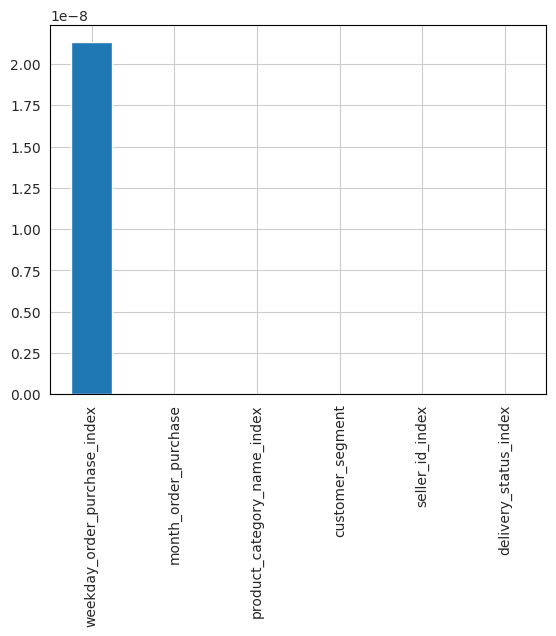

In [343]:
p_values = pd.Series(chi_scores[1],index = X.columns)
p_values.sort_values(ascending = False , inplace = True)
p_values.plot.bar()

*Since weekday_order_purchase_index has the highest p-value, we conclude that this feature is independent of the respsone and can not be considered for model training*




2.6.2- Transform Numerical Featues:

In [344]:
selected_pd = selected_cols_df.toPandas()

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

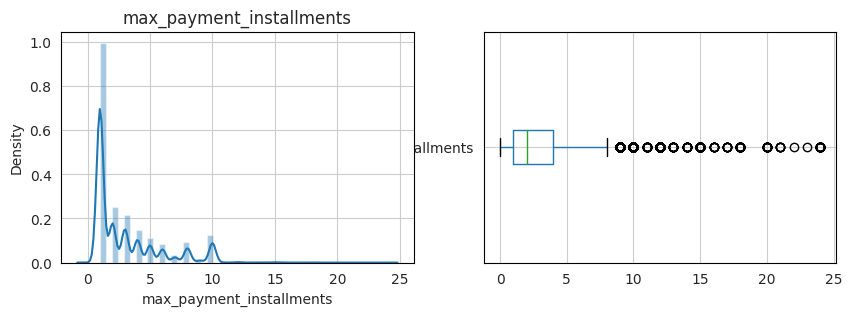

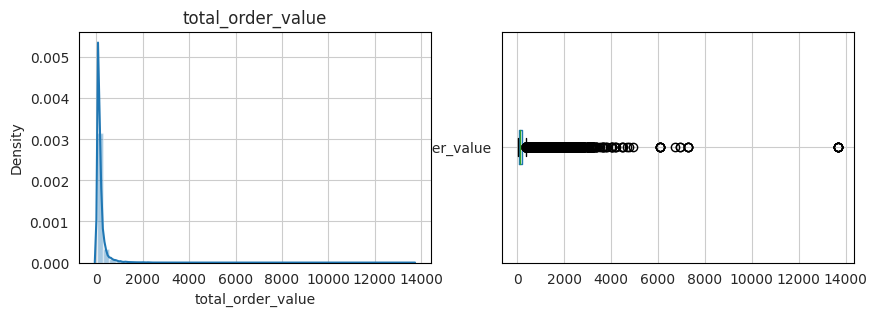

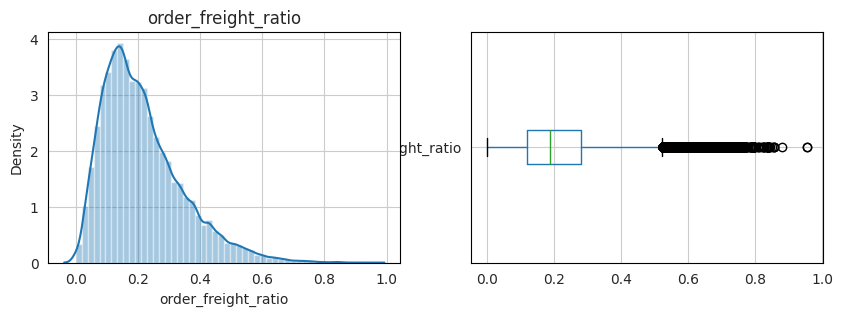

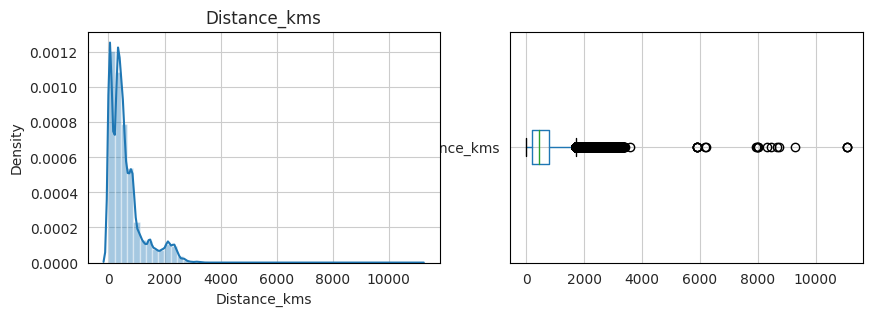

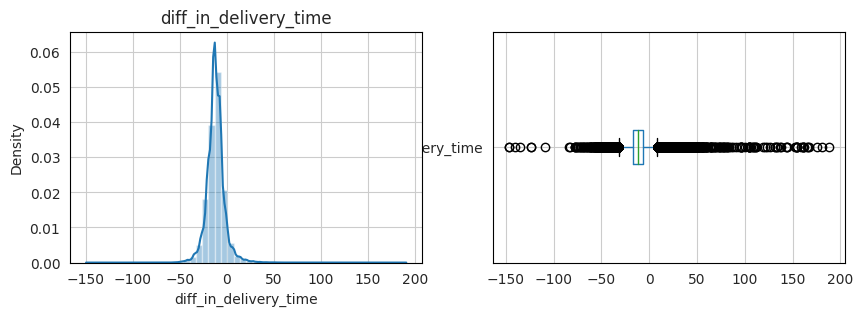

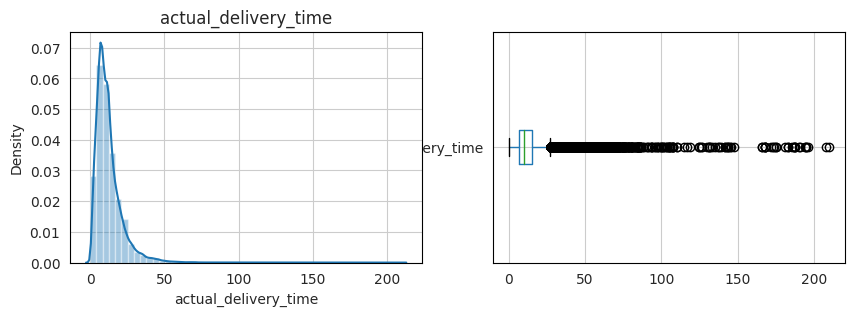

In [345]:
for column in ['max_payment_installments', 'total_order_value', 'order_freight_ratio', 'Distance_kms', 'diff_in_delivery_time', 'actual_delivery_time']:
    fig, axes = plt.subplots(ncols=2, figsize=(10, 3), sharey=False)
    plt.subplot(1, 2, 1)
    plt.title(column)
    sns.distplot(selected_pd[column].dropna())
    selected_pd.boxplot(column=column, vert=False, rot=0, return_type='axes', ax=axes[1]) 

max_payment_installments, actual_delievery_time, Distance_kms, total_order_value, total_payment_value and highly right skewed.

2.6.2.1- Log Transformation:

- Applying Log Transformation to max_payment_installments, actual_delievery_time, Distance_kms, total_order_value as they are highly left skewed.

In [346]:
import math
from pyspark.sql.types import DoubleType
@udf(returnType=DoubleType()) 
def LogTransform(x):
    log_x = math.log10(x+1)
    return (log_x)

In [347]:
selected_cols_df.columns

['order_id',
 'customer_segment',
 'seller_id',
 'product_id',
 'product_category_name',
 'payment_type',
 'delivery_status',
 'weekday_order_purchase',
 'month_order_purchase',
 'total_order_value',
 'order_freight_ratio',
 'Distance_kms',
 'diff_in_delivery_time',
 'actual_delivery_time',
 'max_payment_installments',
 'Rating']

In [348]:
from pyspark.sql.functions import col
log_df = selected_cols_df.withColumn("total_order_value", LogTransform(col("total_order_value"))) \
                       .withColumn("Distance_kms", LogTransform(col("Distance_kms"))) \
                       .withColumn("actual_delivery_time", LogTransform(col("actual_delivery_time")))\
                       .withColumn("max_payment_installments", LogTransform(col("max_payment_installments")))

In [349]:
log_df.show()

+--------------------+----------------+--------------------+--------------------+---------------------+------------+---------------+----------------------+--------------------+------------------+--------------------+------------------+---------------------+--------------------+------------------------+------+
|            order_id|customer_segment|           seller_id|          product_id|product_category_name|payment_type|delivery_status|weekday_order_purchase|month_order_purchase| total_order_value| order_freight_ratio|      Distance_kms|diff_in_delivery_time|actual_delivery_time|max_payment_installments|Rating|
+--------------------+----------------+--------------------+--------------------+---------------------+------------+---------------+----------------------+--------------------+------------------+--------------------+------------------+---------------------+--------------------+------------------------+------+
|00010242fe8c5a6d1...|               0|48436dade18ac8b2b...|4244733

In [350]:
log_pd = log_df.toPandas()

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

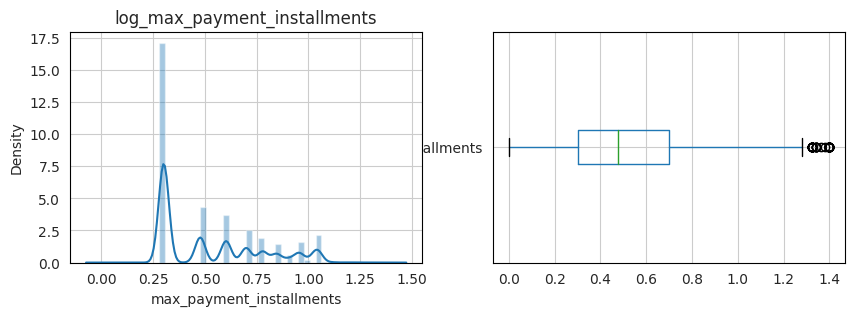

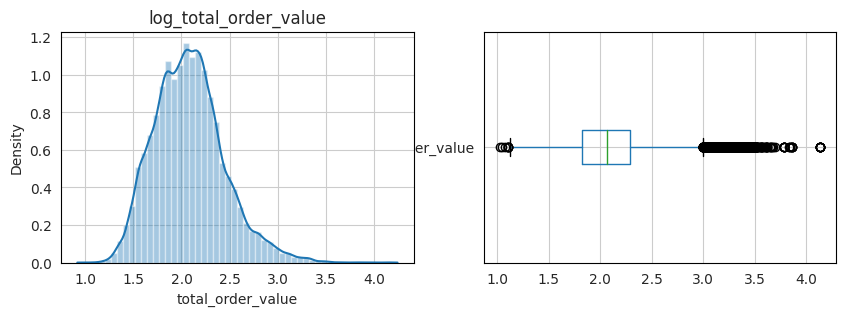

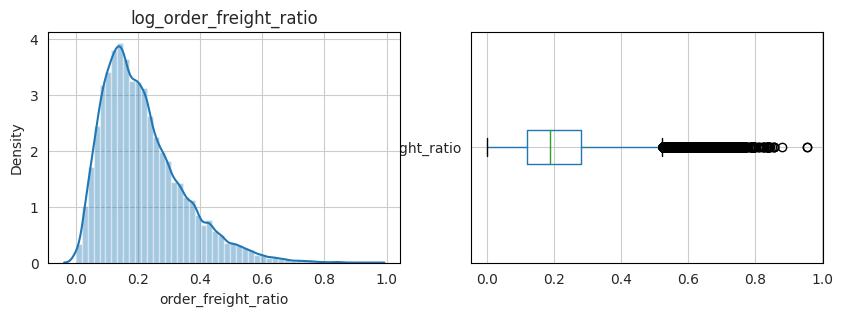

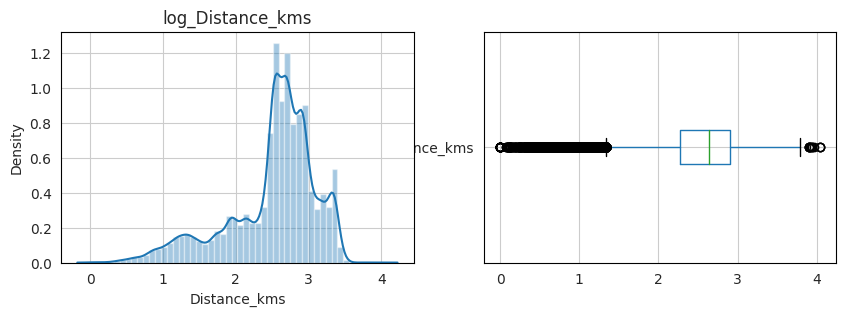

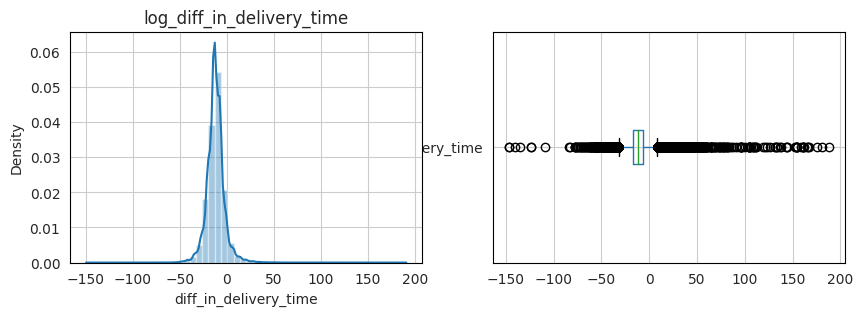

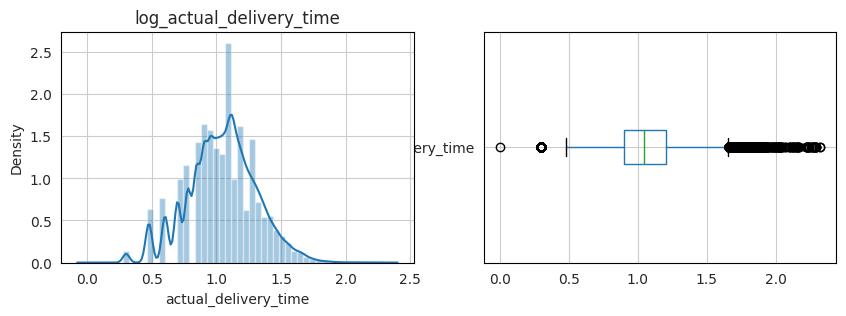

In [351]:
for column in ['max_payment_installments', 'total_order_value', 'order_freight_ratio', 'Distance_kms', 'diff_in_delivery_time', 'actual_delivery_time']:
    fig, axes = plt.subplots(ncols=2, figsize=(10, 3), sharey=False)
    plt.subplot(1, 2, 1)
    plt.title(f"log_{column}")
    sns.distplot(log_pd[column].dropna())
    log_pd.boxplot(column=column, vert=False, rot=0, return_type='axes', ax=axes[1]) 

2.6.2.2- Vector Assembler
- Create an array of VectorAssembler to vectorize the numerical values

In [352]:
from pyspark.ml.feature import VectorAssembler
num_assemblers = [VectorAssembler(
    inputCols=[column], 
    outputCol=column + '_vectorized', 
    handleInvalid='keep') for column in numeric_cols if column not in ['customer_segment', 'month_order_purchase', 'Rating']]

2.6.2.3- StandardScaler
- Create an array of StandardScaler to standardize the vectors

In [353]:
from pyspark.ml.feature import StandardScaler
num_scalers = [StandardScaler(
    inputCol=column + '_vectorized', 
    outputCol=column + '_standardized',
) for column in numeric_cols if column not in ['customer_segment', 'month_order_purchase', 'Rating']]

2.6.2.4- MinMaxScaler
- Create a Vector rows, rescaling each feature to a specific range (often [0, 1]).

In [354]:
from pyspark.ml.feature import MinMaxScaler

num_minmax = [MinMaxScaler(
    inputCol=column + '_vectorized', 
    outputCol=column + '_normalized',
) for column in numeric_cols if column not in ['customer_segment', 'month_order_purchase', 'Rating']]


2.6.2.5- Label Indexer
- Tranform the labels to integers with range (0,8)

In [355]:
from pyspark.sql.functions import when
label_renamed_df = log_df.withColumn("Label", when(log_df.Rating == 1, 0)\
                                 .when(log_df.Rating == 2, 1)\
                                 .when(log_df.Rating == 3, 2)\
                                 .when(log_df.Rating == 4, 3)\
                                 .when(log_df.Rating == 5, 4)\
                                 .otherwise(log_df.Rating))

2.6.3- Split The Dataset:
- Split the dataset into Training and Test:

In [356]:
TrainingDataset= label_renamed_df.filter(label_renamed_df.Rating.isNotNull())
Test_dataset= label_renamed_df.filter(label_renamed_df.Rating.isNull())\
                                      .drop(col('Rating'))
print("Test dataset size:", Test_dataset.count(), "\n")
print("Training dataset size:", TrainingDataset.count(), "\n")

Test dataset size: 925 

Training dataset size: 111176 



In [357]:
TrainingDataset_transformed = pipeline_indexers.fit(TrainingDataset).transform(TrainingDataset)

In [358]:
TrainingDataset_transformed.columns

['order_id',
 'customer_segment',
 'seller_id',
 'product_id',
 'product_category_name',
 'payment_type',
 'delivery_status',
 'weekday_order_purchase',
 'month_order_purchase',
 'total_order_value',
 'order_freight_ratio',
 'Distance_kms',
 'diff_in_delivery_time',
 'actual_delivery_time',
 'max_payment_installments',
 'Rating',
 'Label',
 'seller_id_index',
 'product_id_index',
 'product_category_name_index',
 'payment_type_index',
 'delivery_status_index',
 'weekday_order_purchase_index']

In [359]:
TrainingDataset_transformed.groupBy("Rating").count().show()

+------+-----+
|Rating|count|
+------+-----+
|     5|63041|
|     1|13689|
|     3| 9381|
|     2| 3843|
|     4|21222|
+------+-----+



In [360]:
Test_dataset_transformed = pipeline_indexers.fit(Test_dataset).transform(Test_dataset)

The classes are imbalanced in the Training Dataset, 56% of the training dataset lies in class of rating 5. Undersampling of class 5 is needed!

In [361]:
from pyspark.sql.functions import col, explode, array, lit
def oversample(df, major_class, minor_class):
  major_df = df.filter(col('Rating')==major_class)
  minor_df= df.filter(col('Rating')==minor_class)
  remaining_df = df.filter((df.Rating != major_class) & (df.Rating!= minor_class))
  ratio = int(major_df.count()/minor_df.count())
  print("ratio: {}".format(ratio))
  a = range(ratio)
  oversampled_df = minor_df.withColumn("dummy", explode(array([lit(x) for x in a]))).drop('dummy')
  combined_df_1 = major_df.union(oversampled_df)
  combined_df_2 = combined_df_1.union(remaining_df)
  return combined_df_2

In [362]:
def undersample(df, major_class, minor_class):
    major_df = df.filter(col('Rating')==major_class)
    minor_df= df.filter(col('Rating')==minor_class)
    remain_df = df.filter((df.Rating !=major_class) & (df.Rating !=minor_class))
    total_major = major_df.count()
    total_minor = minor_df.count()
    ratio = float(total_minor/total_major) 
    #ratio = 0.6
    print(ratio)
    sampled_majority_df = major_df.sample(withReplacement=False, fraction=ratio, seed=1)
    combined_df_1 = sampled_majority_df.union(minor_df)
    combined_df_2 = combined_df_1.union(remain_df)
    return combined_df_2

In [363]:
Sampled_TrainingDataset_transformed = undersample(TrainingDataset_transformed, 5, 4)  
Sampled_TrainingDataset = undersample(TrainingDataset, 5, 4)  

0.3366380609444647
0.3366380609444647


In [364]:
Sampled_TrainingDataset_transformed.groupBy("Rating").count().show()

+------+-----+
|Rating|count|
+------+-----+
|     5|21083|
|     4|21222|
|     1|13689|
|     3| 9381|
|     2| 3843|
+------+-----+



2.6.4- Split The Training Dataset:
- Split the training dataset into Training and Vaidation:

In [365]:
(Training_dataset, Validation_dataset) = Sampled_TrainingDataset.randomSplit([0.8,0.2])

In [366]:
print("Training dataset size:", Training_dataset.count(), "\n")

print("Validation dataset size:", Validation_dataset.count(), "\n")

print("Test dataset size:", Test_dataset.count(), "\n")

Training dataset size: 55479 

Validation dataset size: 13739 

Test dataset size: 925 



In [367]:
Training_dataset.groupBy("Rating").count().show()

+------+-----+
|Rating|count|
+------+-----+
|     5|16931|
|     4|16958|
|     1|10983|
|     3| 7520|
|     2| 3087|
+------+-----+



###2.7 Feature Preparation

In [368]:
selected_cols=['customer_segment', 'month_order_purchase', 'total_order_value',
       'order_freight_ratio', 'Distance_kms', 'diff_in_delivery_time',
       'actual_delivery_time', 'max_payment_installments',
       'seller_id_index', 'product_id_index', 'product_category_name_index',
       'delivery_status_index', 'Label']

In [369]:
#X_train = Sampled_TrainingDataset_transformed.select(*selected_cols)
X_train = TrainingDataset_transformed.select(*selected_cols)

In [370]:
X_train.columns

['customer_segment',
 'month_order_purchase',
 'total_order_value',
 'order_freight_ratio',
 'Distance_kms',
 'diff_in_delivery_time',
 'actual_delivery_time',
 'max_payment_installments',
 'seller_id_index',
 'product_id_index',
 'product_category_name_index',
 'delivery_status_index',
 'Label']

In [371]:
X_train_pd= X_train.toPandas()

In [372]:
X_train_pd.columns

Index(['customer_segment', 'month_order_purchase', 'total_order_value',
       'order_freight_ratio', 'Distance_kms', 'diff_in_delivery_time',
       'actual_delivery_time', 'max_payment_installments', 'seller_id_index',
       'product_id_index', 'product_category_name_index',
       'delivery_status_index', 'Label'],
      dtype='object')

In [373]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
numerical = ['total_order_value','order_freight_ratio','Distance_kms','diff_in_delivery_time', 'actual_delivery_time', 'max_payment_installments']
X_train_pd.loc[:,numerical] = scaler.fit_transform(X_train_pd.loc[:,numerical])
X_train_pd.head()

,customer_segment,month_order_purchase,total_order_value,order_freight_ratio,Distance_kms,diff_in_delivery_time,actual_delivery_time,max_payment_installments,seller_id_index,product_id_index,product_category_name_index,delivery_status_index,Label
0,0,9,-0.595563,-0.229120,-0.040100,0.306082,-0.546632,-0.172017,148.0,1978.0,11.0,0.0,4
1,2,4,0.936243,-1.071749,0.425250,0.905639,0.701954,0.320283,159.0,30815.0,17.0,0.0,3
2,3,1,0.719311,-1.027060,-0.013478,-0.193549,-0.351530,1.014142,1070.0,8287.0,3.0,0.0,4
3,1,8,-1.807455,2.219071,-0.037870,0.605861,-0.767820,-0.172017,997.0,11518.0,12.0,0.0,3
4,0,2,0.725767,-1.020813,0.503381,-0.393401,1.405753,0.320283,692.0,1409.0,8.0,0.0,4


In [435]:
import pandas as pd
import numpy as np
from imblearn.over_sampling import SMOTE
from collections import Counter
from imblearn.under_sampling import RandomUnderSampler


X= X_train_pd.drop('Label', axis=1)
y= X_train_pd['Label']
counter = Counter(y)
print(counter)

#oversample = SMOTE()
#X, y = oversample.fit_resample(X, y)
#counter = Counter(y)
#print(counter)

#undersample = RandomUnderSampler(sampling_strategy='majority')
#X, y = undersample.fit_resample(X, y)
#counter = Counter(y)
#print(counter)



from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=25)

Counter({4: 63041, 3: 21222, 0: 13689, 2: 9381, 1: 3843})


#3. Model

### Model 1: XGBoost Classifier

**1- XGBoost with RandomizedSearchCV**

In [375]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBClassifier
import pandas as pd
import numpy as np

# Init classifier
xgb_cl = XGBClassifier(objective= 'multi:softprob', num_classes=5, learning_rate = 0.1, max_depth = 8, alpha = 10, n_estimators = 100)
 
prams={ 'alpha': [0.001,0.01,0.1,1,10], 'max_depth':[5,7,8,10], 'n_estimators': [50,60,80,100] }

In [ ]:
#random_xgb= RandomizedSearchCV(xgb_cl, param_distributions=prams,verbose=10,scoring='f1',n_jobs=-1,random_state=25,
                               #return_train_score=True)

#random_xgb.fit(X_train, y_train)
#print("Best Parameters: ",random_xgb.best_params_)
#print("Best Score: ",random_xgb.best_score_)

In [376]:
xgb = XGBClassifier(objective= 'multi:softprob', num_classes=5, n_estimators=450, max_depth=25, num_trees=10, subsample=0.5,learning_rate=0.1,colsample_bytree=0.3,random_state=25,
                      n_jobs=-1)
xgb.fit(X_train,y_train)

XGBClassifier(colsample_bytree=0.3, max_depth=25, n_estimators=450, n_jobs=-1,
              num_classes=5, num_trees=10, objective='multi:softprob',
              random_state=25, subsample=0.5)

In [377]:
# Predict
preds = xgb.predict(X_test)

# Score
print ('accuracy score', accuracy_score(y_test, preds))
print('f1 score', f1_score(y_test, preds, average='weighted'))

accuracy score 0.6631588415182587
f1 score 0.6137866227430389


**Feature Importance**

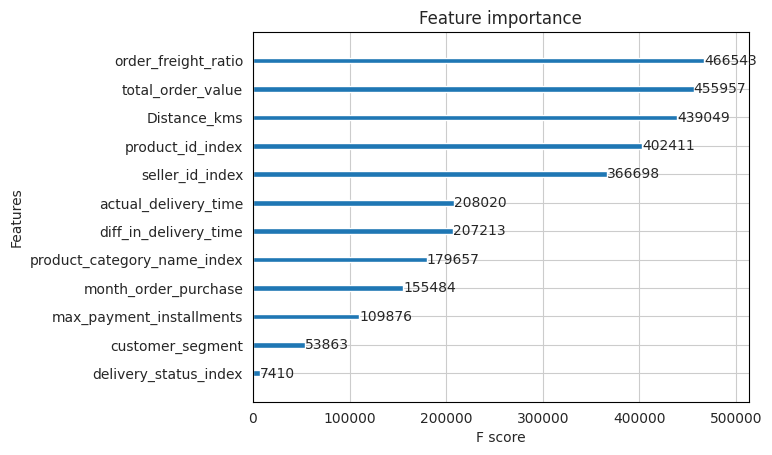

In [378]:
# plot feature importance
from matplotlib import pyplot
from xgboost import plot_importance
plot_importance(xgb)
pyplot.show()

In [436]:
X_train = X_train.drop(['delivery_status_index'], axis=1)
X_test = X_test.drop(['delivery_status_index'], axis=1)

In [437]:
xgb = XGBClassifier(objective= 'multi:softprob', num_classes=5, n_estimators=500, max_depth=25, num_trees=10, subsample=0.5,learning_rate=0.1,colsample_bytree=0.3,random_state=25,
                      n_jobs=-1)
xgb.fit(X_train,y_train)

XGBClassifier(colsample_bytree=0.3, max_depth=25, n_estimators=500, n_jobs=-1,
              num_classes=5, num_trees=10, objective='multi:softprob',
              random_state=25, subsample=0.5)

In [438]:
# Predict
preds = xgb.predict(X_test)

# Score
print ('accuracy score', accuracy_score(y_test, preds))
print('f1 score', f1_score(y_test, preds, average='weighted'))

accuracy score 0.6626191761108113
f1 score 0.6138022990411718


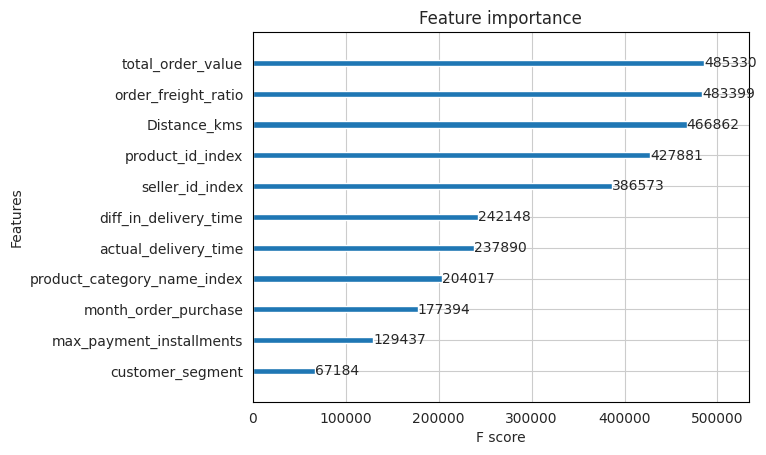

In [439]:
# plot feature importance
from matplotlib import pyplot
from xgboost import plot_importance
plot_importance(xgb)
pyplot.show()

In [440]:
X_train = X_train.drop(['customer_segment'], axis=1)
X_test = X_test.drop(['customer_segment'], axis=1)

In [441]:
xgb = XGBClassifier(objective= 'multi:softprob', num_classes=5, n_estimators=500, max_depth=25, num_trees=10, subsample=0.5,learning_rate=0.1,colsample_bytree=0.3,random_state=25,
                      n_jobs=-1)
xgb.fit(X_train,y_train)

XGBClassifier(colsample_bytree=0.3, max_depth=25, n_estimators=500, n_jobs=-1,
              num_classes=5, num_trees=10, objective='multi:softprob',
              random_state=25, subsample=0.5)

In [442]:
# Predict
preds = xgb.predict(X_test)

# Score
print ('accuracy score', accuracy_score(y_test, preds))
print('f1 score', f1_score(y_test, preds, average='weighted'))

accuracy score 0.6638783953948552
f1 score 0.6155908553657438


### Model 2: Random Forest

**1- Using sklearn** 

In [ ]:
#X_train_pd= X_train_pd.loc[:, ['total_order_value', 'diff_in_delivery_time']]


In [379]:
param_grid = {
    'bootstrap': [True, False],
    'max_depth': [3, 5, 7],
    'max_features': ['sqrt', 'log2', None],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 400],
    'criterion' :['gini', 'entropy', 'log_loss'],
    'random_state' : [18]
    }

In [380]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score

#rf_cv = GridSearchCV(estimator=RandomForestClassifier(), param_grid=param_grid, cv= 5)
#rf_cv.fit(X_train, y_train)

In [ ]:
#rf_cv.best_params_

In [381]:
from sklearn.ensemble import RandomForestClassifier
rf1 = RandomForestClassifier(bootstrap=True, max_depth = 35, min_samples_leaf = 5, min_samples_split = 12, n_estimators = 400,random_state=25,max_features= 'sqrt', criterion= 'entropy',
                           n_jobs=-1).fit(X_train, y_train)



**Feature importance based on mean decrease in impurity**

In [382]:
importances = rf1.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf1.estimators_], axis=0)


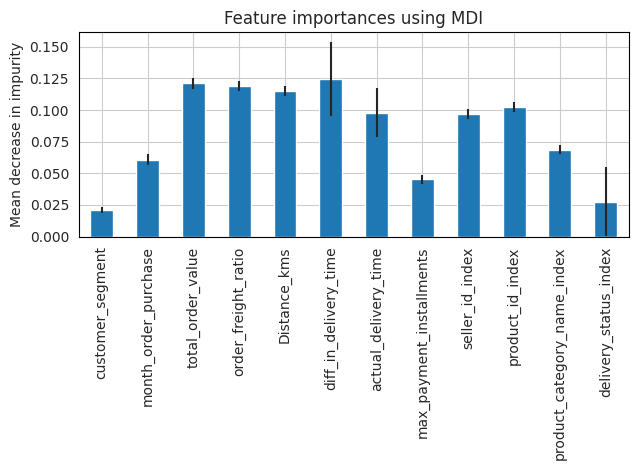

In [383]:
import pandas as pd

forest_importances = pd.Series(importances, index=X_train.columns)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

**Feature importance based on feature permutation**

In [384]:
from sklearn.inspection import permutation_importance

result = permutation_importance(
    rf1, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2
)
forest_importances = pd.Series(result.importances_mean, index=X_train.columns)

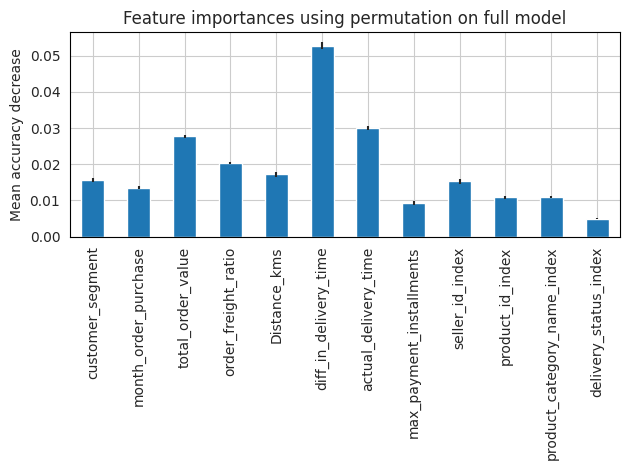

In [385]:
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

In [386]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score

prediction = rf1.predict(X_test)
print('accuracy= ', accuracy_score(y_test, prediction))
print('f1_score= ', f1_score(y_test, prediction, average='weighted'))

accuracy=  0.6357258499730167
f1_score=  0.5372493686663289


In [421]:
X_train.drop(['max_payment_installments'], axis=1, inplace = True)

In [422]:
X_test.drop(['max_payment_installments'], axis=1, inplace = True)

In [423]:
from sklearn.ensemble import RandomForestClassifier
rf2 = RandomForestClassifier(bootstrap=True, max_depth = 35, min_samples_leaf = 5, min_samples_split = 12, n_estimators = 400,random_state=25,max_features= 'sqrt', criterion= 'entropy', n_jobs=-1).fit(X_train, y_train)

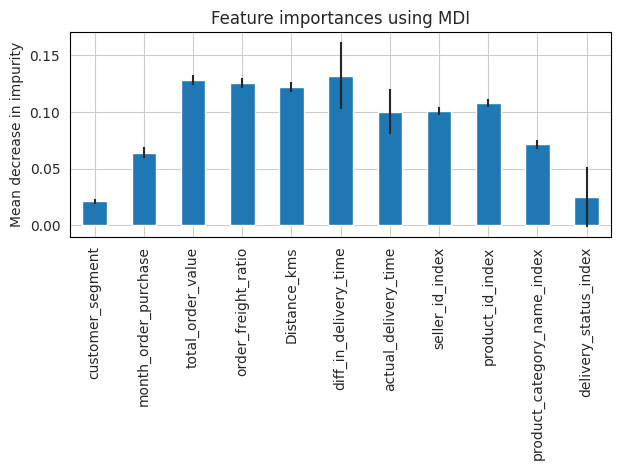

In [424]:
importances = rf2.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf2.estimators_], axis=0)
import pandas as pd

forest_importances = pd.Series(importances, index=X_train.columns)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()


In [425]:
from sklearn.inspection import permutation_importance

result = permutation_importance(
    rf2, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2
)
forest_importances = pd.Series(result.importances_mean, index=X_train.columns)

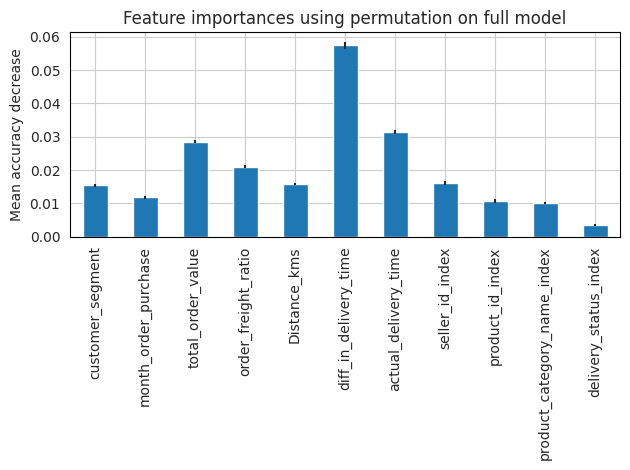

In [426]:
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

In [427]:
prediction = rf2.predict(X_test)
print('accuracy= ', accuracy_score(y_test, prediction))
print('f1_score= ', f1_score(y_test, prediction, average='weighted'))

accuracy=  0.6302842237812556
f1_score=  0.5309442903477548


**2- using spark mllib**

Vector Assembler:

- VectorAssembler is a transformer that combines a given list of columns into a single vector column. It is useful for combining raw features and features generated by different feature transformers into a single feature vector

In [387]:
#from pyspark.ml.feature import VectorAssembler
selectedfeatures =['customer_segment',                
 'month_order_purchase',
 'max_payment_installments_standardized',
 'total_order_value_standardized',
 'order_freight_ratio_standardized',
 'Distance_kms_standardized',
 'diff_in_delivery_time_standardized',
 'actual_delivery_time_standardized',
 'delivery_status_index',
 'weekday_order_purchase_index']
assembler = VectorAssembler(inputCols=selectedfeatures, outputCol='features_vectorized')

Specify Estimator:

In [388]:
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
from pyspark.ml.feature import IndexToString, StringIndexer, VectorIndexer
from pyspark.ml import Pipeline

numFolds = 3
rf = RandomForestClassifier(labelCol="Label", featuresCol="features_vectorized", maxDepth=5, numTrees=10)

evaluator = MulticlassClassificationEvaluator(labelCol='Label', predictionCol='prediction', metricName='weightedFMeasure')
random_forest_pipeline = Pipeline(stages= cat_indexers + num_assemblers + num_scalers + [assembler, rf])

rfparamGrid = (ParamGridBuilder()
               .addGrid(rf.maxDepth, [5, 7])
               .addGrid(rf.numTrees, [10, 15])
               .build())
params_grid = ParamGridBuilder().build()
crossval = CrossValidator(
    estimator=random_forest_pipeline,
    estimatorParamMaps=params_grid,
    evaluator=evaluator,
    numFolds=numFolds)

Train the Model:

In [389]:
Training_dataset.columns

['order_id',
 'customer_segment',
 'seller_id',
 'product_id',
 'product_category_name',
 'payment_type',
 'delivery_status',
 'weekday_order_purchase',
 'month_order_purchase',
 'total_order_value',
 'order_freight_ratio',
 'Distance_kms',
 'diff_in_delivery_time',
 'actual_delivery_time',
 'max_payment_installments',
 'Rating',
 'Label']

In [390]:
random_forest_model = crossval.fit(Training_dataset)

In [391]:
va = random_forest_model.bestModel.stages[-2] 
tree = random_forest_model.bestModel.stages[-1] 

In [392]:
list(zip(va.getInputCols(), tree.featureImportances))

[('customer_segment', 0.029379149614252614),
 ('month_order_purchase', 0.003561960104375886),
 ('max_payment_installments_standardized', 0.0021493754653876115),
 ('total_order_value_standardized', 0.02981257786953313),
 ('order_freight_ratio_standardized', 0.025985213476579238),
 ('Distance_kms_standardized', 0.0050334036580507715),
 ('diff_in_delivery_time_standardized', 0.4978111308871808),
 ('actual_delivery_time_standardized', 0.18510498344015752),
 ('delivery_status_index', 0.21993368114255105),
 ('weekday_order_purchase_index', 0.001228524341931388)]

In [ ]:
fi = pd.DataFrame(list(zip(va.getInputCols(), tree.featureImportances)))
fi.columns = ['features', 'score']
fi.index = fi ['features']
fi.sort_values('score', ascending=False).plot(kind='bar')        

Predict Validation Data:

In [393]:
random_forest_predictions = random_forest_model.transform(Validation_dataset)
random_forest_predictions.show()

+--------------------+----------------+--------------------+--------------------+---------------------+------------+---------------+----------------------+--------------------+------------------+-------------------+------------------+---------------------+--------------------+------------------------+------+-----+---------------+----------------+---------------------------+------------------+---------------------+----------------------------+----------------------------+------------------------------+-----------------------+--------------------------------+-------------------------------+-----------------------------------+------------------------------+--------------------------------+-------------------------+----------------------------------+---------------------------------+-------------------------------------+--------------------+--------------------+--------------------+----------+
|            order_id|customer_segment|           seller_id|          product_id|product_category

In [394]:
random_forest_predictions.select('prediction').distinct().show()

+----------+
|prediction|
+----------+
|       0.0|
|       4.0|
|       3.0|
+----------+



In [395]:
random_forest_predictions.select(
    'Label',
    'prediction'
).where('Label <> prediction').show()

+-----+----------+
|Label|prediction|
+-----+----------+
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       0.0|
+-----+----------+
only showing top 20 rows



In [396]:
random_forest_predictions_DF = random_forest_predictions.toPandas()

In [397]:
random_forest_predictions_DF.loc[random_forest_predictions_DF['prediction'] != random_forest_predictions_DF['Label']]

,order_id,customer_segment,seller_id,product_id,product_category_name,payment_type,delivery_status,weekday_order_purchase,month_order_purchase,total_order_value,...,total_order_value_standardized,order_freight_ratio_standardized,Distance_kms_standardized,diff_in_delivery_time_standardized,actual_delivery_time_standardized,max_payment_installments_standardized,features_vectorized,rawPrediction,probability,prediction
0,0008288aa423d2a3f00fcb17cd7d8719,3,1f50f920176fa81dab994f9023523100,368c6c730842d78016ad823897a372db,ferramentas_jardim,boleto,early,Tue,2,2.105646,...,[5.767785734713826],[1.650886069181665],[4.326866571771666],[-0.7432255357160342],[4.258407380349234],[1.1822992247253519],"[3.0, 2.0, 1.1822992247253519, 5.7677857347138...","[1.9794516928836363, 0.582222528999723, 1.6225...","[0.19794516928836364, 0.05822225289997231, 0.1...",3.0
1,0016dfedd97fc2950e388d2971d718c7,0,a35124e2d763d7ca3fbe3b97d143200f,4089861a1bd4685da70bddd6b4f974f1,ferramentas_jardim,voucher,early,Fri,4,1.854610,...,[5.080145911394036],[2.3032964958202413],[5.117402857377964],[-0.9290319196450427],[5.194007881232662],[3.05619916054673],"[0.0, 4.0, 3.05619916054673, 5.080145911394036...","[1.4365422366289577, 0.552658257306489, 1.6788...","[0.14365422366289576, 0.0552658257306489, 0.16...",3.0
2,001dbc16dc51075e987543d23a0507c7,0,4a3ca9315b744ce9f8e9374361493884,777d2e438a1b645f3aec9bd57e92672c,cama_mesa_banho,credit_card,early,Sat,1,1.948902,...,[5.338430853226307],[1.5998054060788724],[4.55878543627492],[-3.25161171875765],[4.5716993257557785],[1.1822992247253519],"[0.0, 1.0, 1.1822992247253519, 5.3384308532263...","[1.4380695342223646, 0.5080256227185257, 1.606...","[0.14380695342223646, 0.05080256227185257, 0.1...",3.0
10,00b9e0f8f588d0406a3de447eb606970,1,1c129092bf23f28a5930387c980c0dfc,5d90b82ad1fdff812987fa28158b7984,cama_mesa_banho,boleto,late,Mon,1,1.759668,...,[4.820081392324696],[2.2953196265741656],[4.198743092431989],[0.18580638392900856],[5.25729478768984],[1.1822992247253519],"[1.0, 1.0, 1.1822992247253519, 4.8200813923246...","[2.564966607801201, 0.831869698241236, 1.86165...","[0.2564966607801201, 0.0831869698241236, 0.186...",3.0
11,00c826c901ab01b6f598a8f0c9b56b82,1,3d871de0142ce09b7081e2b9d1733cb1,c072e7b87c8413341505d50d8234fbc2,papelaria,credit_card,early,Fri,4,1.972712,...,[5.403651412813449],[1.1696291944134531],[2.815408468646505],[-1.4864510714320684],[4.13882606924216],[1.1822992247253519],"[1.0, 4.0, 1.1822992247253519, 5.4036514128134...","[2.275258088828028, 0.542467782507935, 1.41357...","[0.2275258088828028, 0.054246778250793506, 0.1...",3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13734,ffb9a9cd00c74c11c24aa30b3d78e03b,0,da8622b14eb17ae2831f4ac5b9dab84a,fec565c4e3ad965c73fb1a21bb809257,cama_mesa_banho,credit_card,early,Sat,3,2.783868,...,[7.625569635005229],[0.9956138564664533],[4.4374608814379854],[-1.4864510714320684],[4.6639306723861225],[3.319133547877606],"[0.0, 3.0, 3.319133547877606, 7.62556963500522...","[1.872216860046655, 0.5923187566700517, 1.5096...","[0.18722168600466552, 0.05923187566700518, 0.1...",3.0
13735,ffca67b9419980488c476f7f7f7bc070,0,6cd68b3ed6d59aaa9fece558ad360c0a,446295cf6f689d4db477145815362608,papelaria,boleto,early,Fri,3,1.959995,...,[5.368817005885317],[1.273193249172637],[4.496767844138388],[-1.3935478794675642],[3.1399386619015544],[1.1822992247253519],"[0.0, 3.0, 1.1822992247253519, 5.3688170058853...","[1.0901450921076488, 0.44173960257346967, 1.24...","[0.10901450921076487, 0.04417396025734697, 0.1...",4.0
13736,ffd543c2b60842e148a86870dc60e212,3,9c0e69c7bf2619675bbadf47b43f655a,b7d94dc0640c7025dc8e3b46b52d8239,informatica_acessorios,boleto,early,Thu,1,2.572999,...,[7.04795860662084],[0.4459911535828413],[3.292626184718827],[-1.8580638392900855],[4.258407380349234],[1.1822992247253519],"[3.0, 1.0, 1.1822992247253519, 7.0479586066208...","[2.119117555945336, 0.5415095986249574, 1.4846...","[0.21191175559453362, 0.05415095986249574, 0.

Check the Accuracy:

In [398]:
print('Validation weightedFMeasure = %g' % (evaluator.evaluate(random_forest_predictions)))

Validation weightedFMeasure = 0.355184


In [399]:
eval_accuracy = MulticlassClassificationEvaluator(labelCol="Label", predictionCol="prediction", metricName="accuracy")
eval_precision = MulticlassClassificationEvaluator(labelCol="Label", predictionCol="prediction", metricName="precisionByLabel")
eval_recall = MulticlassClassificationEvaluator(labelCol="Label", predictionCol="prediction", metricName="recallByLabel")
eval_f1 = MulticlassClassificationEvaluator(labelCol="Label", predictionCol="prediction", metricName="f1")

accuracy = eval_accuracy.evaluate(random_forest_predictions)
precision = eval_precision.evaluate(random_forest_predictions)
recall = eval_recall.evaluate(random_forest_predictions)
f1score = eval_f1.evaluate(random_forest_predictions)

In [400]:
print('Validation accuracy = %g' % (accuracy))
print('Validation precision = %g' % (precision))
print('Validation recall= %g' % (recall))
print('Validation f1score = %g' % (f1score))

Validation accuracy = 0.395516
Validation precision = 0.658136
Validation recall= 0.370658
Validation f1score = 0.355184


Compute Confusion Matrix:

In [ ]:
y_true = random_forest_predictions.select(['Label']).collect()
y_pred = random_forest_predictions.select(['prediction']).collect()
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_true, y_pred))
cm = confusion_matrix(y_true,y_pred)
plt.figure(figsize=(10,6))
fx=sns.heatmap(confusion_matrix(y_true,y_pred), annot=True, fmt=".2f",cmap="GnBu")
fx.set_title('Confusion Matrix \n');
fx.set_xlabel('\n Predicted Values\n')
fx.set_ylabel('Actual Values\n');
fx.xaxis.set_ticklabels(['Rating 1','Rating 2','Rating 3', 'Rating 4', 'Rating 5'])
fx.yaxis.set_ticklabels(['Rating 1','Rating 2','Rating 3', 'Rating 4', 'Rating 5'])
plt.show()

 Predict - Random Forest:

In [401]:
random_forest_test_predictions = random_forest_model.transform(Test_dataset)

Prepare Dataset:

For every order in the dataset, submission file should contain two columns: order_id and Rating.

In [402]:
random_forest_submission = random_forest_test_predictions.select('order_id', 'prediction')
random_forest_submission.show()

+--------------------+----------+
|            order_id|prediction|
+--------------------+----------+
|00143d0f86d6fbd9f...|       4.0|
|00143d0f86d6fbd9f...|       4.0|
|00143d0f86d6fbd9f...|       4.0|
|00335b686d693c7d7...|       0.0|
|00a77f9cc25b05b20...|       3.0|
|00aa423621f35a9ca...|       4.0|
|016754282c7690ebd...|       4.0|
|01efe0209a92b2f21...|       3.0|
|02190241f7190a1f3...|       3.0|
|02190241f7190a1f3...|       3.0|
|021f26893462ec6a6...|       3.0|
|023faf5fac58639f7...|       3.0|
|028e1ce5e085cc781...|       4.0|
|02c8a77069dc7fd1c...|       4.0|
|03343a88c4d669e63...|       3.0|
|038345c4a9d21c171...|       0.0|
|03a3628434dd670dd...|       3.0|
|03a3628434dd670dd...|       3.0|
|046cf9d36030cfd64...|       3.0|
|046cf9d36030cfd64...|       3.0|
+--------------------+----------+
only showing top 20 rows



### Model 3: KNN Classifier

In [403]:
TrainingDataset_transformed = pipeline_encoders.fit(TrainingDataset).transform(TrainingDataset)

In [404]:
X_train = TrainingDataset_transformed.select(*selected_cols)

In [405]:
X_train_pd= X_train.toPandas()

In [453]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
numerical = ['total_order_value','order_freight_ratio','Distance_kms','diff_in_delivery_time', 'actual_delivery_time', 'max_payment_installments']
X_train_pd.loc[:,numerical] = scaler.fit_transform(X_train_pd.loc[:,numerical])
X_train_pd.head()

,customer_segment,month_order_purchase,total_order_value,order_freight_ratio,Distance_kms,diff_in_delivery_time,actual_delivery_time,max_payment_installments,seller_id_index,product_id_index,product_category_name_index,delivery_status_index,Label
0,0,9,-0.595563,-0.229120,-0.040100,0.306082,-0.546632,-0.172017,148.0,1978.0,11.0,0.0,4
1,2,4,0.936243,-1.071749,0.425250,0.905639,0.701954,0.320283,159.0,30815.0,17.0,0.0,3
2,3,1,0.719311,-1.027060,-0.013478,-0.193549,-0.351530,1.014142,1070.0,8287.0,3.0,0.0,4
3,1,8,-1.807455,2.219071,-0.037870,0.605861,-0.767820,-0.172017,997.0,11518.0,12.0,0.0,3
4,0,2,0.725767,-1.020813,0.503381,-0.393401,1.405753,0.320283,692.0,1409.0,8.0,0.0,4


In [454]:
import pandas as pd
import numpy as np
from imblearn.over_sampling import SMOTE
from collections import Counter

X= X_train_pd.drop('Label', axis=1)
y= X_train_pd['Label']
counter = Counter(y)
print(counter)

#oversample = SMOTE()
#X, y = oversample.fit_resample(X, y)
#counter = Counter(y)
#print(counter)

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

Counter({4: 63041, 3: 21222, 0: 13689, 2: 9381, 1: 3843})


In [455]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.neighbors import KNeighborsClassifier

#Create KNN Classifier
knn = KNeighborsClassifier(n_neighbors=5)

#Train the model using the training sets
knn.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = knn.predict(X_test)

In [456]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print('f1_score= ', f1_score(y_test, prediction, average='weighted'))
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

f1_score=  0.5309442903477548
Accuracy: 0.48650836481381543


Re-generating Model for K=8


In [457]:
from sklearn.neighbors import KNeighborsClassifier

#Create KNN Classifier
knn = KNeighborsClassifier(n_neighbors=8)

#Train the model using the training sets
knn.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = knn.predict(X_test)

In [458]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print('f1_score= ', f1_score(y_test, y_pred, average='weighted'))
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

f1_score=  0.45706250806316606
Accuracy: 0.5146159381183666


### Model 4: Naive Bayes




Vector Assembler:

- VectorAssembler is a transformer that combines a given list of columns into a single vector column. It is useful for combining raw features and features generated by different feature transformers into a single feature vector

In [443]:
from pyspark.ml.feature import VectorAssembler
selectedfeatures =['customer_segment_encoded',
 'month_order_purchase',
 'max_payment_installments',
 'total_order_value',
 'order_freight_ratio',
 'Distance_kms',
 'diff_in_delivery_time',
 'actual_delivery_time',
 'delivery_status_encoded']

nb_assembler = VectorAssembler(inputCols=selectedfeatures, outputCol='features_vectorized')

MinMax Scaler:

- Run MinMaxScaler on all features.

In [444]:
from pyspark.ml.feature import MinMaxScaler
minmax_scaler = MinMaxScaler(inputCol= 'features_vectorized', outputCol= 'features')

3.2.2- Specify Estimator and Create a pipeline:


The pipeline contains the array of StringIndexers, VectorAssembler and MinMaxScaler

In [445]:
from pyspark.ml.classification import NaiveBayes
from pyspark.ml.evaluation import MulticlassClassificationEvaluator


# create the trainer and set its parameters
nb = NaiveBayes(smoothing=1.0, modelType="multinomial", labelCol="Label", featuresCol="features")

evaluator = MulticlassClassificationEvaluator(labelCol='Label', predictionCol='prediction', metricName='weightedFMeasure')

# create the pipeline
nb_pipeline = Pipeline(
    stages= cat_indexers + cat_encoders_1 + cat_encoders_2  + [nb_assembler, minmax_scaler, nb]
)

3.2.3- Train the Model:

In [446]:
# train the model
nb_model = nb_pipeline.fit(Training_dataset)

3.2.4- Predict Validation data

In [447]:
nb_predictions = nb_model.transform(Validation_dataset)
#nb_predictions.select('prediction').distinct().show()

In [448]:
nb_predictions.show(5, True)


+--------------------+----------------+--------------------+--------------------+---------------------+------------+---------------+----------------------+--------------------+------------------+-------------------+------------------+---------------------+--------------------+------------------------+------+-----+---------------+----------------+---------------------------+------------------+---------------------+----------------------------+-------------------+--------------------+-----------------------------+--------------------+-----------------------+------------------------------+------------------------+----------------------------+--------------------+--------------------+--------------------+--------------------+----------+
|            order_id|customer_segment|           seller_id|          product_id|product_category_name|payment_type|delivery_status|weekday_order_purchase|month_order_purchase| total_order_value|order_freight_ratio|      Distance_kms|diff_in_delivery_time|a

In [449]:
nb_predictions.select(
    'Label',
    'prediction'
).where('Label <> prediction').show()

+-----+----------+
|Label|prediction|
+-----+----------+
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       0.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       0.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       3.0|
|    4|       0.0|
|    4|       3.0|
+-----+----------+
only showing top 20 rows



3.2.5- Check the Accuracy:

In [450]:
weightedFMeasure= evaluator.evaluate(nb_predictions)

In [452]:
print('f1 score= ', weightedFMeasure)
print('Validation Accuracy= ', accuracy)

f1 score=  0.32097367335677834
Validation Accuracy=  0.3103573768105393


### Model 5: Logistic Regression

Vector Assembler:

- VectorAssembler is a transformer that combines a given list of columns into a single vector column. It is useful for combining raw features and features generated by different feature transformers into a single feature vector

In [412]:
from pyspark.ml.feature import VectorAssembler
selectedfeatures =['customer_segment_encoded',
 'max_payment_installments',
 'total_order_value',
 'order_freight_ratio',
 'Distance_kms',
 'diff_in_delivery_time',
 'actual_delivery_time']

lr_assembler = VectorAssembler(inputCols=selectedfeatures, outputCol='features_vectorized')

Standard Scaler:

- Run StandardScaler on all features as it won't affect one hot encoded columns, and keep features one dimensional.

In [413]:
from pyspark.ml.feature import StandardScaler
standardScaler = StandardScaler(inputCol= 'features_vectorized', outputCol= 'features')

Specify Estimator and Create a pipeline:


The pipeline contains the array of StringIndexers, OneHotEncoders, VectorAssembler and StandardScaler

In [414]:
from pyspark.ml.classification import LogisticRegression,  OneVsRest
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml import Pipeline


lr = LogisticRegression(maxIter=10, regParam=0.3, elasticNetParam=0.8, labelCol="Label", featuresCol="features")
ovr = OneVsRest(classifier=lr)

evaluator = MulticlassClassificationEvaluator(labelCol='Label', predictionCol='prediction', metricName='weightedFMeasure')

logistic_regression_pipeline = Pipeline(
    stages= cat_indexers + cat_encoders_1 + cat_encoders_2 + [lr_assembler, standardScaler, ovr]
)

Train the Model:

In [415]:
logistic_regression_model = logistic_regression_pipeline.fit(Training_dataset)

Predict Validation data:

In [416]:
logistic_regression_predictions = logistic_regression_model.transform(Validation_dataset)
logistic_regression_predictions.show()

+--------------------+----------------+--------------------+--------------------+---------------------+------------+---------------+----------------------+--------------------+------------------+-------------------+------------------+---------------------+--------------------+------------------------+------+-----+---------------+----------------+---------------------------+------------------+---------------------+----------------------------+-------------------+--------------------+-----------------------------+--------------------+-----------------------+------------------------------+------------------------+----------------------------+--------------------+--------------------+--------------------+----------+
|            order_id|customer_segment|           seller_id|          product_id|product_category_name|payment_type|delivery_status|weekday_order_purchase|month_order_purchase| total_order_value|order_freight_ratio|      Distance_kms|diff_in_delivery_time|actual_delivery_time|m

In [417]:
logistic_regression_predictions.select('prediction').distinct().show()

+----------+
|prediction|
+----------+
|       3.0|
+----------+



In [ ]:
logistic_regression_predictions.select(
    'Label',
    'prediction'
).where('Label <> prediction').show()

Check the Accuracy:

In [419]:
eval_accuracy = MulticlassClassificationEvaluator(labelCol="Label", predictionCol="prediction", metricName="accuracy")
eval_precision = MulticlassClassificationEvaluator(labelCol="Label", predictionCol="prediction", metricName="precisionByLabel")
eval_recall = MulticlassClassificationEvaluator(labelCol="Label", predictionCol="prediction", metricName="recallByLabel")
eval_f1 = MulticlassClassificationEvaluator(labelCol="Label", predictionCol="prediction", metricName="f1")


In [418]:
weightedFMeasure = evaluator.evaluate(logistic_regression_predictions)
accuracy = eval_accuracy.evaluate(logistic_regression_predictions)
precision = eval_precision.evaluate(logistic_regression_predictions)
recall = eval_recall.evaluate(logistic_regression_predictions)
f1score = evaluator.evaluate(logistic_regression_predictions)

In [420]:
print('Validation weightedFMeasure= ', weightedFMeasure)
print('Validation Accuracy= ', accuracy)
print('f1 score = ', f1score)

Validation weightedFMeasure=  0.14701592564796306
Validation Accuracy=  0.3103573768105393
f1 score =  0.14701592564796306
